In [1]:
import pickle
from glob import glob

import cv2
import numpy as np
from scipy.misc import imresize, imread
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [2]:
# calculate the calibration of the camera
def get_calibration(path, shape):
    """ using all test images to generate caibration matrix
        @param:
            path: relative path to calibration images
            shape: tuple of two, the number of crossover in the image
        @output:
            calibration: a dictionary contains all information needed for calibration
    """
    obj_points = []
    img_points = []
    files = os.listdir(path)
    success_count = 0
    
    objp = np.zeros((shape[0]*shape[1], 3), np.float32)
    objp[:, :2] = np.mgrid[0:shape[0], 0:shape[1]].T.reshape(-1, 2)
    # read all images for calculation
    for file in files:
        img = cv2.imread(path+file)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, shape ,None)
        if ret:
            obj_points.append(objp)
            img_points.append(corners)
            success_count += 1
    print("Total image processed(contains chessboard) {}".format(success_count))
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, img.shape[0:2], None, None)
    calibration = {"objpoints": obj_points, "imgpoints": img_points, "mtx":mtx, "dist":dist}
    return calibration

In [6]:
def plot(img, title='',cm=None):
    """ plot image with title
    """
    plt.imshow(img,cmap=cm)
    plt.title(title)
    plt.show()

In [7]:
class Calibrator(object):
    def __init__(self, path, shape, load):
        # load calibration matrix
        if load:
            with open("calibration.dat", "rb") as f:
                self.calib = pickle.load(f)
                print("Calibration load successfully!")
        # calculate calibration matrix
        else:
            self.calib = get_calibration(path, shape)
            print("Calibration calculate and write successfully!")
            with open("calibration.dat", 'wb') as f:
                pickle.dump(self.calib, file=f)
    # undistorted images
    def undistorted(self, image):
        """ undistorted image using calculated calibration matrix
        @param:
            image: input colored images 
        @output:
            dst: undistorted colored image    
        """
        dst= cv2.undistort(image, self.calib["mtx"], self.calib["dist"], None, self.calib["mtx"])
        return dst

In [8]:
cliber = Calibrator("../camera_cal/", (9,6), False)

Total image processed(contains chessboard) 17
Calibration calculate and write successfully!


In [9]:
def plot_dual(img1, img2, title1='', title2='', figsize=(24, 9), cm1 = None,cm2 = None):
    """ Plot two images side by side.
        @param:
            img1: first image             img2: second image
            title1: title for first image title2: title for second image 
            figsize=: tuple of 2, size of each figure
            cm1: color map for first image cm2: color map for second image
    """
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    f.tight_layout()
    ax1.imshow(img1,cmap=cm1)
    ax1.set_title(title1, fontsize=25)
    ax2.imshow(img2,cmap=cm2)
    ax2.set_title(title2, fontsize=25)
    plt.show()

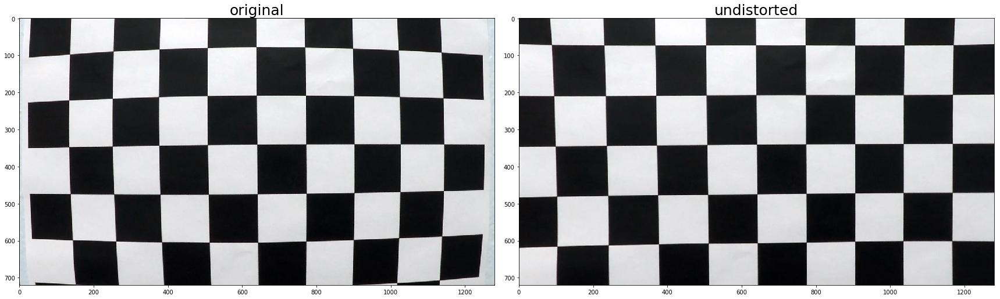

In [11]:
test_images = os.listdir("../camera_cal/")
img1 = cv2.imread("../camera_cal/"+test_images[0])
# print(img1)
img1_un = cliber.undistorted(img1)
plot_dual(img1, img1_un, "original","undistorted")

In [12]:
def test_undistorted(image_name):
    """ test the calibration procedure
        @param:
            image_name: image file name
        @ouput:
            corresponding undistorted image
    """
    img = mpimg.imread(image_name)
    print(img.shape)
    img_un = cliber.undistorted(img)
    plot_dual(img, img_un, "original","undistorted")
    return img_un

(720, 1280, 3)


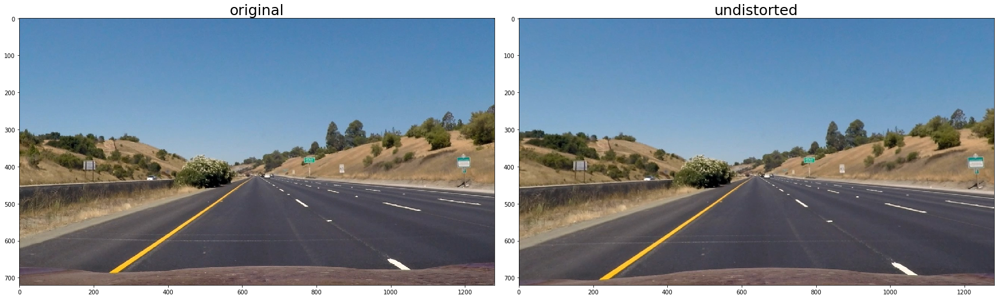

In [13]:
img = test_undistorted("../test_images/straight_lines1.jpg")

In [14]:
class perspective(object):
    """ perpective transformation
    """
    def __init__(self):
        self.img_size = (1280, 720)
        # source 4 locations
        self.src = np.float32([[220, 720],[580, 460],[710, 460],[1100, 720]])
        # margin size
        self.offset = 200
        # 4 destination points
        self.dst = np.float32([[self.src[0][0]+self.offset, 720],[self.src[0][0]+self.offset, 0],[self.src[-1][0]-self.offset, 0],[self.src[-1][0]-self.offset, 720]])
        # transform matrix
        self.M = cv2.getPerspectiveTransform(self.src, self.dst)
        # inverse transform matrix
        self.MV = cv2.getPerspectiveTransform(self.dst, self.src)
        self.img = np.zeros(self.img_size)
    def warped(self, image, show=False):
        """ perspective transformation for image
            @param:
                image: image to transform
                show: whether show visualization
            @output:
                transformed image
        """
        if show:
            # draw lines on image
            image = cv2.line(image, (self.src[0][0], self.src[0][1]), (self.src[1][0], self.src[1][1]),  (0,0,255), thickness=6)
            image = cv2.line(image, (self.src[-1][0], self.src[-1][1]), (self.src[-2][0], self.src[-2][1]),  (0,0,255), thickness=6)
            image = cv2.line(image, (self.src[1][0], self.src[1][1]), (self.src[-2][0], self.src[-2][1]),  (0,0,255), thickness=3)
        warped_img = cv2.warpPerspective(image, self.M, self.img_size)
        self.img = image
        if show:
            plot_dual(image, warped_img, 'threshed image','transformed image', cm1='gray',cm2='gray')
        return warped_img
    
    def unwarped(self, lanes):
        """ inverse perspective transformation
            @param: 
                lanes: image contains lanes
            @outout:
                inversed images
        """
        # Warp lane boundaries back onto original image
        lane_lines = cv2.warpPerspective(lanes, self.MV, self.img_size)
        return lane_lines

(720, 1280, 3)


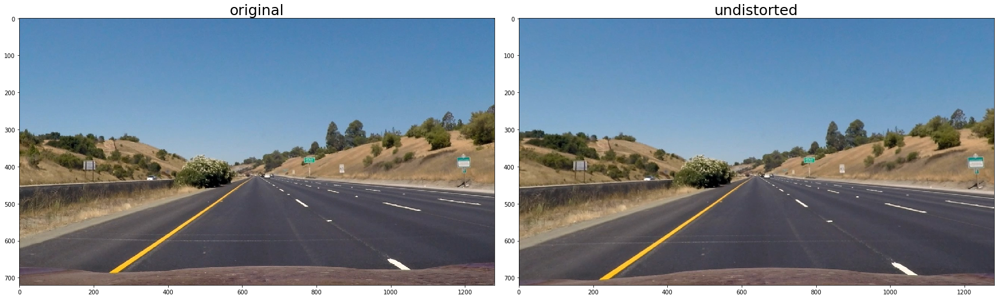

In [17]:
img = test_undistorted("../test_images/straight_lines1.jpg")
pers = perspective()

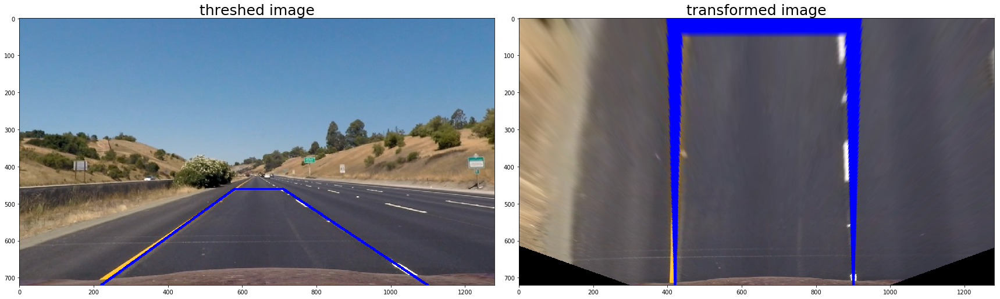

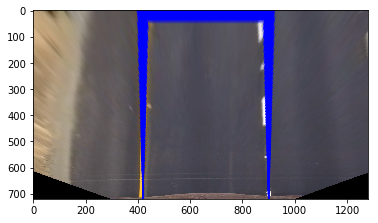

In [18]:
img = pers.warped(img, show=True)
plt.imshow(img)
plt.show()

In [19]:
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255), show=False):
    """ x or y directional gradient
        @params:
            img: image  orient: 'x' for gradient in x direction 'y' for gradient in y direction
            sobel_kernel: kernel size  thresh: threshhold for gradient filter show: visualization flag
        @output:
            binary image after threshold
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if orient == 'x':
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
        abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
        scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    else:
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1) # Take the derivative in y
        abs_sobely = np.absolute(sobely) # Absolute x derivative to accentuate lines away from vertical
        scaled_sobel = np.uint8(255*abs_sobely/np.max(abs_sobely))
    # Apply threshold
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    if show:
        plot_dual(img, sxbinary,'Original image','Sobel {} gradient threshold'.format(orient),cm2='gray')
    return sxbinary

def mag_thresh(img, sobel_kernel=3, thresh=(0, 255), show=False):
    """ Calculate gradient magnitude
        @params:
            img: image  sobel_kernel: kernel size  
            thresh: threshhold for gradient filter show: visualization flag
        @output:
            binary image after threshold
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    mag_sobel = np.sqrt(sobelx**2+sobely**2)
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    mag_binary = np.zeros_like(mag_sobel)
    mag_binary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    if show:
        plot_dual(img, mag_binary,'Original image','Gradient magnitute threshold',cm2='gray')
    return mag_binary

def dir_threshold(img, sobel_kernel=9, thresh=(0, np.pi/2), show=False):
    """ Calculate direction of gradient
        @params:
            img: image  sobel_kernel: kernel size  
            thresh: threshhold for gradient filter show: visualization flag
        @output:
            binary image after threshold
    """
    # Apply threshold
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    direct = np.arctan2(np.abs(sobely), np.abs(sobelx))
    dir_binary = np.zeros_like(direct)
    dir_binary[(direct>=thresh[0])&(direct<=thresh[1])] = 1
    if show:
        plot_dual(img, dir_binary,'Original image','Gradient direction threshold',cm2='gray')
    return dir_binary


def hls_select(img, thresh=(0, 255), show=False):
    """ Calculate hls threshold for s channel 
        @params:
            img: image show: visualization flag
            thresh: threshhold for gradient filter 
        @output:
            binary image after threshold
    """
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS) # transform to hls 
    s_channel = hls[:,:,2] # extract s channel
    binary = np.zeros_like(s_channel)
    binary[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    if show:
        plot_dual(img, binary,'Original image','HLS threshold',cm2='gray')
    return binary

def rgb_select(img, thresh=(0, 255), show=False):
    """ Calculate hls threshold for color image
        @params:
            img: image show: visualization flag
            thresh: threshhold for gradient filter 
        @output:
            binary image after threshold
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    binary = np.zeros_like(gray)
    binary[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    if show:
        plot_dual(img, binary,'Original image','RGB threshold',cm2='gray')
    return binary

def combined_three(threshed_images, show=False):
    """ Calculate combined binary image
        @params:
            threshed_iamges: 3 binary images
            show: visualization flag
        @output:
            binary image after threshold
    """    
    combined_binary = np.zeros_like(threshed_images[0])
    combined_binary[(threshed_images[0] == 1) |((threshed_images[1] == 1)|(threshed_images[2] == 1))] = 1
    if show:
        plot(combined_binary,cm='gray')
    return combined_binary

def yellow_select(img, thresh=(0, 255), show=False):
    """ Calculate yellow threshold for color image
        @params:
            img: image show: visualization flag
            thresh: threshhold for color filter 
            show: visualization flag
        @output:
            binary image after threshold
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # better to use hsv to extract yellow object from color image
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    binary = np.zeros_like(gray)
    binary[(hsv[:,:,0] > 10) &  (hsv[:,:,1] > 100) & (hsv[:,:,2] > 100) & (hsv[:,:,0] < 40) & (hsv[:,:,1] < 255) & (hsv[:,:,2] < 255)] = 1
    if show:
        plot_dual(img, binary,'Original image','RGB threshold',cm2='gray')
    return binary  

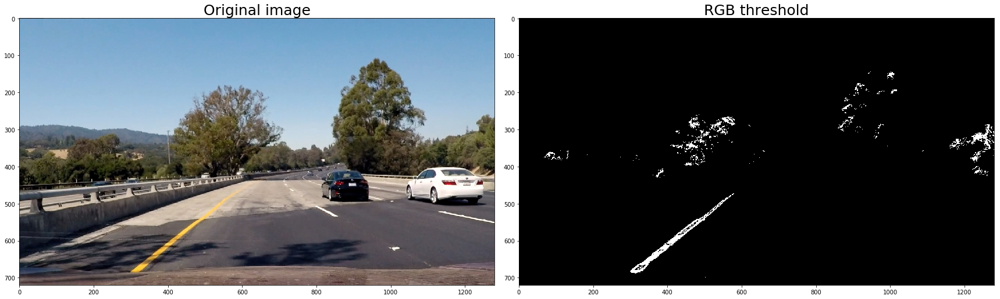

In [21]:
img = mpimg.imread("../test_images/test4.jpg")
yellow = yellow_select(img, thresh=(20,255),show=True)

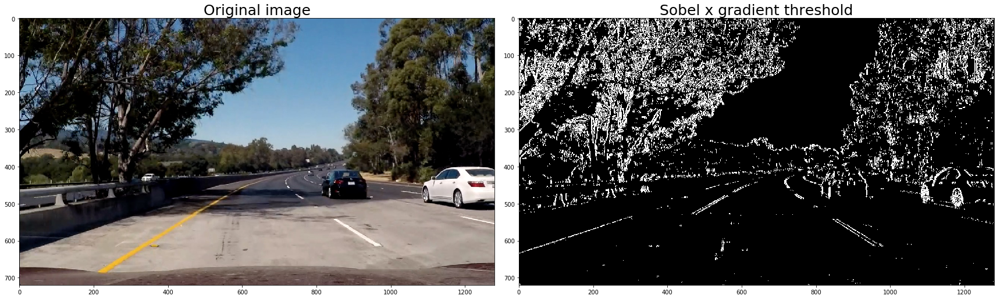

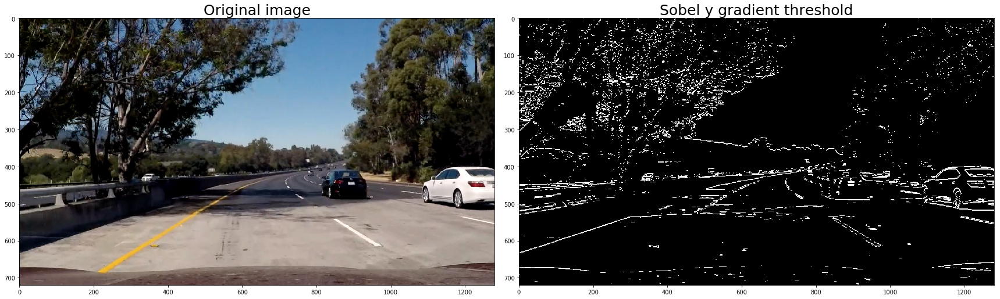

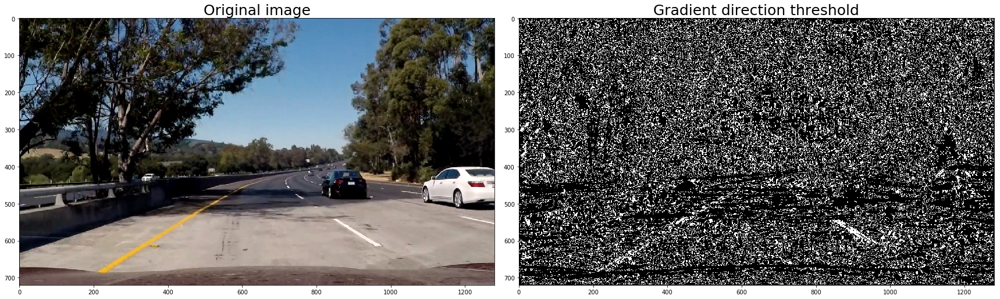

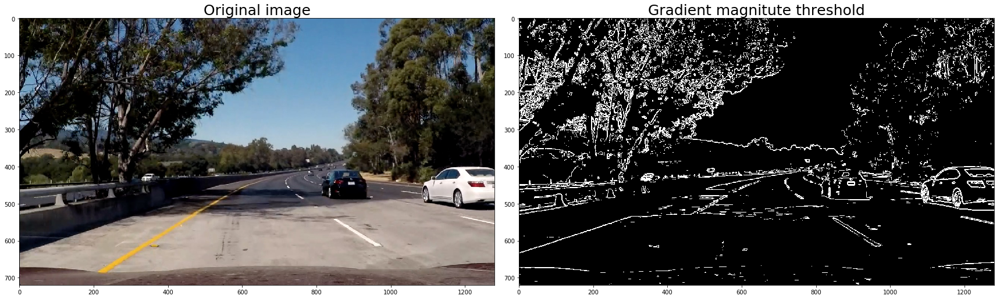

In [23]:
img = mpimg.imread("../test_images/test5.jpg")
x_thresh = abs_sobel_thresh(img, thresh=(20,255),show=True)
y_thresh = abs_sobel_thresh(img, orient='y', thresh=(40,255),show=True)
dir_thresh = dir_threshold(img, thresh=(0.70,1.13),show=True)
mag_thresh_img = mag_thresh(img, thresh=(40,255),show=True)
# yuv = img 
#cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
# yellow = yellow_select(img, (10,200), show=True)
# plt.imshow(yuv[:,:,0], cmap='gray')
# plt.show()
# plt.imshow(yuv[:,:,1], cmap='gray')
# plt.show()
# plt.imshow(yuv[:,:,2], cmap='gray')
# plt.show()
# sobel = abs_sobel_thresh(img, orient='x', thresh=(30,200), show = True)
# sobel = abs_sobel_thresh(img, orient='y', thresh=(80,100), show = True)
# mag = mag_thresh(img, thresh=(50,250), show=True)

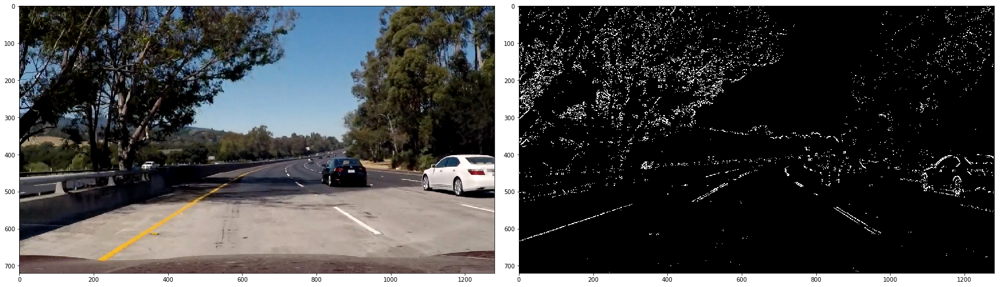

In [25]:
combined = np.zeros_like(mag_thresh_img)
combined[((x_thresh == 1) & (y_thresh == 1)) | ((mag_thresh_img == 1) & (dir_thresh == 1))] = 1
plot_dual(img, combined, cm2='gray')

In [26]:
# combined_binary = np.zeros_like(direct)
# combined_binary[(direct==1) & (sobel==1)] = 1
# plot_dual(img, combined_binary,cm2='gray')

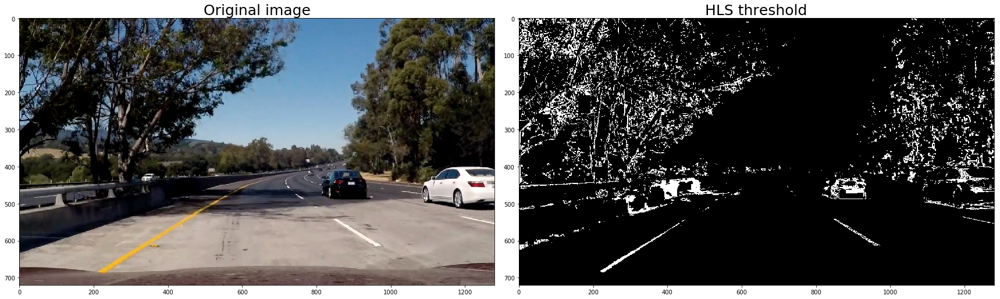

In [27]:
hls = hls_select(img, thresh=(200,255),show=True)

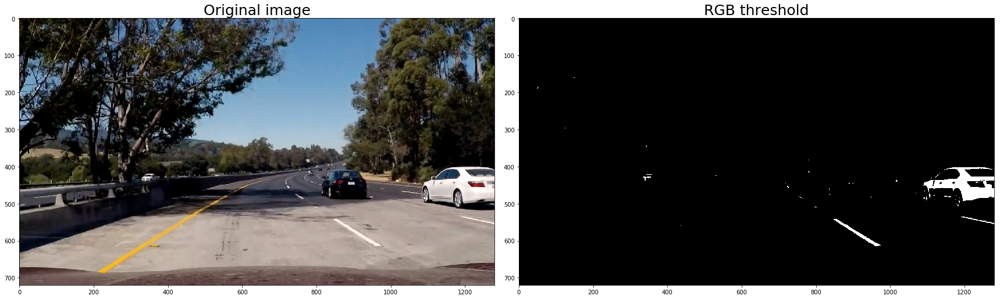

In [28]:
rgb = rgb_select(img, thresh=(210,255), show=True)

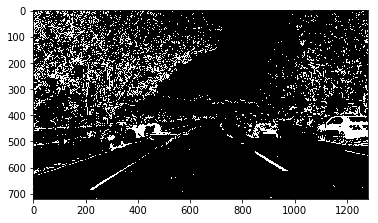

In [29]:
com = combined_three([rgb, hls, combined], show=True)

In [30]:
def thresh(img, show=False):
    """ final threshold bianry selector for line selection
        @param:
            img: image
        @output:
            combined binary image
    """
    hls = hls_select(img, thresh=(90,255))
    rgb = rgb_select(img, thresh=(210,255))
    direct = dir_threshold(img,  thresh=(0.7,1.3))
    sobel = abs_sobel_thresh(img, orient='x', thresh=(150,200))
    yellow = yellow_select(img, thresh=(20,255),show=False)
    combined_binary = np.zeros_like(direct)
    combined_binary[((hls==1)&(yellow==1)) | (rgb==1)] = 1
    if show:
        plot_dual(img, combined_binary, 'original image','threholded image',cm2='gray')
    return combined_binary

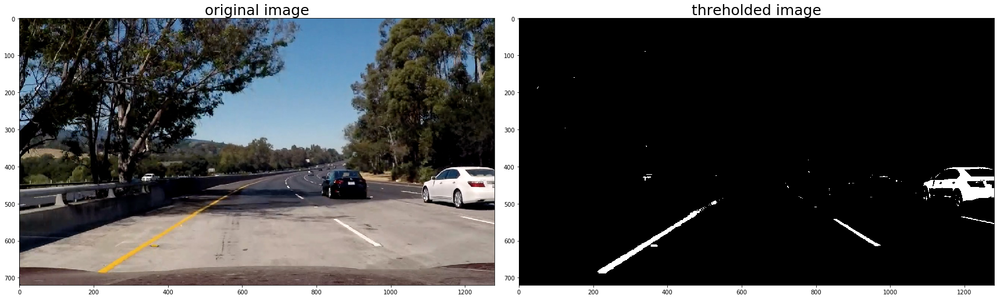

In [31]:
# img = test_undistorted("./test_images/test2.jpg")
thres_img = thresh(img, show=True)
pers = perspective()
new_img = pers.warped(thres_img)

In [32]:
nonzero = new_img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
binary_warped = new_img

In [33]:
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

/Users/xiaowang/anaconda3/envs/carnd-term1/lib/python3.5/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


In [34]:
# Choose the number of sliding windows
nwindows = 10
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(255,25,255), 4) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(255,25,255), 3) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

In [35]:
# plot(new_img, "warped thresh image",cm='gray')

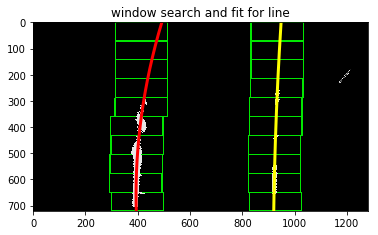

In [36]:
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [25, 25, 25]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [25, 25, 25]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='red', linewidth=3)
plt.plot(right_fitx, ploty, color='yellow',linewidth=3)
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.title("window search and fit for line")
plt.show()

In [37]:
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]


In [38]:
# Create an image to draw on and an image to show the selection window
def draw_line(binary_warped):
    """ help function to visualize
        @param:
            binary image
    """
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [25, 25, 25]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [25, 25, 25]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.title("left and right line")
    plt.show()

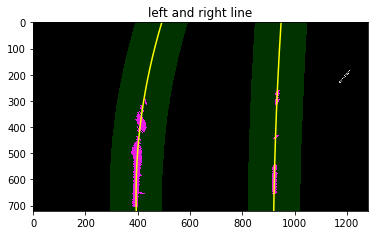

In [39]:
draw_line(new_img)

In [40]:
def line_area(empty_mask, left_fit, right_fit, start_y=0, end_y =720):
    """ draw area between fitted lines
        @param:
            empty_mask: empty image  left_fit: left fitted line
            right_fit: right fitted line 
        @output:
            image mask with area between two lines highlighted
    """
    mask = empty_mask
    for y in range(start_y, end_y):
        left = evaluate_poly(left_fit, y)
        right = evaluate_poly(right_fit, y)
        mask[y][int(left):int(right)] = 1
    return mask


def evaluate_poly(fit, yvar):
    """ output predicted x value
        @param:
            fit: fitted poly
            yvar: y_value
        @output:
            predicted x value
    """
    output = fit[0]*yvar**2 + fit[1]*yvar + fit[2]
    return output

In [41]:
empty_mask = np.zeros((720, 1280))
color_mask = cv2.cvtColor(empty_mask.astype(np.uint8), cv2.COLOR_GRAY2RGB)

In [42]:
area = line_area(empty_mask, left_fit, right_fit)

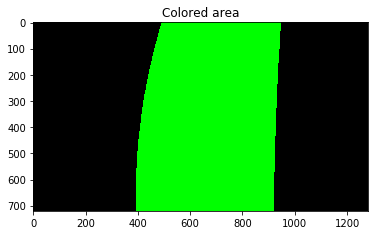

In [43]:
color_mask[area == 1] = [0,255,0]
plt.imshow(color_mask)
plt.title('Colored area')
plt.show()

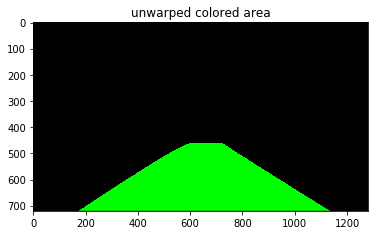

In [44]:
lines = pers.unwarped(color_mask)
plt.imshow(lines)
plt.title("unwarped colored area")
plt.show()

In [45]:
# # bird = cv2.cvtColor(new_img.astype(np.uint8), cv2.COLOR_GRAY2RGB)
# output = 0.8*img+0.3*lines
# output.shape

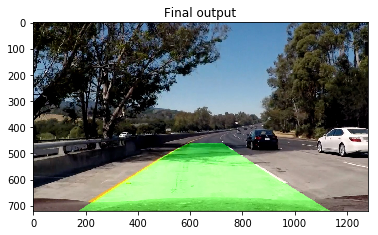

In [46]:
combined_img = cv2.addWeighted(img, 1, lines, 0.5, 0)
plt.imshow(combined_img)
plt.title("Final output")
plt.show()

In [47]:
def histogram_search(binary_warped):
    """ search for line points using histogram search
        @param:
            binary_warped: binary warped image 
        @output:
            leftx, lefty: points position for left line
            rightx, righty: points position for right line
    """
    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(255,25,255), 4) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(255,25,255), 3) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    # Fit a second order polynomial to each
#     left_fit = np.polyfit(lefty, leftx, 2)
#     right_fit = np.polyfit(righty, rightx, 2)
    return leftx, lefty, rightx, righty

In [48]:
def poly_search(binary_warped, left_fit, right_fit):
    """ search for line points using predefined line fit
        @param:
            binary_warped: binary warped image 
            left_fit, right_fit: left and right line fit
        @output:
            leftx, lefty: points position for left line
            rightx, righty: points position for right line
    """
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    # narrow search region
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
#   Fit a second order polynomial to each
#     left_fit = np.polyfit(lefty, leftx, 2)
#     right_fit = np.polyfit(righty, rightx, 2)
    return leftx, lefty, rightx, righty

In [49]:
class Line(object):
    """ Line class contains history information
    """
    def __init__(self, n_frames=1, x=None, y=None):
        """ @param:
                n_frames: number of frame to remember
                x, y: x and y pos for line
        """
        # Frame memory
        self.n_frames = n_frames
        # was the line detected in the last iteration?
        self.detected = False
        # number of pixels added per frame
        self.n_pixel_per_frame = []
        # x values of the last n fits of the line
        self.recent_xfitted = []
        # average x values of the fitted line over the last n iterations
        self.bestx = None
        # polynomial coefficients averaged over the last n iterations
        self.best_fit = None
        # polynomial coefficients for the most recent fit
        self.current_fit = None
        # Polynom for the current coefficients
        self.current_fit_poly = None
        # Polynom for the average coefficients over the last n iterations
        self.best_fit_poly = None
        # radius of curvature of the line in some units
        self.radius_of_curvature = None
        # distance in meters of vehicle center from the line
        self.line_base_pos = None
        # difference in fit coefficients between last and new fits
        self.diffs = np.array([0, 0, 0], dtype='float')
        # x values for detected line pixels
        self.allx = None
        # y values for detected line pixels
        self.ally = None
        
        
    def update(self, x_pos, y_pos):
        """ update line object using newly find positions
            @param:
                x_pos: x position of the object
                y_pos: y position of the object
        """
#         if x_pos == None:
#             if len(self.n_pixel_per_frame) > 0:
#                 num_to_remove = self.n_pixel_per_frame.pop(0)
#                 self.recent_xfitted = self.recent_xfitted[num_to_remove:]
        assert len(x_pos)==len(y_pos),'x and y have to have the same size'
        self.allx = x_pos
        self.ally = y_pos
        self.n_pixel_per_frame.append(len(self.allx)) # number of frame 
        if len(self.n_pixel_per_frame) > self.n_frames:
            num_to_remove = self.n_pixel_per_frame.pop(0)
            self.recent_xfitted = self.recent_xfitted[num_to_remove:]
        self.recent_xfitted.extend(x_pos)
        self.bestx = np.mean(self.recent_xfitted)
        
        tmp_fit = np.polyfit(self.ally, self.allx, 2)
#         if self.current_fit == None:
#         self.diffs = self.current_fit-tmp_fit
        self.current_fit = tmp_fit
        if self.best_fit == None:
            self.best_fit = self.current_fit
        else:
            self.best_fit = (self.best_fit * (len(self.n_pixel_per_frame)-1) + self.current_fit)/len(self.n_pixel_per_frame)
        self.current_fit_poly = np.poly1d(self.current_fit)
        self.best_fit_poly = np.poly1d(self.best_fit)

        self.radius_of_curvature = calc_curvature(self.best_fit_poly)
        
    def is_parallel(self, other_line, threshold=(0, 0)):
        """ judge whether two line are near parallel 
            @param:
                other_line: another line that we wish to compare with
                threshold: thresh hold to tell whether parallel or not
            @output:
                boolean value
        """
        dif_1 = np.abs(self.current_fit[0] - other_line.current_fit[0])
        dif_2 = np.abs(self.current_fit[1] - other_line.current_fit[1])
        print("diff in angle {}, {}".format(dif_1, dif_2))

        parallel = dif_1 < threshold[0] and dif_2 < threshold[1]  # conditions

        return parallel

    def get_current_fit_distance(self, other_line):
        return np.abs(self.current_fit_poly(720) - other_line.current_fit_poly(720))

    def get_best_fit_distance(self, other_line):
        return np.abs(self.best_fit_poly(720) - other_line.best_fit_poly(720))
    
def cal_curvature(fit):
    """ calculate the curvature
        @param:
            fit: a line fit
        @output:
            curvature of the fitted line
    """
    ym_per_pix = 30 / 720  # meters per pixel in y dimension
    xm_per_pix = 3.7 / 700  # meteres per pixel in x dimension

    y_pos = np.array(np.linspace(0, 720, num=10))
    x_pos = np.array([fit(x) for x in y_pos])
    y_eval = np.max(y_pos)

    fit = np.polyfit(y_pos * ym_per_pix, x_pos * xm_per_pix, 2)
    curvature = ((1 + (2 * fit[0] * y_eval / 2. + fit[1]) ** 2) ** 1.5) / np.absolute(2 * fit[0])

    return curvature

def is_reasonable(line1, line2, para_thresh=(0.02,0.58), dist_thresh=(330,550)):
    """ two lines satisfy parallel condition or not
        @param:
            line1, line2: two line objects
            para_thresh: curvature condition
            dist_thresh: distance condition
        @output:
            boolean value
    """
    parallel = line1.is_parallel(line2, para_thresh)
    print("is paralllel {}".format(parallel))
    cur_dist = line1.get_current_fit_distance(line2)
    print("curdist {}".format(cur_dist))
    dist = (dist_thresh[0] < cur_dist) and (cur_dist < dist_thresh[1])
    return dist and parallel

In [50]:
class LineDetector():
    """ line detector pipeline
    """
    def __init__(self, cliber):
        # left line object
        self.left = None
        # right line object
        self.right = None
        # is the new line fit reasonable
        self.curvature = None
        self.center_poly = None
        self.offset = None
        
        # perspective transformation object
        self.pers = perspective()
        # count the number of consecutive unsuccessful lines
        self.bad_lines = 0
        # calibration object
        self.cliber = cliber
    
    def check_sanity(self, leftx, lefty, rightx, righty):
        """ check the new line fitted are reasonable or not
            @param:
                leftx, lefty: left line poitns
                rightx, righty: right line points
            @output:
                boolean value
        """
        if len(leftx)==0 or len(rightx)==0:
            return False
        else:
            # left and right line object for new detected points
            new_left = Line(n_frames=1, x = leftx, y = lefty)
            new_right = Line(n_frames=1, x = rightx, y = righty)
            # update to get fitted
            new_left.update(leftx, lefty)
            new_right.update(rightx, righty)
            # check with each other
            left_right_pair = is_reasonable(new_left, new_right)
#             print("left_right {}".format(left_right_pair))
            # check with the latest line
            if self.left is not None and self.right is not None:
                left_time_pair = is_reasonable(new_left, self.left)
                right_time_pair = is_reasonable(new_right, self.right)
                plausible = left_time_pair and right_time_pair
            return plausible or left_right_pair
        
               
    def pipeline_image(self, image):
        """ process pipeline for single image
            @param:
                image: color image
            @output:
                combiend image with original and lines fitted with area colored green
        """
        # read undistored image
        img = self.cliber.undistorted(image)
        # using color and hsv selector to select the line
        thres_img = thresh(img)
        # perspective transformation
        new_img = self.pers.warped(thres_img)
        # initialization
        if self.left == None:
            leftx, lefty, rightx, righty = histogram_search(new_img)
            self.left = Line(n_frames=15, x = leftx, y = lefty) # use 15 frame memory
            self.right = Line(n_frames=15, x = rightx, y = righty)
            self.left.update(leftx, lefty)
            self.right.update(rightx, righty)
        # update
        else:
            leftx, lefty, rightx, righty = poly_search(new_img, self.left.best_fit, self.right.best_fit)
            #print("length of points {}, {}".format(len(leftx), len(rightx)))
            is_sanity = self.check_sanity(leftx, lefty, rightx, righty)
            #print("sanity {}".format(is_sanity))
            if is_sanity:
                # update only if two new lines are plausible
                self.left.update(leftx, lefty)
                self.right.update(rightx, righty)
                self.bad_lines = 0
            else:
                self.bad_lines += 1
                print(self.bad_lines)
                if (self.bad_lines > 15 or len(self.left.n_pixel_per_frame) < 1):
                    leftx, lefty, rightx, righty = histogram_search(new_img)
                    if len(leftx)==0 or len(rightx)==0:
                        pass
                    else:
                        # refresh line objects
                        self.left = Line(n_frames=15, x = leftx, y = lefty)
                        self.right = Line(n_frames=15, x = rightx, y = righty)
                        self.left.update(leftx, lefty)
                        self.right.update(rightx, righty)
                else:
                    pass
        empty_mask = np.zeros((720, 1280))
        color_mask = cv2.cvtColor(empty_mask.astype(np.uint8), cv2.COLOR_GRAY2RGB)
        area = line_area(empty_mask, self.left.best_fit, self.right.best_fit)
        color_mask[area == 1] = [0,255,0]
        lines = self.pers.unwarped(color_mask)
        combined_img = cv2.addWeighted(img, 1, lines, 0.7, 0)
        # show infromation
        if self.left is not None and self.right is not None:
            self.center_poly = (self.left.best_fit_poly + self.right.best_fit_poly) / 2
            self.curvature = calc_curvature(self.center_poly)
            self.offset = (img.shape[1] / 2 - self.center_poly(720)) * 3.7 / 700
            put_text(combined_img, self.curvature, self.offset)
#         plot_dual(img, combined_img)
#         plt.show()
        return combined_img

In [51]:
test = LineDetector(cliber)

In [52]:
# img = mpimg.imread("./test_images/test4.jpg")
# final = test.pipeline_image(img)
# final = test.pipeline_image(img)

In [53]:
# functions modified from https://github.com/pkern90/CarND-advancedLaneLines
def put_text(img, curvature, offset):
    """ put text on the image
        @param:
            curvature: curvature of the fitted line
            offset: offset to the center of the road
    """
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(img, 'Radius of Curvature = %d(m)' % curvature, (50, 50), font, 1, (255, 255, 255), 2)
    left_or_right = 'left' if offset < 0 else 'right'
    cv2.putText(img, 'Vehicle is %.2fm %s of center' % (np.abs(offset), left_or_right), (50, 100), font, 1,
                (255, 255, 255), 2)

In [588]:
from moviepy.video.io.VideoFileClip import VideoFileClip
output = 'sample_output.mp4'
clip1 = VideoFileClip("../videos/sample_project_video.mp4")
output_clip = clip1.fl_image(test.pipeline_image) #NOTE: this function expects color images!!
output_clip.write_videofile(output, audio=False)

# project_output = VIDEOS[SELECTED_VIDEO][:-4] + '_ann.mp4'
# project_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_output.mp4
[MoviePy] Writing video project_output.mp4





























  0%|          | 0/1261 [00:00<?, ?it/s]


























  0%|          | 1/1261 [00:00<06:07,  3.43it/s]

length of points 20421, 4645
diff in angle 3.548708787321227e-05, 0.006212917458501416
is paralllel True
curdist 499.930001005028
diff in angle 7.399679827213568e-18, 3.802513859341161e-15
is paralllel True
curdist 1.0800249583553523e-12
diff in angle 9.215718466126788e-19, 0.0
is paralllel True
curdist 6.821210263296962e-13
sanity True





























  0%|          | 2/1261 [00:00<05:56,  3.54it/s]

length of points 20956, 4351
diff in angle 6.100762638030092e-05, 0.022067921131859264
is paralllel True
curdist 499.8282890619893
diff in angle 1.5919551915258322e-05, 0.01575581008963023
is paralllel True
curdist 0.23935079683707272
diff in angle 9.60098659183033e-06, 9.919358372761922e-05
is paralllel True
curdist 0.13763885379842122
sanity True





























  0%|          | 3/1261 [00:00<05:44,  3.65it/s]

length of points 21491, 4344
diff in angle 8.661119678053147e-05, 0.04298634216435365
is paralllel True
curdist 499.7488177541473
diff in angle 3.3942232605752173e-06, 0.004787880442715414
is paralllel True
curdist 0.8115505224144499
diff in angle 2.2209347139655336e-05, 0.016130540589778974
is paralllel True
curdist 0.7320792145724226
sanity True





























  0%|          | 4/1261 [00:01<05:27,  3.84it/s]

length of points 21396, 4814
diff in angle 1.6933956082972756e-05, 0.027149641349598685
is paralllel True
curdist 496.4602805863423
diff in angle 1.7327782370579162e-06, 0.00404460408724
is paralllel True
curdist 1.033896864873327
diff in angle 7.141001893461663e-05, 0.07418058760119234
is paralllel True
curdist 2.254640302931648
sanity True





























  0%|          | 5/1261 [00:01<05:17,  3.95it/s]

length of points 21843, 4865
diff in angle 3.43192551076779e-05, 0.012027546994188648
is paralllel True
curdist 497.13084464217417
diff in angle 4.119154812071629e-06, 0.004356867376994672
is paralllel True
curdist 0.11047227856749942
diff in angle 1.3266144212633512e-05, 0.010765226978415365
is paralllel True
curdist 0.560091777264347
sanity True





























  0%|          | 6/1261 [00:01<05:22,  3.89it/s]

length of points 21876, 5185
diff in angle 4.8499610636099246e-05, 0.0029336097797406646
is paralllel True
curdist 495.8730372293997
diff in angle 8.94618949294631e-07, 0.003075586141694203
is paralllel True
curdist 1.5449324713872556
diff in angle 1.507497447771598e-05, 0.00601835107275378
is paralllel True
curdist 0.28712505861278714
sanity True





























  1%|          | 7/1261 [00:01<05:15,  3.98it/s]

length of points 21272, 5044
diff in angle 5.336858339557589e-05, 0.008028201112655231
is paralllel True
curdist 496.02210614658446
diff in angle 3.470498049316733e-06, 0.0018190297537244993
is paralllel True
curdist 0.8598310362716575
diff in angle 8.339470808793375e-06, 0.009142781138671396
is paralllel True
curdist 1.008899953456421
sanity True





























  1%|          | 8/1261 [00:02<05:06,  4.08it/s]

length of points 21307, 4622
diff in angle 0.00014460369027023893, 0.05152347046590253
is paralllel True
curdist 510.23653914916036
diff in angle 3.937539895527048e-06, 0.007104061387396443
is paralllel True
curdist 1.5904470757922127
diff in angle 8.729756697913599e-05, 0.03639120796585085
is paralllel True
curdist 15.804880078368114
sanity True





























  1%|          | 9/1261 [00:02<05:04,  4.11it/s]

length of points 21241, 4727
diff in angle 0.00012755991792235636, 0.053691526454606925
is paralllel True
curdist 506.54182492211964
diff in angle 7.262321156136555e-06, 0.0023181356104350903
is paralllel True
curdist 0.048833968530800576
diff in angle 9.781451191746027e-06, 0.0044861915991394885
is paralllel True
curdist 3.6458802585099193
sanity True





























  1%|          | 10/1261 [00:02<05:03,  4.12it/s]

length of points 21503, 4719
diff in angle 0.00013177275772761438, 0.06030340138577053
is paralllel True
curdist 506.14376390114205
diff in angle 1.2965194683535008e-06, 0.004949462405514249
is paralllel True
curdist 0.1158799199549776
diff in angle 2.916320336904535e-06, 0.0016624125256493594
is paralllel True
curdist 0.5139409409325708
sanity True





























  1%|          | 11/1261 [00:02<05:01,  4.14it/s]

length of points 21055, 4517
diff in angle 0.00010983257148655388, 0.04530132528163544
is paralllel True
curdist 501.31910784976895
diff in angle 1.4863181880259602e-05, 0.008966893389321301
is paralllel True
curdist 1.7228199117903955
diff in angle 7.077004360800898e-06, 0.0060351827148137915
is paralllel True
curdist 3.1018361395827014
sanity True





























  1%|          | 12/1261 [00:02<05:04,  4.11it/s]

length of points 21313, 4852
diff in angle 0.0001211043239715793, 0.07799769883831273
is paralllel True
curdist 504.7942540436
diff in angle 2.1249990567790783e-05, 0.011659366983004238
is paralllel True
curdist 0.7233371301914531
diff in angle 3.2521743052816206e-05, 0.044355740539681526
is paralllel True
curdist 2.751809063639598
sanity True





























  1%|          | 13/1261 [00:03<05:03,  4.11it/s]

length of points 21371, 4504
diff in angle 0.00011446487643589643, 0.06994676918055526
is paralllel True
curdist 502.8349591920804
diff in angle 5.353524974955069e-06, 0.0021899164405699
is paralllel True
curdist 0.521033354657618
diff in angle 1.2859225607278024e-06, 0.005861013217187572
is paralllel True
curdist 1.4382614968619691
sanity True





























  1%|          | 14/1261 [00:03<05:06,  4.07it/s]

length of points 20951, 4343
diff in angle 9.356794321644993e-05, 0.05597054235409152
is paralllel True
curdist 498.9948455624485
diff in angle 1.6943857161504024e-05, 0.012791765466544175
is paralllel True
curdist 1.1325317613609514
diff in angle 3.95307605794249e-06, 0.0011844613599195641
is paralllel True
curdist 2.7075818682709496
sanity True





























  1%|          | 15/1261 [00:03<05:07,  4.05it/s]

length of points 20653, 4194
diff in angle 7.251362410569441e-05, 0.02685122354428532
is paralllel True
curdist 493.7349629124192
diff in angle 6.189294398116783e-06, 0.00688545507918667
is paralllel True
curdist 1.1436002907469174
diff in angle 1.4865024712638715e-05, 0.02223386373061953
is paralllel True
curdist 4.1162823592824225
sanity True





























  1%|▏         | 16/1261 [00:03<05:06,  4.06it/s]

length of points 20389, 4623
diff in angle 2.4641241353909674e-06, 0.04890084140876136
is paralllel True
curdist 487.0371483350132
diff in angle 7.662042282112946e-06, 0.0063180999891060685
is paralllel True
curdist 0.22062223729648167
diff in angle 8.263979052319833e-05, 0.08207016494215275
is paralllel True
curdist 6.9184368147024315
sanity True





























  1%|▏         | 17/1261 [00:04<05:07,  4.05it/s]

length of points 20228, 5123
diff in angle 2.2696427344263926e-06, 0.0482131741560185
is paralllel True
curdist 487.12820328651105
diff in angle 6.898046018474703e-06, 0.007377028899743648
is paralllel True
curdist 0.8695816833244976
diff in angle 1.1631812888292063e-05, 0.008064696152486506
is paralllel True
curdist 0.7785267318266733
sanity True





























  1%|▏         | 18/1261 [00:04<05:08,  4.03it/s]

length of points 20741, 4873
diff in angle 2.9512622318206147e-06, 0.05050733233255042
is paralllel True
curdist 486.0609460814502
diff in angle 4.4779890248567545e-06, 0.003488046884635304
is paralllel True
curdist 0.020350242999938928
diff in angle 5.159608522250977e-06, 0.0011938887081033855
is paralllel True
curdist 1.0469069620609162
sanity True





























  2%|▏         | 19/1261 [00:04<05:07,  4.04it/s]

length of points 20850, 4787
diff in angle 6.797399721200403e-06, 0.03706090199742551
is paralllel True
curdist 488.0638340011668
diff in angle 4.90725480196433e-06, 0.003059384425149664
is paralllel True
curdist 1.3312560672303562
diff in angle 8.753392291344119e-06, 0.016505814760274573
is paralllel True
curdist 0.6716318524862572
sanity True





























  2%|▏         | 20/1261 [00:04<05:09,  4.01it/s]

length of points 20241, 4537
diff in angle 5.676403899101303e-06, 0.04102023389819409
is paralllel True
curdist 488.606756652992
diff in angle 1.813139914924387e-05, 0.014795272768867523
is paralllel True
curdist 0.2227844377987367
diff in angle 5.657595528942163e-06, 0.010835940868098942
is paralllel True
curdist 0.3201382140264286
sanity True





























  2%|▏         | 21/1261 [00:05<05:09,  4.00it/s]

length of points 20576, 4412
diff in angle 2.798883453510975e-05, 0.010243953544000373
is paralllel True
curdist 495.51039274784534
diff in angle 2.2827686941203495e-06, 0.0026101589026998884
is paralllel True
curdist 1.8494013460592669
diff in angle 3.13824697400907e-05, 0.02816612145149383
is paralllel True
curdist 5.0542347487941015
sanity True





























  2%|▏         | 22/1261 [00:05<05:11,  3.98it/s]

length of points 20795, 4565
diff in angle 8.24394571012334e-06, 0.007441612744518572
is paralllel True
curdist 493.6866738068007
diff in angle 2.7520561907681606e-06, 0.00033112034076068775
is paralllel True
curdist 1.6489374569463848
diff in angle 1.699283263421825e-05, 0.0031334611402424883
is paralllel True
curdist 3.472656397991045
sanity True





























  2%|▏         | 23/1261 [00:05<05:11,  3.98it/s]

length of points 21213, 4649
diff in angle 2.530532862653423e-05, 0.010930148399202116
is paralllel True
curdist 497.80257048300325
diff in angle 1.2821748255968164e-05, 0.007301261854338326
is paralllel True
curdist 3.6051467898597025
diff in angle 4.239634660442728e-06, 0.011070499289382363
is paralllel True
curdist 0.5107498863428646
sanity True





























  2%|▏         | 24/1261 [00:05<05:09,  3.99it/s]

length of points 21108, 4582
diff in angle 1.9948843327617706e-05, 0.0009270501429630429
is paralllel True
curdist 496.6585766823217
diff in angle 3.7619472285957243e-06, 0.0025752088335569967
is paralllel True
curdist 1.1700901186236479
diff in angle 9.11843252751225e-06, 0.009281989708608163
is paralllel True
curdist 2.314083919305176
sanity True





























  2%|▏         | 25/1261 [00:06<05:09,  3.99it/s]

length of points 20764, 4455
diff in angle 3.486208068402738e-05, 0.00552535652644362
is paralllel True
curdist 497.27466894568954
diff in angle 1.558274996521489e-05, 0.009635526283916368
is paralllel True
curdist 1.5340812054004118
diff in angle 6.695126088052193e-07, 0.003183119614509705
is paralllel True
curdist 0.9179889420325935
sanity True





























  2%|▏         | 26/1261 [00:06<05:06,  4.03it/s]

length of points 20905, 4340
diff in angle 2.965957814140195e-05, 0.012901401983766964
is paralllel True
curdist 499.60718752982353
diff in angle 1.1320189003313753e-05, 0.01002337852107657
is paralllel True
curdist 1.4102233303682965
diff in angle 6.117686460688324e-06, 0.017399423978399914
is paralllel True
curdist 0.9222952537656965
sanity True





























  2%|▏         | 27/1261 [00:06<05:07,  4.01it/s]

length of points 20752, 4218
diff in angle 6.043633113075331e-05, 0.03983848205235266
is paralllel True
curdist 502.63960618785404
diff in angle 1.3133664046092552e-05, 0.00901529995935621
is paralllel True
curdist 1.8684222384244435
diff in angle 1.764308894325881e-05, 0.017921780109229485
is paralllel True
curdist 1.1639964196060646
sanity True





























  2%|▏         | 28/1261 [00:06<05:08,  4.00it/s]

length of points 21176, 4341
diff in angle 3.571118487180947e-05, 0.032235180759114024
is paralllel True
curdist 504.04676726288983
diff in angle 1.1683701482081328e-05, 0.010247942419817996
is paralllel True
curdist 1.4403152295888049
diff in angle 1.3041444776862516e-05, 0.0026446411265793612
is paralllel True
curdist 0.03315415455301718
sanity True





























  2%|▏         | 29/1261 [00:07<05:15,  3.91it/s]

length of points 21572, 4273
diff in angle 2.278992020486462e-07, 0.010129040519328114
is paralllel True
curdist 502.651162551744
diff in angle 1.6629206395057952e-05, 0.009789046878611735
is paralllel True
curdist 0.9435943289271904
diff in angle 5.2568290468916066e-05, 0.05215326815705387
is paralllel True
curdist 2.3391990400730265
sanity True





























  2%|▏         | 30/1261 [00:07<05:14,  3.92it/s]

length of points 20645, 4179
diff in angle 4.966376353117798e-06, 0.028508455956016726
is paralllel True
curdist 504.4026736135535
diff in angle 3.953364026250221e-05, 0.02388695482708264
is paralllel True
curdist 3.295175160217525
diff in angle 3.433936470733577e-05, 0.04226637026377125
is paralllel True
curdist 1.543664098408044
sanity True





























  2%|▏         | 31/1261 [00:07<05:13,  3.92it/s]

length of points 20033, 4457
diff in angle 1.6487914939550751e-06, 0.04268661281365341
is paralllel True
curdist 502.99736686250367
diff in angle 9.495682267759693e-06, 0.009460455094977782
is paralllel True
curdist 2.1738441268605584
diff in angle 6.17809740859697e-06, 0.004717701762658899
is paralllel True
curdist 0.7685373758107517
sanity True





























  3%|▎         | 32/1261 [00:08<05:15,  3.90it/s]

length of points 20113, 4616
diff in angle 2.6666631669230192e-05, 0.03810519676094026
is paralllel True
curdist 502.5090686669316
diff in angle 1.9803653705842265e-05, 0.01253682015870336
is paralllel True
curdist 0.016910162928866157
diff in angle 5.214186469432852e-06, 0.007955404105990216
is paralllel True
curdist 0.4713880326431763
sanity True





























  3%|▎         | 33/1261 [00:08<05:12,  3.93it/s]

length of points 20766, 4660
diff in angle 6.722435655037931e-05, 0.0018565791623045003
is paralllel True
curdist 509.4128576987262
diff in angle 4.683203110755519e-06, 0.0068258148486659564
is paralllel True
curdist 0.6526448587747495
diff in angle 3.5874521770393604e-05, 0.029422802749969806
is paralllel True
curdist 6.2511441730198385
sanity True





























  3%|▎         | 34/1261 [00:08<05:14,  3.90it/s]

length of points 20531, 4163
diff in angle 9.365004419863283e-05, 0.009401582301684142
is paralllel True
curdist 511.6109332723272
diff in angle 1.1851165784673701e-05, 0.009292833825818803
is paralllel True
curdist 0.5667973820623615
diff in angle 1.4574521863579815e-05, 0.0019653276381698392
is paralllel True
curdist 2.76487295566335
sanity True





























  3%|▎         | 35/1261 [00:08<05:10,  3.95it/s]

length of points 20512, 4317
diff in angle 0.0001556579098240668, 0.05337619126709356
is paralllel True
curdist 516.7450173866673
diff in angle 2.3345421335144834e-05, 0.01896718963377786
is paralllel True
curdist 0.6738883996071081
diff in angle 3.8662444290289146e-05, 0.02500741933163156
is paralllel True
curdist 4.460195714733004
sanity True





























  3%|▎         | 36/1261 [00:09<05:12,  3.91it/s]

length of points 20269, 4061
diff in angle 0.0001332378470384668, 0.03681591006180668
is paralllel True
curdist 510.1389207228923
diff in angle 3.748961993965341e-06, 0.006082112482618529
is paralllel True
curdist 1.8981125046058196
diff in angle 2.6169024779565376e-05, 0.02264239368790541
is paralllel True
curdist 4.7079841591692
sanity True





























  3%|▎         | 37/1261 [00:09<05:08,  3.97it/s]

length of points 20279, 3892
diff in angle 0.00011364753826729329, 0.02762244401936187
is paralllel True
curdist 504.3076310503346
diff in angle 7.667281218770513e-06, 0.00715092198060574
is paralllel True
curdist 0.5086707111294686
diff in angle 2.7257589989944e-05, 0.01634438802305055
is paralllel True
curdist 5.3226189614282475
sanity True





























  3%|▎         | 38/1261 [00:09<05:07,  3.97it/s]

length of points 20217, 3694
diff in angle 0.0001368289117698627, 0.04543881391954124
is paralllel True
curdist 503.57026147444316
diff in angle 9.18365847079583e-06, 0.008893222561492109
is paralllel True
curdist 0.9663080429630782
diff in angle 1.39977150317736e-05, 0.008923147338687265
is paralllel True
curdist 0.22893846707165721
sanity True





























  3%|▎         | 39/1261 [00:09<05:09,  3.95it/s]

length of points 20028, 3682
diff in angle 0.00019212411813913146, 0.08985238320725558
is paralllel True
curdist 503.5063417819524
diff in angle 1.347999149846292e-05, 0.012456543486622285
is paralllel True
curdist 0.373228448819134
diff in angle 4.181521487080582e-05, 0.031957025801092054
is paralllel True
curdist 0.3093087563283916
sanity True





























  3%|▎         | 40/1261 [00:10<05:05,  3.99it/s]

length of points 20032, 3728
diff in angle 0.00017433695282921628, 0.08709412937160238
is paralllel True
curdist 500.5818611672439
diff in angle 7.466094953584789e-06, 0.0013939505918317274
is paralllel True
curdist 0.9396932479323823
diff in angle 1.0321070356330393e-05, 0.0013643032438214742
is paralllel True
curdist 1.9847873667761178
sanity True





























  3%|▎         | 41/1261 [00:10<05:06,  3.98it/s]

length of points 19894, 4480
diff in angle 4.658219616872667e-05, 0.024515094778528423
is paralllel True
curdist 493.64937001027624
diff in angle 1.0373419596245407e-05, 0.005350420907046627
is paralllel True
curdist 1.6629284828489972
diff in angle 0.0001173813370642442, 0.10625880324308418
is paralllel True
curdist 5.269562674118674
sanity True





























  3%|▎         | 42/1261 [00:10<05:08,  3.95it/s]

length of points 20396, 4868
diff in angle 5.9204241352858175e-05, 0.010201072882988937
is paralllel True
curdist 494.00391028333814
diff in angle 5.158346584096526e-06, 0.008066149757551655
is paralllel True
curdist 0.8262185831088686
diff in angle 7.463698600034978e-06, 0.006247872137987831
is paralllel True
curdist 1.180758856170769
sanity True





























  3%|▎         | 43/1261 [00:10<05:24,  3.75it/s]

length of points 20156, 4795
diff in angle 5.955013960887159e-05, 0.0005434766575350691
is paralllel True
curdist 494.6517146474377
diff in angle 3.752254533101587e-06, 0.0009001808552995816
is paralllel True
curdist 0.4788915415027759
diff in angle 4.098152789115006e-06, 0.008757415370154287
is paralllel True
curdist 1.1266959056023325
sanity True





























  3%|▎         | 44/1261 [00:11<05:20,  3.80it/s]

length of points 20685, 4902
diff in angle 5.601752488034481e-05, 0.0069093783861456926
is paralllel True
curdist 494.6994978988055
diff in angle 1.0458725735140712e-05, 0.004634969792355503
is paralllel True
curdist 0.6457214811467225
diff in angle 6.9261110066139294e-06, 0.012087824836036265
is paralllel True
curdist 0.6935047325144978
sanity True





























  4%|▎         | 45/1261 [00:11<05:17,  3.83it/s]

length of points 20378, 4910
diff in angle 6.397899664325007e-05, 0.0216166911189275
is paralllel True
curdist 495.67157388386784
diff in angle 4.19891937340758e-06, 0.001786864694623136
is paralllel True
curdist 0.9001384580938065
diff in angle 1.2160391136312838e-05, 0.012920448038158672
is paralllel True
curdist 1.8722144431561674
sanity True





























  4%|▎         | 46/1261 [00:11<05:15,  3.86it/s]

length of points 20442, 4567
diff in angle 0.0001331407693216794, 0.05888095045747144
is paralllel True
curdist 508.52419951236897
diff in angle 2.398458225044849e-06, 0.0019548554002341567
is paralllel True
curdist 0.3492673066056682
diff in angle 7.15602309034742e-05, 0.039219114738778094
is paralllel True
curdist 12.503358321895462
sanity True





























  4%|▎         | 47/1261 [00:11<05:15,  3.85it/s]

length of points 20749, 4632
diff in angle 9.780638427440443e-05, 0.04740010328351246
is paralllel True
curdist 502.49625350948816
diff in angle 1.1712618889299034e-05, 0.005079355235054983
is paralllel True
curdist 0.8236439145345571
diff in angle 2.3621766157975953e-05, 0.0064014919389039915
is paralllel True
curdist 5.204302088346253
sanity True





























  4%|▍         | 48/1261 [00:12<05:17,  3.82it/s]

length of points 20394, 4396
diff in angle 9.90815151843992e-05, 0.043957158263749796
is paralllel True
curdist 501.62512780952625
diff in angle 5.03982052201904e-06, 0.0021899305234667765
is paralllel True
curdist 0.7656973604250652
diff in angle 6.314951432013816e-06, 0.00125301449629589
is paralllel True
curdist 0.10542833953684294
sanity True





























  4%|▍         | 49/1261 [00:12<05:16,  3.83it/s]

length of points 20627, 4538
diff in angle 8.28053643499611e-05, 0.046953193440067625
is paralllel True
curdist 500.47315691620275
diff in angle 3.037671543889504e-05, 0.01901534652004122
is paralllel True
curdist 1.7248950916205672
diff in angle 1.4100564604456928e-05, 0.02201138169635905
is paralllel True
curdist 0.5729241982970734
sanity True





























  4%|▍         | 50/1261 [00:12<05:19,  3.79it/s]

length of points 20884, 4385
diff in angle 5.3239359016838146e-05, 0.023806074756102913
is paralllel True
curdist 496.88964560534606
diff in angle 1.0928186141378191e-05, 0.006619722989661958
is paralllel True
curdist 0.9670901643451089
diff in angle 1.8637819191744757e-05, 0.016527395694302754
is paralllel True
curdist 2.616421146511584
sanity True





























  4%|▍         | 51/1261 [00:12<05:18,  3.80it/s]

length of points 20272, 4314
diff in angle 6.161159521064508e-05, 0.03432125889734122
is paralllel True
curdist 496.6942739144938
diff in angle 1.1172507963119234e-05, 0.007553307565539236
is paralllel True
curdist 0.6370425144014575
diff in angle 1.9544744156926172e-05, 0.018068491706777545
is paralllel True
curdist 0.4416708235492024
sanity True





























  4%|▍         | 52/1261 [00:13<05:18,  3.79it/s]

length of points 21285, 3965
diff in angle 2.081485500796045e-05, 0.00440799393199981
is paralllel True
curdist 491.6455867463512
diff in angle 1.5034680478438035e-05, 0.013001517399120088
is paralllel True
curdist 1.1826380581638887
diff in angle 2.57620597242466e-05, 0.025727735430220944
is paralllel True
curdist 3.8660491099786896
sanity True





























  4%|▍         | 53/1261 [00:13<05:15,  3.83it/s]

length of points 20510, 4039
diff in angle 3.98478692001242e-05, 0.05822992242263683
is paralllel True
curdist 486.67497649007345
diff in angle 9.000264982225319e-06, 0.008235597647018061
is paralllel True
curdist 0.38681903318303057
diff in angle 5.166245922585933e-05, 0.04558633084361896
is paralllel True
curdist 4.5837912230947495
sanity True





























  4%|▍         | 54/1261 [00:13<05:17,  3.80it/s]

length of points 20735, 4499
diff in angle 6.635789043584148e-05, 0.08949407346108479
is paralllel True
curdist 485.88480895250336
diff in angle 4.5732610566425966e-06, 0.0035720711424467033
is paralllel True
curdist 0.040695897081775456
diff in angle 2.1936760179074678e-05, 0.027692079896001254
is paralllel True
curdist 0.8308634346518602
sanity True





























  4%|▍         | 55/1261 [00:13<05:14,  3.83it/s]

length of points 20559, 4741
diff in angle 7.935369323584268e-05, 0.09885800058727215
is paralllel True
curdist 486.9018282225504
diff in angle 1.7279199831108145e-05, 0.015347649173319516
is paralllel True
curdist 0.362966727092612
diff in angle 4.283397031106938e-06, 0.005983722047132156
is paralllel True
curdist 0.6540525429544459
sanity True





























  4%|▍         | 56/1261 [00:14<05:11,  3.87it/s]

length of points 20682, 4769
diff in angle 7.091383458745938e-05, 0.08875888395090278
is paralllel True
curdist 488.2554043141515
diff in angle 8.455871743547614e-06, 0.008077224951074713
is paralllel True
curdist 0.7341083941627176
diff in angle 1.6895730391930917e-05, 0.018176341587444078
is paralllel True
curdist 0.619467697438381
sanity True





























  5%|▍         | 57/1261 [00:14<05:12,  3.85it/s]

length of points 21207, 4700
diff in angle 6.209577454072781e-05, 0.08652369918515909
is paralllel True
curdist 489.86980058667285
diff in angle 1.1413299445359073e-06, 0.0007496318533993795
is paralllel True
curdist 0.7117833805144187
diff in angle 7.67673010219566e-06, 0.0029848166191430714
is paralllel True
curdist 0.9026128920069141
sanity True





























  5%|▍         | 58/1261 [00:14<05:13,  3.84it/s]

length of points 21100, 4615
diff in angle 2.8927488261224288e-05, 0.06484932658841025
is paralllel True
curdist 494.92162385989275
diff in angle 2.244903579106842e-06, 0.003810666719758743
is paralllel True
curdist 1.126502465131182
diff in angle 3.541318985861037e-05, 0.025485039316507585
is paralllel True
curdist 3.9253208080887134
sanity True





























  5%|▍         | 59/1261 [00:14<05:15,  3.81it/s]

length of points 20876, 4186
diff in angle 4.120313468716166e-05, 0.040327036598978766
is paralllel True
curdist 503.28723025698116
diff in angle 2.3001058278691652e-05, 0.011272462521819765
is paralllel True
curdist 2.063493725918647
diff in angle 4.712956466969429e-05, 0.013249827467611719
is paralllel True
curdist 6.302112671169766
sanity True





























  5%|▍         | 60/1261 [00:15<05:13,  3.83it/s]

length of points 20268, 3818
diff in angle 6.602956019309136e-05, 0.032529563308123594
is paralllel True
curdist 502.55388297193196
diff in angle 7.109389965543055e-06, 0.00010616115323369701
is paralllel True
curdist 1.133163327753607
diff in angle 1.7717035540386653e-05, 0.00790363444408887
is paralllel True
curdist 1.8665106128028128
sanity True





























  5%|▍         | 61/1261 [00:15<05:15,  3.80it/s]

length of points 19087, 3699
diff in angle 6.594113354874098e-05, 0.031638485794794474
is paralllel True
curdist 499.49002392457345
diff in angle 1.1401795335083242e-05, 0.00449086414155464
is paralllel True
curdist 1.7732544865308455
diff in angle 1.1490221979433627e-05, 0.003599786628225521
is paralllel True
curdist 4.837113533889351
sanity True





























  5%|▍         | 62/1261 [00:15<05:15,  3.80it/s]

length of points 19816, 3536
diff in angle 3.921399756437132e-05, 0.06079646772635683
is paralllel True
curdist 495.41935758597407
diff in angle 2.568789467521053e-06, 0.006950880776434437
is paralllel True
curdist 0.39149837316767844
diff in angle 2.4158346516848603e-05, 0.022207101155127917
is paralllel True
curdist 4.462164711767059
sanity True





























  5%|▍         | 63/1261 [00:16<05:15,  3.79it/s]

length of points 20221, 3571
diff in angle 4.435028666679614e-05, 0.04529929535284766
is paralllel True
curdist 495.27188094927294
diff in angle 6.351874832781555e-06, 0.006211383426714956
is paralllel True
curdist 0.9001048389728226
diff in angle 1.1488163935206375e-05, 0.021708555800224127
is paralllel True
curdist 1.047581475673951
sanity True





























  5%|▌         | 64/1261 [00:16<05:19,  3.75it/s]

length of points 20008, 3796
diff in angle 1.1518513313459223e-05, 0.09667122461364439
is paralllel True
curdist 490.50541606121334
diff in angle 1.883416295538084e-05, 0.010437691871141214
is paralllel True
curdist 2.020763135389018
diff in angle 7.470296293563621e-05, 0.06180962113193794
is paralllel True
curdist 6.78722802344862
sanity True





























  5%|▌         | 65/1261 [00:16<05:15,  3.79it/s]

length of points 20419, 3969
diff in angle 4.523351406625624e-06, 0.0779596417424552
is paralllel True
curdist 492.55328170875276
diff in angle 7.786373684211907e-06, 0.004786056044003895
is paralllel True
curdist 2.144433725970316
diff in angle 8.255491035872941e-06, 0.013925526827185286
is paralllel True
curdist 0.09656807843089155
sanity True





























  5%|▌         | 66/1261 [00:16<05:22,  3.71it/s]

length of points 20027, 4641
diff in angle 4.5782360643274674e-05, 0.04574035872129281
is paralllel True
curdist 493.5852675762004
diff in angle 2.0899092805080953e-05, 0.01433583105846159
is paralllel True
curdist 1.294945113727465
diff in angle 2.0359916431568096e-05, 0.017883451962700803
is paralllel True
curdist 0.26295924627982004
sanity True





























  5%|▌         | 67/1261 [00:17<05:23,  3.69it/s]

length of points 20037, 5011
diff in angle 2.788611259281994e-05, 0.055577001607709176
is paralllel True
curdist 491.5088236519491
diff in angle 2.7220738476597717e-05, 0.024096083135643737
is paralllel True
curdist 0.8582258742637805
diff in angle 9.324490426142982e-06, 0.014259440249227373
is paralllel True
curdist 1.218218049987513
sanity True





























  5%|▌         | 68/1261 [00:17<05:27,  3.65it/s]

length of points 20256, 4810
diff in angle 2.6327685075085372e-05, 0.05290604768213111
is paralllel True
curdist 492.8632380514682
diff in angle 1.3838455481431528e-05, 0.015244959262392471
is paralllel True
curdist 1.4717564793762676
diff in angle 1.2280027963696962e-05, 0.017915913187970534
is paralllel True
curdist 0.11734207985716694
sanity True





























  5%|▌         | 69/1261 [00:17<05:25,  3.67it/s]

length of points 20900, 4490
diff in angle 3.961063198555468e-05, 0.046929547715668485
is paralllel True
curdist 491.64096754321724
diff in angle 1.1117468611018095e-05, 0.009568237662281681
is paralllel True
curdist 0.13900633253751948
diff in angle 2.1654782994512102e-06, 0.0035917376958190528
is paralllel True
curdist 1.0832641757134525
sanity True





























  6%|▌         | 70/1261 [00:17<05:28,  3.63it/s]

length of points 20990, 4022
diff in angle 4.6398337841829665e-05, 0.028713327480295925
is paralllel True
curdist 492.8672486953926
diff in angle 8.206937172694831e-07, 0.0018040818512733703
is paralllel True
curdist 0.9875319133203675
diff in angle 7.608399573544471e-06, 0.01641213838409919
is paralllel True
curdist 0.2387492388550072
sanity True





























  6%|▌         | 71/1261 [00:18<05:26,  3.64it/s]

length of points 20771, 3756
diff in angle 0.00011451145134707194, 0.0073609095024393945
is paralllel True
curdist 503.6795907120437
diff in angle 1.1324263121136372e-06, 0.00026032952791438246
is paralllel True
curdist 0.4721103625528258
diff in angle 6.924553981735591e-05, 0.0363345665106497
is paralllel True
curdist 11.284452379203913
sanity True





























  6%|▌         | 72/1261 [00:18<05:25,  3.66it/s]

length of points 20685, 3924
diff in angle 8.90605924211752e-05, 0.004519947103676897
is paralllel True
curdist 498.6671528865929
diff in angle 1.298984361854661e-05, 0.008325740469086934
is paralllel True
curdist 0.25365663450025977
diff in angle 1.2461015307350136e-05, 0.005484778070324436
is paralllel True
curdist 4.758781190950572
sanity True





























  6%|▌         | 73/1261 [00:18<05:20,  3.70it/s]

length of points 20832, 4016
diff in angle 9.418503863216936e-05, 0.01442307490989525
is paralllel True
curdist 498.5668795734184
diff in angle 2.5384862774443997e-06, 0.0003881620092313076
is paralllel True
curdist 0.1884870133570189
diff in angle 7.662932488438552e-06, 0.009514965796987046
is paralllel True
curdist 0.28876032653147377
sanity True





























  6%|▌         | 74/1261 [00:19<05:17,  3.74it/s]

length of points 20346, 3977
diff in angle 5.838396042953496e-05, 0.0057331938295059615
is paralllel True
curdist 492.77821276414255
diff in angle 1.7690977552254668e-05, 0.013672469759203193
is paralllel True
curdist 0.7155905755647041
diff in angle 1.811010065037973e-05, 0.006483798980198019
is paralllel True
curdist 5.073076233711163
sanity True





























  6%|▌         | 75/1261 [00:19<05:15,  3.75it/s]

length of points 21130, 3956
diff in angle 2.536030509261125e-05, 0.013483564121147096
is paralllel True
curdist 489.47274786033375
diff in angle 2.15716077138062e-05, 0.013450403107941294
is paralllel True
curdist 0.6007688321400337
diff in angle 1.1452047623117511e-05, 0.00570003281630016
is paralllel True
curdist 2.7046960716687636
sanity True





























  6%|▌         | 76/1261 [00:19<05:15,  3.76it/s]

length of points 20877, 3881
diff in angle 1.714562101960854e-05, 0.01989745441016641
is paralllel True
curdist 487.31344580857234
diff in angle 5.515895927379788e-06, 0.003937833810365221
is paralllel True
curdist 0.5675131093909158
diff in angle 2.6987881456229233e-06, 0.002476056478654093
is paralllel True
curdist 1.5917889423704992
sanity True





























  6%|▌         | 77/1261 [00:19<05:18,  3.72it/s]

length of points 21593, 3981
diff in angle 2.9446896142816992e-05, 0.03721783994476141
is paralllel True
curdist 487.00881905941634
diff in angle 2.191025248221665e-06, 0.0015026037048324614
is paralllel True
curdist 2.373915281147333
diff in angle 4.4401491914203867e-05, 0.018822989239427462
is paralllel True
curdist 2.6785420303033334
sanity True





























  6%|▌         | 78/1261 [00:20<05:15,  3.75it/s]

length of points 21103, 3979
diff in angle 7.159069762666773e-05, 0.06751121625389137
is paralllel True
curdist 486.051291515564
diff in angle 3.7074437610840175e-05, 0.031172730016948813
is paralllel True
curdist 0.9713581992337481
diff in angle 5.069363873010568e-06, 0.0008793537078188585
is paralllel True
curdist 0.013830655381411816
sanity True





























  6%|▋         | 79/1261 [00:20<05:19,  3.70it/s]

length of points 21506, 4161
diff in angle 0.00015213670168565403, 0.13902384035991466
is paralllel True
curdist 485.49636924573343
diff in angle 7.223302862099259e-07, 0.0011986925525019343
is paralllel True
curdist 2.2686518442357624
diff in angle 8.126833434519623e-05, 0.07031393155352136
is paralllel True
curdist 2.823574114066332
sanity True





























  6%|▋         | 80/1261 [00:20<05:16,  3.73it/s]

length of points 21276, 4588
diff in angle 0.00012199509350609324, 0.11455600346736558
is paralllel True
curdist 487.97166937680635
diff in angle 1.6787587680514076e-06, 0.0005769289771288266
is paralllel True
curdist 1.7494679062499472
diff in angle 2.8462849411509404e-05, 0.02504476586967791
is paralllel True
curdist 0.725832224822966
sanity True





























  6%|▋         | 81/1261 [00:20<05:22,  3.66it/s]

length of points 21172, 4734
diff in angle 0.000112223435742354, 0.12002828890505474
is paralllel True
curdist 489.7916389439765
diff in angle 4.965727739579275e-06, 0.0030109335102370405
is paralllel True
curdist 2.0270085801124083
diff in angle 4.805930024159958e-06, 0.0024613519274521156
is paralllel True
curdist 0.20703901294223215
sanity True





























  7%|▋         | 82/1261 [00:21<05:15,  3.73it/s]

length of points 21939, 4717
diff in angle 0.0001068851282373597, 0.11318944957336555
is paralllel True
curdist 491.64849935208053
diff in angle 3.7058434203067323e-07, 0.0018987629055187971
is paralllel True
curdist 1.8890673495491228
diff in angle 5.708891847024962e-06, 0.008737602237207986
is paralllel True
curdist 0.032206941445110715
sanity True





























  7%|▋         | 83/1261 [00:21<05:14,  3.75it/s]

length of points 21827, 4536
diff in angle 5.977130033299913e-05, 0.08477198852633783
is paralllel True
curdist 498.9520668451412
diff in angle 1.650250627874582e-05, 0.010211593567316712
is paralllel True
curdist 2.677234033309901
diff in angle 3.0611321625614754e-05, 0.018205867479711008
is paralllel True
curdist 4.626333459750754
sanity True





























  7%|▋         | 84/1261 [00:21<05:13,  3.75it/s]

length of points 22237, 4934
diff in angle 2.019121624072675e-05, 0.05508871773505683
is paralllel True
curdist 512.7608689771139
diff in angle 2.542207742438304e-05, 0.019631540906492967
is paralllel True
curdist 1.2133357086929664
diff in angle 6.500216151665542e-05, 0.049314811697773964
is paralllel True
curdist 12.595466423279731
sanity True





























  7%|▋         | 85/1261 [00:21<05:11,  3.78it/s]

length of points 22301, 4822
diff in angle 3.677118195320541e-06, 0.040728519596434504
is paralllel True
curdist 515.0255959216938
diff in angle 2.3197950311367333e-05, 0.013446269230288799
is paralllel True
curdist 2.9595711904832456
diff in angle 6.703841246799591e-07, 0.0009139289083335278
is paralllel True
curdist 0.6948442459032549
sanity True





























  7%|▋         | 86/1261 [00:22<05:08,  3.81it/s]

length of points 22037, 4642
diff in angle 2.348951480786392e-05, 0.02497383407555956
is paralllel True
curdist 514.7401618639568
diff in angle 1.3584122543638713e-05, 0.007971686241383918
is paralllel True
curdist 1.040306250731362
diff in angle 6.228274068904665e-06, 0.007782999279491026
is paralllel True
curdist 1.3257403084684256
sanity True





























  7%|▋         | 87/1261 [00:22<05:05,  3.84it/s]

length of points 21161, 4432
diff in angle 3.8991450536911265e-05, 0.031583049241858785
is paralllel True
curdist 511.0304416086308
diff in angle 3.40600817067699e-05, 0.017990333518758783
is paralllel True
curdist 0.8996217351818814
diff in angle 1.8558145977722553e-05, 0.02459954868505801
is paralllel True
curdist 4.6093419905079145
sanity True





























  7%|▋         | 88/1261 [00:22<05:08,  3.80it/s]

length of points 20296, 3892
diff in angle 4.2561149834476926e-05, 0.039493381622803414
is paralllel True
curdist 507.43485305090036
diff in angle 1.845713344633222e-05, 0.006660933882564779
is paralllel True
curdist 0.6128860941421976
diff in angle 1.488743414876656e-05, 0.014571266263509408
is paralllel True
curdist 4.208474651872621
sanity True





























  7%|▋         | 89/1261 [00:23<05:02,  3.87it/s]

length of points 20120, 3891
diff in angle 0.00010508478171579574, 0.004375760781444471
is paralllel True
curdist 509.07073664808803
diff in angle 1.2224152712585494e-05, 0.004382361869231716
is paralllel True
curdist 0.02702274431692331
diff in angle 5.0299479168733325e-05, 0.03948678053501617
is paralllel True
curdist 1.6629063415045948
sanity True





























  7%|▋         | 90/1261 [00:23<05:03,  3.86it/s]

length of points 18950, 4282
diff in angle 1.294780287083825e-06, 0.09901941153019472
is paralllel True
curdist 498.1708280694225
diff in angle 1.5645376441850948e-05, 0.008871778362784577
is paralllel True
curdist 1.4814339469023707
diff in angle 0.00012202493844473052, 0.11226695067442377
is paralllel True
curdist 9.41847463176316
sanity True





























  7%|▋         | 91/1261 [00:23<05:01,  3.88it/s]

length of points 18957, 4687
diff in angle 1.765505299567693e-05, 0.07130414286979178
is paralllel True
curdist 499.55399246460365
diff in angle 2.2626401213766945e-06, 0.001065203520431962
is paralllel True
curdist 0.3058421992263334
diff in angle 2.121247340413745e-05, 0.02665006513997098
is paralllel True
curdist 1.6890065944074877
sanity True





























  7%|▋         | 92/1261 [00:23<05:03,  3.85it/s]

length of points 19370, 5094
diff in angle 9.253028487957328e-06, 0.07213848613888457
is paralllel True
curdist 498.01282578687403
diff in angle 8.685150415231515e-06, 0.005141983207603701
is paralllel True
curdist 1.3639677153610137
diff in angle 2.8312590751191193e-07, 0.00430763993851091
is paralllel True
curdist 0.17719896236860677
sanity True





























  7%|▋         | 93/1261 [00:24<05:04,  3.84it/s]

length of points 19709, 5195
diff in angle 2.6197059433534666e-05, 0.06730991908726319
is paralllel True
curdist 497.61580022859323
diff in angle 1.022751787576855e-05, 0.003620109175010322
is paralllel True
curdist 0.16828209065022293
diff in angle 6.7165130698087876e-06, 0.0012084578766110576
is paralllel True
curdist 0.5653076489310251
sanity True





























  7%|▋         | 94/1261 [00:24<05:04,  3.83it/s]

length of points 19724, 5077
diff in angle 2.9845926565931236e-05, 0.06322752209097551
is paralllel True
curdist 495.9063268131313
diff in angle 2.821069092896029e-07, 0.0021043685024880465
is paralllel True
curdist 1.4624450190023026
diff in angle 3.3667602231069675e-06, 0.001978028493799633
is paralllel True
curdist 0.2470283964596547
sanity True





























  8%|▊         | 95/1261 [00:24<05:01,  3.86it/s]

length of points 19941, 4601
diff in angle 3.4586895038353624e-05, 0.0500400348237465
is paralllel True
curdist 495.7363117383909
diff in angle 6.00178509704098e-06, 0.004267918438256552
is paralllel True
curdist 0.1111119741199218
diff in angle 1.0742753569463367e-05, 0.017455405705485566
is paralllel True
curdist 0.2811270488602986
sanity True





























  8%|▊         | 96/1261 [00:24<04:59,  3.90it/s]

length of points 19702, 4135
diff in angle 6.102732787624091e-05, 0.03151981460581177
is paralllel True
curdist 499.738122210096
diff in angle 6.793440559219749e-07, 0.00254173216653103
is paralllel True
curdist 0.7567060501977494
diff in angle 2.7119776893809263e-05, 0.0159784880514037
is paralllel True
curdist 4.758516521902834
sanity True





























  8%|▊         | 97/1261 [00:25<05:01,  3.86it/s]

length of points 19441, 4105
diff in angle 5.170830797973393e-05, 0.03245389108540997
is paralllel True
curdist 496.14796079894677
diff in angle 3.2952252893917713e-06, 5.630465336423085e-05
is paralllel True
curdist 1.4456006153293401
diff in angle 6.023794607115207e-06, 0.0009903811329624312
is paralllel True
curdist 2.1445607958198707
sanity True





























  8%|▊         | 98/1261 [00:25<05:09,  3.76it/s]

length of points 19998, 4152
diff in angle 8.462931688560804e-05, 0.0028632481638559693
is paralllel True
curdist 499.3636394901972
diff in angle 8.794557201026514e-06, 0.008195899448121435
is paralllel True
curdist 0.9464562217351613
diff in angle 2.412645170484759e-05, 0.027121239801144503
is paralllel True
curdist 2.2692224695152845
sanity True





























  8%|▊         | 99/1261 [00:25<05:08,  3.77it/s]

length of points 20049, 4189
diff in angle 6.713304024888617e-05, 0.010217393709656103
is paralllel True
curdist 494.68694979744913
diff in angle 7.0032345241175474e-06, 0.004388544032499608
is paralllel True
curdist 2.115771982339936
diff in angle 1.049304211260432e-05, 0.008692097841012464
is paralllel True
curdist 2.560917710408148
sanity True





























  8%|▊         | 100/1261 [00:25<05:05,  3.80it/s]

length of points 19508, 4087
diff in angle 4.343474527443043e-05, 0.01748197707284349
is paralllel True
curdist 491.77265567975746
diff in angle 1.1475357454779366e-05, 0.006878718529760408
is paralllel True
curdist 1.0855278264872936
diff in angle 1.2222937519676372e-05, 0.00038586483342697986
is paralllel True
curdist 1.8287662912043743
sanity True





























  8%|▊         | 101/1261 [00:26<05:03,  3.82it/s]

length of points 20248, 3919
diff in angle 1.6342089532597807e-05, 0.062029405526327325
is paralllel True
curdist 485.20139178425495
diff in angle 2.8550558249683584e-06, 0.0015182760381356464
is paralllel True
curdist 1.3734220797126682
diff in angle 5.692177898205988e-05, 0.04302915241534819
is paralllel True
curdist 5.197841815789843
sanity True





























  8%|▊         | 102/1261 [00:26<05:05,  3.80it/s]

length of points 20293, 3783
diff in angle 8.92281855478547e-06, 0.04500346579052794
is paralllel True
curdist 485.46638522979447
diff in angle 6.419843052589999e-07, 0.0006093758775079505
is paralllel True
curdist 0.7348645274850014
diff in angle 2.4622923782124278e-05, 0.017635315613307334
is paralllel True
curdist 0.9998579730245183
sanity True





























  8%|▊         | 103/1261 [00:26<05:05,  3.79it/s]

length of points 19904, 3675
diff in angle 3.0472934097881105e-05, 0.02196869434900131
is paralllel True
curdist 486.93248796960313
diff in angle 1.811050876707163e-05, 0.01653242886369999
is paralllel True
curdist 0.5106418828986534
diff in angle 3.4396067760240033e-06, 0.006502342577826642
is paralllel True
curdist 0.9554608569100083
sanity True





























  8%|▊         | 104/1261 [00:26<05:08,  3.76it/s]

length of points 19973, 4345
diff in angle 2.3218064641295877e-05, 0.07201329470580825
is paralllel True
curdist 484.8673315019962
diff in angle 3.834798074649773e-06, 0.004020127347531155
is paralllel True
curdist 0.9494036053793025
diff in angle 4.985620066452721e-05, 0.046024473009275785
is paralllel True
curdist 1.1157528622276232
sanity True





























  8%|▊         | 105/1261 [00:27<05:12,  3.70it/s]

length of points 20975, 4432
diff in angle 2.4692274731522972e-05, 0.060325653627391645
is paralllel True
curdist 487.89350131847533
diff in angle 3.3342959588026234e-06, 0.00044617338908350956
is paralllel True
curdist 0.47086625292917006
diff in angle 1.8600858685755277e-06, 0.011241467689333096
is paralllel True
curdist 2.5553035635499555
sanity True





























  8%|▊         | 106/1261 [00:27<05:13,  3.69it/s]

length of points 21006, 4499
diff in angle 4.531435742526806e-06, 0.029310602338848496
is paralllel True
curdist 491.0288395094828
diff in angle 5.481984361581312e-06, 0.006220575937635697
is paralllel True
curdist 0.5804490796574555
diff in angle 2.3741726112468467e-05, 0.024794475350907452
is paralllel True
curdist 2.5548891113500076
sanity True





























  8%|▊         | 107/1261 [00:27<05:17,  3.63it/s]

length of points 20731, 4416
diff in angle 1.1752949400126053e-05, 0.01794979099382507
is paralllel True
curdist 494.00870138551306
diff in angle 2.4793855371254734e-06, 0.002138034069403355
is paralllel True
curdist 0.4321479352183246
diff in angle 4.742128120473774e-06, 0.00922277727562007
is paralllel True
curdist 2.5477139408119456
sanity True





























  9%|▊         | 108/1261 [00:28<05:14,  3.67it/s]

length of points 20902, 4446
diff in angle 3.714230674199879e-05, 0.009218078977405036
is paralllel True
curdist 495.30453795976246
diff in angle 1.0711478583488025e-05, 0.006928707258606115
is paralllel True
curdist 1.360699261723994
diff in angle 1.4677878758384712e-05, 0.0018030047578139197
is paralllel True
curdist 2.6565358359733864
sanity True





























  9%|▊         | 109/1261 [00:28<05:14,  3.66it/s]

length of points 20998, 4312
diff in angle 9.535507092379289e-05, 0.023372882144725493
is paralllel True
curdist 505.27901149944734
diff in angle 4.760422805416873e-06, 0.0034865844803502744
is paralllel True
curdist 0.042391370327152345
diff in angle 5.345234137637723e-05, 0.029104376641780255
is paralllel True
curdist 9.932082169357727
sanity True





























  9%|▊         | 110/1261 [00:28<05:09,  3.72it/s]

length of points 21015, 4478
diff in angle 8.729102702364562e-05, 0.023399107272902425
is paralllel True
curdist 503.21240804148783
diff in angle 2.88879020840147e-07, 0.0011535271908867106
is paralllel True
curdist 0.6026848072315829
diff in angle 7.77516487930712e-06, 0.0011273020627097785
is paralllel True
curdist 1.4639186507279192
sanity True





























  9%|▉         | 111/1261 [00:28<05:12,  3.68it/s]

length of points 20937, 4335
diff in angle 9.159700816704095e-05, 0.024312388451653816
is paralllel True
curdist 502.67038270137186
diff in angle 9.408329112308046e-06, 0.00842730174232123
is paralllel True
curdist 1.4914450290169725
diff in angle 1.3714310255703369e-05, 0.009340582921072621
is paralllel True
curdist 0.9494196889010027
sanity True





























  9%|▉         | 112/1261 [00:29<05:09,  3.71it/s]

length of points 21714, 4665
diff in angle 0.00010065265050829439, 0.05206066210053342
is paralllel True
curdist 503.9226060215326
diff in angle 8.6852789761205e-07, 0.005161029193912842
is paralllel True
curdist 0.561224173989558
diff in angle 8.187114443641394e-06, 0.022587244454966765
is paralllel True
curdist 0.6909991461711797
sanity True





























  9%|▉         | 113/1261 [00:29<05:05,  3.76it/s]

length of points 21145, 4247
diff in angle 0.00012141881404085283, 0.05633239089593764
is paralllel True
curdist 503.29773090808703
diff in angle 8.403720863331518e-06, 0.0037345911825744926
is paralllel True
curdist 0.8948083446069859
diff in angle 1.2362442669226919e-05, 0.0005371376128297245
is paralllel True
curdist 0.2699332311614171
sanity True





























  9%|▉         | 114/1261 [00:29<05:01,  3.81it/s]

length of points 21477, 4144
diff in angle 0.00012627754976413488, 0.0639785931928459
is paralllel True
curdist 501.5655547206925
diff in angle 2.81166220677471e-06, 0.002224301510811433
is paralllel True
curdist 0.8109940029058862
diff in angle 2.0470735165073443e-06, 0.005421900786096834
is paralllel True
curdist 0.9211821844886572
sanity True





























  9%|▉         | 115/1261 [00:29<05:02,  3.79it/s]

length of points 20678, 3866
diff in angle 0.00011004129723258083, 0.04549790644765228
is paralllel True
curdist 497.35030966689783
diff in angle 1.5136723523333895e-05, 0.010992050598210706
is paralllel True
curdist 0.7599059371376597
diff in angle 3.1372976054887945e-05, 0.02947273734340433
is paralllel True
curdist 3.455339116657001
sanity True





























  9%|▉         | 116/1261 [00:30<05:01,  3.80it/s]

length of points 20433, 4049
diff in angle 3.1091519423652e-05, 0.07727817105613008
is paralllel True
curdist 488.0998211891845
diff in angle 1.309966021426491e-07, 0.0015499909603582385
is paralllel True
curdist 1.11550471426159
diff in angle 0.0001412638132583755, 0.1243260684641406
is paralllel True
curdist 8.134983763451714
sanity True





























  9%|▉         | 117/1261 [00:30<05:05,  3.75it/s]

length of points 20706, 4433
diff in angle 2.1878024607302764e-05, 0.06952914209372674
is paralllel True
curdist 489.74610656806436
diff in angle 8.814337505989194e-06, 0.006153956439211489
is paralllel True
curdist 0.7376498126925526
diff in angle 1.8027832322338433e-05, 0.013902985401614831
is paralllel True
curdist 2.383935191572391
sanity True





























  9%|▉         | 118/1261 [00:30<05:08,  3.70it/s]

length of points 20676, 4782
diff in angle 4.8401661541110194e-06, 0.05960623567261478
is paralllel True
curdist 491.4612778191508
diff in angle 1.7678036249091134e-05, 0.01421999743898053
is paralllel True
curdist 0.916055092587726
diff in angle 6.401777958993892e-07, 0.004297091017868571
is paralllel True
curdist 0.7991161584986912
sanity True





























  9%|▉         | 119/1261 [00:30<05:09,  3.70it/s]

length of points 20906, 4954
diff in angle 9.775911805709638e-06, 0.04513336002507537
is paralllel True
curdist 491.3561277450743
diff in angle 2.3838728755297845e-06, 0.005785051897874538
is paralllel True
curdist 1.0799856839372524
diff in angle 1.2232205084290873e-05, 0.00868782374966487
is paralllel True
curdist 0.9748356098607474
sanity True





























 10%|▉         | 120/1261 [00:31<05:06,  3.72it/s]

length of points 20156, 4200
diff in angle 1.5412273135525178e-05, 0.05209129185989381
is paralllel True
curdist 490.7421204999468
diff in angle 1.4162690314737194e-05, 0.01147853804750884
is paralllel True
curdist 1.0403046756720187
diff in angle 8.526328984921654e-06, 0.018436469882327278
is paralllel True
curdist 0.42629743054453684
sanity True





























 10%|▉         | 121/1261 [00:31<05:04,  3.75it/s]

length of points 19311, 4113
diff in angle 3.927023576491179e-05, 0.029850070122748484
is paralllel True
curdist 493.87802159321876
diff in angle 8.300368637122657e-06, 0.009228873406158522
is paralllel True
curdist 0.14325941319077629
diff in angle 1.555759399226396e-05, 0.0130123483309868
is paralllel True
curdist 3.2791605064627447
sanity True





























 10%|▉         | 122/1261 [00:31<05:00,  3.79it/s]

length of points 19423, 3882
diff in angle 6.193131176488137e-05, 0.02236979785706339
is paralllel True
curdist 498.2242584054403
diff in angle 4.766319675000516e-06, 0.0031982614191172765
is paralllel True
curdist 1.3289094742638667
diff in angle 2.742739567497009e-05, 0.010678533684802372
is paralllel True
curdist 5.675146286485415
sanity True





























 10%|▉         | 123/1261 [00:32<04:56,  3.83it/s]

length of points 19512, 3686
diff in angle 6.22217386152611e-05, 0.02619876880367422
is paralllel True
curdist 494.6596318148731
diff in angle 8.24740759999712e-06, 0.007727542230544948
is paralllel True
curdist 1.2881326706915956
diff in angle 7.956980749617386e-06, 0.01155651317715578
is paralllel True
curdist 2.2764939198756338
sanity True





























 10%|▉         | 124/1261 [00:32<04:55,  3.84it/s]

length of points 19664, 3542
diff in angle 5.3317537324604615e-05, 0.030240551960110884
is paralllel True
curdist 492.6873113067404
diff in angle 7.129293024124854e-06, 0.0016945645112421692
is paralllel True
curdist 1.8543759674909666
diff in angle 1.7749082665316333e-06, 0.002347218645194493
is paralllel True
curdist 0.11794454064170168
sanity True





























 10%|▉         | 125/1261 [00:32<04:57,  3.82it/s]

length of points 19924, 3596
diff in angle 5.98614571948482e-05, 0.02495495875186532
is paralllel True
curdist 491.6788487466891
diff in angle 1.7147739856767286e-06, 0.0038741019226624096
is paralllel True
curdist 1.1799268587585061
diff in angle 4.829145884566855e-06, 0.0014114912855831552
is paralllel True
curdist 0.1714642987071784
sanity True





























 10%|▉         | 126/1261 [00:32<04:55,  3.84it/s]

length of points 20143, 3661
diff in angle 6.431999592736634e-05, 0.003746167007505352
is paralllel True
curdist 492.9184479311994
diff in angle 2.00570707789989e-05, 0.01197888778637013
is paralllel True
curdist 0.9696594485363903
diff in angle 2.451560951151704e-05, 0.033187679530730096
is paralllel True
curdist 2.2092586330467157
sanity True





























 10%|█         | 127/1261 [00:33<04:56,  3.82it/s]

length of points 19913, 3530
diff in angle 4.469935535043507e-05, 0.020922930775905735
is paralllel True
curdist 490.296330339777
diff in angle 3.2859536573287313e-06, 0.0003431216117594782
is paralllel True
curdist 1.3257783061991972
diff in angle 1.6334686919602535e-05, 0.016833642156640904
is paralllel True
curdist 1.2963392852232118
sanity True





























 10%|█         | 128/1261 [00:33<04:58,  3.80it/s]

length of points 20444, 3793
diff in angle 1.4189879187105235e-05, 0.03667766929661603
is paralllel True
curdist 487.9910029175586
diff in angle 1.1971593080760336e-05, 0.0058316939643280885
is paralllel True
curdist 1.3937198941076758
diff in angle 1.85378830825695e-05, 0.00992304455638221
is paralllel True
curdist 0.9116075281107214
sanity True





























 10%|█         | 129/1261 [00:33<04:57,  3.80it/s]

length of points 20061, 4761
diff in angle 1.9630777486109077e-05, 0.08389092277056637
is paralllel True
curdist 484.46289300350554
diff in angle 5.047972744963349e-08, 0.0009001505063433446
is paralllel True
curdist 1.6976408585059062
diff in angle 3.377017694576468e-05, 0.04631310296760699
is paralllel True
curdist 1.8304690555471552
sanity True





























 10%|█         | 130/1261 [00:33<04:56,  3.82it/s]

length of points 19419, 4867
diff in angle 2.302476315593847e-05, 0.08214071706536363
is paralllel True
curdist 484.62510258244527
diff in angle 1.320300576924553e-05, 0.01084622700338439
is paralllel True
curdist 0.037426815439289385
diff in angle 9.809020099416137e-06, 0.012596432708587124
is paralllel True
curdist 0.19963639437901293
sanity True





























 10%|█         | 131/1261 [00:34<04:54,  3.83it/s]

length of points 19883, 4891
diff in angle 1.638857588547084e-05, 0.07826529125485956
is paralllel True
curdist 484.56954336232184
diff in angle 1.044328787691738e-05, 0.007467262200756303
is paralllel True
curdist 1.3001569373248003
diff in angle 1.707947514738501e-05, 0.011342688011260371
is paralllel True
curdist 1.2445977172013727
sanity True





























 10%|█         | 132/1261 [00:34<04:53,  3.85it/s]

length of points 19696, 4578
diff in angle 1.5386757330397387e-06, 0.07095760866820164
is paralllel True
curdist 484.21281485886885
diff in angle 6.524367707023352e-06, 0.004569002450434734
is paralllel True
curdist 0.686860830424223
diff in angle 8.32553244540775e-06, 0.0027386801362231927
is paralllel True
curdist 0.3301323269712384
sanity True





























 11%|█         | 133/1261 [00:34<04:52,  3.86it/s]

length of points 19854, 4053
diff in angle 8.123198170691598e-06, 0.05957955696952749
is paralllel True
curdist 486.2118959262691
diff in angle 3.610302509005883e-06, 0.0023507121540067566
is paralllel True
curdist 0.24752104113343876
diff in angle 6.051571394725453e-06, 0.00902733954466739
is paralllel True
curdist 1.7515600262668158
sanity True





























 11%|█         | 134/1261 [00:34<04:53,  3.84it/s]

length of points 20360, 3535
diff in angle 3.098793026559644e-05, 0.053436694201051044
is paralllel True
curdist 491.57144625641666
diff in angle 8.14035020504358e-06, 0.006120368592877817
is paralllel True
curdist 1.1722624694332922
diff in angle 3.1005082299948424e-05, 0.012263231361354265
is paralllel True
curdist 6.531812799580848
sanity True





























 11%|█         | 135/1261 [00:35<04:51,  3.86it/s]

length of points 20401, 3850
diff in angle 6.0822635236235014e-05, 0.02820361319843037
is paralllel True
curdist 495.1069897849595
diff in angle 2.9151770830233566e-06, 0.0021421046450902925
is paralllel True
curdist 0.21550770207096548
diff in angle 2.6919527887615217e-05, 0.02309097635753038
is paralllel True
curdist 3.3200358264718943
sanity True





























 11%|█         | 136/1261 [00:35<04:49,  3.89it/s]

length of points 20337, 3842
diff in angle 5.099857935502286e-05, 0.02964717866460917
is paralllel True
curdist 494.56404430019813
diff in angle 1.581645846536074e-05, 0.012215858534362023
is paralllel True
curdist 1.0971271164447671
diff in angle 5.992402584148587e-06, 0.010772293068183225
is paralllel True
curdist 0.5541816316833774
sanity True





























 11%|█         | 137/1261 [00:35<04:48,  3.89it/s]

length of points 20381, 4037
diff in angle 2.89706090658115e-05, 0.03292329244507039
is paralllel True
curdist 491.4470524883026
diff in angle 3.595011607867291e-06, 0.0020369221742270183
is paralllel True
curdist 0.04272574386618544
diff in angle 1.843295868134407e-05, 0.0012391916062342023
is paralllel True
curdist 3.1597175557617447
sanity True





























 11%|█         | 138/1261 [00:35<04:47,  3.90it/s]

length of points 20691, 4073
diff in angle 3.4081812992538065e-05, 0.017527321477507046
is paralllel True
curdist 493.60393891129064
diff in angle 4.054396647981711e-06, 0.0036998522792705824
is paralllel True
curdist 1.3372555065910205
diff in angle 9.165600574708276e-06, 0.019095823246833926
is paralllel True
curdist 0.8196309163970454
sanity True





























 11%|█         | 139/1261 [00:36<04:49,  3.88it/s]

length of points 20754, 4091
diff in angle 8.066916140450335e-05, 0.02249609844305156
is paralllel True
curdist 497.339943226566
diff in angle 5.956448993677844e-07, 0.0015433418209293837
is paralllel True
curdist 0.6945528315467868
diff in angle 4.718299331133307e-05, 0.04156676174148799
is paralllel True
curdist 3.041451483728565
sanity True





























 11%|█         | 140/1261 [00:36<04:48,  3.88it/s]

length of points 20543, 3925
diff in angle 4.2702382084243204e-05, 0.004034315886337986
is paralllel True
curdist 496.2164976646344
diff in angle 1.2242644966772734e-05, 0.010048090214608674
is paralllel True
curdist 1.2562935555201875
diff in angle 2.5724134353487414e-05, 0.0084136923421049
is paralllel True
curdist 2.379739117451777
sanity True





























 11%|█         | 141/1261 [00:36<04:51,  3.84it/s]

length of points 20790, 3967
diff in angle 9.408359166746069e-05, 0.04634724722569822
is paralllel True
curdist 498.13748544936493
diff in angle 3.669246777159073e-06, 0.0016006687014533116
is paralllel True
curdist 0.5141768349907352
diff in angle 4.771196280605841e-05, 0.04071226263790692
is paralllel True
curdist 1.4068109497397927
sanity True





























 11%|█▏        | 142/1261 [00:36<04:55,  3.78it/s]

length of points 20660, 4202
diff in angle 7.497908156292219e-06, 0.04575330178161513
is paralllel True
curdist 493.9042540014216
diff in angle 2.0584751002043083e-06, 0.0008341046695245768
is paralllel True
curdist 0.9639392769752249
diff in angle 0.00010363997492395721, 0.09126644433778877
is paralllel True
curdist 5.197170724918578
sanity True





























 11%|█▏        | 143/1261 [00:37<04:59,  3.74it/s]

length of points 21241, 4690
diff in angle 1.2763978879181624e-05, 0.04214685595876452
is paralllel True
curdist 493.77904547727456
diff in angle 2.5004204972964403e-07, 0.004144031873581727
is paralllel True
curdist 0.1750496573246778
diff in angle 2.00118449857442e-05, 0.007750477696432334
is paralllel True
curdist 0.3002581814716905
sanity True





























 11%|█▏        | 144/1261 [00:37<05:02,  3.69it/s]

length of points 21767, 4903
diff in angle 1.5467032113899423e-05, 0.038192059062128775
is paralllel True
curdist 492.78926402427913
diff in angle 1.2549684821520988e-06, 0.0012096836061686045
is paralllel True
curdist 0.2983095077742064
diff in angle 3.958021716869898e-06, 0.005164480502804353
is paralllel True
curdist 1.2880909607696367
sanity True





























 11%|█▏        | 145/1261 [00:37<05:02,  3.68it/s]

length of points 21667, 4200
diff in angle 2.1789231051091702e-05, 0.03161005922397897
is paralllel True
curdist 494.01846313507036
diff in angle 4.0300673948340444e-07, 0.0006972465365044922
is paralllel True
curdist 0.6655441945520124
diff in angle 5.919192197708875e-06, 0.007279246374654297
is paralllel True
curdist 0.5636549162392157
sanity True





























 12%|█▏        | 146/1261 [00:38<05:04,  3.66it/s]

length of points 21643, 3711
diff in angle 2.2894092400887724e-05, 0.040485398884217344
is paralllel True
curdist 495.0807085490177
diff in angle 1.0958281018533678e-05, 0.010893858845881843
is paralllel True
curdist 1.2730544862295687
diff in angle 1.20631423683297e-05, 0.002018519185643469
is paralllel True
curdist 2.335299900176892
sanity True





























 12%|█▏        | 147/1261 [00:38<05:06,  3.64it/s]

length of points 21832, 3899
diff in angle 8.076227268893949e-05, 0.0009637174932691506
is paralllel True
curdist 504.3637079705757
diff in angle 2.0233718979736567e-06, 0.001268532519142218
is paralllel True
curdist 0.11027600515188851
diff in angle 5.989155218602542e-05, 0.04079021391009041
is paralllel True
curdist 9.39327542670992
sanity True





























 12%|█▏        | 148/1261 [00:38<05:00,  3.70it/s]

length of points 21511, 3679
diff in angle 8.083572962429057e-05, 0.017926827140482576
is paralllel True
curdist 499.4744875827312
diff in angle 1.5595401484091417e-05, 0.007803303662606953
is paralllel True
curdist 0.8935595093502684
diff in angle 1.5521944548740332e-05, 0.02476641330982038
is paralllel True
curdist 3.9956608784942773
sanity True





























 12%|█▏        | 149/1261 [00:38<05:00,  3.70it/s]

length of points 21481, 3615
diff in angle 9.287480986135343e-05, 0.005365857247870143
is paralllel True
curdist 499.4846755219188
diff in angle 5.523301382584397e-06, 0.004569550015376372
is paralllel True
curdist 0.614248692900901
diff in angle 1.7562381619647252e-05, 0.017130519907988806
is paralllel True
curdist 0.624436632088532
sanity True





























 12%|█▏        | 150/1261 [00:39<04:57,  3.73it/s]

length of points 21608, 3750
diff in angle 7.266267574417038e-05, 0.0009967077424044013
is paralllel True
curdist 495.2500017498826
diff in angle 2.3265131022300067e-06, 0.0010452983505144509
is paralllel True
curdist 0.01102911854127342
diff in angle 1.788562101495304e-05, 0.0033238511549512906
is paralllel True
curdist 4.2457028905774905
sanity True





























 12%|█▏        | 151/1261 [00:39<04:55,  3.76it/s]

length of points 20664, 3746
diff in angle 3.746671017906292e-05, 0.02095854233445202
is paralllel True
curdist 492.0442893786118
diff in angle 1.7692254423785892e-05, 0.014480436020707754
is paralllel True
curdist 0.1246767240858162
diff in angle 1.750371114132157e-05, 0.005481398571339863
is paralllel True
curdist 3.08103564718499
sanity True





























 12%|█▏        | 152/1261 [00:39<04:56,  3.74it/s]

length of points 21280, 3685
diff in angle 6.231401711815755e-05, 0.007433853529768691
is paralllel True
curdist 493.9945159858148
diff in angle 8.937577750058176e-06, 0.0078108988753200215
is paralllel True
curdist 1.9752120553722534
diff in angle 1.590972918903645e-05, 0.020581496988900688
is paralllel True
curdist 0.024985448169218216
sanity True





























 12%|█▏        | 153/1261 [00:39<04:52,  3.78it/s]

length of points 21490, 3785
diff in angle 4.535311436654104e-05, 0.09097557248882376
is paralllel True
curdist 485.78805520461526
diff in angle 4.866956439325001e-06, 0.003075774911503709
is paralllel True
curdist 0.022006451452625697
diff in angle 0.00011253408792402359, 0.10148520093009616
is paralllel True
curdist 8.184454329746927
sanity True





























 12%|█▏        | 154/1261 [00:40<04:51,  3.80it/s]

length of points 21976, 4026
diff in angle 7.270554032905471e-05, 0.1034123932497065
is paralllel True
curdist 487.6083974803203
diff in angle 2.086724742920126e-05, 0.01375757063806568
is paralllel True
curdist 0.30466976592282435
diff in angle 6.4851785333124045e-06, 0.0013207498771829473
is paralllel True
curdist 1.5156725097822346
sanity True





























 12%|█▏        | 155/1261 [00:40<04:52,  3.78it/s]

length of points 22090, 4556
diff in angle 2.667806394275298e-05, 0.06192676421993773
is paralllel True
curdist 492.9455917949175
diff in angle 2.722205561437456e-05, 0.023491013249730575
is paralllel True
curdist 3.304230590541067
diff in angle 1.880542077192717e-05, 0.017994615780038192
is paralllel True
curdist 2.032963724056117
sanity True





























 12%|█▏        | 156/1261 [00:40<04:57,  3.72it/s]

length of points 22164, 4991
diff in angle 3.155690207562529e-05, 0.06777880067493719
is paralllel True
curdist 493.0625100881121
diff in angle 5.16909044088234e-06, 0.00492572590595694
is paralllel True
curdist 0.6763838498945347
diff in angle 2.902523080100278e-07, 0.0009263105490425194
is paralllel True
curdist 0.5594655566999336
sanity True





























 12%|█▏        | 157/1261 [00:41<04:52,  3.77it/s]

length of points 22153, 4678
diff in angle 2.1196472156069008e-05, 0.05733240441383669
is paralllel True
curdist 493.4519808563385
diff in angle 7.928343054923155e-07, 0.0028008161617418814
is paralllel True
curdist 0.558064991792321
diff in angle 9.567595614063968e-06, 0.007645580099358618
is paralllel True
curdist 0.16859422356594678
sanity True





























 13%|█▎        | 158/1261 [00:41<04:50,  3.80it/s]

length of points 21646, 4154
diff in angle 1.379021192585855e-06, 0.057592314537571715
is paralllel True
curdist 492.8946739451038
diff in angle 2.1076265418770403e-05, 0.01318171467202131
is paralllel True
curdist 1.4555760388888643
diff in angle 1.2588144552872502e-06, 0.013441624795756335
is paralllel True
curdist 2.012882950123526
sanity True





























 13%|█▎        | 159/1261 [00:41<04:47,  3.83it/s]

length of points 22357, 3614
diff in angle 5.6192888169099404e-05, 0.023991661203444092
is paralllel True
curdist 505.4549159255057
diff in angle 3.76291871671106e-06, 0.005055273214028655
is paralllel True
curdist 1.6116695871256752
diff in angle 5.38089906449742e-05, 0.028545380120098968
is paralllel True
curdist 10.948572393276208
sanity True





























 13%|█▎        | 160/1261 [00:41<04:47,  3.83it/s]

length of points 22264, 3896
diff in angle 8.578129059700947e-05, 0.00704450474513027
is paralllel True
curdist 506.88765856767475
diff in angle 7.035365024067602e-06, 0.005194023026219852
is paralllel True
curdist 0.8380696974013517
diff in angle 2.255303740384246e-05, 0.01175313343209397
is paralllel True
curdist 0.5946729447676944
sanity True





























 13%|█▎        | 161/1261 [00:42<04:45,  3.85it/s]

length of points 22507, 3999
diff in angle 8.534644610259813e-05, 0.007338143416380394
is paralllel True
curdist 507.5986846197286
diff in angle 1.159606811276337e-05, 0.003951036703580907
is paralllel True
curdist 0.17965355332023591
diff in angle 1.1161223618352036e-05, 0.01833368486509157
is paralllel True
curdist 0.8906796053740891
sanity True





























 13%|█▎        | 162/1261 [00:42<04:49,  3.80it/s]

length of points 22139, 3967
diff in angle 0.00010203598659582424, 0.025615781282871897
is paralllel True
curdist 508.45043123951075
diff in angle 6.089261702800573e-06, 0.006262616822305861
is paralllel True
curdist 1.2126623468864182
diff in angle 1.0600278790425526e-05, 0.012015021044185642
is paralllel True
curdist 0.36091572710427045
sanity True





























 13%|█▎        | 163/1261 [00:42<04:48,  3.80it/s]

length of points 22144, 4122
diff in angle 0.00010974688704875677, 0.04394679839396287
is paralllel True
curdist 509.01523899548454
diff in angle 3.2937670086772175e-06, 0.00587468815338818
is paralllel True
curdist 1.0201694200241036
diff in angle 4.4171334442553154e-06, 0.012456328957702795
is paralllel True
curdist 0.4553616640503151
sanity True





























 13%|█▎        | 164/1261 [00:42<04:49,  3.79it/s]

length of points 21301, 3811
diff in angle 0.00013133874921619087, 0.05629649003979614
is paralllel True
curdist 507.94603806720477
diff in angle 1.1012304800450337e-05, 0.008502734860638045
is paralllel True
curdist 1.5434168417806404
diff in angle 3.260416696788446e-05, 0.020852426506471317
is paralllel True
curdist 0.47421591350087056
sanity True





























 13%|█▎        | 165/1261 [00:43<04:50,  3.77it/s]

length of points 21770, 3709
diff in angle 4.403776662590433e-06, 0.06472749066981692
is paralllel True
curdist 495.2337080267222
diff in angle 1.0300015605455763e-05, 0.006170344270991529
is paralllel True
curdist 0.25894382530657367
diff in angle 0.0001460425414842371, 0.1271943249806046
is paralllel True
curdist 12.971273865789158
sanity True





























 13%|█▎        | 166/1261 [00:43<04:46,  3.82it/s]

length of points 21914, 4181
diff in angle 2.9071371983693475e-05, 0.032472679642637836
is paralllel True
curdist 497.4378327820567
diff in angle 4.560954077255917e-06, 0.002197487820859656
is paralllel True
curdist 0.527918227374812
diff in angle 3.8036102723539825e-05, 0.03445229884803874
is paralllel True
curdist 1.676206527959721
sanity True





























 13%|█▎        | 167/1261 [00:43<04:44,  3.85it/s]

length of points 21480, 4895
diff in angle 3.198028690049593e-05, 0.044832985453293395
is paralllel True
curdist 497.588900966772
diff in angle 2.2884841166887182e-05, 0.016581587188903124
is paralllel True
curdist 1.402837983171196
diff in angle 1.9975926250084727e-05, 0.028941892999558683
is paralllel True
curdist 1.251769798455939
sanity True





























 13%|█▎        | 168/1261 [00:43<04:43,  3.85it/s]

length of points 21074, 4908
diff in angle 3.033851187468918e-05, 0.025940280876247196
is paralllel True
curdist 498.5969570354937
diff in angle 2.014338991395724e-05, 0.012564063963998201
is paralllel True
curdist 0.09632495536055785
diff in angle 1.8501614888150492e-05, 0.0314567685410444
is paralllel True
curdist 1.1043810240822722
sanity True





























 13%|█▎        | 169/1261 [00:44<04:43,  3.86it/s]

length of points 21332, 4881
diff in angle 1.1634579299187454e-06, 0.044034839924822045
is paralllel True
curdist 497.40389128523077
diff in angle 2.912529686047765e-05, 0.02044366126069877
is paralllel True
curdist 1.1191392830844507
diff in angle 2.376672944130276e-06, 0.0023491022121239213
is paralllel True
curdist 0.07392646717846674
sanity True





























 13%|█▎        | 170/1261 [00:44<04:42,  3.86it/s]

length of points 21663, 4675
diff in angle 5.086032409275796e-06, 0.024894311261188073
is paralllel True
curdist 498.8660169964661
diff in angle 2.848318624582458e-06, 0.0060757531994893865
is paralllel True
curdist 1.7475340694538772
diff in angle 3.401171714612083e-06, 0.013064775464144585
is paralllel True
curdist 0.2854083582185467
sanity True





























 14%|█▎        | 171/1261 [00:44<04:44,  3.84it/s]

length of points 21700, 4123
diff in angle 8.113777861810454e-06, 0.03127936899532727
is paralllel True
curdist 497.7964369049428
diff in angle 1.722595993802917e-05, 0.012419058676452932
is paralllel True
curdist 0.49933572052424324
diff in angle 4.02614966694292e-06, 0.006034000942313739
is paralllel True
curdist 0.5702443709990348
sanity True





























 14%|█▎        | 172/1261 [00:44<04:42,  3.86it/s]

length of points 21710, 4381
diff in angle 1.765059873933091e-05, 0.03978172866064897
is paralllel True
curdist 496.55317603008956
diff in angle 5.957036169980975e-06, 0.004131370200780193
is paralllel True
curdist 0.12265811881252375
diff in angle 3.579784707539481e-06, 0.004370989464541508
is paralllel True
curdist 1.3659189936657867
sanity True





























 14%|█▎        | 173/1261 [00:45<04:44,  3.83it/s]

length of points 21696, 4153
diff in angle 2.546910141509786e-05, 0.052223267658209394
is paralllel True
curdist 495.11425935926275
diff in angle 9.747924750068215e-07, 0.0012929057004144318
is paralllel True
curdist 0.6951870361691022
diff in angle 8.793295150773771e-06, 0.011148633297145993
is paralllel True
curdist 2.1341037069959157
sanity True





























 14%|█▍        | 174/1261 [00:45<04:41,  3.86it/s]

length of points 21725, 3781
diff in angle 2.1887229936840566e-05, 0.06283834827369744
is paralllel True
curdist 493.2899092246305
diff in angle 2.0536416311049335e-05, 0.012888542553628562
is paralllel True
curdist 1.3544360365576722
diff in angle 1.6954544832792042e-05, 0.02350362316911661
is paralllel True
curdist 3.178786171189927
sanity True





























 14%|█▍        | 175/1261 [00:45<04:42,  3.84it/s]

length of points 21829, 3705
diff in angle 1.5602525456000574e-05, 0.06306193783094272
is paralllel True
curdist 492.8914295807055
diff in angle 6.090899344119512e-06, 0.003839313538827882
is paralllel True
curdist 0.4267362085038826
diff in angle 1.9380513672048088e-07, 0.004062903096073156
is paralllel True
curdist 0.8252158524288689
sanity True





























 14%|█▍        | 176/1261 [00:45<04:41,  3.86it/s]

length of points 21479, 3577
diff in angle 2.9593832307650222e-05, 0.07739971923895361
is paralllel True
curdist 492.1345154576757
diff in angle 3.429317163961866e-06, 0.0010755391566696915
is paralllel True
curdist 0.8437804550153487
diff in angle 1.7420624015611515e-05, 0.015413320564680588
is paralllel True
curdist 1.600694578045136
sanity True





























 14%|█▍        | 177/1261 [00:46<04:42,  3.84it/s]

length of points 21904, 3570
diff in angle 7.177965287614519e-05, 0.09303847283747169
is paralllel True
curdist 490.654071578164
diff in angle 2.038711839798813e-05, 0.011674838611046567
is paralllel True
curdist 0.13491745418724577
diff in angle 2.1798702170506835e-05, 0.003963914987471506
is paralllel True
curdist 1.345526425324465
sanity True





























 14%|█▍        | 178/1261 [00:46<04:43,  3.82it/s]

length of points 21899, 3882
diff in angle 0.00019029590633411151, 0.197223769002319
is paralllel True
curdist 488.05120193020457
diff in angle 1.101593722171426e-05, 0.0069570144068203665
is paralllel True
curdist 1.8587038298501284
diff in angle 0.0001295321906796806, 0.11114231057166768
is paralllel True
curdist 4.461573477809566
sanity True





























 14%|█▍        | 179/1261 [00:46<04:45,  3.79it/s]

length of points 21984, 3827
diff in angle 4.417825466639859e-05, 0.06869527124384095
is paralllel True
curdist 497.4172233235811
diff in angle 3.6287636081179942e-06, 0.004772565862119188
is paralllel True
curdist 0.3070528864853941
diff in angle 0.00014974641527583092, 0.13330106362059724
is paralllel True
curdist 9.05896850689112
sanity True





























 14%|█▍        | 180/1261 [00:47<04:51,  3.70it/s]

length of points 22225, 4185
diff in angle 0.00013403611321333685, 0.15767906655546135
is paralllel True
curdist 500.16509847855684
diff in angle 2.525456943923643e-05, 0.016864574672303873
is paralllel True
curdist 3.466427913744269
diff in angle 0.00011511242798617469, 0.10584836998392427
is paralllel True
curdist 0.7185527587685101
sanity True





























 14%|█▍        | 181/1261 [00:47<04:54,  3.66it/s]

length of points 20752, 4429
diff in angle 0.00010656114395098546, 0.15435816839362673
is paralllel True
curdist 502.5934524000196
diff in angle 1.5400640283989316e-05, 0.005790587807095959
is paralllel True
curdist 0.6918938336305018
diff in angle 1.2074328978362069e-05, 0.0024696896452613415
is paralllel True
curdist 1.7364600878322562
sanity True





























 14%|█▍        | 182/1261 [00:47<04:51,  3.70it/s]

length of points 21338, 3987
diff in angle 8.62740675555937e-05, 0.13356990610269287
is paralllel True
curdist 506.8838138508157
diff in angle 1.1596231502022415e-05, 0.007255954707200779
is paralllel True
curdist 2.41397418092356
diff in angle 8.690844893369351e-06, 0.013532307583733083
is paralllel True
curdist 1.8763872698725663
sanity True





























 15%|█▍        | 183/1261 [00:47<04:53,  3.67it/s]

length of points 21918, 3763
diff in angle 7.4558231400711e-05, 0.14462804942952026
is paralllel True
curdist 508.42362319219086
diff in angle 1.479365147143621e-05, 0.0068329736320667245
is paralllel True
curdist 0.4962706156092622
diff in angle 3.077815316553513e-06, 0.017891116958894115
is paralllel True
curdist 1.0435387257658704
sanity True





























 15%|█▍        | 184/1261 [00:48<04:47,  3.74it/s]

length of points 21505, 3416
diff in angle 1.2296593312283654e-05, 0.10390706324185378
is paralllel True
curdist 520.0365236225775
diff in angle 2.4624051383903127e-05, 0.015899420239667422
is paralllel True
curdist 1.039100752670322
diff in angle 6.223077332909152e-05, 0.024821565947999058
is paralllel True
curdist 10.573799677716352
sanity True





























 15%|█▍        | 185/1261 [00:48<04:51,  3.69it/s]

length of points 21664, 3578
diff in angle 3.629834555122515e-05, 0.09468216779613281
is paralllel True
curdist 520.1707397912103
diff in angle 1.7891335898194237e-05, 0.012514030731392844
is paralllel True
curdist 0.3227432244800639
diff in angle 6.110416340747259e-06, 0.0032891352856718736
is paralllel True
curdist 0.18852705584731666
sanity True





























 15%|█▍        | 186/1261 [00:48<04:47,  3.74it/s]

length of points 20875, 3278
diff in angle 3.095835735223825e-05, 0.11972650432181214
is paralllel True
curdist 513.8966323790048
diff in angle 2.4541570784407526e-05, 0.017852331319628434
is paralllel True
curdist 1.6951369968079462
diff in angle 2.9881558983394424e-05, 0.04289666784530777
is paralllel True
curdist 4.578970415397521
sanity True





























 15%|█▍        | 187/1261 [00:48<04:46,  3.75it/s]

length of points 20784, 3301
diff in angle 6.33058086783095e-05, 0.09066731434680275
is paralllel True
curdist 514.157462883436
diff in angle 6.98991569991086e-07, 0.0013447837796702333
is paralllel True
curdist 1.0009116809258103
diff in angle 3.1648459756080164e-05, 0.02771440619533916
is paralllel True
curdist 1.2617421853569795
sanity True





























 15%|█▍        | 188/1261 [00:49<04:51,  3.69it/s]

length of points 21010, 3373
diff in angle 1.560268013716179e-05, 0.1605845944475342
is paralllel True
curdist 504.8203370011217
diff in angle 9.576799671430817e-07, 0.0019199233552553707
is paralllel True
curdist 2.8259200679636365
diff in angle 7.795080884832821e-05, 0.07183720345598682
is paralllel True
curdist 6.51120581435066
sanity True





























 15%|█▍        | 189/1261 [00:49<04:48,  3.72it/s]

length of points 20729, 3173
diff in angle 5.798328625891629e-05, 0.09277601678517378
is paralllel True
curdist 507.60424349214975
diff in angle 8.636831869027726e-06, 0.004263041694552605
is paralllel True
curdist 1.8944825390754545
diff in angle 8.22227982651058e-05, 0.07207161935691303
is paralllel True
curdist 4.678389030103517
sanity True





























 15%|█▌        | 190/1261 [00:49<04:49,  3.70it/s]

length of points 20771, 3403
diff in angle 3.572486716350059e-05, 0.10647021056152933
is paralllel True
curdist 503.27415282643517
diff in angle 7.201274843437859e-06, 0.0024635990877768243
is paralllel True
curdist 2.5228535399626253
diff in angle 1.5057144251977837e-05, 0.011230594688578732
is paralllel True
curdist 1.8072371257519535
sanity True





























 15%|█▌        | 191/1261 [00:50<04:48,  3.70it/s]

length of points 20376, 3842
diff in angle 3.529058671733381e-05, 0.10877361486568426
is paralllel True
curdist 499.77053873293784
diff in angle 7.008126608396806e-07, 0.001840819893613621
is paralllel True
curdist 2.501851095258928
diff in angle 2.665322146729e-07, 0.0041442241977685534
is paralllel True
curdist 1.001762998238405
sanity True





























 15%|█▌        | 192/1261 [00:50<04:45,  3.74it/s]

length of points 20368, 4364
diff in angle 2.567899062757485e-05, 0.10500144133242267
is paralllel True
curdist 498.4225960008537
diff in angle 1.290679421209957e-05, 0.006726102939337841
is paralllel True
curdist 1.530794402322556
diff in angle 3.2951981223406106e-06, 0.010498276472599433
is paralllel True
curdist 0.18285167023839222
sanity True





























 15%|█▌        | 193/1261 [00:50<04:46,  3.72it/s]

length of points 20398, 3874
diff in angle 1.9198662547719868e-05, 0.11486733534595478
is paralllel True
curdist 495.99362949489625
diff in angle 3.4575246530341565e-06, 0.0006652664522986407
is paralllel True
curdist 2.4637445078820974
diff in angle 3.022803426820826e-06, 0.009200627561233465
is paralllel True
curdist 0.03477800192467839
sanity True





























 15%|█▌        | 194/1261 [00:50<04:53,  3.64it/s]

length of points 19924, 3781
diff in angle 1.8544710654045516e-05, 0.10482286078539316
is paralllel True
curdist 493.7531834015046
diff in angle 1.538816609509305e-05, 0.00968908170446614
is paralllel True
curdist 2.168327238217728
diff in angle 1.4734214201418699e-05, 0.019733556265027763
is paralllel True
curdist 0.07211885517392602
sanity True





























 15%|█▌        | 195/1261 [00:51<04:48,  3.70it/s]

length of points 20167, 3543
diff in angle 3.1305811674725396e-05, 0.09061405669367412
is paralllel True
curdist 494.29749316278276
diff in angle 3.584321015594991e-06, 0.002732019010000697
is paralllel True
curdist 0.1489965250097498
diff in angle 9.17678000508489e-06, 0.011476785081718344
is paralllel True
curdist 0.3953132362684073
sanity True





























 16%|█▌        | 196/1261 [00:51<04:43,  3.76it/s]

length of points 20907, 3740
diff in angle 5.184352476977173e-05, 0.04549263373590107
is paralllel True
curdist 501.9648643782443
diff in angle 3.523229128287646e-05, 0.02131376469023255
is paralllel True
curdist 0.1883762640490545
diff in angle 5.577000437792279e-05, 0.0664351876480056
is paralllel True
curdist 7.47899495141246
sanity True





























 16%|█▌        | 197/1261 [00:51<04:41,  3.78it/s]

length of points 21338, 4136
diff in angle 6.858558749090076e-05, 0.0026866366622770865
is paralllel True
curdist 506.55738237169606
diff in angle 1.43755050937048e-05, 0.005370096430072885
is paralllel True
curdist 1.4074579855276852
diff in angle 3.111756781483383e-05, 0.048176093503696865
is paralllel True
curdist 3.1850600079241076
sanity True





























 16%|█▌        | 198/1261 [00:51<04:42,  3.76it/s]

length of points 21730, 4327
diff in angle 6.264189305122436e-05, 0.02275549914445088
is paralllel True
curdist 508.75844975049927
diff in angle 2.0236144578328314e-05, 0.010171663044938967
is paralllel True
curdist 1.3694009391752502
diff in angle 1.4292450138651917e-05, 0.035613798851666933
is paralllel True
curdist 0.8316664396279521
sanity True





























 16%|█▌        | 199/1261 [00:52<04:39,  3.81it/s]

length of points 22483, 4718
diff in angle 6.151047607999838e-05, 0.050268218783075774
is paralllel True
curdist 510.58487724465317
diff in angle 9.233921088566406e-06, 0.0002157092727923804
is paralllel True
curdist 1.3659543085732366
diff in angle 8.102504117340426e-06, 0.027728428911417274
is paralllel True
curdist 0.46047318558066763
sanity True





























 16%|█▌        | 200/1261 [00:52<04:37,  3.82it/s]

length of points 22288, 4630
diff in angle 4.0391431428793854e-05, 0.028617472820351042
is paralllel True
curdist 508.2701295655238
diff in angle 7.101914852120788e-06, 0.006641343237863279
is paralllel True
curdist 0.07085906972929479
diff in angle 1.4017129799083738e-05, 0.015009402724861454
is paralllel True
curdist 2.385606748858663
sanity True





























 16%|█▌        | 201/1261 [00:52<04:35,  3.85it/s]

length of points 23041, 4327
diff in angle 3.597342254596449e-05, 0.03322323924692608
is paralllel True
curdist 508.142453251373
diff in angle 9.099923007931197e-06, 0.006468363095784968
is paralllel True
curdist 1.020703780903773
diff in angle 4.6819141251018315e-06, 0.011074129522360004
is paralllel True
curdist 1.1483800950545628
sanity True





























 16%|█▌        | 202/1261 [00:52<04:36,  3.83it/s]

length of points 23035, 4079
diff in angle 9.03149695210573e-06, 0.018544018389290318
is paralllel True
curdist 504.05130830159663
diff in angle 4.578022335288752e-06, 0.008242172104265949
is paralllel True
curdist 0.22952179773534453
diff in angle 4.0426897162781466e-05, 0.04352508553195045
is paralllel True
curdist 4.320666747511723
sanity True





























 16%|█▌        | 203/1261 [00:53<04:35,  3.84it/s]

length of points 22588, 3806
diff in angle 1.9747990503317983e-05, 0.006509195823347941
is paralllel True
curdist 504.7644105366827
diff in angle 3.724052094717734e-07, 0.00516774620289337
is paralllel True
curdist 0.8472422767162584
diff in angle 2.840708224595194e-05, 0.017202568768835746
is paralllel True
curdist 0.13414004163018944
sanity True





























 16%|█▌        | 204/1261 [00:53<04:37,  3.80it/s]

length of points 22458, 3791
diff in angle 6.641507818557353e-06, 0.021890086225217015
is paralllel True
curdist 505.8866471550425
diff in angle 2.0352512926896375e-05, 0.013754119770102241
is paralllel True
curdist 3.0467498303295315
diff in angle 3.3458995611657005e-05, 0.029135010171971315
is paralllel True
curdist 1.9245132119697246
sanity True





























 16%|█▋        | 205/1261 [00:53<04:34,  3.85it/s]

length of points 22462, 4209
diff in angle 3.2572133844851244e-05, 0.07626623869400234
is paralllel True
curdist 503.299214233576
diff in angle 9.15410265558961e-06, 0.0034278558291225003
is paralllel True
curdist 0.0319482563048723
diff in angle 4.8367744318998207e-05, 0.05780400829790783
is paralllel True
curdist 2.555484665161657
sanity True





























 16%|█▋        | 206/1261 [00:53<04:32,  3.88it/s]

length of points 22447, 4189
diff in angle 2.7430894108752016e-05, 0.07957521231725082
is paralllel True
curdist 503.4165713483939
diff in angle 8.693307544054073e-06, 0.004851049576611283
is paralllel True
curdist 0.19432281225971337
diff in angle 3.552067807954844e-06, 0.008160023199859756
is paralllel True
curdist 0.0769656974417785
sanity True





























 16%|█▋        | 207/1261 [00:54<04:28,  3.93it/s]

length of points 21931, 3337
diff in angle 6.603734301047394e-06, 0.08628132844300099
is paralllel True
curdist 501.9690980144905
diff in angle 2.6098755690406227e-05, 0.016720155514465762
is paralllel True
curdist 0.3710105152659935
diff in angle 5.271595882701605e-06, 0.023426271640215934
is paralllel True
curdist 1.0764628186374239
sanity True





























 16%|█▋        | 208/1261 [00:54<04:27,  3.94it/s]

length of points 21714, 3420
diff in angle 4.3248087450847226e-05, 0.0673591560464814
is paralllel True
curdist 508.6058105059908
diff in angle 5.415518488619567e-06, 0.001388823249731802
is paralllel True
curdist 0.27267771112241235
diff in angle 4.443630326327505e-05, 0.01753334914678778
is paralllel True
curdist 6.909390202622717
sanity True





























 17%|█▋        | 209/1261 [00:54<04:27,  3.94it/s]

length of points 21604, 3736
diff in angle 5.395881622124337e-05, 0.04973789433826295
is paralllel True
curdist 511.00945412174224
diff in angle 4.979965782200423e-06, 0.0003687649089197109
is paralllel True
curdist 0.3721159578794868
diff in angle 1.569069455259657e-05, 0.017990026617138166
is paralllel True
curdist 2.7757595736309213
sanity True





























 17%|█▋        | 210/1261 [00:54<04:27,  3.93it/s]

length of points 22013, 3971
diff in angle 4.672323876764322e-05, 0.036878466817454075
is paralllel True
curdist 508.56414683917336
diff in angle 4.681261018452842e-06, 5.9738219178595564e-05
is paralllel True
curdist 0.00030340399001715923
diff in angle 2.5543164351473073e-06, 0.01291916573998747
is paralllel True
curdist 2.4456106865588936
sanity True





























 17%|█▋        | 211/1261 [00:55<04:28,  3.91it/s]

length of points 21233, 4391
diff in angle 4.185520739546767e-05, 0.01789455674752574
is paralllel True
curdist 509.14952040753377
diff in angle 5.165550461663212e-06, 0.0010668600244739812
is paralllel True
curdist 0.9046895507343606
diff in angle 2.975190894876625e-07, 0.020050770094402315
is paralllel True
curdist 0.31931598237395065
sanity True





























 17%|█▋        | 212/1261 [00:55<04:31,  3.87it/s]

length of points 21664, 4187
diff in angle 4.7268943619552554e-05, 0.01902918727683295
is paralllel True
curdist 508.7959937213339
diff in angle 5.260644867916892e-06, 0.004102948241301113
is paralllel True
curdist 0.08794912726375514
diff in angle 1.530913561679885e-07, 0.00523757877060832
is paralllel True
curdist 0.44147581346362585
sanity True





























 17%|█▋        | 213/1261 [00:55<04:28,  3.91it/s]

length of points 21565, 3962
diff in angle 3.0195276878838384e-05, 0.030322334385839922
is paralllel True
curdist 506.5743657968813
diff in angle 5.564224306974392e-06, 0.0035411470782432675
is paralllel True
curdist 1.0118762971101205
diff in angle 2.2637891047688562e-05, 0.014834294187250241
is paralllel True
curdist 3.2335042215627254
sanity True





























 17%|█▋        | 214/1261 [00:55<04:28,  3.90it/s]

length of points 21803, 3847
diff in angle 7.430480272254548e-05, 0.002594274907379901
is paralllel True
curdist 507.76740444684793
diff in angle 3.7338016265331788e-06, 0.0034215878439524117
is paralllel True
curdist 0.019226543853164912
diff in angle 4.037572421717392e-05, 0.02949502144926741
is paralllel True
curdist 1.1738121061134734
sanity True





























 17%|█▋        | 215/1261 [00:56<04:27,  3.91it/s]

length of points 22068, 3801
diff in angle 4.3687121965770264e-05, 0.022003417795581015
is paralllel True
curdist 503.4847919731285
diff in angle 4.3200696641976005e-06, 0.00152759319895035
is paralllel True
curdist 0.2196081341347167
diff in angle 2.629761109257762e-05, 0.023070099504010566
is paralllel True
curdist 4.063004339584722
sanity True





























 17%|█▋        | 216/1261 [00:56<04:25,  3.93it/s]

length of points 22164, 3962
diff in angle 1.8747794015005494e-06, 0.06451497712598508
is paralllel True
curdist 501.1415989612056
diff in angle 4.675815044140081e-06, 0.005541227452941
is paralllel True
curdist 0.8300553915677824
diff in angle 5.0237716411410894e-05, 0.04805278678334507
is paralllel True
curdist 3.1732484034906747
sanity True





























 17%|█▋        | 217/1261 [00:56<04:26,  3.92it/s]

length of points 21807, 4686
diff in angle 4.044658766090442e-05, 0.02947291615820863
is paralllel True
curdist 501.77831074335336
diff in angle 9.058916199968344e-06, 0.007260335679808438
is paralllel True
curdist 0.9882197642141932
diff in angle 3.3262450862436626e-05, 0.027781725287968018
is paralllel True
curdist 0.35150798206643685
sanity True





























 17%|█▋        | 218/1261 [00:57<04:28,  3.89it/s]

length of points 22186, 4740
diff in angle 4.8233907039537673e-05, 0.007475504355174578
is paralllel True
curdist 501.8142412190744
diff in angle 6.772366373737442e-06, 0.0016423782372222417
is paralllel True
curdist 0.5393769276327589
diff in angle 1.4559685752370694e-05, 0.023639790040256292
is paralllel True
curdist 0.5034464519117137
sanity True





























 17%|█▋        | 219/1261 [00:57<04:26,  3.91it/s]

length of points 22175, 4386
diff in angle 5.7415857101627605e-05, 0.013619962342888758
is paralllel True
curdist 500.4017330584826
diff in angle 9.669401016647073e-06, 0.006794198602612822
is paralllel True
curdist 0.0644186806884477
diff in angle 4.874509545571407e-07, 0.012938656590327002
is paralllel True
curdist 1.348089479903365
sanity True





























 17%|█▋        | 220/1261 [00:57<04:31,  3.84it/s]

length of points 22396, 4480
diff in angle 6.0343060000182314e-05, 0.003525513175142936
is paralllel True
curdist 502.32074708852025
diff in angle 2.4203119697135814e-05, 0.01434748797126073
is paralllel True
curdist 0.4698490235015811
diff in angle 2.7130322595690523e-05, 0.031492963489292425
is paralllel True
curdist 2.3888630535392394
sanity True





























 18%|█▊        | 221/1261 [00:57<04:30,  3.84it/s]

length of points 22682, 4284
diff in angle 0.0001191737362320691, 0.03381396862802136
is paralllel True
curdist 513.2231250492775
diff in angle 5.580689191302644e-06, 0.0011905901009621744
is paralllel True
curdist 0.8126973162408149
diff in angle 6.441136542318943e-05, 0.031479045553840596
is paralllel True
curdist 11.71507527699805
sanity True





























 18%|█▊        | 222/1261 [00:58<04:35,  3.78it/s]

length of points 22944, 4336
diff in angle 0.000106092148307026, 0.03438747950489343
is paralllel True
curdist 508.191497463875
diff in angle 5.714534770272234e-06, 0.003346871466445245
is paralllel True
curdist 0.5806091498135402
diff in angle 7.367053154770874e-06, 0.003920382343317319
is paralllel True
curdist 4.451018435588935
sanity True





























 18%|█▊        | 223/1261 [00:58<04:35,  3.76it/s]

length of points 23000, 4308
diff in angle 0.00010123488052253901, 0.034446058271400154
is paralllel True
curdist 507.53894978738725
diff in angle 1.623723286566428e-05, 0.01217123221942451
is paralllel True
curdist 0.7159625289959877
diff in angle 1.1379965081177287e-05, 0.012229810985931233
is paralllel True
curdist 0.06341485250823098
sanity True





























 18%|█▊        | 224/1261 [00:58<04:33,  3.79it/s]

length of points 22669, 3868
diff in angle 9.267025783831087e-05, 0.02125566969639675
is paralllel True
curdist 501.2683564219223
diff in angle 3.23277504302459e-08, 0.002737658735719267
is paralllel True
curdist 1.3790162268675203
diff in angle 8.53229493379789e-06, 0.010452729839284136
is paralllel True
curdist 4.891577138597427
sanity True





























 18%|█▊        | 225/1261 [00:58<04:35,  3.77it/s]

length of points 23232, 3871
diff in angle 0.00012850443060060055, 0.060159947748240655
is paralllel True
curdist 503.38247484527096
diff in angle 6.586076957870382e-06, 0.003218761377472984
is paralllel True
curdist 0.21560132313442182
diff in angle 4.2420249720160054e-05, 0.04212303942931689
is paralllel True
curdist 1.8985171002142351
sanity True





























 18%|█▊        | 226/1261 [00:59<04:32,  3.80it/s]

length of points 22572, 3801
diff in angle 0.00012969838204372983, 0.05628223439133054
is paralllel True
curdist 499.72171027893415
diff in angle 6.0062962379087116e-06, 0.0002453337970698688
is paralllel True
curdist 0.7712350786842421
diff in angle 4.8123447947794255e-06, 0.004123047153979986
is paralllel True
curdist 4.431999645021051
sanity True





























 18%|█▊        | 227/1261 [00:59<04:30,  3.82it/s]

length of points 22681, 3699
diff in angle 0.00011175004823917733, 0.05554962649104253
is paralllel True
curdist 496.33890500814033
diff in angle 1.0783012496586768e-05, 0.007249074189309701
is paralllel True
curdist 0.15010761217399704
diff in angle 7.165321307965735e-06, 0.006516466289021694
is paralllel True
curdist 3.532912882967821
sanity True





























 18%|█▊        | 228/1261 [00:59<04:33,  3.78it/s]

length of points 22767, 4029
diff in angle 2.841865742463239e-05, 0.061953433621285386
is paralllel True
curdist 490.444138667446
diff in angle 7.83265020835454e-06, 0.0050147710299773
is paralllel True
curdist 1.0982542558563182
diff in angle 0.00013233605545545518, 0.11248828908235062
is paralllel True
curdist 6.99302059655065
sanity True





























 18%|█▊        | 229/1261 [00:59<04:30,  3.82it/s]

length of points 22107, 4810
diff in angle 1.7652788884811262e-05, 0.05381024691139155
is paralllel True
curdist 491.29056838977056
diff in angle 2.8355624518772507e-06, 0.005972901178920631
is paralllel True
curdist 1.6082543691578053
diff in angle 1.3601430991698379e-05, 0.014116087888814466
is paralllel True
curdist 0.7618246468332472
sanity True





























 18%|█▊        | 230/1261 [01:00<04:29,  3.83it/s]

length of points 23058, 4649
diff in angle 1.5014388769790302e-05, 0.03769693728248688
is paralllel True
curdist 492.30252573185885
diff in angle 8.183644647486989e-06, 0.003940135146024704
is paralllel True
curdist 1.567609809809369
diff in angle 1.0822044762507949e-05, 0.020053444774929374
is paralllel True
curdist 0.5556524677210746
sanity True





























 18%|█▊        | 231/1261 [01:00<04:26,  3.86it/s]

length of points 23068, 4454
diff in angle 1.8289857053229954e-05, 0.04515944705697561
is paralllel True
curdist 491.3087851131769
diff in angle 6.118194340568972e-06, 0.00483591880889514
is paralllel True
curdist 0.6333927201598044
diff in angle 9.393662624008624e-06, 0.012298428583383869
is paralllel True
curdist 1.6271333388417588
sanity True





























 18%|█▊        | 232/1261 [01:00<04:31,  3.79it/s]

length of points 23195, 4482
diff in angle 2.4808447425362057e-05, 0.03901047324293433
is paralllel True
curdist 492.0440894953461
diff in angle 1.3960135911147417e-05, 0.009488160708036875
is paralllel True
curdist 1.3509985300646008
diff in angle 7.441545539015314e-06, 0.015637134522078155
is paralllel True
curdist 0.6156941478953968
sanity True





























 18%|█▊        | 233/1261 [01:00<04:27,  3.84it/s]

length of points 23082, 4134
diff in angle 3.845801751082531e-06, 0.025355390693480806
is paralllel True
curdist 497.38003625679795
diff in angle 4.9862317096860615e-06, 0.0036716449770909654
is paralllel True
curdist 1.4108758805177786
diff in angle 2.3668017466758526e-05, 0.009983437572362558
is paralllel True
curdist 3.925070880934072
sanity True





























 19%|█▊        | 234/1261 [01:01<04:24,  3.88it/s]

length of points 23635, 4165
diff in angle 1.5244605645181554e-05, 0.0175195168249489
is paralllel True
curdist 497.99748359676323
diff in angle 4.002431658101536e-06, 0.00242573039159355
is paralllel True
curdist 1.3416805332408899
diff in angle 7.3963722359974865e-06, 0.005410143476938356
is paralllel True
curdist 0.7242331932756088
sanity True





























 19%|█▊        | 235/1261 [01:01<04:21,  3.92it/s]

length of points 23997, 4070
diff in angle 5.495464872957173e-06, 0.024945909277910128
is paralllel True
curdist 497.28380435668043
diff in angle 4.054992209466063e-06, 0.004072429376813486
is paralllel True
curdist 0.9848782766458726
diff in angle 5.694148562758317e-06, 0.0033539630761477424
is paralllel True
curdist 1.6985575167286697
sanity True





























 19%|█▊        | 236/1261 [01:01<04:20,  3.94it/s]

length of points 23776, 3789
diff in angle 2.1105793925516823e-05, 0.031019397094295104
is paralllel True
curdist 496.6443896223079
diff in angle 1.2997739109317556e-05, 0.005732421108685076
is paralllel True
curdist 0.3953358772841966
diff in angle 2.612589943242093e-06, 0.011805908925070052
is paralllel True
curdist 1.0347506116567047
sanity True





























 19%|█▉        | 237/1261 [01:01<04:18,  3.96it/s]

length of points 23499, 3748
diff in angle 3.6324060821712345e-05, 0.07293728879769523
is paralllel True
curdist 491.6263003970683
diff in angle 6.7150084524760976e-06, 0.0040647407448085315
is paralllel True
curdist 1.5994571709410934
diff in angle 6.414486319970526e-05, 0.04598263244820866
is paralllel True
curdist 6.617546396180728
sanity True





























 19%|█▉        | 238/1261 [01:02<04:22,  3.90it/s]

length of points 23115, 3654
diff in angle 2.964906762352443e-05, 0.027311156092851258
is paralllel True
curdist 496.42171770547327
diff in angle 1.4255106161886863e-05, 0.007983928258387701
is paralllel True
curdist 1.5706435341391511
diff in angle 5.171802228334991e-05, 0.03764220444645627
is paralllel True
curdist 3.2247737742658273
sanity True





























 19%|█▉        | 239/1261 [01:02<04:22,  3.90it/s]

length of points 23088, 3619
diff in angle 0.0001215023195620159, 0.16416351700081264
is paralllel True
curdist 487.6743559678577
diff in angle 1.0817035080223653e-05, 0.013290402616288388
is paralllel True
curdist 0.2212528661626152
diff in angle 0.00014033435210531668, 0.12356195829167299
is paralllel True
curdist 8.968614603778178
sanity True





























 19%|█▉        | 240/1261 [01:02<04:22,  3.89it/s]

length of points 23137, 4128
diff in angle 9.295590062766536e-05, 0.1418950120801405
is paralllel True
curdist 492.0779815956689
diff in angle 1.2494191674277517e-06, 0.00010241234770166918
is paralllel True
curdist 1.361821077676666
diff in angle 2.729699976692279e-05, 0.022370917268373813
is paralllel True
curdist 3.041804550134543
sanity True





























 19%|█▉        | 241/1261 [01:02<04:25,  3.85it/s]

length of points 21975, 4817
diff in angle 6.941359587834872e-05, 0.12229233638111467
is paralllel True
curdist 493.6264425243451
diff in angle 1.0216409967121e-05, 0.0069911161854802895
is paralllel True
curdist 1.2994388293182624
diff in angle 1.3325894782195642e-05, 0.012611559513545534
is paralllel True
curdist 0.24902209935794417
sanity True





























 19%|█▉        | 242/1261 [01:03<04:23,  3.87it/s]

length of points 22941, 4374
diff in angle 5.1450180021142474e-05, 0.09515935497202688
is paralllel True
curdist 498.14299068654265
diff in angle 4.644123612460943e-06, 0.006095572911364394
is paralllel True
curdist 2.385451310478288
diff in angle 1.3319292244745303e-05, 0.021037408497723398
is paralllel True
curdist 2.131096851719235
sanity True





























 19%|█▉        | 243/1261 [01:03<04:25,  3.84it/s]

length of points 22486, 4194
diff in angle 4.41725101282782e-05, 0.10692670002612303
is paralllel True
curdist 497.64138629007454
diff in angle 5.868711783326309e-06, 0.0002216357212108666
is paralllel True
curdist 0.2854668085723233
diff in angle 1.4089581095379667e-06, 0.01154570933288529
is paralllel True
curdist 0.21613758789578696
sanity True





























 19%|█▉        | 244/1261 [01:03<04:25,  3.83it/s]

length of points 22940, 3736
diff in angle 3.5337399998826546e-05, 0.09473176813146394
is paralllel True
curdist 498.5159543257676
diff in angle 1.435525522113445e-06, 0.0020012708768467613
is paralllel True
curdist 1.0378865342397603
diff in angle 1.0270635651565097e-05, 0.01419620277150585
is paralllel True
curdist 0.1633184985466869
sanity True





























 19%|█▉        | 245/1261 [01:04<04:26,  3.81it/s]

length of points 22827, 3393
diff in angle 2.188525034359687e-05, 0.07347300157728734
is paralllel True
curdist 507.3280540185473
diff in angle 7.605535710430408e-06, 0.003525161642582292
is paralllel True
curdist 0.5107213420679386
diff in angle 4.961711463199301e-05, 0.017733604911594314
is paralllel True
curdist 8.30137835071173
sanity True





























 20%|█▉        | 246/1261 [01:04<04:26,  3.81it/s]

length of points 23102, 3449
diff in angle 3.748156260639939e-05, 0.06580169959809534
is paralllel True
curdist 506.85896666069885
diff in angle 1.3310890961139359e-05, 0.007147945686665241
is paralllel True
curdist 1.2367694047762257
diff in angle 2.285421301663162e-06, 0.0005233562925267554
is paralllel True
curdist 1.7058567626246486
sanity True





























 20%|█▉        | 247/1261 [01:04<04:25,  3.81it/s]

length of points 23469, 3429
diff in angle 4.644573130025423e-05, 0.050902497748059605
is paralllel True
curdist 506.8260332182874
diff in angle 3.638854948321592e-07, 0.00018049221066107624
is paralllel True
curdist 0.8620544940418426
diff in angle 9.328054188687001e-06, 0.015079694060696813
is paralllel True
curdist 0.8949879364532762
sanity True





























 20%|█▉        | 248/1261 [01:04<04:23,  3.85it/s]

length of points 22837, 3479
diff in angle 1.1035272410151164e-05, 0.08830118705329071
is paralllel True
curdist 500.3279220181786
diff in angle 4.458389584927947e-06, 0.0005282324723366871
is paralllel True
curdist 1.169216668597528
diff in angle 3.9868848475031017e-05, 0.03792692177756779
is paralllel True
curdist 5.32889453151131
sanity True





























 20%|█▉        | 249/1261 [01:05<04:23,  3.85it/s]

length of points 23707, 3235
diff in angle 4.412872012708326e-05, 0.04600623665024017
is paralllel True
curdist 503.25177735062243
diff in angle 1.1177381901768068e-05, 0.0053023146051758285
is paralllel True
curdist 0.14995941668826163
diff in angle 4.427082961870016e-05, 0.047597265008226364
is paralllel True
curdist 3.0738147491321115
sanity True





























 20%|█▉        | 250/1261 [01:05<04:21,  3.87it/s]

length of points 23197, 3432
diff in angle 8.695072144329906e-05, 0.014368952244755984
is paralllel True
curdist 505.02645044094413
diff in angle 6.7331889944940776e-06, 0.002373764252515398
is paralllel True
curdist 0.46416710671610417
diff in angle 3.6088812321721726e-05, 0.02926352015296879
is paralllel True
curdist 1.3105059836055943
sanity True





























 20%|█▉        | 251/1261 [01:05<04:21,  3.86it/s]

length of points 23356, 4134
diff in angle 3.684594428081045e-05, 0.1049353906430498
is paralllel True
curdist 496.92038263114364
diff in angle 1.2644957400017443e-05, 0.0093143933607156
is paralllel True
curdist 0.032790023573056715
diff in angle 0.00011115170832409207, 0.08125204503757821
is paralllel True
curdist 8.13885783337355
sanity True





























 20%|█▉        | 252/1261 [01:05<04:23,  3.83it/s]

length of points 23526, 4461
diff in angle 2.9058466452125072e-05, 0.09384087435391997
is paralllel True
curdist 497.7326081896834
diff in angle 1.0579156440233524e-05, 0.008628949636992234
is paralllel True
curdist 0.3444240889842263
diff in angle 1.83666342689189e-05, 0.019723465926122064
is paralllel True
curdist 1.1566496475239774
sanity True





























 20%|██        | 253/1261 [01:06<04:22,  3.84it/s]

length of points 23390, 5040
diff in angle 1.799551254126386e-05, 0.08786766349731936
is paralllel True
curdist 498.5840600874749
diff in angle 7.500040633729365e-06, 0.003144357856346952
is paralllel True
curdist 0.9789094582294524
diff in angle 3.5629132771318483e-06, 0.0028288530002536505
is paralllel True
curdist 0.12745756043796064
sanity True





























 20%|██        | 254/1261 [01:06<04:22,  3.83it/s]

length of points 23572, 5103
diff in angle 1.4041717325076166e-05, 0.07224625343035015
is paralllel True
curdist 499.5476503876848
diff in angle 4.662971386566213e-06, 0.0007981883542023116
is paralllel True
curdist 0.011624259579775753
diff in angle 8.616766602753906e-06, 0.016419598421171522
is paralllel True
curdist 0.9752145597897197
sanity True





























 20%|██        | 255/1261 [01:06<04:21,  3.85it/s]

length of points 23299, 4650
diff in angle 1.2681674917444234e-05, 0.08162858106402468
is paralllel True
curdist 498.3036221263268
diff in angle 1.6143633428786404e-06, 0.00561557960553144
is paralllel True
curdist 1.299403172661755
diff in angle 2.9744057505105717e-06, 0.0037667480281430854
is paralllel True
curdist 0.055374911303715635
sanity True





























 20%|██        | 256/1261 [01:06<04:25,  3.78it/s]

length of points 23525, 4065
diff in angle 4.4369781530538305e-06, 0.06404120144567368
is paralllel True
curdist 499.3790605053934
diff in angle 8.635821291831365e-06, 0.00552546062834286
is paralllel True
curdist 0.8431351399023583
diff in angle 8.4828317786667e-06, 0.012061918990008136
is paralllel True
curdist 0.23230323916425277
sanity True





























 20%|██        | 257/1261 [01:07<04:27,  3.75it/s]

length of points 23121, 3556
diff in angle 6.644589365666072e-05, 0.036293564361500275
is paralllel True
curdist 509.79342800669184
diff in angle 3.0366908125952136e-06, 0.0013829274970653949
is paralllel True
curdist 0.44884571895136105
diff in angle 5.897222469101168e-05, 0.029130564581238805
is paralllel True
curdist 10.863213220249804
sanity True





























 20%|██        | 258/1261 [01:07<04:25,  3.78it/s]

length of points 22739, 3587
diff in angle 5.873014836964325e-05, 0.0425661878351308
is paralllel True
curdist 506.2318545799369
diff in angle 1.2227157780521548e-05, 0.0158959871973382
is paralllel True
curdist 0.8317998400733018
diff in angle 4.5114124935040736e-06, 0.009623363723707673
is paralllel True
curdist 2.729773586681631
sanity True





























 21%|██        | 259/1261 [01:07<04:27,  3.74it/s]

length of points 22726, 3543
diff in angle 6.811632714783692e-05, 0.02318023705848027
is paralllel True
curdist 505.6289891397941
diff in angle 1.7430645398726135e-05, 0.015083038915047725
is paralllel True
curdist 0.8108197637545231
diff in angle 8.044466620532462e-06, 0.0043029118616028095
is paralllel True
curdist 1.4136852038973302
sanity True





























 21%|██        | 260/1261 [01:07<04:25,  3.77it/s]

length of points 22354, 3559
diff in angle 4.6338012399300976e-05, 0.04449593628975845
is paralllel True
curdist 501.6183792564537
diff in angle 2.011169309900176e-05, 0.01899938563469364
is paralllel True
curdist 2.8531259432057823
diff in angle 1.6666216495341842e-06, 0.002316313596584546
is paralllel True
curdist 1.1574839401346253
sanity True





























 21%|██        | 261/1261 [01:08<04:26,  3.75it/s]

length of points 22760, 3654
diff in angle 4.151273163443281e-05, 0.027530542421783183
is paralllel True
curdist 501.6326503362601
diff in angle 1.0696440199576667e-05, 0.007301920907619719
is paralllel True
curdist 0.08447217256929207
diff in angle 5.871159434708503e-06, 0.02426731477559499
is paralllel True
curdist 0.07020109276288622
sanity True





























 21%|██        | 262/1261 [01:08<04:26,  3.74it/s]

length of points 22956, 3716
diff in angle 5.493436490660344e-06, 0.05584845307275943
is paralllel True
curdist 497.7324197364349
diff in angle 3.996461718665885e-06, 0.005878025790117453
is paralllel True
curdist 1.0854364078542744
diff in angle 3.202283342510658e-05, 0.022439884860858794
is paralllel True
curdist 2.8147941919709183
sanity True





























 21%|██        | 263/1261 [01:08<04:30,  3.69it/s]

length of points 23197, 3947
diff in angle 9.808000423104212e-05, 0.1387637335355176
is paralllel True
curdist 491.14998298790385
diff in angle 6.463217478767561e-06, 0.007623420214028842
is paralllel True
curdist 0.06086061647050656
diff in angle 9.71102232429349e-05, 0.07529186024872933
is paralllel True
curdist 6.521576132060545
sanity True





























 21%|██        | 264/1261 [01:09<04:27,  3.72it/s]

length of points 23194, 4438
diff in angle 6.906255446584156e-05, 0.11339249613293415
is paralllel True
curdist 495.058546476958
diff in angle 8.885398998585454e-06, 0.010418560701722368
is paralllel True
curdist 0.3993672327334252
diff in angle 3.790284876378601e-05, 0.035789798104305826
is paralllel True
curdist 3.509196256320706
sanity True





























 21%|██        | 265/1261 [01:09<04:28,  3.71it/s]

length of points 23375, 5025
diff in angle 5.374863633728343e-05, 0.10199671274351235
is paralllel True
curdist 497.02485692507065
diff in angle 1.2208864105309891e-05, 0.009099919107658255
is paralllel True
curdist 1.0517830807829682
diff in angle 3.1050540232482415e-06, 0.0022958642817635377
is paralllel True
curdist 0.914527367329697
sanity True





























 21%|██        | 266/1261 [01:09<04:29,  3.70it/s]

length of points 23594, 5123
diff in angle 4.384092110838576e-05, 0.08092590720751039
is paralllel True
curdist 500.48413134625866
diff in angle 4.543926513711158e-06, 0.0009620173482315642
is paralllel True
curdist 0.9579632586842877
diff in angle 1.445164174260883e-05, 0.022032822884233527
is paralllel True
curdist 2.5013111625037254
sanity True





























 21%|██        | 267/1261 [01:09<04:27,  3.72it/s]

length of points 23325, 4969
diff in angle 2.602686125935001e-05, 0.0748538738971912
is paralllel True
curdist 500.869054377091
diff in angle 1.934125276910277e-06, 0.0022840492342371954
is paralllel True
curdist 0.7296333291726
diff in angle 1.5879934572125473e-05, 0.008356082544556387
is paralllel True
curdist 1.11455636000494
sanity True





























 21%|██▏       | 268/1261 [01:10<04:25,  3.73it/s]

length of points 23282, 4965
diff in angle 2.887844487472387e-05, 0.07337717101888125
is paralllel True
curdist 501.5287564458705
diff in angle 7.432306488389876e-06, 0.007797520680679321
is paralllel True
curdist 0.03689282802753269
diff in angle 4.580722873016017e-06, 0.00927422355898927
is paralllel True
curdist 0.6228092407519625
sanity True





























 21%|██▏       | 269/1261 [01:10<04:27,  3.70it/s]

length of points 23790, 4598
diff in angle 1.4828053690802063e-05, 0.05332616370391985
is paralllel True
curdist 505.01483594487763
diff in angle 8.121050577257049e-06, 0.007370131111246486
is paralllel True
curdist 1.7844023781727856
diff in angle 5.929340606664757e-06, 0.012680876203714914
is paralllel True
curdist 1.701677120834347
sanity True





























 21%|██▏       | 270/1261 [01:10<04:28,  3.70it/s]

length of points 23754, 4131
diff in angle 3.9156222270860276e-05, 0.025416957928002137
is paralllel True
curdist 513.5638780259353
diff in angle 5.922937806118842e-06, 0.003311466387518003
is paralllel True
curdist 0.3552253721302918
diff in angle 4.80613381555435e-05, 0.02459773938839971
is paralllel True
curdist 8.193816708927443
sanity True





























 21%|██▏       | 271/1261 [01:10<04:23,  3.75it/s]

length of points 21546, 4069
diff in angle 2.89645466276842e-05, 0.046348542408909454
is paralllel True
curdist 512.4711184365832
diff in angle 2.2049673053965878e-05, 0.02442457356617936
is paralllel True
curdist 2.1353000464596903
diff in angle 1.1857997410789803e-05, 0.0034929890852720413
is paralllel True
curdist 1.0425404571075205
sanity True





























 22%|██▏       | 272/1261 [01:11<04:21,  3.78it/s]

length of points 20936, 3691
diff in angle 2.149913965776874e-05, 0.06647364694253213
is paralllel True
curdist 507.87806801802816
diff in angle 2.0026871991378722e-05, 0.010375654979718235
is paralllel True
curdist 0.556435017533488
diff in angle 2.7492278961294183e-05, 0.030500759513340914
is paralllel True
curdist 4.03661540102155
sanity True





























 22%|██▏       | 273/1261 [01:11<04:22,  3.76it/s]

length of points 21764, 3769
diff in angle 3.3110022449654874e-05, 0.05295283808062262
is paralllel True
curdist 506.5157200945878
diff in angle 3.105723582968843e-06, 0.0037216538505339403
is paralllel True
curdist 0.9634807995191181
diff in angle 8.50515920891729e-06, 0.009799155011375571
is paralllel True
curdist 0.39886712392126356
sanity True





























 22%|██▏       | 274/1261 [01:11<04:20,  3.80it/s]

length of points 21778, 3739
diff in angle 3.5089538152218753e-05, 0.11992851617147215
is paralllel True
curdist 498.79595751539614
diff in angle 8.649174718163743e-06, 0.002685306156393674
is paralllel True
curdist 1.2446911778478125
diff in angle 7.684873532003737e-05, 0.06966098424724321
is paralllel True
curdist 6.4750714013438255
sanity True





























 22%|██▏       | 275/1261 [01:11<04:20,  3.78it/s]

length of points 22196, 4085
diff in angle 2.39380931649407e-05, 0.104798247864162
is paralllel True
curdist 500.0912458443897
diff in angle 1.8034947721968012e-06, 0.0021803437011833904
is paralllel True
curdist 0.03719581626245372
diff in angle 1.2954939759474854e-05, 0.017310612008493542
is paralllel True
curdist 1.3324841452559895
sanity True





























 22%|██▏       | 276/1261 [01:12<04:19,  3.80it/s]

length of points 22042, 4317
diff in angle 1.2188216235783591e-05, 0.08342337248130305
is paralllel True
curdist 502.2825237300253
diff in angle 1.161062216057602e-05, 0.006214207459428384
is paralllel True
curdist 0.8350370874978807
diff in angle 2.336049908973313e-05, 0.027589082842287338
is paralllel True
curdist 3.0263149731334806
sanity True





























 22%|██▏       | 277/1261 [01:12<04:17,  3.83it/s]

length of points 22221, 4963
diff in angle 1.38956672346805e-05, 0.08157615613385868
is paralllel True
curdist 502.43567123514737
diff in angle 3.854592686182814e-06, 0.004217665911115387
is paralllel True
curdist 0.056132544950173724
diff in angle 2.1471416872859053e-06, 0.006064882258559751
is paralllel True
curdist 0.09701496017191857
sanity True





























 22%|██▏       | 278/1261 [01:12<04:15,  3.85it/s]

length of points 22185, 4905
diff in angle 1.7086467537925535e-05, 0.07244113443137337
is paralllel True
curdist 502.41890790422303
diff in angle 1.4233268545059315e-05, 0.008518191022049981
is paralllel True
curdist 1.0662993529016944
diff in angle 1.104246824181428e-05, 0.017653212724535294
is paralllel True
curdist 1.0495360219773602
sanity True





























 22%|██▏       | 279/1261 [01:13<04:16,  3.82it/s]

length of points 21742, 4682
diff in angle 4.198062498779145e-06, 0.06446353440760619
is paralllel True
curdist 501.56980485305246
diff in angle 2.0727979455323846e-05, 0.01302069157156091
is paralllel True
curdist 0.27131817105293976
diff in angle 5.565505813808337e-07, 0.005043091547793727
is paralllel True
curdist 0.5777848801176333
sanity True





























 22%|██▏       | 280/1261 [01:13<04:15,  3.84it/s]

length of points 21055, 4022
diff in angle 2.7937878561929073e-05, 0.09137824902919439
is paralllel True
curdist 498.8716069282682
diff in angle 3.101491653835702e-05, 0.028599911115104848
is paralllel True
curdist 2.223361619465777
diff in angle 1.1210245223511957e-06, 0.0016851964935166441
is paralllel True
curdist 0.4748363053184903
sanity True





























 22%|██▏       | 281/1261 [01:13<04:16,  3.82it/s]

length of points 21598, 3883
diff in angle 3.544579029342499e-05, 0.050786845853880075
is paralllel True
curdist 508.325698707234
diff in angle 7.77695134570847e-06, 0.007680057284416564
is paralllel True
curdist 0.6754889870683201
diff in angle 5.560671750964559e-05, 0.03291134589089775
is paralllel True
curdist 10.12958076603411
sanity True





























 22%|██▏       | 282/1261 [01:13<04:13,  3.86it/s]

length of points 20798, 3694
diff in angle 4.9526004023331323e-05, 0.04331840539951734
is paralllel True
curdist 506.49119830744365
diff in angle 9.070773406950536e-06, 0.0028427904514266022
is paralllel True
curdist 0.46227112894410993
diff in angle 5.0094403229557964e-06, 0.0046256500029361325
is paralllel True
curdist 1.3722292708462192
sanity True





























 22%|██▏       | 283/1261 [01:14<04:16,  3.81it/s]

length of points 22225, 3813
diff in angle 2.6569031047331016e-05, 0.0462459782499281
is paralllel True
curdist 504.260422786756
diff in angle 1.5080975402783348e-05, 0.008488170539632273
is paralllel True
curdist 1.503676136402646
diff in angle 7.875997573216959e-06, 0.005560597689221514
is paralllel True
curdist 0.7270993842849975
sanity True





























 23%|██▎       | 284/1261 [01:14<04:16,  3.80it/s]

length of points 21825, 3696
diff in angle 3.6451878904135296e-05, 0.04134969871023819
is paralllel True
curdist 504.3804072098669
diff in angle 8.111316111053963e-06, 0.010081530403243083
is paralllel True
curdist 1.8192160682044118
diff in angle 1.7994163967858243e-05, 0.01497780994293299
is paralllel True
curdist 1.9392004913153187
sanity True





























 23%|██▎       | 285/1261 [01:14<04:16,  3.81it/s]

length of points 22917, 3781
diff in angle 2.3168747721310343e-05, 0.036209744051020565
is paralllel True
curdist 502.0701986348128
diff in angle 7.495525943279104e-07, 0.0017314419192335506
is paralllel True
curdist 0.7687265112114687
diff in angle 1.2533578588497043e-05, 0.0034085127399840764
is paralllel True
curdist 1.5414820638426363
sanity True





























 23%|██▎       | 286/1261 [01:14<04:17,  3.79it/s]

length of points 23607, 3777
diff in angle 6.297740959547167e-05, 0.004755537529165466
is paralllel True
curdist 507.1643457766333
diff in angle 8.101128248676757e-06, 0.006093221010881764
is paralllel True
curdist 0.06868819356429867
diff in angle 4.790979012283807e-05, 0.047058502591067794
is paralllel True
curdist 5.025458948256187
sanity True





























 23%|██▎       | 287/1261 [01:15<04:15,  3.81it/s]

length of points 23613, 3851
diff in angle 8.387858414372867e-05, 0.02707986294776417
is paralllel True
curdist 506.1348602256731
diff in angle 7.87877194394195e-06, 0.010748567025309089
is paralllel True
curdist 0.8349257531015155
diff in angle 2.8779946492198955e-05, 0.03307289244390779
is paralllel True
curdist 0.1945597978586875
sanity True





























 23%|██▎       | 288/1261 [01:15<04:16,  3.80it/s]

length of points 23351, 3792
diff in angle 4.277283160671478e-05, 0.0024531803436017435
is paralllel True
curdist 504.6115686085383
diff in angle 2.635146805881773e-06, 0.0022220323141610987
is paralllel True
curdist 0.14338705027131482
diff in angle 3.847060573113211e-05, 0.022404650290001327
is paralllel True
curdist 1.6666786674061314
sanity True





























 23%|██▎       | 289/1261 [01:15<04:15,  3.81it/s]

length of points 23343, 4583
diff in angle 2.7414810301234143e-05, 0.07652782767158425
is paralllel True
curdist 499.4100576618272
diff in angle 2.676391659005425e-06, 0.004249327044841739
is paralllel True
curdist 1.6400575242660125
diff in angle 7.286403356695435e-05, 0.07473168097034426
is paralllel True
curdist 3.5614534224450836
sanity True





























 23%|██▎       | 290/1261 [01:15<04:19,  3.74it/s]

length of points 22726, 4857
diff in angle 3.0576176460871035e-05, 0.07380875128164557
is paralllel True
curdist 500.0500499147786
diff in angle 7.460083081142023e-07, 0.00040144584305501496
is paralllel True
curdist 0.06034586883379234
diff in angle 2.415357851522689e-06, 0.0031205222329936944
is paralllel True
curdist 0.7003381217851938
sanity True





























 23%|██▎       | 291/1261 [01:16<04:17,  3.76it/s]

length of points 22734, 4667
diff in angle 1.3582525491890744e-05, 0.07587437499304452
is paralllel True
curdist 499.4198284392715
diff in angle 2.9880057468541026e-06, 0.005704126038007226
is paralllel True
curdist 0.9111924030190153
diff in angle 1.4005645222126188e-05, 0.003638502326608284
is paralllel True
curdist 0.2809709275119303
sanity True





























 23%|██▎       | 292/1261 [01:16<04:18,  3.75it/s]

length of points 22299, 4019
diff in angle 1.474371233789271e-05, 0.08322505067241817
is paralllel True
curdist 498.7024248780543
diff in angle 1.762781576802194e-06, 0.0027805999570765655
is paralllel True
curdist 0.4581793264139833
diff in angle 2.92396842280416e-06, 0.00457007572229709
is paralllel True
curdist 0.2592242348032414
sanity True





























 23%|██▎       | 293/1261 [01:16<04:19,  3.73it/s]

length of points 22532, 3789
diff in angle 4.076936795261058e-05, 0.049617801811799034
is paralllel True
curdist 509.2568948468457
diff in angle 1.043259175075251e-06, 8.326284465415279e-05
is paralllel True
curdist 0.11320517317778922
diff in angle 5.6556339465578543e-05, 0.033523986015964985
is paralllel True
curdist 10.667675141969198
sanity True





























 23%|██▎       | 294/1261 [01:17<04:24,  3.66it/s]

length of points 22535, 3722
diff in angle 6.4452235343916364e-06, 0.07305146175966869
is paralllel True
curdist 501.9380476365222
diff in angle 1.2467393739942615e-05, 0.010865271081641967
is paralllel True
curdist 2.199169458628603
diff in angle 2.185675067827633e-05, 0.012568388866227687
is paralllel True
curdist 5.119677751694894
sanity True





























 23%|██▎       | 295/1261 [01:17<04:26,  3.63it/s]

length of points 23111, 3768
diff in angle 3.022164588239704e-05, 0.0484612121532674
is paralllel True
curdist 503.9130746304407
diff in angle 7.551584498795687e-06, 0.008314337161757016
is paralllel True
curdist 0.21683866842806765
diff in angle 1.6224837849209716e-05, 0.01627591244464427
is paralllel True
curdist 1.758188325490437
sanity True





























 23%|██▎       | 296/1261 [01:17<04:30,  3.57it/s]

length of points 22481, 3646
diff in angle 1.9146030305720948e-05, 0.062473526806777646
is paralllel True
curdist 501.956866720903
diff in angle 1.3457929791060039e-05, 0.014279323895883184
is paralllel True
curdist 1.2792082710672616
diff in angle 2.3823142143839483e-06, 0.00026700924237293977
is paralllel True
curdist 0.67699963847042
sanity True





























 24%|██▎       | 297/1261 [01:17<04:25,  3.62it/s]

length of points 23153, 3641
diff in angle 1.0439309384146326e-05, 0.058472706469128805
is paralllel True
curdist 500.21573383124456
diff in angle 2.0533220332442844e-06, 0.0005870381517116552
is paralllel True
curdist 0.39051592664515056
diff in angle 6.653398888330338e-06, 0.0034137821859371864
is paralllel True
curdist 2.1316488163035956
sanity True





























 24%|██▎       | 298/1261 [01:18<04:23,  3.66it/s]

length of points 22853, 3666
diff in angle 2.881627050517645e-07, 0.06361243188689626
is paralllel True
curdist 499.9985029973362
diff in angle 3.778476501574082e-07, 0.0016889902690835762
is paralllel True
curdist 0.40351504843783914
diff in angle 1.052899432925197e-05, 0.0068287156868510335
is paralllel True
curdist 0.6207458823462275
sanity True





























 24%|██▎       | 299/1261 [01:18<04:20,  3.70it/s]

length of points 23126, 3886
diff in angle 7.940318095967328e-05, 0.12629760109857524
is paralllel True
curdist 494.5476110878725
diff in angle 8.699717316909829e-06, 0.006048362747158587
is paralllel True
curdist 0.43535668352041057
diff in angle 7.099162634781522e-05, 0.056636806464520406
is paralllel True
curdist 5.0155352259432675
sanity True





























 24%|██▍       | 300/1261 [01:18<04:17,  3.73it/s]

length of points 23011, 3933
diff in angle 8.517489838817347e-05, 0.12233535464853636
is paralllel True
curdist 496.0366146167219
diff in angle 1.2951934365211022e-05, 0.005466715642361342
is paralllel True
curdist 0.4366696539494228
diff in angle 7.1802169367108325e-06, 0.00942896209240024
is paralllel True
curdist 1.925673182798846
sanity True





























 24%|██▍       | 301/1261 [01:18<04:19,  3.70it/s]

length of points 21385, 4886
diff in angle 4.5834558218153744e-05, 0.09724854724013456
is paralllel True
curdist 498.8850938539917
diff in angle 1.7232277301868873e-05, 0.01084391695326295
is paralllel True
curdist 1.7182082163640189
diff in angle 2.2108062868150856e-05, 0.014242890455138851
is paralllel True
curdist 1.1302710209057523
sanity True





























 24%|██▍       | 302/1261 [01:19<04:18,  3.71it/s]

length of points 22619, 4684
diff in angle 3.6154209665191004e-05, 0.0747056659953843
is paralllel True
curdist 501.5809563078073
diff in angle 6.685077251914888e-06, 0.01061632534199633
is paralllel True
curdist 1.5847180061593917
diff in angle 2.9952713010478513e-06, 0.011926555902753933
is paralllel True
curdist 1.1111444476562156
sanity True





























 24%|██▍       | 303/1261 [01:19<04:18,  3.71it/s]

length of points 23187, 4851
diff in angle 2.5174226417236698e-05, 0.06843689557156274
is paralllel True
curdist 502.14013180307836
diff in angle 6.925349707005411e-06, 0.005601459191140065
is paralllel True
curdist 0.3313731862145346
diff in angle 1.7905332954959717e-05, 0.01187022961496162
is paralllel True
curdist 0.8905486814855976
sanity True





























 24%|██▍       | 304/1261 [01:19<04:17,  3.72it/s]

length of points 23009, 4775
diff in angle 2.395248835056118e-05, 0.07104469549024682
is paralllel True
curdist 501.9855764008129
diff in angle 6.331838380749404e-06, 0.006056922505062082
is paralllel True
curdist 0.4203072406503452
diff in angle 7.553576447424923e-06, 0.0034491225863780006
is paralllel True
curdist 0.2657518383848583
sanity True





























 24%|██▍       | 305/1261 [01:20<04:16,  3.73it/s]

length of points 23237, 4189
diff in angle 3.5816975921929956e-05, 0.031195704832634466
is paralllel True
curdist 514.5872025623873
diff in angle 3.4360598023917838e-06, 0.000250826490252945
is paralllel True
curdist 0.42946956071995146
diff in angle 6.320552407488293e-05, 0.0400998171478653
is paralllel True
curdist 12.172156600854578
sanity True





























 24%|██▍       | 306/1261 [01:20<04:16,  3.72it/s]

length of points 23561, 3930
diff in angle 2.9995985754929987e-05, 0.05570490880611714
is paralllel True
curdist 511.70609203438204
diff in angle 1.3713226304770207e-05, 0.019301888035474696
is paralllel True
curdist 1.7025301413049192
diff in angle 7.89223613777024e-06, 0.005207315938007981
is paralllel True
curdist 1.178580386700446
sanity True





























 24%|██▍       | 307/1261 [01:20<04:17,  3.70it/s]

length of points 24439, 4073
diff in angle 6.384092834954092e-05, 0.015301202983103848
is paralllel True
curdist 515.4762830067439
diff in angle 8.63070268100584e-06, 0.01050089971170283
is paralllel True
curdist 0.7457565833835815
diff in angle 2.521423991360509e-05, 0.029902806111310465
is paralllel True
curdist 3.0244343889783067
sanity True





























 24%|██▍       | 308/1261 [01:20<04:22,  3.64it/s]

length of points 24562, 3690
diff in angle 4.442584462549312e-05, 0.05002787000443158
is paralllel True
curdist 509.05706392027474
diff in angle 2.4253432544404875e-06, 0.009334679615116817
is paralllel True
curdist 1.6394487254513024
diff in angle 2.1840426978488293e-05, 0.025391987406210917
is paralllel True
curdist 4.779770361017881
sanity True





























 25%|██▍       | 309/1261 [01:21<04:17,  3.70it/s]

length of points 24484, 3651
diff in angle 5.903741368015691e-05, 0.027302451977267793
is paralllel True
curdist 507.9727449639748
diff in angle 4.843452475109031e-06, 0.00407125638025644
is paralllel True
curdist 0.7940904933866477
diff in angle 1.9455021529772827e-05, 0.02679667440742023
is paralllel True
curdist 0.29022846291331916
sanity True





























 25%|██▍       | 310/1261 [01:21<04:18,  3.68it/s]

length of points 24368, 3566
diff in angle 8.954236863026256e-05, 0.0053619121451747576
is paralllel True
curdist 508.3752758106253
diff in angle 1.2314760007291338e-05, 0.006050101848974081
is paralllel True
curdist 0.2499281685850292
diff in angle 1.819019494281432e-05, 0.015890437983118955
is paralllel True
curdist 0.15260267806547745
sanity True





























 25%|██▍       | 311/1261 [01:21<04:15,  3.72it/s]

length of points 23568, 3762
diff in angle 2.602548922810149e-05, 0.061850447138519976
is paralllel True
curdist 499.72437573185755
diff in angle 3.316080956259025e-05, 0.03361026837927841
is paralllel True
curdist 3.148348083095186
diff in angle 3.035606983957083e-05, 0.022878266614066806
is paralllel True
curdist 5.5025519956725475
sanity True





























 25%|██▍       | 312/1261 [01:21<04:13,  3.74it/s]

length of points 24004, 4283
diff in angle 2.0841455875154536e-05, 0.06282143037148466
is paralllel True
curdist 498.3001026254732
diff in angle 1.1539301014950795e-05, 0.00873986589728554
is paralllel True
curdist 0.4453887749613159
diff in angle 1.672333436789775e-05, 0.009710849130250235
is paralllel True
curdist 1.869661881345678
sanity True





























 25%|██▍       | 313/1261 [01:22<04:13,  3.74it/s]

length of points 23634, 4332
diff in angle 1.5182496000965434e-05, 0.08628561923688813
is paralllel True
curdist 494.51973616527914
diff in angle 1.1942293128903734e-05, 0.02186293642283678
is paralllel True
curdist 1.652604872045572
diff in angle 6.283333254714632e-06, 0.0016012524425666752
is paralllel True
curdist 2.1277615881484735
sanity True





























 25%|██▍       | 314/1261 [01:22<04:11,  3.76it/s]

length of points 23784, 4509
diff in angle 6.6944229266634565e-06, 0.09154341069861009
is paralllel True
curdist 492.58718246752744
diff in angle 2.1097414968837678e-05, 0.015862506159508287
is paralllel True
curdist 1.3344621968341244
diff in angle 7.795039587912144e-07, 0.010604714697786316
is paralllel True
curdist 0.598091500917576
sanity True





























 25%|██▍       | 315/1261 [01:22<04:14,  3.71it/s]

length of points 23168, 4026
diff in angle 2.0602300559088777e-05, 0.06435223439311957
is paralllel True
curdist 493.8813026073723
diff in angle 2.46630014131437e-05, 0.018700749635070523
is paralllel True
curdist 1.735662995795792
diff in angle 2.6337220726085283e-06, 0.008490426670419993
is paralllel True
curdist 0.44154285595095644
sanity True





























 25%|██▌       | 316/1261 [01:22<04:11,  3.75it/s]

length of points 23076, 3747
diff in angle 9.4691726042338e-06, 0.06485783121416003
is paralllel True
curdist 493.62760017580524
diff in angle 8.766012704944708e-06, 0.007026553608829079
is paralllel True
curdist 0.2667013309599042
diff in angle 2.367115249910267e-06, 0.006520956787788634
is paralllel True
curdist 0.012998899392869134
sanity True





























 25%|██▌       | 317/1261 [01:23<04:10,  3.78it/s]

length of points 23892, 3700
diff in angle 6.796871760685004e-05, 0.01668993010598331
is paralllel True
curdist 502.2754092808244
diff in angle 4.995649522767587e-06, 0.006610214585320635
is paralllel True
curdist 0.03349649939138999
diff in angle 5.350389547984866e-05, 0.041557686522856074
is paralllel True
curdist 8.614312605627788
sanity True





























 25%|██▌       | 318/1261 [01:23<04:07,  3.81it/s]

length of points 22941, 3425
diff in angle 4.989247996839205e-05, 0.04915767264753181
is paralllel True
curdist 497.8732382564224
diff in angle 1.1562552620187274e-05, 0.021092531547478473
is paralllel True
curdist 1.251434274621488
diff in angle 6.513685018270715e-06, 0.011375210994070024
is paralllel True
curdist 3.150736749780549
sanity True





























 25%|██▌       | 319/1261 [01:23<04:09,  3.78it/s]

length of points 22905, 3546
diff in angle 3.772779313965795e-05, 0.0459033780084995
is paralllel True
curdist 495.5348474823232
diff in angle 6.116053476685481e-06, 0.0048700115809779945
is paralllel True
curdist 0.3076675130768649
diff in angle 6.048633352048626e-06, 0.008124306220010306
is paralllel True
curdist 2.030723261022331
sanity True





























 25%|██▌       | 320/1261 [01:24<04:07,  3.80it/s]

length of points 23423, 3467
diff in angle 2.08634487145084e-05, 0.0652581792757982
is paralllel True
curdist 491.74318012466506
diff in angle 2.553409974439493e-05, 0.02511453333973478
is paralllel True
curdist 2.9156487448287294
diff in angle 8.669755319245386e-06, 0.0057597320724360745
is paralllel True
curdist 0.8760186128293981
sanity True





























 25%|██▌       | 321/1261 [01:24<04:11,  3.74it/s]

length of points 23642, 3402
diff in angle 1.6374899952181854e-05, 0.054122033091917786
is paralllel True
curdist 490.4669571306165
diff in angle 7.003094945858935e-06, 0.008288940402784276
is paralllel True
curdist 0.4731192301896954
diff in angle 1.1491643708185482e-05, 0.002847205781096141
is paralllel True
curdist 1.7493422242382621
sanity True





























 26%|██▌       | 322/1261 [01:24<04:09,  3.76it/s]

length of points 24052, 3618
diff in angle 0.00011969496102120148, 0.16002166675115748
is paralllel True
curdist 480.0334423363892
diff in angle 2.915873538705817e-06, 0.0019238817930400005
is paralllel True
curdist 0.29922250222392677
diff in angle 0.0001331539874346775, 0.10397575186619967
is paralllel True
curdist 10.134292292003352
sanity True





























 26%|██▌       | 323/1261 [01:24<04:11,  3.73it/s]

length of points 24186, 3833
diff in angle 0.00011152879083220962, 0.15869523917248712
is paralllel True
curdist 481.5141926203103
diff in angle 8.433515842122608e-06, 0.010529765475586567
is paralllel True
curdist 0.2913476202520542
diff in angle 1.6599686031114466e-05, 0.01185619305425692
is paralllel True
curdist 1.7720979041731653
sanity True





























 26%|██▌       | 324/1261 [01:25<04:08,  3.77it/s]

length of points 23914, 4013
diff in angle 0.00011889858729081075, 0.14721296989498486
is paralllel True
curdist 483.6854931267578
diff in angle 2.4146802229061388e-05, 0.013730489832853944
is paralllel True
curdist 0.5759036532896857
diff in angle 1.677700577046026e-05, 0.025212759110356184
is paralllel True
curdist 2.74720415973718
sanity True





























 26%|██▌       | 325/1261 [01:25<04:07,  3.78it/s]

length of points 23571, 4827
diff in angle 9.601736186585375e-05, 0.13977536650422112
is paralllel True
curdist 485.83995849984
diff in angle 1.3530105438824698e-05, 0.004038672918838061
is paralllel True
curdist 1.5512416079718605
diff in angle 9.351119986132303e-06, 0.0033989304719257013
is paralllel True
curdist 0.6032237651103287
sanity True





























 26%|██▌       | 326/1261 [01:25<04:07,  3.78it/s]

length of points 23333, 4675
diff in angle 5.3470123145691094e-05, 0.10590478437119026
is paralllel True
curdist 489.5968988318434
diff in angle 3.3052286836677736e-05, 0.024940846793711165
is paralllel True
curdist 2.9658175735401073
diff in angle 9.494951883484924e-06, 0.008929735339319678
is paralllel True
curdist 0.7911227584633025
sanity True





























 26%|██▌       | 327/1261 [01:25<04:08,  3.76it/s]

length of points 23451, 4301
diff in angle 8.545082270502294e-05, 0.12606620181740805
is paralllel True
curdist 490.262824134456
diff in angle 2.0346802522805823e-05, 0.014907469203613247
is paralllel True
curdist 0.11882955403456208
diff in angle 1.1633897036526015e-05, 0.005253948242604542
is paralllel True
curdist 0.7847548566471687
sanity True





























 26%|██▌       | 328/1261 [01:26<04:07,  3.77it/s]

length of points 23221, 4160
diff in angle 7.545809810567028e-05, 0.11927347693277456
is paralllel True
curdist 491.98372655944644
diff in angle 1.3666659206499521e-06, 0.0007984117209392169
is paralllel True
curdist 1.054218336421286
diff in angle 8.626058678702693e-06, 0.007591136605572715
is paralllel True
curdist 0.6666840885691272
sanity True





























 26%|██▌       | 329/1261 [01:26<04:08,  3.75it/s]

length of points 23888, 3759
diff in angle 2.95592128713718e-05, 0.07271525999895176
is paralllel True
curdist 503.1982929303861
diff in angle 1.0198960714896708e-05, 0.0169473146076924
is paralllel True
curdist 1.947651134936109
diff in angle 3.5699924519401775e-05, 0.029610902326130388
is paralllel True
curdist 9.26691523600357
sanity True





























 26%|██▌       | 330/1261 [01:26<04:10,  3.71it/s]

length of points 24258, 3496
diff in angle 3.451382551538662e-06, 0.07091620136877064
is paralllel True
curdist 505.2105989447094
diff in angle 1.8555769965767613e-06, 0.0042315801230897315
is paralllel True
curdist 0.673662528513546
diff in angle 2.4252253323256378e-05, 0.00603063875327086
is paralllel True
curdist 2.685968542836804
sanity True





























 26%|██▌       | 331/1261 [01:26<04:10,  3.71it/s]

length of points 23069, 3584
diff in angle 3.533555956829971e-05, 0.05192298694078645
is paralllel True
curdist 507.94025080511886
diff in angle 2.213998267689136e-05, 0.008422959647525409
is paralllel True
curdist 2.259710910403328
diff in angle 1.6646959442947016e-05, 0.010570254780458775
is paralllel True
curdist 0.469940950006162
sanity True





























 26%|██▋       | 332/1261 [01:27<04:14,  3.65it/s]

length of points 22957, 3343
diff in angle 1.346592200250166e-05, 0.08402761472805342
is paralllel True
curdist 500.0364654583285
diff in angle 2.802679786391113e-06, 0.00396376949544916
is paralllel True
curdist 1.9756508823683703
diff in angle 2.4672317352189165e-05, 0.028140858291817818
is paralllel True
curdist 5.928134464421987
sanity True





























 26%|██▋       | 333/1261 [01:27<04:17,  3.60it/s]

length of points 23596, 3614
diff in angle 3.0137861340046457e-05, 0.12497122451525271
is paralllel True
curdist 494.71524702395584
diff in angle 5.680685975819848e-06, 0.0002242204415096767
is paralllel True
curdist 0.5393133295955295
diff in angle 4.9284469318367966e-05, 0.04116783022870896
is paralllel True
curdist 5.860531763968197
sanity True





























 26%|██▋       | 334/1261 [01:27<04:16,  3.61it/s]

length of points 23628, 3872
diff in angle 1.8599780744583417e-05, 0.11007364422695289
is paralllel True
curdist 494.75932239898066
diff in angle 5.260602997542713e-06, 0.002228501942170641
is paralllel True
curdist 0.7634524421896458
diff in angle 1.6798683593005753e-05, 0.017126082230470463
is paralllel True
curdist 0.8075278172144635
sanity True





























 27%|██▋       | 335/1261 [01:28<04:17,  3.60it/s]

length of points 23966, 4298
diff in angle 2.1939201848332954e-05, 0.11206252687147295
is paralllel True
curdist 494.5132279094046
diff in angle 2.4305962940591826e-06, 0.0011633179067734069
is paralllel True
curdist 0.599508059017694
diff in angle 9.088248096903541e-07, 0.0008255647377466563
is paralllel True
curdist 0.3534135694416136
sanity True





























 27%|██▋       | 336/1261 [01:28<04:15,  3.62it/s]

length of points 24615, 4171
diff in angle 4.7082632543515783e-05, 0.10412484688942408
is paralllel True
curdist 495.2314422244491
diff in angle 1.99148927408457e-05, 0.004962241057339837
is paralllel True
curdist 0.8065835791479685
diff in angle 5.228537954337128e-06, 0.01289992103938871
is paralllel True
curdist 1.5247978941924885
sanity True





























 27%|██▋       | 337/1261 [01:28<04:12,  3.66it/s]

length of points 24454, 4737
diff in angle 6.883681754211907e-06, 0.0701453622894854
is paralllel True
curdist 498.20051093774634
diff in angle 2.122226558434446e-05, 0.01594315705725424
is paralllel True
curdist 1.8543942962716073
diff in angle 1.8976685204959418e-05, 0.018036327542684437
is paralllel True
curdist 1.1146744170256397
sanity True





























 27%|██▋       | 338/1261 [01:28<04:12,  3.66it/s]

length of points 24107, 5258
diff in angle 1.9818455355475398e-05, 0.07384243225559056
is paralllel True
curdist 496.59447987433924
diff in angle 1.721471518403106e-05, 0.011066490558791227
is paralllel True
curdist 1.7596854264903072
diff in angle 4.27994158276757e-06, 0.0073694205926860615
is paralllel True
curdist 0.15365436308320568
sanity True





























 27%|██▋       | 339/1261 [01:29<04:14,  3.62it/s]

length of points 23828, 4979
diff in angle 3.0938786091111324e-06, 0.05574470125748352
is paralllel True
curdist 497.24507369251324
diff in angle 1.2382074652319761e-05, 0.009898856767040677
is paralllel True
curdist 0.39152303544994993
diff in angle 1.0530259312266771e-05, 0.00819887423106637
is paralllel True
curdist 0.25907078272405215
sanity True





























 27%|██▋       | 340/1261 [01:29<04:12,  3.65it/s]

length of points 23875, 4222
diff in angle 1.2122073907551332e-05, 0.07932960981870175
is paralllel True
curdist 494.0114941551777
diff in angle 2.0978698323550757e-05, 0.021889988217042307
is paralllel True
curdist 2.5664805903684282
diff in angle 5.762745806888292e-06, 0.0016949203441759264
is paralllel True
curdist 0.667098946967144
sanity True





























 27%|██▋       | 341/1261 [01:29<04:11,  3.66it/s]

length of points 24195, 3938
diff in angle 1.633547908608211e-05, 0.07018132207876174
is paralllel True
curdist 501.42173962341326
diff in angle 1.6035049594370113e-05, 0.014212132538945398
is paralllel True
curdist 1.4730266906885277
diff in angle 4.449260258800356e-05, 0.023360420278885408
is paralllel True
curdist 8.883272158924115
sanity True





























 27%|██▋       | 342/1261 [01:29<04:08,  3.70it/s]

length of points 23101, 3738
diff in angle 3.958503299677794e-05, 0.07450673985245096
is paralllel True
curdist 501.9836891275868
diff in angle 6.789798968689276e-07, 0.010155536011969994
is paralllel True
curdist 0.5648579399748996
diff in angle 2.2570574013826897e-05, 0.005830118238280779
is paralllel True
curdist 1.126807444148426
sanity True





























 27%|██▋       | 343/1261 [01:30<04:08,  3.70it/s]

length of points 23801, 3809
diff in angle 3.555507800151687e-05, 0.06105279240927989
is paralllel True
curdist 500.55577255363085
diff in angle 3.804335764786535e-06, 0.003754403477726931
is paralllel True
curdist 0.18092787227010376
diff in angle 2.2561923047453294e-07, 0.00969954396544414
is paralllel True
curdist 1.2469887016858365
sanity True





























 27%|██▋       | 344/1261 [01:30<04:13,  3.62it/s]

length of points 22886, 3774
diff in angle 5.327221604909321e-06, 0.06998371817552516
is paralllel True
curdist 497.2179444109026
diff in angle 2.1938885966612437e-05, 0.012607246526347413
is paralllel True
curdist 1.3289921990674998
diff in angle 8.28897042999511e-06, 0.003676320760102134
is paralllel True
curdist 2.008835943660756
sanity True





























 27%|██▋       | 345/1261 [01:30<04:14,  3.60it/s]

length of points 22927, 3863
diff in angle 4.989332828825791e-05, 0.023269489588644925
is paralllel True
curdist 498.6011644086913
diff in angle 1.6718483492471304e-05, 0.017117942989985285
is paralllel True
curdist 0.6792299722072812
diff in angle 2.7847623190877286e-05, 0.029596285596894957
is paralllel True
curdist 0.7039900255814473
sanity True





























 27%|██▋       | 346/1261 [01:31<04:10,  3.65it/s]

length of points 23755, 3869
diff in angle 4.566990388263359e-05, 0.013053632320783548
is paralllel True
curdist 498.45377249714284
diff in angle 6.064996920541915e-06, 0.0013995300799520688
is paralllel True
curdist 0.3670598291953979
diff in angle 1.8415725149175928e-06, 0.011615387347813446
is paralllel True
curdist 0.5144517407438798
sanity True





























 28%|██▊       | 347/1261 [01:31<04:07,  3.69it/s]

length of points 23079, 4134
diff in angle 7.966473847711717e-05, 0.12302508879352811
is paralllel True
curdist 487.8072427517184
diff in angle 8.27788817661887e-06, 0.002674828990287738
is paralllel True
curdist 0.05449476993931057
diff in angle 0.00013361253053636963, 0.11264628546303229
is paralllel True
curdist 10.70102451536377
sanity True





























 28%|██▊       | 348/1261 [01:31<04:06,  3.70it/s]

length of points 23220, 4246
diff in angle 7.128593640343982e-05, 0.1024550657230699
is paralllel True
curdist 489.96197815408885
diff in angle 4.271565552316377e-06, 0.008429944740863629
is paralllel True
curdist 0.7236169743770802
diff in angle 4.107236521360975e-06, 0.01214007832959458
is paralllel True
curdist 1.4311184279933968
sanity True





























 28%|██▊       | 349/1261 [01:31<04:03,  3.75it/s]

length of points 21866, 5000
diff in angle 3.187846435167523e-05, 0.08311895875409916
is paralllel True
curdist 492.94671034727287
diff in angle 1.1250145184841235e-05, 0.0013276144972682036
is paralllel True
curdist 1.5606799248641323
diff in angle 2.815732686692336e-05, 0.018008492471702532
is paralllel True
curdist 1.4240522683198833
sanity True





























 28%|██▊       | 350/1261 [01:32<04:05,  3.72it/s]

length of points 22777, 4990
diff in angle 2.0074747574367713e-06, 0.04637438457536708
is paralllel True
curdist 495.912506139696
diff in angle 2.8598450270195122e-05, 0.028469660619195154
is paralllel True
curdist 2.3160746584050003
diff in angle 1.2725393240433385e-06, 0.008274913559536926
is paralllel True
curdist 0.6497211340181366
sanity True





























 28%|██▊       | 351/1261 [01:32<04:02,  3.75it/s]

length of points 22892, 5169
diff in angle 5.033846796213794e-06, 0.04254933994206456
is paralllel True
curdist 496.4581166813541
diff in angle 1.4066994820936573e-06, 0.0007308574704265585
is paralllel True
curdist 0.4381453578272385
diff in angle 5.634622071556908e-06, 0.004555902103729085
is paralllel True
curdist 0.10746518383086823
sanity True





























 28%|██▊       | 352/1261 [01:32<04:02,  3.74it/s]

length of points 22686, 5106
diff in angle 2.8188830800479145e-05, 0.022745956821396178
is paralllel True
curdist 497.96970736771794
diff in angle 1.1434530064998055e-05, 0.00917163423549525
is paralllel True
curdist 1.119211054269897
diff in angle 1.1720453939267297e-05, 0.010631748885173126
is paralllel True
curdist 0.39237963209393456
sanity True





























 28%|██▊       | 353/1261 [01:32<04:00,  3.78it/s]

length of points 22766, 4520
diff in angle 4.6907735263856835e-05, 0.0014277607733405358
is paralllel True
curdist 502.49625541719627
diff in angle 7.83511373042027e-06, 0.011429532773175634
is paralllel True
curdist 1.114295473644063
diff in angle 1.0883790732957421e-05, 0.01274418482156108
is paralllel True
curdist 3.412252575834259
sanity True





























 28%|██▊       | 354/1261 [01:33<04:01,  3.76it/s]

length of points 22492, 4364
diff in angle 9.739250736739004e-05, 0.02412416106878569
is paralllel True
curdist 509.95091812575805
diff in angle 1.3569353363946189e-05, 0.007797398247817335
is paralllel True
curdist 0.9286459984514863
diff in angle 3.691541873958701e-05, 0.01489900204762782
is paralllel True
curdist 6.526016710110298
sanity True





























 28%|██▊       | 355/1261 [01:33<03:58,  3.79it/s]

length of points 23178, 4480
diff in angle 0.0001137946663829012, 0.042029154208102146
is paralllel True
curdist 511.20145973350594
diff in angle 4.294749521602339e-06, 0.0026038644275876727
is paralllel True
curdist 0.08018624954183906
diff in angle 2.0696908537113502e-05, 0.020508857566904126
is paralllel True
curdist 1.3307278572897303
sanity True





























 28%|██▊       | 356/1261 [01:33<04:00,  3.77it/s]

length of points 22907, 4374
diff in angle 8.937634385716063e-05, 0.03050304761478847
is paralllel True
curdist 505.82674387731254
diff in angle 3.75709240712418e-06, 0.0036950885132922724
is paralllel True
curdist 0.30921915288212176
diff in angle 2.817541493286474e-05, 0.015221195106605946
is paralllel True
curdist 5.0654967033112825
sanity True





























 28%|██▊       | 357/1261 [01:33<03:58,  3.79it/s]

length of points 22880, 3983
diff in angle 7.904522426750489e-05, 0.014210303696171336
is paralllel True
curdist 500.9592245451535
diff in angle 5.20180229108765e-06, 0.0011817794968016979
is paralllel True
curdist 1.396532877814991
diff in angle 1.55329218807434e-05, 0.01747452341541883
is paralllel True
curdist 3.470986454344029
sanity True





























 28%|██▊       | 358/1261 [01:34<04:01,  3.74it/s]

length of points 22975, 4277
diff in angle 4.931745856395203e-05, 0.005050388646131149
is paralllel True
curdist 497.0290529460308
diff in angle 1.3845023859107222e-05, 0.005096058156112755
is paralllel True
curdist 1.8553621098233748
diff in angle 1.5882741844445636e-05, 0.0040638568939274314
is paralllel True
curdist 2.074809489299355
sanity True





























 28%|██▊       | 359/1261 [01:34<03:58,  3.79it/s]

length of points 22373, 4244
diff in angle 4.0729885490183384e-05, 0.07936763711267918
is paralllel True
curdist 488.63272555811574
diff in angle 9.161534376128555e-06, 0.011472476837278088
is paralllel True
curdist 2.14036553889747
diff in angle 8.088580967800686e-05, 0.07294554892153224
is paralllel True
curdist 6.255961849017581
sanity True





























 29%|██▊       | 360/1261 [01:34<03:58,  3.78it/s]

length of points 22744, 4770
diff in angle 2.6099169298593738e-05, 0.05827585267882931
is paralllel True
curdist 490.05720451755786
diff in angle 7.685135815498288e-06, 0.00016275259084255007
is paralllel True
curdist 1.065327717631476
diff in angle 2.2315852007087934e-05, 0.02125453702469242
is paralllel True
curdist 2.4898066770736023
sanity True





























 29%|██▊       | 361/1261 [01:35<03:57,  3.79it/s]

length of points 22382, 5215
diff in angle 5.079666930375097e-05, 0.07917993768434697
is paralllel True
curdist 488.7581939415489
diff in angle 2.2802853082064397e-05, 0.01959440916347258
is paralllel True
curdist 1.77689640610663
diff in angle 1.8946469230928396e-06, 0.0013096758420450896
is paralllel True
curdist 0.47788583009764807
sanity True





























 29%|██▊       | 362/1261 [01:35<03:56,  3.80it/s]

length of points 22538, 5440
diff in angle 4.481832363353548e-05, 0.07740313100298846
is paralllel True
curdist 486.37552223433477
diff in angle 6.037023263918573e-06, 0.004578537560023462
is paralllel True
curdist 1.6720501156816567
diff in angle 1.2015368934134063e-05, 0.006355344241381976
is paralllel True
curdist 0.7106215915324583
sanity True





























 29%|██▉       | 363/1261 [01:35<03:57,  3.78it/s]

length of points 22457, 5050
diff in angle 4.3368575285408865e-05, 0.07056333791349106
is paralllel True
curdist 486.165666165297
diff in angle 1.0671624690738418e-05, 0.006984215342808089
is paralllel True
curdist 1.3320969977093
diff in angle 1.2121373038865034e-05, 0.013824008432305482
is paralllel True
curdist 1.1222409286715447
sanity True





























 29%|██▉       | 364/1261 [01:35<03:57,  3.78it/s]

length of points 22042, 4300
diff in angle 7.220668147770666e-05, 0.11724705063890475
is paralllel True
curdist 482.93730423295824
diff in angle 2.0967994046830795e-05, 0.02564299873280396
is paralllel True
curdist 2.2507054403066604
diff in angle 7.870112145466993e-06, 0.021040713992609733
is paralllel True
curdist 0.9776564920321107
sanity True





























 29%|██▉       | 365/1261 [01:36<03:56,  3.80it/s]

length of points 21902, 3853
diff in angle 1.4751734255525269e-05, 0.0784897676396206
is paralllel True
curdist 494.0656016899841
diff in angle 7.23870599648179e-07, 0.0026029100222764445
is paralllel True
curdist 0.18699707374014451
diff in angle 5.817881782182957e-05, 0.03615437297700773
is paralllel True
curdist 10.941300383285693
sanity True





























 29%|██▉       | 366/1261 [01:36<03:57,  3.77it/s]

length of points 21662, 3825
diff in angle 1.5766001457412097e-05, 0.07988010671094528
is paralllel True
curdist 494.2405946811084
diff in angle 2.2089428789409278e-05, 0.01808574233778163
is paralllel True
curdist 1.5318099929959317
diff in angle 2.107516158752245e-05, 0.01669540326645693
is paralllel True
curdist 1.7068029841202588
sanity True





























 29%|██▉       | 367/1261 [01:36<03:58,  3.75it/s]

length of points 22382, 3973
diff in angle 3.238661585826174e-05, 0.08530633761177604
is paralllel True
curdist 492.8539035915255
diff in angle 1.7816738037510677e-05, 0.0155698090351363
is paralllel True
curdist 0.19331245210707948
diff in angle 1.1961236366610356e-06, 0.01014357813430555
is paralllel True
curdist 1.5800035416899618
sanity True





























 29%|██▉       | 368/1261 [01:36<03:57,  3.76it/s]

length of points 22350, 3831
diff in angle 8.270226720062165e-05, 0.11390471248747497
is paralllel True
curdist 488.9009657646504
diff in angle 1.1299361705448512e-05, 0.006476332616179359
is paralllel True
curdist 0.47359412371991993
diff in angle 3.901628963691139e-05, 0.022122042259519574
is paralllel True
curdist 4.426531950595063
sanity True





























 29%|██▉       | 369/1261 [01:37<03:57,  3.75it/s]

length of points 21940, 3732
diff in angle 8.336046969868317e-05, 0.12775272716473848
is paralllel True
curdist 487.08766308541516
diff in angle 1.1039780706076176e-05, 0.016367301346913235
is paralllel True
curdist 0.5353419630608869
diff in angle 1.0381578208014655e-05, 0.0025192866696497167
is paralllel True
curdist 1.2779607161743343
sanity True





























 29%|██▉       | 370/1261 [01:37<03:58,  3.74it/s]

length of points 22250, 3758
diff in angle 9.708151909105402e-05, 0.130595279501556
is paralllel True
curdist 487.6602805527986
diff in angle 1.4533144358806746e-05, 0.012725689875330057
is paralllel True
curdist 0.9375771212737618
diff in angle 8.120949664358975e-07, 0.009883137538512544
is paralllel True
curdist 0.3649596538903097
sanity True





























 29%|██▉       | 371/1261 [01:37<04:01,  3.68it/s]

length of points 22846, 4227
diff in angle 0.00014442267827041358, 0.17820883598348794
is paralllel True
curdist 486.4504476495695
diff in angle 1.9318712492147455e-05, 0.010463815072292312
is paralllel True
curdist 3.24670630300875
diff in angle 6.6659871671507e-05, 0.05807737155422425
is paralllel True
curdist 4.456539206237835
sanity True





























 30%|██▉       | 372/1261 [01:38<04:00,  3.70it/s]

length of points 21948, 4493
diff in angle 0.00011588718953188413, 0.14529824223239415
is paralllel True
curdist 489.6277384930044
diff in angle 3.205265556625823e-06, 2.0601447236853754e-05
is paralllel True
curdist 1.4545159232669675
diff in angle 3.174075429515526e-05, 0.03288999230385693
is paralllel True
curdist 1.7227749201679217
sanity True





























 30%|██▉       | 373/1261 [01:38<04:03,  3.65it/s]

length of points 22890, 4962
diff in angle 0.00010306003120431529, 0.13534548900544913
is paralllel True
curdist 492.76950836931366
diff in angle 1.9953383573724124e-05, 0.014046108971573157
is paralllel True
curdist 3.2388495871958867
diff in angle 7.126225246155274e-06, 0.00409335574462813
is paralllel True
curdist 0.09707971088664635
sanity True





























 30%|██▉       | 374/1261 [01:38<04:01,  3.68it/s]

length of points 23291, 5145
diff in angle 6.421228112506791e-05, 0.11751921716766867
is paralllel True
curdist 495.44632706181136
diff in angle 2.3289309619673013e-05, 0.008921059428531719
is paralllel True
curdist 3.6752959865103776
diff in angle 1.555844045957436e-05, 0.008905212409248745
is paralllel True
curdist 0.9984772940126732
sanity True





























 30%|██▉       | 375/1261 [01:38<04:00,  3.68it/s]

length of points 23469, 4932
diff in angle 4.761421075222837e-05, 0.11242732515273629
is paralllel True
curdist 496.91102896785657
diff in angle 1.6191422807931578e-05, 0.008132678861658027
is paralllel True
curdist 1.880708192074053
diff in angle 4.0664756490796745e-07, 0.003040786846725662
is paralllel True
curdist 0.41600628602884626
sanity True





























 30%|██▉       | 376/1261 [01:39<03:57,  3.72it/s]

length of points 22702, 4101
diff in angle 4.947497706950355e-06, 0.09504904963264625
is paralllel True
curdist 499.4450673717852
diff in angle 4.3737729641272e-05, 0.021733774204412137
is paralllel True
curdist 3.529762555508114
diff in angle 8.82397881790672e-06, 0.004355498684322091
is paralllel True
curdist 0.9957241515794522
sanity True





























 30%|██▉       | 377/1261 [01:39<03:57,  3.72it/s]

length of points 23200, 3678
diff in angle 7.67607680811917e-05, 0.05367884006054034
is paralllel True
curdist 512.5926969207059
diff in angle 1.0976269119954428e-05, 0.01009366190515576
is paralllel True
curdist 0.24655872585066163
diff in angle 8.278953949419576e-05, 0.05146387147726167
is paralllel True
curdist 13.394188274771295
sanity True





























 30%|██▉       | 378/1261 [01:39<03:57,  3.72it/s]

length of points 22843, 3654
diff in angle 8.378671742996017e-05, 0.04684391614126852
is paralllel True
curdist 510.27046460638593
diff in angle 1.456354548055058e-05, 0.010684747350624912
is paralllel True
curdist 0.4092045079656259
diff in angle 7.5375961317821e-06, 0.003849823431353089
is paralllel True
curdist 2.731436822285559
sanity True





























 30%|███       | 379/1261 [01:39<03:55,  3.74it/s]

length of points 23472, 3859
diff in angle 0.0001020747624378065, 0.01767417370224095
is paralllel True
curdist 510.7008279523445
diff in angle 2.7320523796826892e-05, 0.026523409732835297
is paralllel True
curdist 1.8207899927753601
diff in angle 9.032478788980553e-06, 0.0026463327061922674
is paralllel True
curdist 1.3904266468167634
sanity True





























 30%|███       | 380/1261 [01:40<03:54,  3.75it/s]

length of points 23281, 3862
diff in angle 9.801367822259564e-05, 0.009770699608729339
is paralllel True
curdist 509.8831603457335
diff in angle 3.208771631677832e-06, 0.0002323692479569081
is paralllel True
curdist 0.3546834665795586
diff in angle 8.523125835330436e-07, 0.00813584334146852
is paralllel True
curdist 0.46298414003149446
sanity True





























 30%|███       | 381/1261 [01:40<03:58,  3.69it/s]

length of points 23657, 3926
diff in angle 6.332230091792624e-05, 0.022160050905857175
is paralllel True
curdist 505.02599478505846
diff in angle 1.1072359535969412e-05, 0.001860279984028032
is paralllel True
curdist 1.9196987728223007
diff in angle 2.3619017768699983e-05, 0.010529071313099802
is paralllel True
curdist 2.9374667878527134
sanity True





























 30%|███       | 382/1261 [01:40<04:01,  3.65it/s]

length of points 23559, 3810
diff in angle 0.00011376940579909745, 0.02717393131006479
is paralllel True
curdist 506.8484795319742
diff in angle 7.238558572231704e-06, 0.0025073965420720767
is paralllel True
curdist 0.9169817594813594
diff in angle 5.768566345340291e-05, 0.05184137875799404
is paralllel True
curdist 2.7394665063970933
sanity True





























 30%|███       | 383/1261 [01:40<03:59,  3.67it/s]

length of points 23539, 4171
diff in angle 1.0870599019348097e-05, 0.07994704742941464
is paralllel True
curdist 496.24394961587353
diff in angle 1.1110989434533537e-05, 0.005636499070044161
is paralllel True
curdist 0.02343573473365268
diff in angle 0.00013575099425297907, 0.1127574778095236
is paralllel True
curdist 10.581094181367007
sanity True





























 30%|███       | 384/1261 [01:41<03:55,  3.72it/s]

length of points 23418, 4563
diff in angle 1.6025107241416542e-05, 0.05825429558413618
is paralllel True
curdist 497.29209890535526
diff in angle 3.28909711117052e-07, 0.0018778346028258258
is paralllel True
curdist 0.8081668461329059
diff in angle 2.6566796549647588e-05, 0.019814917242452636
is paralllel True
curdist 1.8563161356146338
sanity True





























 31%|███       | 385/1261 [01:41<03:53,  3.75it/s]

length of points 23116, 5098
diff in angle 8.444489177831172e-06, 0.059005345571507696
is paralllel True
curdist 496.40203550053667
diff in angle 1.0918761305006474e-05, 0.004518639415867359
is paralllel True
curdist 1.6243619351342318
diff in angle 3.338143241421103e-06, 0.0037675894284958447
is paralllel True
curdist 0.7342985303156411
sanity True





























 31%|███       | 386/1261 [01:41<03:51,  3.79it/s]

length of points 23756, 5514
diff in angle 2.05219314257208e-05, 0.04182840449307764
is paralllel True
curdist 497.81125270567617
diff in angle 1.380806644447385e-05, 0.015395480483973191
is paralllel True
curdist 1.4302843879830789
diff in angle 1.7306241965842216e-06, 0.0017814605944568643
is paralllel True
curdist 0.021067182843580667
sanity True





























 31%|███       | 387/1261 [01:42<03:51,  3.78it/s]

length of points 23151, 5101
diff in angle 1.944530657426381e-05, 0.02469118791029701
is paralllel True
curdist 497.36490186269504
diff in angle 1.2632852089016764e-05, 0.0005221766756608667
is paralllel True
curdist 1.5884859569810033
diff in angle 1.1556227237559772e-05, 0.016615039907119763
is paralllel True
curdist 1.1421351139998706
sanity True





























 31%|███       | 388/1261 [01:42<03:50,  3.79it/s]

length of points 23152, 5195
diff in angle 1.3249055788169787e-05, 0.035139787495588104
is paralllel True
curdist 495.5060559074283
diff in angle 1.0788396238498351e-05, 0.008484700733348609
is paralllel True
curdist 1.9146604211790077
diff in angle 4.592145452404329e-06, 0.0019638988519424866
is paralllel True
curdist 0.055814465912249034
sanity True





























 31%|███       | 389/1261 [01:42<03:50,  3.78it/s]

length of points 23585, 4900
diff in angle 1.8446368882657797e-05, 0.023855816031572556
is paralllel True
curdist 497.64287264227266
diff in angle 4.61098679191287e-06, 0.002028599527891601
is paralllel True
curdist 0.2251488295951276
diff in angle 9.80829988640088e-06, 0.009255371936123948
is paralllel True
curdist 2.361965564439515
sanity True





























 31%|███       | 390/1261 [01:42<03:49,  3.79it/s]

length of points 23736, 4783
diff in angle 4.8269720708490664e-05, 0.0021390782480452154
is paralllel True
curdist 503.7714309547393
diff in angle 4.250482207311876e-06, 0.0005918997417188737
is paralllel True
curdist 0.27183717275414665
diff in angle 3.407383403314474e-05, 0.021124838041808466
is paralllel True
curdist 5.8567211397124765
sanity True





























 31%|███       | 391/1261 [01:43<03:50,  3.78it/s]

length of points 21469, 4756
diff in angle 8.269154154716507e-05, 0.023429788009940333
is paralllel True
curdist 506.30368714416437
diff in angle 5.167783846158997e-06, 0.005719098402258791
is paralllel True
curdist 0.3224943899617756
diff in angle 2.9254036992515416e-05, 0.019849767855726758
is paralllel True
curdist 2.2097617994633083
sanity True





























 31%|███       | 392/1261 [01:43<03:49,  3.79it/s]

length of points 22915, 4725
diff in angle 6.208770537505865e-05, 0.021175579081246714
is paralllel True
curdist 502.4219641043937
diff in angle 2.4585123258997967e-06, 0.005592277550955763
is paralllel True
curdist 0.2521005827290992
diff in angle 1.814532384620663e-05, 0.007846486479649382
is paralllel True
curdist 3.6296224570415916
sanity True





























 31%|███       | 393/1261 [01:43<03:48,  3.80it/s]

length of points 23181, 4383
diff in angle 7.722979365973029e-05, 0.025578106503370286
is paralllel True
curdist 500.0484326905912
diff in angle 1.4177101508311571e-05, 0.007719652172713173
is paralllel True
curdist 0.48933782719637975
diff in angle 9.649867763600724e-07, 0.003317124750589602
is paralllel True
curdist 2.8628692409988616
sanity True





























 31%|███       | 394/1261 [01:43<03:47,  3.81it/s]

length of points 23777, 4384
diff in angle 6.915884105342335e-05, 0.03333023278855429
is paralllel True
curdist 498.30904177422974
diff in angle 6.311483259515473e-06, 0.010170801603239434
is paralllel True
curdist 1.2070457492226296
diff in angle 1.438243586582241e-05, 0.0024186753180554244
is paralllel True
curdist 2.9464366655840877
sanity True





























 31%|███▏      | 395/1261 [01:44<03:47,  3.80it/s]

length of points 23876, 4109
diff in angle 9.12784431440957e-05, 0.05008675964582057
is paralllel True
curdist 498.44419008726624
diff in angle 7.806018567249015e-06, 0.007130559595877192
is paralllel True
curdist 0.5789961209212038
diff in angle 1.4313583523423317e-05, 0.009625967261389083
is paralllel True
curdist 0.44384780788470835
sanity True





























 31%|███▏      | 396/1261 [01:44<03:46,  3.82it/s]

length of points 23794, 4207
diff in angle 5.2891271907250234e-05, 0.020768217738243163
is paralllel True
curdist 495.4679348472314
diff in angle 1.5499826484535854e-06, 0.0004613030392165221
is paralllel True
curdist 0.5386182528764607
diff in angle 3.6837188588391865e-05, 0.028857238868360884
is paralllel True
curdist 3.514873492911306
sanity True





























 31%|███▏      | 397/1261 [01:44<03:46,  3.81it/s]

length of points 24014, 4260
diff in angle 3.662409692226178e-05, 0.013852985174876518
is paralllel True
curdist 495.7241741496391
diff in angle 2.3772440901187476e-06, 0.0064108076490904855
is paralllel True
curdist 0.646642381368224
diff in angle 1.86444190751072e-05, 0.013326040212457129
is paralllel True
curdist 0.3904030789605031
sanity True





























 32%|███▏      | 398/1261 [01:44<03:44,  3.85it/s]

length of points 24127, 4617
diff in angle 3.019006873860372e-05, 0.003965138958557685
is paralllel True
curdist 496.7071013271443
diff in angle 1.17465084503806e-05, 0.00855494985289747
is paralllel True
curdist 1.7977194129026657
diff in angle 1.8180536634038664e-05, 0.018442796069216304
is paralllel True
curdist 0.8147922353974764
sanity True





























 32%|███▏      | 399/1261 [01:45<03:43,  3.85it/s]

length of points 24365, 4671
diff in angle 5.152182976009787e-05, 0.030260320857512322
is paralllel True
curdist 497.895096364763
diff in angle 1.177638845969146e-06, 0.0032526315629746484
is paralllel True
curdist 0.6401106183761271
diff in angle 2.0154122175524997e-05, 0.02304255033597999
is paralllel True
curdist 0.547884419242564
sanity True





























 32%|███▏      | 400/1261 [01:45<03:43,  3.86it/s]

length of points 24124, 4923
diff in angle 3.2751402932626675e-05, 0.010422261188282055
is paralllel True
curdist 496.73387367489005
diff in angle 1.654221835613456e-05, 0.014868810623302505
is paralllel True
curdist 1.1038267177339094
diff in angle 2.228208471336634e-06, 0.004969249045927761
is paralllel True
curdist 0.0573959721390338
sanity True





























 32%|███▏      | 401/1261 [01:45<03:43,  3.85it/s]

length of points 23414, 4763
diff in angle 3.959549646384095e-05, 0.021255669005666774
is paralllel True
curdist 498.06307892321274
diff in angle 9.028521461722461e-06, 0.004334465839095155
is paralllel True
curdist 0.1561122251845859
diff in angle 1.5872614992936733e-05, 0.015167873656479874
is paralllel True
curdist 1.4853174735072798
sanity True





























 32%|███▏      | 402/1261 [01:45<03:41,  3.89it/s]

length of points 24038, 5152
diff in angle 0.00011666488399680872, 0.06688873519479639
is paralllel True
curdist 510.54295221067287
diff in angle 6.357244559729869e-06, 0.00627373379495174
is paralllel True
curdist 0.5358781201492775
diff in angle 7.07121429732379e-05, 0.03935933239417788
is paralllel True
curdist 11.943995167310845
sanity True





























 32%|███▏      | 403/1261 [01:46<03:40,  3.90it/s]

length of points 23672, 4853
diff in angle 0.00011843226383258366, 0.07047580229055918
is paralllel True
curdist 505.71096247358776
diff in angle 2.7191789105668244e-06, 0.0019998673875600177
is paralllel True
curdist 0.4981586785329455
diff in angle 9.517990747918748e-07, 0.0015871997082027647
is paralllel True
curdist 4.333831058552164
sanity True





























 32%|███▏      | 404/1261 [01:46<03:41,  3.87it/s]

length of points 23682, 5137
diff in angle 8.838698682622854e-05, 0.06337104411094857
is paralllel True
curdist 502.1346864143402
diff in angle 1.1804369115815647e-05, 0.004148586658621266
is paralllel True
curdist 0.15602819147295577
diff in angle 1.8240907890539483e-05, 0.0029561715209893355
is paralllel True
curdist 3.4202478677746058
sanity True





























 32%|███▏      | 405/1261 [01:46<03:41,  3.87it/s]

length of points 23791, 4592
diff in angle 8.390790441872972e-05, 0.054613033802215966
is paralllel True
curdist 499.1920786456427
diff in angle 5.090551326752805e-06, 0.00019998160254158792
is paralllel True
curdist 0.36023645103227864
diff in angle 9.569633734251616e-06, 0.0089579919112742
is paralllel True
curdist 3.3028442197297636
sanity True





























 32%|███▏      | 406/1261 [01:46<03:46,  3.77it/s]

length of points 23561, 4510
diff in angle 9.516089065428886e-05, 0.07703880338183756
is paralllel True
curdist 499.180661683813
diff in angle 1.2322284419894729e-05, 0.004141309476960949
is paralllel True
curdist 0.400221510517099
diff in angle 2.3575270655453863e-05, 0.026567079056582545
is paralllel True
curdist 0.38880454868740344
sanity True





























 32%|███▏      | 407/1261 [01:47<03:47,  3.75it/s]

length of points 24066, 4521
diff in angle 6.427664369400331e-05, 0.05712998609648433
is paralllel True
curdist 496.54267745906964
diff in angle 1.23930146472295e-05, 0.01061768753296983
is paralllel True
curdist 0.4502269696727126
diff in angle 1.849123231305605e-05, 0.0092911297523834
is paralllel True
curdist 3.0882111944160897
sanity True





























 32%|███▏      | 408/1261 [01:47<03:48,  3.73it/s]

length of points 24011, 4460
diff in angle 2.8323833014266178e-05, 0.028153596044823516
is paralllel True
curdist 493.26923520051145
diff in angle 1.329161093070983e-05, 0.012298168193901454
is paralllel True
curdist 0.1439984605935365
diff in angle 2.26611997490273e-05, 0.016678221857759357
is paralllel True
curdist 3.1294437979646546
sanity True





























 32%|███▏      | 409/1261 [01:47<03:48,  3.74it/s]

length of points 23853, 4436
diff in angle 6.165108798770711e-05, 0.06126628574492744
is paralllel True
curdist 494.35449378330395
diff in angle 1.6553049569532007e-06, 0.0024381668830402697
is paralllel True
curdist 1.030915297130548
diff in angle 3.4982559930394136e-05, 0.03555085658314419
is paralllel True
curdist 0.05434328566195745
sanity True





























 33%|███▎      | 410/1261 [01:48<03:47,  3.74it/s]

length of points 24047, 4347
diff in angle 2.472971572081783e-05, 0.032184055234184064
is paralllel True
curdist 492.1054667589334
diff in angle 1.5092845415943364e-05, 0.007320614349928796
is paralllel True
curdist 1.769440416782686
diff in angle 0.00010147364912446831, 0.1007709553290403
is paralllel True
curdist 4.018467441153234
sanity True





























 33%|███▎      | 411/1261 [01:48<03:47,  3.74it/s]

length of points 23988, 4562
diff in angle 1.2398481711770496e-05, 0.018284711579939484
is paralllel True
curdist 493.43509934928045
diff in angle 1.8558855483061092e-06, 0.001064780106182865
is paralllel True
curdist 1.4990289495738125
diff in angle 1.0475348460741226e-05, 0.012834563548061718
is paralllel True
curdist 0.16939635922676644
sanity True





























 33%|███▎      | 412/1261 [01:48<03:44,  3.79it/s]

length of points 24223, 4713
diff in angle 5.21478559422909e-07, 0.0138065050814276
is paralllel True
curdist 495.11569810494075
diff in angle 9.33346930837628e-06, 0.0045624390172506815
is paralllel True
curdist 1.6245781853608605
diff in angle 3.5864909628171254e-06, 8.42325187387985e-05
is paralllel True
curdist 0.05602057029943808
sanity True





























 33%|███▎      | 413/1261 [01:48<03:45,  3.75it/s]

length of points 24199, 4866
diff in angle 1.0929894291575783e-05, 0.0082841986288835
is paralllel True
curdist 497.1375342316024
diff in angle 3.1018670357762014e-06, 0.003232991140140311
is paralllel True
curdist 0.5171551510475751
diff in angle 1.3510282767929075e-05, 0.00875529759268441
is paralllel True
curdist 1.5046809756140647
sanity True





























 33%|███▎      | 414/1261 [01:49<03:44,  3.78it/s]

length of points 24055, 5094
diff in angle 7.515578483650921e-05, 0.02617594826809736
is paralllel True
curdist 507.8873945572711
diff in angle 1.5880394447863924e-07, 0.001453457715747875
is paralllel True
curdist 0.396602519355838
diff in angle 6.438469448941208e-05, 0.03591360461272874
is paralllel True
curdist 10.353257806312854
sanity True





























 33%|███▎      | 415/1261 [01:49<03:44,  3.77it/s]

length of points 23871, 4751
diff in angle 0.00011168974672924915, 0.04365343082071353
is paralllel True
curdist 507.18608814418883
diff in angle 3.5588897477301954e-05, 0.020604598555779733
is paralllel True
curdist 2.7007911064703762
diff in angle 9.450644154379752e-07, 0.003127116003163559
is paralllel True
curdist 3.402097519552626
sanity True





























 33%|███▎      | 416/1261 [01:49<03:44,  3.77it/s]

length of points 24791, 4982
diff in angle 0.00010730287024653138, 0.05816818903827345
is paralllel True
curdist 507.3832144635017
diff in angle 1.2256025735851122e-05, 0.003316633103579025
is paralllel True
curdist 0.4818401679133899
diff in angle 7.86914925313336e-06, 0.017831391321138937
is paralllel True
curdist 0.28471384860051785
sanity True





























 33%|███▎      | 417/1261 [01:49<03:46,  3.73it/s]

length of points 25085, 4567
diff in angle 9.792276464361622e-05, 0.045654211528040695
is paralllel True
curdist 504.1881398588222
diff in angle 6.329553436186514e-06, 0.0010108086692019232
is paralllel True
curdist 0.44587455861636727
diff in angle 1.5709659039101674e-05, 0.01352478617943468
is paralllel True
curdist 3.640949163295886
sanity True





























 33%|███▎      | 418/1261 [01:50<03:45,  3.74it/s]

length of points 24817, 4507
diff in angle 0.00012468180517099967, 0.0761129706468955
is paralllel True
curdist 505.2088514843835
diff in angle 1.1747851268780643e-05, 0.012989253775949464
is paralllel True
curdist 1.1288957645522828
diff in angle 1.501118925860279e-05, 0.01746950534290534
is paralllel True
curdist 0.10818413899096413
sanity True





























 33%|███▎      | 419/1261 [01:50<03:48,  3.69it/s]

length of points 24665, 4635
diff in angle 0.00013935678391694537, 0.09755094577881895
is paralllel True
curdist 504.83466374485886
diff in angle 2.7541338819546095e-06, 0.005358294906027784
is paralllel True
curdist 0.1531346102337352
diff in angle 1.1920844863991099e-05, 0.016079680225895683
is paralllel True
curdist 0.5273223497583786
sanity True





























 33%|███▎      | 420/1261 [01:50<03:49,  3.67it/s]

length of points 25149, 4299
diff in angle 0.00010122299489430335, 0.05974132816893894
is paralllel True
curdist 499.34935122971507
diff in angle 5.888453524242014e-06, 0.009280137138079677
is paralllel True
curdist 1.164887490750914
diff in angle 3.224533549839999e-05, 0.028529480471800345
is paralllel True
curdist 4.3204250243928755
sanity True





























 33%|███▎      | 421/1261 [01:51<03:48,  3.68it/s]

length of points 23674, 4328
diff in angle 0.00012491214412932807, 0.08968906754666107
is paralllel True
curdist 498.6129244925432
diff in angle 7.452781246246632e-06, 0.00590278220144352
is paralllel True
curdist 0.1900806738594838
diff in angle 3.114193048127136e-05, 0.035850521579165656
is paralllel True
curdist 0.5463460633123987
sanity True





























 33%|███▎      | 422/1261 [01:51<03:45,  3.73it/s]

length of points 23469, 5064
diff in angle 2.907783882100007e-05, 0.015709195257773315
is paralllel True
curdist 494.3742546463405
diff in angle 6.394104783251703e-07, 0.00750068071334033
is paralllel True
curdist 0.10315215925766097
diff in angle 9.519489483000284e-05, 0.09789758209109406
is paralllel True
curdist 4.135517686945036
sanity True





























 34%|███▎      | 423/1261 [01:51<03:43,  3.76it/s]

length of points 23211, 4651
diff in angle 4.852978545044016e-05, 0.012547457915825812
is paralllel True
curdist 495.7999131839623
diff in angle 1.2022889121983112e-05, 0.01529778533213326
is paralllel True
curdist 1.6149182336133094
diff in angle 7.429057507456977e-06, 0.012958867841465868
is paralllel True
curdist 0.1892596959914954
sanity True





























 34%|███▎      | 424/1261 [01:51<03:40,  3.80it/s]

length of points 23754, 4756
diff in angle 4.533481316425449e-05, 0.013267395132329524
is paralllel True
curdist 495.6737424572807
diff in angle 3.4220859124803722e-06, 0.00044218429535671996
is paralllel True
curdist 0.3319443052347424
diff in angle 2.2711362629470817e-07, 0.0011621215118604311
is paralllel True
curdist 0.45811503191634984
sanity True





























 34%|███▎      | 425/1261 [01:52<03:41,  3.78it/s]

length of points 24690, 4695
diff in angle 8.801943896271198e-05, 0.04595560605305442
is paralllel True
curdist 499.41681799040657
diff in angle 1.1142820545331344e-05, 0.01212778827531407
is paralllel True
curdist 0.45087182525571734
diff in angle 3.1541805253126144e-05, 0.02056042264541082
is paralllel True
curdist 3.292203707870158
sanity True





























 34%|███▍      | 426/1261 [01:52<03:41,  3.77it/s]

length of points 24638, 4958
diff in angle 0.00010220001635088974, 0.07167102548341753
is paralllel True
curdist 503.636310679435
diff in angle 6.578141726513362e-06, 0.004207721690727029
is paralllel True
curdist 0.48708798980243273
diff in angle 2.075871911469112e-05, 0.021507697739636084
is paralllel True
curdist 3.732404699225981
sanity True





























 34%|███▍      | 427/1261 [01:52<03:43,  3.73it/s]

length of points 23998, 4674
diff in angle 0.00010506095263815963, 0.06883138529254862
is paralllel True
curdist 502.7439479166359
diff in angle 8.255313049533475e-06, 0.008470146290468179
is paralllel True
curdist 0.5867278711876338
diff in angle 1.111624933680336e-05, 0.005630506099599267
is paralllel True
curdist 0.3056348916114757
sanity True





























 34%|███▍      | 428/1261 [01:52<03:45,  3.69it/s]

length of points 23386, 4690
diff in angle 9.317138121890098e-05, 0.06323878830104733
is paralllel True
curdist 500.15444546979614
diff in angle 8.994305965325086e-06, 0.007063293779643286
is paralllel True
curdist 0.10941274031671355
diff in angle 2.895265453933566e-06, 0.0014706967881420036
is paralllel True
curdist 2.4800897065230174
sanity True





























 34%|███▍      | 429/1261 [01:53<03:51,  3.59it/s]

length of points 24261, 4226
diff in angle 8.123912214887131e-05, 0.0532865148768932
is paralllel True
curdist 496.5233090922775
diff in angle 9.47206065034954e-06, 0.009090754305834886
is paralllel True
curdist 0.6672679712580134
diff in angle 2.460198419680114e-06, 0.0008615191183192483
is paralllel True
curdist 2.9638684062606444
sanity True





























 34%|███▍      | 430/1261 [01:53<03:49,  3.62it/s]

length of points 24278, 4160
diff in angle 6.877938417614268e-05, 0.047638533899571164
is paralllel True
curdist 494.46549945464585
diff in angle 8.491874290872904e-06, 0.007231747593825522
is paralllel True
curdist 0.28285480165538956
diff in angle 3.967863681855734e-06, 0.0015837666165034875
is paralllel True
curdist 2.340664439287025
sanity True





























 34%|███▍      | 431/1261 [01:53<03:49,  3.62it/s]

length of points 23792, 4310
diff in angle 8.078670394290558e-05, 0.0716774697928198
is paralllel True
curdist 496.5397243848946
diff in angle 1.1218563233995979e-05, 0.014629418999874577
is paralllel True
curdist 2.290032104140437
diff in angle 7.887565327669268e-07, 0.009409516893374062
is paralllel True
curdist 0.21580717389167603
sanity True





























 34%|███▍      | 432/1261 [01:53<03:45,  3.68it/s]

length of points 24220, 4142
diff in angle 5.9232593811208516e-05, 0.0560411884902888
is paralllel True
curdist 494.1215114742452
diff in angle 4.655067207270956e-06, 0.0027940185122634457
is paralllel True
curdist 0.2980637347689594
diff in angle 1.6899042924426107e-05, 0.012842262790267553
is paralllel True
curdist 2.1201491758804423
sanity True





























 34%|███▍      | 433/1261 [01:54<03:44,  3.69it/s]

length of points 24160, 4249
diff in angle 5.3241596085454895e-05, 0.06971986772251904
is paralllel True
curdist 495.5124948755647
diff in angle 2.2544477283574075e-06, 0.004855740476936283
is paralllel True
curdist 1.4828312064861962
diff in angle 3.736549997396218e-06, 0.008822938755293948
is paralllel True
curdist 0.09184780516670799
sanity True





























 34%|███▍      | 434/1261 [01:54<03:42,  3.71it/s]

length of points 24103, 4168
diff in angle 4.892685928066557e-06, 0.0032239778625473767
is paralllel True
curdist 494.8795854648512
diff in angle 5.050635918910021e-06, 0.0014252982458226628
is paralllel True
curdist 1.3785557747186203
diff in angle 6.318491793243146e-05, 0.06507059161414899
is paralllel True
curdist 2.0114651854321437
sanity True





























 34%|███▍      | 435/1261 [01:54<03:43,  3.69it/s]

length of points 24080, 4248
diff in angle 2.9954134768658925e-07, 0.007897514528300906
is paralllel True
curdist 495.10590254740015
diff in angle 2.6423752850457215e-06, 0.002317778653202089
is paralllel True
curdist 0.11659942860666206
diff in angle 7.235519865425689e-06, 0.0069913153189556185
is paralllel True
curdist 0.1097176539423117
sanity True





























 35%|███▍      | 436/1261 [01:55<03:41,  3.73it/s]

length of points 24499, 4450
diff in angle 1.1533229769822255e-05, 0.009750069310006555
is paralllel True
curdist 494.4909941438115
diff in angle 1.2279168155625162e-05, 0.014424311540473501
is paralllel True
curdist 0.5059754338541325
diff in angle 1.0454797334894966e-06, 0.00322327229783396
is paralllel True
curdist 0.10893296973449651
sanity True





























 35%|███▍      | 437/1261 [01:55<03:46,  3.64it/s]

length of points 24501, 4162
diff in angle 3.326386278094387e-05, 0.002371840179610716
is paralllel True
curdist 500.73882407823214
diff in angle 4.99355999120463e-06, 0.01291806002472562
is paralllel True
curdist 0.6005828284204995
diff in angle 4.979065254197075e-05, 0.02029628915512146
is paralllel True
curdist 6.8484127628411215
sanity True





























 35%|███▍      | 438/1261 [01:55<03:44,  3.66it/s]

length of points 25180, 4537
diff in angle 3.712985312966968e-05, 0.007193432284163054
is paralllel True
curdist 503.7214627285776
diff in angle 8.847955150090089e-06, 0.003884137449305134
is paralllel True
curdist 0.8173428156849809
diff in angle 1.2713945498815904e-05, 0.013449409913078903
is paralllel True
curdist 2.165295834660469
sanity True





























 35%|███▍      | 439/1261 [01:55<03:52,  3.54it/s]

length of points 24986, 4003
diff in angle 2.385462668712843e-05, 0.014669429875773254
is paralllel True
curdist 499.2301852904399
diff in angle 1.1781493661278457e-05, 0.014858694029895585
is paralllel True
curdist 2.113670667430142
diff in angle 1.4937327812627937e-06, 0.007004168130040723
is paralllel True
curdist 2.37760677070753
sanity True





























 35%|███▍      | 440/1261 [01:56<03:53,  3.51it/s]

length of points 24448, 3859
diff in angle 2.8827481827957104e-07, 0.04675167427752094
is paralllel True
curdist 494.92466232114657
diff in angle 7.816416695089774e-06, 0.01761301368669462
is paralllel True
curdist 0.29036445242030595
diff in angle 1.5749935173759084e-05, 0.014469230715053058
is paralllel True
curdist 4.0151585168730435
sanity True





























 35%|███▍      | 441/1261 [01:56<03:57,  3.45it/s]

length of points 23904, 3847
diff in angle 1.0609491326841974e-05, 0.03163586852636985
is paralllel True
curdist 496.75832694142974
diff in angle 9.37235693829871e-06, 0.008471461616667536
is paralllel True
curdist 2.045061645051817
diff in angle 9.488595702636932e-07, 0.006644344134483549
is paralllel True
curdist 0.21139702476864386
sanity True





























 35%|███▌      | 442/1261 [01:56<03:55,  3.48it/s]

length of points 24215, 3811
diff in angle 1.1872252882395482e-05, 0.024209022947548245
is paralllel True
curdist 495.5166518981693
diff in angle 2.6504070929574072e-06, 0.0031595024818239087
is paralllel True
curdist 0.35919558341890934
diff in angle 1.3876455374038987e-06, 0.004267343096997694
is paralllel True
curdist 1.6008706266793524
sanity True





























 35%|███▌      | 443/1261 [01:57<03:59,  3.41it/s]

length of points 24323, 4083
diff in angle 1.479119499569025e-05, 0.00813002255927419
is paralllel True
curdist 498.28559832189865
diff in angle 2.070117332469843e-06, 0.010501034716718621
is paralllel True
curdist 2.2114504945333806
diff in angle 4.989059445764611e-06, 0.021838010790103814
is paralllel True
curdist 0.5574959291959658
sanity True





























 35%|███▌      | 444/1261 [01:57<03:58,  3.42it/s]

length of points 24646, 3945
diff in angle 1.0561392412016221e-05, 0.0013691109026462422
is paralllel True
curdist 498.442036186445
diff in angle 9.624381940822456e-06, 0.013572331613275243
is paralllel True
curdist 0.8613806470007717
diff in angle 5.394579357148427e-06, 0.004073198151354811
is paralllel True
curdist 0.7049427824543955
sanity True





























 35%|███▌      | 445/1261 [01:57<04:36,  2.95it/s]

length of points 24783, 4022
diff in angle 2.5543566396852677e-05, 0.027833627644985825
is paralllel True
curdist 498.6772268301905
diff in angle 4.720122718676657e-06, 0.0039566611210340615
is paralllel True
curdist 2.2296395794750197
diff in angle 4.0825081527545555e-05, 0.030421177863373644
is paralllel True
curdist 1.9944489357295652
sanity True





























 35%|███▌      | 446/1261 [01:58<04:25,  3.06it/s]

length of points 25533, 4247
diff in angle 8.560813516899961e-05, 0.09301844235826695
is paralllel True
curdist 497.21941571837544
diff in angle 2.0595747455001354e-05, 0.022293369298549238
is paralllel True
curdist 0.44330040015933037
diff in angle 3.9468821317145576e-05, 0.042891445414731895
is paralllel True
curdist 1.0145107116557028
sanity True





























 35%|███▌      | 447/1261 [01:58<04:15,  3.18it/s]

length of points 25397, 4816
diff in angle 6.002017936408421e-05, 0.08920488030297039
is paralllel True
curdist 497.5609257005031
diff in angle 1.2865295209567701e-05, 0.0015199404884933404
is paralllel True
curdist 0.841419720446595
diff in angle 1.2722660595347691e-05, 0.002293621566803225
is paralllel True
curdist 0.4999097383189337
sanity True





























 36%|███▌      | 448/1261 [01:58<04:08,  3.28it/s]

length of points 24712, 4589
diff in angle 3.479325923065788e-05, 0.0692221785904504
is paralllel True
curdist 501.3507174550116
diff in angle 1.890954579498407e-05, 0.012142130700349626
is paralllel True
curdist 3.0891926823059634
diff in angle 6.317374338442264e-06, 0.007840571012170363
is paralllel True
curdist 0.7005990722025217
sanity True





























 36%|███▌      | 449/1261 [01:58<04:00,  3.38it/s]

length of points 24628, 4238
diff in angle 4.733120434454366e-05, 0.03713154151140253
is paralllel True
curdist 515.2500306154514
diff in angle 7.435956128759522e-06, 0.0009550777449762043
is paralllel True
curdist 0.6987236537932517
diff in angle 7.468850744644202e-05, 0.033045714824024075
is paralllel True
curdist 13.200589506646452
sanity True





























 36%|███▌      | 450/1261 [01:59<03:53,  3.47it/s]

length of points 24780, 3955
diff in angle 3.8225448726826795e-05, 0.03345076550359233
is paralllel True
curdist 512.2821446892675
diff in angle 5.180996186538019e-06, 0.004870092637721611
is paralllel True
curdist 0.989179014574745
diff in angle 1.4286751804254883e-05, 0.0011893166299114105
is paralllel True
curdist 3.957064940758528
sanity True





























 36%|███▌      | 451/1261 [01:59<03:59,  3.39it/s]

length of points 24013, 3835
diff in angle 2.364656948981233e-05, 0.08417911877216606
is paralllel True
curdist 506.22620874286736
diff in angle 4.6629616668725196e-05, 0.04331838204522673
is paralllel True
curdist 2.7522840165605658
diff in angle 1.5242401547913929e-05, 0.007409971223347002
is paralllel True
curdist 3.3036519298395888
sanity True





























 36%|███▌      | 452/1261 [01:59<03:53,  3.47it/s]

length of points 24332, 3942
diff in angle 4.722936550595973e-08, 0.06382725795606725
is paralllel True
curdist 507.79043477235905
diff in angle 9.520355854829114e-07, 0.00022346809077271323
is paralllel True
curdist 0.16728624405982373
diff in angle 2.2741763269835378e-05, 0.020128392725326103
is paralllel True
curdist 1.3969397854318686
sanity True





























 36%|███▌      | 453/1261 [02:00<03:49,  3.52it/s]

length of points 24118, 4051
diff in angle 2.5858303852385986e-05, 0.03311840974864837
is paralllel True
curdist 509.6508674179605
diff in angle 3.1557240084229525e-05, 0.026319028624890543
is paralllel True
curdist 3.1383458784952154
diff in angle 5.746165597349495e-06, 0.004389819582528334
is paralllel True
curdist 1.2779132328937521
sanity True





























 36%|███▌      | 454/1261 [02:00<03:45,  3.58it/s]

length of points 23868, 3782
diff in angle 8.435904404228393e-06, 0.058902774892438885
is paralllel True
curdist 505.35007512707597
diff in angle 8.095032710131749e-07, 0.006965220116149355
is paralllel True
curdist 1.811948660339283
diff in angle 1.823190271917077e-05, 0.01881914502764116
is paralllel True
curdist 2.4888436305452615
sanity True





























 36%|███▌      | 455/1261 [02:00<03:47,  3.55it/s]

length of points 24643, 3766
diff in angle 2.5737264445499103e-05, 0.04111892500480917
is paralllel True
curdist 505.2277691963185
diff in angle 4.836872268918833e-06, 0.002029303662129625
is paralllel True
curdist 0.01788252034140214
diff in angle 1.2464487772351879e-05, 0.015754546225500092
is paralllel True
curdist 0.10442341041607506
sanity True





























 36%|███▌      | 456/1261 [02:00<03:43,  3.60it/s]

length of points 23333, 4047
diff in angle 5.7575251093944536e-05, 0.11522410051635915
is paralllel True
curdist 501.1057352105738
diff in angle 1.1117029409422301e-07, 0.00275323357838779
is paralllel True
curdist 0.017624698921054005
diff in angle 8.320134524534942e-05, 0.0713519419331622
is paralllel True
curdist 4.104409286823625
sanity True





























 36%|███▌      | 457/1261 [02:01<03:40,  3.65it/s]

length of points 23669, 4674
diff in angle 2.503592629345184e-05, 0.08661409078483234
is paralllel True
curdist 501.4180322211954
diff in angle 5.751442055503719e-06, 0.004722130015697663
is paralllel True
curdist 0.9248006630690497
diff in angle 2.6787882744988976e-05, 0.02388787971582914
is paralllel True
curdist 1.2370976736906414
sanity True





























 36%|███▋      | 458/1261 [02:01<03:37,  3.70it/s]

length of points 23270, 4843
diff in angle 4.962275215101801e-05, 0.10372181633282876
is paralllel True
curdist 500.19036260362805
diff in angle 1.886277408743921e-05, 0.014612088376107758
is paralllel True
curdist 1.742612077134936
diff in angle 5.724051770126961e-06, 0.002495637171888658
is paralllel True
curdist 0.5149424595675782
sanity True





























 36%|███▋      | 459/1261 [02:01<03:34,  3.74it/s]

length of points 22797, 4859
diff in angle 9.237278184142632e-06, 0.08489038891073292
is paralllel True
curdist 500.2957302795793
diff in angle 2.123548859637136e-05, 0.008922777444386847
is paralllel True
curdist 0.11423157654860461
diff in angle 1.914998537050402e-05, 0.009908649977709003
is paralllel True
curdist 0.008863900597361862
sanity True





























 36%|███▋      | 460/1261 [02:01<03:31,  3.79it/s]

length of points 23820, 4440
diff in angle 4.371923782645559e-06, 0.06748795809327421
is paralllel True
curdist 501.6811271494318
diff in angle 1.3966650851668609e-05, 0.013297921094427317
is paralllel True
curdist 1.2199133675478038
diff in angle 3.5744888488041795e-07, 0.004104509723031391
is paralllel True
curdist 0.16548350230470987
sanity True





























 37%|███▋      | 461/1261 [02:02<03:30,  3.79it/s]

length of points 23651, 3925
diff in angle 7.33999749357483e-05, 0.026975343706239746
is paralllel True
curdist 512.9459260197737
diff in angle 2.77866284409973e-06, 0.0019629697547554475
is paralllel True
curdist 0.06795913982170987
diff in angle 6.6249388309003e-05, 0.038549644632279015
is paralllel True
curdist 11.332758010163616
sanity True





























 37%|███▋      | 462/1261 [02:02<03:29,  3.82it/s]

length of points 24399, 4307
diff in angle 9.810672996396331e-05, 0.007627769907547058
is paralllel True
curdist 515.048680114946
diff in angle 2.412118218353372e-05, 0.02449687970301714
is paralllel True
curdist 2.3326571075902507
diff in angle 5.855728446812992e-07, 0.010106233910769664
is paralllel True
curdist 0.22990301241793532
sanity True





























 37%|███▋      | 463/1261 [02:02<03:30,  3.78it/s]

length of points 24941, 4397
diff in angle 0.00010159681297842134, 0.027679616150768364
is paralllel True
curdist 515.1751634030422
diff in angle 4.910202379679711e-07, 0.009634104340217359
is paralllel True
curdist 0.4118124762250659
diff in angle 2.999062776490064e-06, 0.010417741903003947
is paralllel True
curdist 0.5382957643213331
sanity True





























 37%|███▋      | 464/1261 [02:03<03:28,  3.83it/s]

length of points 24088, 4137
diff in angle 0.00010400479927516037, 0.01889956829285585
is paralllel True
curdist 510.8733426813609
diff in angle 1.8085464290011887e-07, 0.008622363438915131
is paralllel True
curdist 1.312889022239517
diff in angle 2.2271316538389037e-06, 0.0001576844189973836
is paralllel True
curdist 2.9889316994418778
sanity True





























 37%|███▋      | 465/1261 [02:03<03:28,  3.81it/s]

length of points 24355, 3957
diff in angle 9.511177987649826e-05, 0.019243708008597517
is paralllel True
curdist 507.5784473938736
diff in angle 1.6898419232031617e-05, 0.015956231126518852
is paralllel True
curdist 0.3474225183820181
diff in angle 2.579143863069372e-05, 0.015612091410777185
is paralllel True
curdist 3.642317805869311
sanity True





























 37%|███▋      | 466/1261 [02:03<03:27,  3.84it/s]

length of points 24224, 3780
diff in angle 0.00010665313931885677, 0.019290487424746844
is paralllel True
curdist 506.25150748805396
diff in angle 1.0389422480572334e-06, 0.004943033451781915
is paralllel True
curdist 1.2713937383863936
diff in angle 1.2580301690415737e-05, 0.0049898128679312405
is paralllel True
curdist 0.05554616743324914
sanity True





























 37%|███▋      | 467/1261 [02:03<03:26,  3.84it/s]

length of points 23830, 3723
diff in angle 0.00011470181416141667, 0.03686485926814708
is paralllel True
curdist 504.49997194895803
diff in angle 2.7768613938264683e-06, 0.006473616772539289
is paralllel True
curdist 0.4591332023345558
diff in angle 5.271813448733432e-06, 0.01110075507086095
is paralllel True
curdist 1.29240233676137
sanity True





























 37%|███▋      | 468/1261 [02:04<03:25,  3.85it/s]

length of points 24321, 3762
diff in angle 0.00014760677220389346, 0.07454747731716048
is paralllel True
curdist 503.47520290323666
diff in angle 3.469491890325052e-06, 0.0007761745938736967
is paralllel True
curdist 1.4410676164783922
diff in angle 3.6374449932801846e-05, 0.03690644345513971
is paralllel True
curdist 0.4162985707570215
sanity True





























 37%|███▋      | 469/1261 [02:04<03:27,  3.82it/s]

length of points 24387, 4313
diff in angle 7.227359609160224e-05, 0.008500999966715841
is paralllel True
curdist 498.5183413198787
diff in angle 1.266484642877232e-05, 0.010786158670721155
is paralllel True
curdist 1.3821590664052792
diff in angle 6.26683296835189e-05, 0.05526031867972349
is paralllel True
curdist 3.574702516952698
sanity True





























 37%|███▋      | 470/1261 [02:04<03:27,  3.82it/s]

length of points 24241, 4066
diff in angle 6.817251501190382e-05, 0.026126540998230467
is paralllel True
curdist 499.13182687864054
diff in angle 4.38543704025611e-06, 0.006436470871577693
is paralllel True
curdist 0.4525712811288827
diff in angle 2.843559605576938e-07, 0.011189070159936934
is paralllel True
curdist 0.16091427763296906
sanity True





























 37%|███▋      | 471/1261 [02:04<03:27,  3.81it/s]

length of points 25611, 4703
diff in angle 7.02434042338309e-05, 0.02166820696121483
is paralllel True
curdist 496.49831719132504
diff in angle 2.2257522398986876e-06, 0.002664017736224893
is paralllel True
curdist 1.8852281229985692
diff in angle 4.2966414618257555e-06, 0.0017943163007907471
is paralllel True
curdist 0.748281564316926
sanity True





























 37%|███▋      | 472/1261 [02:05<03:26,  3.83it/s]

length of points 25586, 4533
diff in angle 8.315203281722523e-05, 0.04122092421321212
is paralllel True
curdist 496.67007456326553
diff in angle 2.937801456019459e-06, 0.006918906182542331
is paralllel True
curdist 0.0008849928407812513
diff in angle 9.970827127374887e-06, 0.012633811069454961
is paralllel True
curdist 0.17087237909970554
sanity True





























 38%|███▊      | 473/1261 [02:05<03:25,  3.84it/s]

length of points 25654, 4180
diff in angle 0.00010855403641635472, 0.05432065348919188
is paralllel True
curdist 502.1109268451466
diff in angle 1.9108712537821495e-05, 0.011931285190027193
is paralllel True
curdist 2.5191423214303654
diff in angle 4.4510716136950975e-05, 0.025031014466006953
is paralllel True
curdist 7.959994603311429
sanity True





























 38%|███▊      | 474/1261 [02:05<03:24,  3.84it/s]

length of points 25833, 4058
diff in angle 9.610210878997881e-05, 0.04911064029269041
is paralllel True
curdist 496.5197934253584
diff in angle 8.517749135171343e-06, 0.0055851986149825835
is paralllel True
curdist 0.2239407580805164
diff in angle 2.0969676761547243e-05, 0.010795211811484053
is paralllel True
curdist 5.367192661707691
sanity True





























 38%|███▊      | 475/1261 [02:05<03:23,  3.85it/s]

length of points 26484, 4489
diff in angle 8.163215120671813e-05, 0.060120661772292104
is paralllel True
curdist 496.0127093066817
diff in angle 1.031766685789923e-05, 0.001057310216015986
is paralllel True
curdist 0.37338431323399845
diff in angle 4.152290725361452e-06, 0.009952711263585705
is paralllel True
curdist 0.13369980544268856
sanity True





























 38%|███▊      | 476/1261 [02:06<03:23,  3.86it/s]

length of points 27222, 4233
diff in angle 6.460147151996205e-05, 0.049115760070807174
is paralllel True
curdist 492.9192705686161
diff in angle 1.3661058635505756e-05, 0.009354187410878782
is paralllel True
curdist 2.0392857784382272
diff in angle 3.3696210512503314e-06, 0.0016507142906061478
is paralllel True
curdist 1.054152959627345
sanity True





























 38%|███▊      | 477/1261 [02:06<03:25,  3.82it/s]

length of points 27162, 4200
diff in angle 8.390317728336751e-05, 0.08102903856955548
is paralllel True
curdist 494.99320789083725
diff in angle 1.1137347900234771e-05, 0.015008495642239723
is paralllel True
curdist 1.1563727691262784
diff in angle 8.164357863170695e-06, 0.016904782856508593
is paralllel True
curdist 0.9175645530948486
sanity True





























 38%|███▊      | 478/1261 [02:06<03:24,  3.83it/s]

length of points 27210, 4222
diff in angle 5.0841124677183e-05, 0.06418235714786438
is paralllel True
curdist 492.4716755029929
diff in angle 1.6374520385657806e-05, 0.009898337858402113
is paralllel True
curdist 1.1873181371256578
diff in angle 1.66875322205267e-05, 0.0069483435632889945
is paralllel True
curdist 1.3342142507186736
sanity True





























 38%|███▊      | 479/1261 [02:06<03:28,  3.75it/s]

length of points 26951, 4121
diff in angle 4.449265186049062e-05, 0.06572109014606112
is paralllel True
curdist 492.0003792749691
diff in angle 1.5050644699935984e-06, 0.0027902523956262713
is paralllel True
curdist 0.37344268712428175
diff in angle 7.853537286685982e-06, 0.0012515193974295263
is paralllel True
curdist 0.8447389151481275
sanity True





























 38%|███▊      | 480/1261 [02:07<03:29,  3.73it/s]

length of points 27147, 4118
diff in angle 3.181441231581515e-05, 0.06562970806146293
is paralllel True
curdist 493.464078763458
diff in angle 1.7727716024670062e-05, 0.010480039646787953
is paralllel True
curdist 0.14539429107185242
diff in angle 5.049476479994585e-06, 0.010388657562189749
is paralllel True
curdist 1.6090937795607942
sanity True





























 38%|███▊      | 481/1261 [02:07<03:33,  3.65it/s]

length of points 24836, 4201
diff in angle 8.104594809160634e-06, 0.020115573544385222
is paralllel True
curdist 492.02282922582265
diff in angle 1.4097196720145342e-05, 0.020615638502343957
is paralllel True
curdist 0.21904360388884925
diff in angle 2.5821810404830437e-05, 0.02489849601473374
is paralllel True
curdist 1.2222059337465225
sanity True





























 38%|███▊      | 482/1261 [02:07<03:32,  3.67it/s]

length of points 25482, 3848
diff in angle 2.3114854831349796e-05, 0.016648456989676208
is paralllel True
curdist 494.20788089614723
diff in angle 9.045726864886652e-06, 0.0043940559234034934
is paralllel True
curdist 1.4026003754090652
diff in angle 5.9645331573025095e-06, 0.0009269393686944793
is paralllel True
curdist 0.7824512949155178
sanity True





























 38%|███▊      | 483/1261 [02:08<03:32,  3.65it/s]

length of points 26182, 3648
diff in angle 6.035912843605315e-05, 0.018241610414159573
is paralllel True
curdist 495.71364806128327
diff in angle 7.922506088348708e-06, 0.0076513459306663326
is paralllel True
curdist 1.682760352249261
diff in angle 4.516677969305206e-05, 0.042541413334502114
is paralllel True
curdist 0.17699318711322576
sanity True





























 38%|███▊      | 484/1261 [02:08<03:30,  3.68it/s]

length of points 26710, 4197
diff in angle 2.4308576888200443e-05, 0.0007947555960158247
is paralllel True
curdist 497.9947796771205
diff in angle 2.0828910226045847e-05, 0.009687859063106444
is paralllel True
curdist 1.5537639203793105
diff in angle 1.522164132180686e-05, 0.007758995755037305
is paralllel True
curdist 0.7273676954579287
sanity True





























 38%|███▊      | 485/1261 [02:08<03:29,  3.70it/s]

length of points 26514, 4464
diff in angle 1.3828918145578028e-05, 0.0008618061579300541
is paralllel True
curdist 502.3408382966319
diff in angle 5.691720852278195e-08, 0.002535426217521723
is paralllel True
curdist 0.7417126543372206
diff in angle 1.0422741534099632e-05, 0.0024683756556074937
is paralllel True
curdist 3.6043459651741614
sanity True





























 39%|███▊      | 486/1261 [02:08<03:29,  3.70it/s]

length of points 26560, 4640
diff in angle 5.397177319936418e-05, 0.030463735718101414
is paralllel True
curdist 509.20023757906426
diff in angle 2.2304320003251747e-05, 0.01247139618274459
is paralllel True
curdist 0.8082816169993521
diff in angle 4.549637134169047e-05, 0.01885414569328688
is paralllel True
curdist 6.051117665433026
sanity True





























 39%|███▊      | 487/1261 [02:09<03:30,  3.68it/s]

length of points 27024, 4548
diff in angle 3.2099235126113585e-05, 0.011383330333794496
is paralllel True
curdist 506.5689986753676
diff in angle 1.5549902486245434e-05, 0.015652369067138256
is paralllel True
curdist 1.4536631018324329
diff in angle 6.322635587005164e-06, 0.0034280363171686618
is paralllel True
curdist 1.1775758018642364
sanity True





























 39%|███▊      | 488/1261 [02:09<03:28,  3.70it/s]

length of points 26171, 4203
diff in angle 1.0514752423470893e-05, 0.018862905380062363
is paralllel True
curdist 502.5143305890695
diff in angle 4.607415528779999e-06, 0.011990856105872388
is paralllel True
curdist 1.0213539534895517
diff in angle 1.6977067173862694e-05, 0.01825537960798447
is paralllel True
curdist 3.0333141328085276
sanity True





























 39%|███▉      | 489/1261 [02:09<03:29,  3.69it/s]

length of points 26108, 4091
diff in angle 6.592525918373614e-05, 0.01838585637810277
is paralllel True
curdist 504.8783588147712
diff in angle 1.295176921274326e-05, 0.006716967561352899
is paralllel True
curdist 0.045519766353947944
diff in angle 4.245873754752198e-05, 0.030531794196812234
is paralllel True
curdist 2.40954799205565
sanity True





























 39%|███▉      | 490/1261 [02:09<03:26,  3.73it/s]

length of points 25959, 3963
diff in angle 5.648588204748078e-05, 0.015527536906127279
is paralllel True
curdist 503.106934594393
diff in angle 1.7976197526509313e-07, 5.2176838547843274e-05
is paralllel True
curdist 0.12179053943259532
diff in angle 9.259615160990256e-06, 0.002806142633427648
is paralllel True
curdist 1.6496336809456125
sanity True





























 39%|███▉      | 491/1261 [02:10<03:26,  3.74it/s]

length of points 25708, 3763
diff in angle 3.8866514080097844e-05, 0.0015696735069934409
is paralllel True
curdist 499.79214444756366
diff in angle 1.1466571476556766e-05, 0.009792761996960997
is paralllel True
curdist 1.6890431518482387
diff in angle 6.152796490826173e-06, 0.004165101402172841
is paralllel True
curdist 1.6257469949811139
sanity True





























 39%|███▉      | 492/1261 [02:10<03:26,  3.72it/s]

length of points 26113, 3958
diff in angle 3.405280977839721e-05, 0.015060938438330701
is paralllel True
curdist 498.94881925315167
diff in angle 1.1159882813701156e-05, 0.0011606498174207003
is paralllel True
curdist 0.9445123333068182
diff in angle 6.34617851200052e-06, 0.01465191474875796
is paralllel True
curdist 0.10118713889482933
sanity True





























 39%|███▉      | 493/1261 [02:10<03:26,  3.73it/s]

length of points 25506, 4244
diff in angle 5.627020084344156e-05, 0.0735648033318786
is paralllel True
curdist 496.90119575503627
diff in angle 3.7193801588060964e-06, 0.0004773807770985239
is paralllel True
curdist 1.1646417679440901
diff in angle 9.404239078064487e-05, 0.08814836099311078
is paralllel True
curdist 3.2122652660594895
sanity True





























 39%|███▉      | 494/1261 [02:11<03:24,  3.75it/s]

length of points 26546, 4255
diff in angle 4.966944275829227e-05, 0.05235941724706306
is paralllel True
curdist 498.2767030447926
diff in angle 2.092180233698342e-06, 0.010262018795499518
is paralllel True
curdist 0.5039830577688917
diff in angle 4.508577851450946e-06, 0.010943367289316027
is paralllel True
curdist 0.8715242319874505
sanity True





























 39%|███▉      | 495/1261 [02:11<03:25,  3.73it/s]

length of points 26436, 4196
diff in angle 3.439938724036313e-05, 0.0327913361752744
is paralllel True
curdist 499.6195835367182
diff in angle 4.342934773423665e-06, 0.006683096376752226
is paralllel True
curdist 0.48932837497000037
diff in angle 1.0927120744505474e-05, 0.012884984695036433
is paralllel True
curdist 0.8535521169555977
sanity True





























 39%|███▉      | 496/1261 [02:11<03:24,  3.74it/s]

length of points 26567, 4456
diff in angle 4.2442058590033376e-05, 0.04588922294936612
is paralllel True
curdist 498.56141283934363
diff in angle 5.498660640487254e-06, 0.007180914243546992
is paralllel True
curdist 0.24810762338353243
diff in angle 2.544010709182996e-06, 0.005916972530544729
is paralllel True
curdist 0.8100630739910457
sanity True





























 39%|███▉      | 497/1261 [02:11<03:24,  3.74it/s]

length of points 26086, 4698
diff in angle 1.3374888992262037e-05, 0.016924354451050807
is paralllel True
curdist 508.2270934677939
diff in angle 7.972207446795564e-06, 0.004404815398693487
is paralllel True
curdist 0.9913278126931004
diff in angle 4.7844740135499856e-05, 0.024560053099621827
is paralllel True
curdist 8.674352815757175
sanity True





























 39%|███▉      | 498/1261 [02:12<03:22,  3.77it/s]

length of points 26351, 4600
diff in angle 1.4866290038111854e-05, 0.019930253229073068
is paralllel True
curdist 505.5097556695563
diff in angle 5.938448812100133e-06, 0.003975983420120507
is paralllel True
curdist 0.4697955133723326
diff in angle 4.447047766250316e-06, 0.006981882198142768
is paralllel True
curdist 2.2475422848652897
sanity True





























 40%|███▉      | 499/1261 [02:12<03:21,  3.79it/s]

length of points 27203, 4506
diff in angle 4.239090961183434e-05, 0.010992538736653798
is paralllel True
curdist 508.9349269588353
diff in angle 1.2924204144923524e-05, 0.01584927101763469
is paralllel True
curdist 1.517282840355449
diff in angle 1.4600415428798962e-05, 0.015073520948092178
is paralllel True
curdist 1.9078884489235861
sanity True





























 40%|███▉      | 500/1261 [02:12<03:20,  3.79it/s]

length of points 27419, 4499
diff in angle 4.664675593713578e-05, 0.029905711768098774
is paralllel True
curdist 510.41513033763465
diff in angle 3.0562110684805027e-06, 0.010259875741885475
is paralllel True
curdist 0.862109084410406
diff in angle 1.1996352568209353e-06, 0.008653297289559499
is paralllel True
curdist 0.6180942943889249
sanity True





























 40%|███▉      | 501/1261 [02:12<03:21,  3.77it/s]

length of points 27858, 4520
diff in angle 6.13400083462189e-05, 0.05163759919818677
is paralllel True
curdist 513.0717365233145
diff in angle 1.0097108587010316e-06, 0.006179259910681753
is paralllel True
curdist 0.33539144315574276
diff in angle 1.3683541550382098e-05, 0.015552627519406247
is paralllel True
curdist 2.3212147425241483
sanity True





























 40%|███▉      | 502/1261 [02:13<03:21,  3.77it/s]

length of points 27559, 5034
diff in angle 7.570916320423005e-05, 0.07885501218012818
is paralllel True
curdist 515.7791747630797
diff in angle 1.2172103207829562e-05, 0.0039027752479657025
is paralllel True
curdist 0.3210931117544078
diff in angle 2.6541258065840706e-05, 0.031120188229907107
is paralllel True
curdist 3.0285313515195185
sanity True





























 40%|███▉      | 503/1261 [02:13<03:20,  3.78it/s]

length of points 27027, 4459
diff in angle 5.713549053978297e-05, 0.05204227754588646
is paralllel True
curdist 511.50873116631186
diff in angle 1.7269439580640886e-06, 0.007020007417802001
is paralllel True
curdist 0.9022095217358128
diff in angle 2.0300616622511168e-05, 0.019792727216439716
is paralllel True
curdist 3.368234075031978
sanity True





























 40%|███▉      | 504/1261 [02:13<03:20,  3.77it/s]

length of points 27303, 4508
diff in angle 7.564992704275188e-05, 0.07313730256297724
is paralllel True
curdist 511.6770597747745
diff in angle 1.4955238346635538e-05, 0.012701219020733059
is paralllel True
curdist 0.9519746399219002
diff in angle 3.5591981563333738e-06, 0.008393805996357716
is paralllel True
curdist 0.7836460314592841
sanity True





























 40%|████      | 505/1261 [02:13<03:22,  3.74it/s]

length of points 27643, 4486
diff in angle 1.140891879895197e-05, 0.0049765952270507344
is paralllel True
curdist 508.92622862922144
diff in angle 7.145669049968368e-07, 0.0007769780240846594
is paralllel True
curdist 0.18716835159676748
diff in angle 8.634427893670701e-05, 0.07733691976594331
is paralllel True
curdist 2.9379994971498036
sanity True





























 40%|████      | 506/1261 [02:14<03:21,  3.74it/s]

length of points 27111, 3930
diff in angle 1.939145704393061e-05, 0.021757226811018066
is paralllel True
curdist 509.06977728271886
diff in angle 4.93846341203582e-06, 0.00523501198196458
is paralllel True
curdist 0.4687862723509397
diff in angle 3.57388392549184e-05, 0.03196883402003338
is paralllel True
curdist 0.6123349258483586
sanity True





























 40%|████      | 507/1261 [02:14<03:21,  3.74it/s]

length of points 26984, 3685
diff in angle 3.5936304592363724e-06, 0.010085257914484393
is paralllel True
curdist 510.56384741889394
diff in angle 8.28281508677418e-06, 0.01092071024348203
is paralllel True
curdist 1.178463702278009
diff in angle 2.4080641671468415e-05, 0.0225926791400157
is paralllel True
curdist 0.31560643389707366
sanity True





























 40%|████      | 508/1261 [02:14<03:21,  3.74it/s]

length of points 27580, 4128
diff in angle 1.3674466582709922e-05, 0.015077941802419325
is paralllel True
curdist 509.4797416784044
diff in angle 1.3328110484993665e-05, 0.012280073809341645
is paralllel True
curdist 1.184395989253801
diff in angle 2.3408946608467217e-05, 0.017272757697276576
is paralllel True
curdist 0.10029024876428139
sanity True





























 40%|████      | 509/1261 [02:15<03:22,  3.72it/s]

length of points 27132, 4167
diff in angle 8.02841920120617e-05, 0.059098989302612814
is paralllel True
curdist 521.650391972495
diff in angle 1.2287997472335365e-05, 0.013859143734602586
is paralllel True
curdist 1.7391473204747285
diff in angle 5.432172795701643e-05, 0.030161903765590907
is paralllel True
curdist 10.431502973615807
sanity True





























 40%|████      | 510/1261 [02:15<03:21,  3.73it/s]

length of points 27073, 4920
diff in angle 7.056984878274261e-05, 0.052531645171846386
is paralllel True
curdist 517.2490819701534
diff in angle 7.341110494488901e-06, 0.005832921749728423
is paralllel True
curdist 0.03499018478316884
diff in angle 1.7055453723808e-05, 0.012400265880494851
is paralllel True
curdist 4.436300187124743
sanity True





























 41%|████      | 511/1261 [02:15<03:22,  3.70it/s]

length of points 25039, 5301
diff in angle 9.416040607369718e-05, 0.06921198374888586
is paralllel True
curdist 518.0932394372887
diff in angle 6.727428235741137e-06, 0.0033566331957379045
is paralllel True
curdist 1.1632858994735784
diff in angle 3.03179855266957e-05, 0.020036971772777377
is paralllel True
curdist 2.007443366608868
sanity True





























 41%|████      | 512/1261 [02:15<03:21,  3.72it/s]

length of points 25116, 5070
diff in angle 6.42727768523274e-05, 0.04816567599026278
is paralllel True
curdist 511.97674841242974
diff in angle 1.2413326079787373e-05, 0.009621101136046988
is paralllel True
curdist 1.6325704094625166
diff in angle 1.7474303141582395e-05, 0.011425206622576095
is paralllel True
curdist 4.483920615396414
sanity True





























 41%|████      | 513/1261 [02:16<03:22,  3.70it/s]

length of points 23922, 4533
diff in angle 3.828548903083158e-05, 0.020168557248601365
is paralllel True
curdist 504.3494543103543
diff in angle 1.0246379449934648e-05, 0.0013521549433308643
is paralllel True
curdist 0.11988934767896353
diff in angle 3.623366727143048e-05, 0.029349273684992277
is paralllel True
curdist 7.507404754396475
sanity True





























 41%|████      | 514/1261 [02:16<03:20,  3.72it/s]

length of points 23423, 4706
diff in angle 0.00010183740852024306, 0.08199190210201086
is paralllel True
curdist 508.2264947701397
diff in angle 9.817846838791224e-06, 0.0155821276728691
is paralllel True
curdist 0.24495708738771782
diff in angle 5.373407265062026e-05, 0.04624121718054039
is paralllel True
curdist 3.6320833723976875
sanity True





























 41%|████      | 515/1261 [02:16<03:22,  3.68it/s]

length of points 21789, 4455
diff in angle 3.1200825160367457e-05, 0.02460545922628269
is paralllel True
curdist 502.0926203595505
diff in angle 3.6106691544764354e-06, 0.0021692531078061073
is paralllel True
curdist 0.149575493422617
diff in angle 7.424725251435203e-05, 0.059555695983534274
is paralllel True
curdist 5.984298917166598
sanity True





























 41%|████      | 516/1261 [02:16<03:24,  3.64it/s]

length of points 21512, 4522
diff in angle 7.542013466855066e-05, 0.07773392320543213
is paralllel True
curdist 503.88293952791577
diff in angle 1.2004352849868426e-06, 0.005784551993911473
is paralllel True
curdist 0.04648055003133322
diff in angle 4.541974479317005e-05, 0.047343911985237956
is paralllel True
curdist 1.8367997183966054
sanity True





























 41%|████      | 517/1261 [02:17<03:24,  3.64it/s]

length of points 20373, 4519
diff in angle 1.660615264008835e-05, 0.03316130435659368
is paralllel True
curdist 502.34364742917404
diff in angle 2.59894719501155e-06, 0.006340143324299576
is paralllel True
curdist 0.39978770005438946
diff in angle 6.141292922347386e-05, 0.05091276217313802
is paralllel True
curdist 1.939079798796115
sanity True





























 41%|████      | 518/1261 [02:17<03:22,  3.66it/s]

length of points 18242, 4009
diff in angle 1.0329374158769982e-07, 0.013529163553090534
is paralllel True
curdist 501.63543338878793
diff in angle 6.5581718326938975e-06, 0.009909415297882907
is paralllel True
curdist 0.13620487188211428
diff in angle 1.0151274548982153e-05, 0.009722725505620242
is paralllel True
curdist 0.8444189122682246
sanity True





























 41%|████      | 519/1261 [02:17<03:23,  3.65it/s]

length of points 17793, 3854
diff in angle 7.670849202703279e-05, 0.047321807742269
is paralllel True
curdist 499.5901181885415
diff in angle 5.4806993020257436e-05, 0.046412650775062264
is paralllel True
curdist 2.611967746663538
diff in angle 2.1798205265187657e-05, 0.014438320520297263
is paralllel True
curdist 0.5666525464171173
sanity True





























 41%|████      | 520/1261 [02:18<03:21,  3.67it/s]

length of points 16675, 4151
diff in angle 0.00010558596089908098, 0.08758426333835134
is paralllel True
curdist 496.9551502058967
diff in angle 4.6574335651433654e-05, 0.05022912940338079
is paralllel True
curdist 2.984346348328529
diff in angle 1.7696866779385464e-05, 0.009966673807298453
is paralllel True
curdist 0.3493783656837195
sanity True





























 41%|████▏     | 521/1261 [02:18<03:20,  3.69it/s]

length of points 15793, 4587
diff in angle 6.113608215199374e-05, 0.06830145678453968
is paralllel True
curdist 506.17337477783246
diff in angle 3.9032562127813984e-06, 0.00818571775805818
is paralllel True
curdist 0.2334146644729458
diff in angle 4.835313495986864e-05, 0.02746852431186983
is paralllel True
curdist 8.984809907462818
sanity True





























 41%|████▏     | 522/1261 [02:18<03:15,  3.78it/s]

length of points 14759, 5193
diff in angle 1.7510976505448199e-06, 0.014795909792650712
is paralllel True
curdist 511.3458037470659
diff in angle 4.844188728572666e-05, 0.045770280482157026
is paralllel True
curdist 1.89759006191872
diff in angle 1.4445292516811898e-05, 0.007735266509731947
is paralllel True
curdist 3.274838907314688
sanity True





























 41%|████▏     | 523/1261 [02:18<03:15,  3.77it/s]

length of points 12406, 5033
diff in angle 8.838091284860685e-06, 0.02731119275647306
is paralllel True
curdist 508.3550213494088
diff in angle 1.7478721590269834e-05, 0.020926925271890738
is paralllel True
curdist 1.5050031910138841
diff in angle 6.889532654864329e-06, 0.00841164230806839
is paralllel True
curdist 1.4857792066432012
sanity True





























 42%|████▏     | 524/1261 [02:19<03:14,  3.79it/s]

length of points 12880, 4837
diff in angle 8.239476449556186e-06, 0.022123045755528682
is paralllel True
curdist 508.3087862360706
diff in angle 1.2204395192496343e-06, 0.011772257129726751
is paralllel True
curdist 0.8922146318030855
diff in angle 1.8298007253666506e-05, 0.01696040413067113
is paralllel True
curdist 0.9384497451412699
sanity True





























 42%|████▏     | 525/1261 [02:19<03:13,  3.80it/s]

length of points 14869, 4450
diff in angle 5.7354748295049913e-05, 0.028321947829565323
is paralllel True
curdist 505.86194050957465
diff in angle 7.451962260331668e-05, 0.0701154797884189
is paralllel True
curdist 2.026805247722166
diff in angle 2.5404350757822943e-05, 0.01967048620332489
is paralllel True
curdist 4.473650974218117
sanity True





























 42%|████▏     | 526/1261 [02:19<03:12,  3.82it/s]

length of points 15377, 4714
diff in angle 0.00011406426920082725, 0.09910509591708863
is paralllel True
curdist 510.3492539720622
diff in angle 4.630297471148999e-05, 0.04914898361852717
is paralllel True
curdist 3.6944403704289357
diff in angle 1.040654619428733e-05, 0.02163416446899614
is paralllel True
curdist 0.7928730920585849
sanity True





























 42%|████▏     | 527/1261 [02:19<03:12,  3.82it/s]

length of points 16714, 4760
diff in angle 0.00013457318819080644, 0.12249749989223
is paralllel True
curdist 512.1647707531051
diff in angle 2.911356373209046e-06, 0.0010449094540846762
is paralllel True
curdist 1.5430237381681877
diff in angle 1.7597562616770163e-05, 0.022347494521056693
is paralllel True
curdist 0.27249304287477116
sanity True





























 42%|████▏     | 528/1261 [02:20<03:11,  3.83it/s]

length of points 17008, 4992
diff in angle 0.0001142007370231398, 0.12542916106691487
is paralllel True
curdist 511.4196328831092
diff in angle 1.716197734364847e-06, 0.004938453881686913
is paralllel True
curdist 0.9082336824507138
diff in angle 1.865625343330181e-05, 0.0020067927070020475
is paralllel True
curdist 1.6533715524466288
sanity True





























 42%|████▏     | 529/1261 [02:20<03:12,  3.80it/s]

length of points 15087, 5046
diff in angle 2.1777931067422808e-05, 0.001072338670849905
is paralllel True
curdist 503.82351179065034
diff in angle 5.739339137864118e-05, 0.05126336393679707
is paralllel True
curdist 4.1263339321128
diff in angle 7.858527671192142e-05, 0.0752381358009677
is paralllel True
curdist 3.4697871603460726
sanity True





























 42%|████▏     | 530/1261 [02:20<03:12,  3.80it/s]

length of points 13488, 6039
diff in angle 6.405027481566485e-06, 0.0027964550220042177
is paralllel True
curdist 502.7283769843304
diff in angle 2.324889834145441e-05, 0.0067535376978337626
is paralllel True
curdist 0.2893446548305292
diff in angle 4.9340602075348844e-06, 0.008477654048988075
is paralllel True
curdist 1.3844794611504767
sanity True





























 42%|████▏     | 531/1261 [02:20<03:09,  3.85it/s]

length of points 12003, 5602
diff in angle 8.221461766002909e-05, 0.05835805964885457
is paralllel True
curdist 503.706908976823
diff in angle 7.358921801142509e-05, 0.06614945895526264
is paralllel True
curdist 1.549989281655769
diff in angle 2.2203721670375196e-06, 0.004994944284403861
is paralllel True
curdist 0.5714572891631633
sanity True





























 42%|████▏     | 532/1261 [02:21<03:05,  3.92it/s]

length of points 11876, 4583
diff in angle 3.322018807667839e-05, 0.012133422004026737
is paralllel True
curdist 498.31316694695045
diff in angle 5.9169298331288034e-05, 0.06479797162851034
is paralllel True
curdist 4.31553344451504
diff in angle 1.0174868747937328e-05, 0.005693510024370973
is paralllel True
curdist 1.0782085853575154
sanity True





























 42%|████▏     | 533/1261 [02:21<03:04,  3.94it/s]

length of points 11308, 4396
diff in angle 1.780755110420111e-05, 0.05602727309147426
is paralllel True
curdist 506.09415678257864
diff in angle 7.097206529071973e-05, 0.07240702630009237
is paralllel True
curdist 2.5730728902578335
diff in angle 5.555942831824245e-05, 0.02851317521264484
is paralllel True
curdist 10.354062725886024
sanity True





























 42%|████▏     | 534/1261 [02:21<03:04,  3.95it/s]

length of points 11094, 4265
diff in angle 5.905081223023813e-05, 0.12166197434126333
is paralllel True
curdist 500.5146142185614
diff in angle 5.8029531078316424e-05, 0.05703964081700926
is paralllel True
curdist 2.423047751935826
diff in angle 1.8828832256122817e-05, 0.00859506043277981
is paralllel True
curdist 3.156494812081405
sanity True





























 42%|████▏     | 535/1261 [02:21<03:01,  4.00it/s]

length of points 12058, 4335
diff in angle 5.954953970650618e-05, 0.00877547865623362
is paralllel True
curdist 505.43993650972914
diff in angle 0.00010760593729587284, 0.11379077716207708
is paralllel True
curdist 3.458569148691822
diff in angle 1.0994414640871473e-05, 0.01664667583541987
is paralllel True
curdist 1.466753142475909
sanity True





























 43%|████▎     | 536/1261 [02:22<02:58,  4.05it/s]

length of points 13749, 4499
diff in angle 5.097901455271595e-05, 0.026020183408217767
is paralllel True
curdist 505.16932729776306
diff in angle 6.3776125595568e-07, 0.011274097795480291
is paralllel True
curdist 0.25701048076575717
diff in angle 9.20828640974591e-06, 0.005970606956503855
is paralllel True
curdist 0.01359873120031807
sanity True





























 43%|████▎     | 537/1261 [02:22<02:57,  4.07it/s]

length of points 13774, 4870
diff in angle 5.77702659566611e-05, 0.04108585553649455
is paralllel True
curdist 502.8478252352172
diff in angle 1.8403997334268475e-05, 0.020313462414124413
is paralllel True
curdist 0.2746410904956065
diff in angle 1.161274593032333e-05, 0.0052477902858476255
is paralllel True
curdist 2.04686097205024
sanity True





























 43%|████▎     | 538/1261 [02:22<02:56,  4.10it/s]

length of points 13375, 4914
diff in angle 6.448926640575391e-05, 0.06270618165289149
is paralllel True
curdist 503.89554797520816
diff in angle 3.451348446950714e-06, 0.00901357804682068
is paralllel True
curdist 0.47376921713987485
diff in angle 3.2676520021421086e-06, 0.012606748069576252
is paralllel True
curdist 0.5739535228510704
sanity True





























 43%|████▎     | 539/1261 [02:22<02:55,  4.11it/s]

length of points 12479, 6014
diff in angle 9.61095734721062e-05, 0.0807290797250195
is paralllel True
curdist 504.7869148545324
diff in angle 8.625199261454904e-06, 0.01071911266961742
is paralllel True
curdist 1.2366467370046053
diff in angle 4.024550632780718e-05, 0.02874201074174544
is paralllel True
curdist 2.1280136163288716
sanity True





























 43%|████▎     | 540/1261 [02:23<02:54,  4.14it/s]

length of points 14038, 7008
diff in angle 6.488894927028093e-05, 0.05414607680876271
is paralllel True
curdist 503.07019211328503
diff in angle 2.7480744926005193e-05, 0.02787692429672131
is paralllel True
curdist 0.502539808593383
diff in angle 3.7398792758200743e-06, 0.0012939213804645175
is paralllel True
curdist 1.214182932654012
sanity True





























 43%|████▎     | 541/1261 [02:23<02:55,  4.11it/s]

length of points 14500, 7675
diff in angle 0.00010542914820750335, 0.08231912678325896
is paralllel True
curdist 503.98297078259753
diff in angle 3.0182767286921692e-05, 0.019559387326958538
is paralllel True
curdist 1.6183704369994985
diff in angle 1.0357431650300724e-05, 0.008613662647537712
is paralllel True
curdist 0.7055917676869967
sanity True





























 43%|████▎     | 542/1261 [02:23<02:52,  4.16it/s]

length of points 12949, 7653
diff in angle 0.00012408235774195145, 0.09765929842063263
is paralllel True
curdist 502.31611249568033
diff in angle 9.72289576570676e-06, 0.007075007812968194
is paralllel True
curdist 0.03997683114357642
diff in angle 8.930313768741354e-06, 0.008265163824405473
is paralllel True
curdist 1.6268814557736277
sanity True





























 43%|████▎     | 543/1261 [02:23<02:52,  4.15it/s]

length of points 12032, 6915
diff in angle 0.00010642619904850694, 0.08730384465693054
is paralllel True
curdist 501.22362253736316
diff in angle 1.7309885908237272e-05, 0.015602617116418221
is paralllel True
curdist 0.5180045953759418
diff in angle 3.4627278520725057e-07, 0.005247163352716133
is paralllel True
curdist 0.5744853629412319
sanity True





























 43%|████▎     | 544/1261 [02:24<02:51,  4.17it/s]

length of points 11526, 6152
diff in angle 0.00011485666366419626, 0.09198971843614934
is paralllel True
curdist 499.2731089712243
diff in angle 6.4792466484263705e-06, 0.004379758213298016
is paralllel True
curdist 0.528203442861809
diff in angle 1.9512179672629407e-06, 0.00030611556592077815
is paralllel True
curdist 1.4223101232770432
sanity True





























 43%|████▎     | 545/1261 [02:24<02:51,  4.17it/s]

length of points 11783, 5648
diff in angle 0.00018061176558255453, 0.15786361680595665
is paralllel True
curdist 504.8836178283965
diff in angle 3.566978171225795e-05, 0.03986752270344686
is paralllel True
curdist 1.5825170642934268
diff in angle 3.008532020610033e-05, 0.026006375666360465
is paralllel True
curdist 4.027991792878765
sanity True





























 43%|████▎     | 546/1261 [02:24<02:52,  4.13it/s]

length of points 11239, 5350
diff in angle 0.00023435539175777233, 0.20720227553079765
is paralllel True
curdist 507.2243465168295
diff in angle 2.1061662377017432e-05, 0.023682516999251856
is paralllel True
curdist 0.026814733547610103
diff in angle 3.268196379820038e-05, 0.025656141725589138
is paralllel True
curdist 2.3675434219805993
sanity True





























 43%|████▎     | 547/1261 [02:24<02:53,  4.12it/s]

length of points 12423, 5514
diff in angle 0.0001060316530843345, 0.11094772886206558
is paralllel True
curdist 497.45411051421337
diff in angle 4.7970043375501666e-05, 0.043273235398507554
is paralllel True
curdist 1.4958613095210467
diff in angle 8.035369529793619e-05, 0.05298131127022451
is paralllel True
curdist 8.27437469309507
sanity True





























 43%|████▎     | 548/1261 [02:25<02:54,  4.10it/s]

length of points 11584, 5187
diff in angle 0.00021311978406599367, 0.21082151243643565
is paralllel True
curdist 503.6649432106634
diff in angle 5.748220358699075e-06, 0.010228468418973895
is paralllel True
curdist 0.514241711700663
diff in angle 0.00010133991062296011, 0.08964531515539617
is paralllel True
curdist 6.725074408150704
sanity True





























 44%|████▎     | 549/1261 [02:25<02:55,  4.06it/s]

length of points 11234, 5343
diff in angle 0.00011202536007549663, 0.13853222054116884
is paralllel True
curdist 495.52263497953425
diff in angle 1.0502422832544018e-05, 0.01587488956958752
is paralllel True
curdist 0.2343910999649097
diff in angle 0.00011159684682304106, 0.08816418146485432
is paralllel True
curdist 7.907917131164254
sanity True





























 44%|████▎     | 550/1261 [02:25<02:55,  4.06it/s]

length of points 12503, 5628
diff in angle 6.572658917764907e-05, 0.12011821629071172
is paralllel True
curdist 497.74753730605516
diff in angle 6.144351412473396e-05, 0.048401211918908456
is paralllel True
curdist 0.7833385229145051
diff in angle 1.514474322688639e-05, 0.029987207668451324
is paralllel True
curdist 3.008240849435424
sanity True





























 44%|████▎     | 551/1261 [02:25<02:56,  4.02it/s]

length of points 12391, 5335
diff in angle 3.727455130687676e-05, 0.020821398309072335
is paralllel True
curdist 495.20857024718106
diff in angle 1.651324007018794e-05, 0.01790788966979708
is paralllel True
curdist 0.02097699437211986
diff in angle 8.648790041433788e-05, 0.0813889283118423
is paralllel True
curdist 2.517990064501987
sanity True





























 44%|████▍     | 552/1261 [02:26<02:54,  4.05it/s]

length of points 12616, 5697
diff in angle 5.5890374708157035e-05, 0.013162712910226585
is paralllel True
curdist 497.1890509920179
diff in angle 2.6753824325553285e-05, 0.021276478743379134
is paralllel True
curdist 0.008925466416087602
diff in angle 8.138000924273013e-06, 0.013617793344533384
is paralllel True
curdist 1.9894062112529127
sanity True





























 44%|████▍     | 553/1261 [02:26<02:53,  4.07it/s]

length of points 12667, 6250
diff in angle 2.5789554019840492e-05, 0.036144883647600996
is paralllel True
curdist 499.1109377112234
diff in angle 9.21845984627281e-06, 0.004168275183878748
is paralllel True
curdist 0.4903857869521744
diff in angle 2.088236084204373e-05, 0.018813895553495663
is paralllel True
curdist 1.431500932253357
sanity True





























 44%|████▍     | 554/1261 [02:26<02:57,  3.98it/s]

length of points 11951, 6431
diff in angle 2.4497121044627307e-05, 0.038041024827284595
is paralllel True
curdist 501.1650448780787
diff in angle 2.5465422558022645e-06, 0.002034014047381013
is paralllel True
curdist 1.1812866277460898
diff in angle 3.8389752310154495e-06, 0.003930155227064608
is paralllel True
curdist 0.8728205391091706
sanity True





























 44%|████▍     | 555/1261 [02:26<02:56,  4.00it/s]

length of points 12004, 6687
diff in angle 6.1605324134232195e-06, 0.03924786008999243
is paralllel True
curdist 503.98474613005203
diff in angle 5.882127924268294e-06, 0.009911222132855186
is paralllel True
curdist 0.5855970072768741
diff in angle 2.4218716555472382e-05, 0.011118057395563027
is paralllel True
curdist 3.4052982592502303
sanity True





























 44%|████▍     | 556/1261 [02:27<02:56,  3.99it/s]

length of points 10745, 6136
diff in angle 1.0634833534367085e-05, 0.03345281372684836
is paralllel True
curdist 504.9163938814265
diff in angle 7.08372269117086e-06, 0.012829038277718148
is paralllel True
curdist 1.4921747721354564
diff in angle 2.3879088638961164e-05, 0.007033991914574073
is paralllel True
curdist 2.423822523509898
sanity True





























 44%|████▍     | 557/1261 [02:27<02:56,  4.00it/s]

length of points 9953, 5333
diff in angle 3.32161076042651e-05, 0.04735633400024453
is paralllel True
curdist 504.3430573891935
diff in angle 2.5474520861093128e-05, 0.017668129118154078
is paralllel True
curdist 1.2848216901778073
diff in angle 2.893246791195113e-06, 0.003764608844757905
is paralllel True
curdist 1.8581581824107616
sanity True





























 44%|████▍     | 558/1261 [02:27<02:53,  4.05it/s]

length of points 10748, 5210
diff in angle 9.665758662124688e-05, 0.10913474589854534
is paralllel True
curdist 511.23798061225114
diff in angle 2.5884421293616724e-05, 0.029525389979432038
is paralllel True
curdist 2.7757544581000957
diff in angle 3.7557057723365055e-05, 0.03225302191886878
is paralllel True
curdist 4.1191687649575215
sanity True





























 44%|████▍     | 559/1261 [02:27<02:55,  3.99it/s]

length of points 10767, 6168
diff in angle 7.027923007048072e-05, 0.13009416029254497
is paralllel True
curdist 517.6788110961618
diff in angle 1.2398042094393156e-05, 0.005683817060055961
is paralllel True
curdist 3.2599941044333605
diff in angle 1.3980314456373008e-05, 0.015275597333943666
is paralllel True
curdist 3.1808363794773413
sanity True





























 44%|████▍     | 560/1261 [02:28<02:56,  3.97it/s]

length of points 12552, 7752
diff in angle 8.652624010433238e-05, 0.23167541054579893
is paralllel True
curdist 529.3230205929455
diff in angle 3.4616439399527446e-05, 0.07518464869128304
is paralllel True
curdist 4.867618239785713
diff in angle 1.836942936567578e-05, 0.02639660156197092
is paralllel True
curdist 6.776591256997904
sanity True





























 44%|████▍     | 561/1261 [02:28<02:56,  3.97it/s]

length of points 14255, 7063
diff in angle 8.102022180530614e-05, 0.24928032074687378
is paralllel True
curdist 531.6615815525806
diff in angle 9.551826237536055e-06, 0.0022462500770515786
is paralllel True
curdist 3.0321902806139747
diff in angle 4.045807938509809e-06, 0.019851160278126417
is paralllel True
curdist 0.6936293209787436
sanity True





























 45%|████▍     | 562/1261 [02:28<02:56,  3.96it/s]

length of points 15378, 6802
diff in angle 3.9150854652697506e-05, 0.234847720745863
is paralllel True
curdist 536.1730000649477
diff in angle 4.878233374655148e-06, 0.013689282804392064
is paralllel True
curdist 2.556014864569363
diff in angle 4.674760052726378e-05, 0.028121882805402842
is paralllel True
curdist 1.9554036477976524
sanity True





























 45%|████▍     | 563/1261 [02:28<02:57,  3.92it/s]

length of points 11476, 4739
diff in angle 0.00010660044573234574, 0.22546920208040208
is paralllel True
curdist 531.469546249649
diff in angle 2.12582829506147e-05, 0.01356287785140975
is paralllel True
curdist 0.8424336672879349
diff in angle 4.619130812903353e-05, 0.004184359185948838
is paralllel True
curdist 3.8610201480106525
sanity True





























 45%|████▍     | 564/1261 [02:29<02:55,  3.98it/s]

length of points 9691, 3802
diff in angle 4.388145477414508e-05, 0.0974151507174584
is paralllel True
curdist 522.5622361649719
diff in angle 8.50761395741751e-06, 0.037874599005567965
is paralllel True
curdist 2.8259902154096608
diff in angle 5.4211377000783144e-05, 0.0901794523573757
is paralllel True
curdist 6.081319869267645
sanity True





























 45%|████▍     | 565/1261 [02:29<02:54,  4.00it/s]

length of points 9145, 4969
diff in angle 6.186079304059755e-05, 0.08201875876950149
is paralllel True
curdist 518.143451848457
diff in angle 8.197963290512145e-06, 0.017991859690633584
is paralllel True
curdist 3.158189084275193
diff in angle 2.6177301556964624e-05, 0.0025954677426766673
is paralllel True
curdist 1.260595232239666
sanity True





























 45%|████▍     | 566/1261 [02:29<02:50,  4.07it/s]

length of points 8277, 5050
diff in angle 7.333550043993903e-05, 0.039179961786880116
is paralllel True
curdist 517.6998730678725
diff in angle 2.4480873969282337e-05, 0.04407393726862041
is paralllel True
curdist 2.8691928675003737
diff in angle 3.5955581368623805e-05, 0.0012351402859990396
is paralllel True
curdist 2.425614086915971
sanity True





























 45%|████▍     | 567/1261 [02:29<02:49,  4.09it/s]

length of points 7812, 4426
diff in angle 5.6008241974928135e-05, 0.017619352001892304
is paralllel True
curdist 510.9989407791662
diff in angle 1.1246396462184651e-05, 0.01386854603470444
is paralllel True
curdist 2.473833028921149
diff in angle 6.080862002826238e-06, 0.007692063750283376
is paralllel True
curdist 4.227099259785177
sanity True





























 45%|████▌     | 568/1261 [02:29<02:48,  4.12it/s]

length of points 8201, 4352
diff in angle 3.826153326219649e-05, 0.0031646921638611436
is paralllel True
curdist 509.2064222006122
diff in angle 2.977043753537941e-05, 0.03144976181101175
is paralllel True
curdist 2.29240566324836
diff in angle 1.2023728822647758e-05, 0.010665717645258303
is paralllel True
curdist 0.4998870846943646
sanity True





























 45%|████▌     | 569/1261 [02:30<02:51,  4.03it/s]

length of points 7878, 4469
diff in angle 9.913875323182993e-06, 0.01183500572381925
is paralllel True
curdist 511.44125550634374
diff in angle 3.513803720792286e-05, 0.02787726245744067
is paralllel True
curdist 0.2708499173554628
diff in angle 6.7903792689093636e-06, 0.019206948897482562
is paralllel True
curdist 1.9639833883760502
sanity True





























 45%|████▌     | 570/1261 [02:30<02:55,  3.95it/s]

length of points 8301, 4663
diff in angle 2.6289703105288613e-05, 0.03439796962446052
is paralllel True
curdist 509.98941124771187
diff in angle 6.205112961479317e-05, 0.07330949163107245
is paralllel True
curdist 0.9589600224833816
diff in angle 4.5675301832687545e-05, 0.027076516282792687
is paralllel True
curdist 2.4108042811152472
sanity True





























 45%|████▌     | 571/1261 [02:30<02:52,  3.99it/s]

length of points 9537, 4865
diff in angle 5.7102037997050625e-05, 0.09879740349279571
is paralllel True
curdist 512.9414929782374
diff in angle 2.0933342658521004e-05, 0.03437760633165603
is paralllel True
curdist 1.8353191433733969
diff in angle 9.878992233241004e-06, 0.03002182753667916
is paralllel True
curdist 1.1167625871521523
sanity True





























 45%|████▌     | 572/1261 [02:30<02:49,  4.07it/s]

length of points 8161, 4548
diff in angle 0.00010330490435594813, 0.14469703043941196
is paralllel True
curdist 513.1529812974416
diff in angle 2.650451135094987e-05, 0.028001570527022752
is paralllel True
curdist 0.411742894233214
diff in angle 1.969835500794764e-05, 0.017898056419593494
is paralllel True
curdist 0.6232312134372933
sanity True





























 45%|████▌     | 573/1261 [02:31<02:46,  4.12it/s]

length of points 8325, 4660
diff in angle 1.3560047681828462e-05, 0.0716978515674693
is paralllel True
curdist 512.1064793675982
diff in angle 2.833025321404982e-05, 0.0253417901023626
is paralllel True
curdist 0.4188229066760414
diff in angle 6.141460346006986e-05, 0.04765738876958005
is paralllel True
curdist 1.4653248365193576
sanity True





























 46%|████▌     | 574/1261 [02:31<02:45,  4.16it/s]

length of points 8408, 4431
diff in angle 8.336712892068586e-05, 0.03376389184482016
is paralllel True
curdist 510.56458096849195
diff in angle 6.8245212771577875e-06, 0.011114626286156986
is paralllel True
curdist 1.3991185600443714
diff in angle 9.010265532535653e-05, 0.09434711712613247
is paralllel True
curdist 0.1427798390618591
sanity True





























 46%|████▌     | 575/1261 [02:31<02:43,  4.20it/s]

length of points 7973, 4688
diff in angle 8.351509415064175e-05, 0.0420571782185724
is paralllel True
curdist 510.9379133288744
diff in angle 1.646383006078166e-05, 0.01938042526907488
is paralllel True
curdist 0.93127414850386
diff in angle 1.6315864830825764e-05, 0.011087138895322642
is paralllel True
curdist 1.3046065088863088
sanity True





























 46%|████▌     | 576/1261 [02:31<02:42,  4.23it/s]

length of points 8379, 5258
diff in angle 9.171277079905484e-05, 0.06643653366045596
is paralllel True
curdist 510.84309881550814
diff in angle 2.025085009176279e-05, 0.024538293608476033
is paralllel True
curdist 1.4570691784814471
diff in angle 1.2053173443349704e-05, 0.00015893816659247328
is paralllel True
curdist 1.362254665115188
sanity True





























 46%|████▌     | 577/1261 [02:32<02:42,  4.22it/s]

length of points 8087, 4960
diff in angle 6.401882137995735e-05, 0.09494461858672537
is paralllel True
curdist 523.3044887795601
diff in angle 4.9698075344245556e-05, 0.05993695234739424
is paralllel True
curdist 0.9482785559507647
diff in angle 7.739202476334304e-05, 0.03142886742112483
is paralllel True
curdist 13.409668520002697
sanity True





























 46%|████▌     | 578/1261 [02:32<02:38,  4.30it/s]

length of points 7229, 4494
diff in angle 3.567898064612227e-05, 0.07494048818079202
is paralllel True
curdist 521.2481882673364
diff in angle 3.144955172657664e-05, 0.030207506680355253
is paralllel True
curdist 0.16764258209292393
diff in angle 3.1097109927415563e-06, 0.010203376274421905
is paralllel True
curdist 1.888657930130762
sanity True





























 46%|████▌     | 579/1261 [02:32<02:41,  4.21it/s]

length of points 6784, 4241
diff in angle 2.6553284052413316e-05, 0.07742627507515876
is paralllel True
curdist 519.3629992404612
diff in angle 1.7925526736475267e-05, 0.01169913528207555
is paralllel True
curdist 0.8397696019363821
diff in angle 8.799830142766316e-06, 0.01418492217644228
is paralllel True
curdist 2.7249586288114642
sanity True





























 46%|████▌     | 580/1261 [02:32<02:40,  4.25it/s]

length of points 6819, 4169
diff in angle 3.6457100357048e-05, 0.0777267172403989
is paralllel True
curdist 517.561636731584
diff in angle 1.623839437385086e-06, 0.002158398053143523
is paralllel True
curdist 0.013962029840172363
diff in angle 1.152765574201977e-05, 0.002458840218383669
is paralllel True
curdist 1.815324538717391
sanity True





























 46%|████▌     | 581/1261 [02:33<02:39,  4.25it/s]

length of points 6435, 4150
diff in angle 1.0779985347022457e-05, 0.03784370111741661
is paralllel True
curdist 521.3875684416586
diff in angle 1.9684197437847216e-05, 0.02264886484527945
is paralllel True
curdist 0.32513123342090466
diff in angle 2.755288826622324e-05, 0.017234151277702836
is paralllel True
curdist 3.5008004766535805
sanity True





























 46%|████▌     | 582/1261 [02:33<02:37,  4.31it/s]

length of points 6892, 4066
diff in angle 5.6010093944244224e-05, 0.017534932792710508
is paralllel True
curdist 520.8294833145849
diff in angle 3.250953564459192e-05, 0.03884286485631311
is paralllel True
curdist 1.114659325492255
diff in angle 1.272057295262985e-05, 0.01653576905381401
is paralllel True
curdist 1.6727444525660076
sanity True





























 46%|████▌     | 583/1261 [02:33<02:37,  4.31it/s]

length of points 6651, 3923
diff in angle 7.182802579057537e-05, 0.030807102743123364
is paralllel True
curdist 518.9341343389058
diff in angle 9.348899944843482e-06, 0.009464197203006158
is paralllel True
curdist 0.6719009874956896
diff in angle 6.469031901487662e-06, 0.0038079727474066988
is paralllel True
curdist 2.5672499631747314
sanity True





























 46%|████▋     | 584/1261 [02:33<02:37,  4.29it/s]

length of points 6502, 4031
diff in angle 8.019275030052862e-05, 0.027051444711813682
is paralllel True
curdist 515.3536214656519
diff in angle 5.145450362421949e-07, 0.004134751248203342
is paralllel True
curdist 0.8604465328732545
diff in angle 7.85017947371106e-06, 0.00037909321689365803
is paralllel True
curdist 2.72006634038064
sanity True





























 46%|████▋     | 585/1261 [02:34<02:35,  4.35it/s]

length of points 7109, 4041
diff in angle 1.664843760453798e-05, 0.01673334352519506
is paralllel True
curdist 514.5423706514105
diff in angle 5.6778414007321946e-05, 0.05221708521513581
is paralllel True
curdist 0.9167121618730789
diff in angle 6.765898688668696e-06, 0.008432296978127071
is paralllel True
curdist 1.7279629761144406
sanity True





























 46%|████▋     | 586/1261 [02:34<02:36,  4.32it/s]

length of points 6211, 4483
diff in angle 1.2675434789934507e-05, 0.03819180664656288
is paralllel True
curdist 512.017335820309
diff in angle 1.686042220702297e-05, 0.024118802431406322
is paralllel True
curdist 2.4912351259491743
diff in angle 1.2887419392419495e-05, 0.002660339310038496
is paralllel True
curdist 0.03379970515231889
sanity True





























 47%|████▋     | 587/1261 [02:34<02:35,  4.34it/s]

length of points 7127, 4523
diff in angle 3.2344739690352725e-05, 0.003152161819651625
is paralllel True
curdist 512.225887444592
diff in angle 5.679655900708154e-06, 0.013589644064916223
is paralllel True
curdist 0.9311594823042242
diff in angle 1.3989648999710064e-05, 0.021450000761995037
is paralllel True
curdist 0.7226078580213198
sanity True





























 47%|████▋     | 588/1261 [02:34<02:37,  4.29it/s]

length of points 7144, 4242
diff in angle 6.721595629418114e-05, 0.02648979944960903
is paralllel True
curdist 511.5151840932391
diff in angle 2.759691444722825e-05, 0.028699251668598127
is paralllel True
curdist 0.8394023941677347
diff in angle 7.2743021566001675e-06, 0.0009427096006625266
is paralllel True
curdist 0.12869904281490108
sanity True





























 47%|████▋     | 589/1261 [02:34<02:35,  4.31it/s]

length of points 7488, 4271
diff in angle 0.00014764315976072945, 0.08361474135641216
is paralllel True
curdist 524.5729294805972
diff in angle 5.1453943833114485e-06, 0.009989971033625289
is paralllel True
curdist 0.5328345402880359
diff in angle 7.528180908323685e-05, 0.04713497087317784
is paralllel True
curdist 12.524910847070032
sanity True





























 47%|████▋     | 590/1261 [02:35<02:37,  4.27it/s]

length of points 7826, 4299
diff in angle 0.00014310090597535562, 0.11859605401622705
is paralllel True
curdist 523.2621834515924
diff in angle 1.8259922811701168e-05, 0.03177121578202116
is paralllel True
curdist 1.847061321811509
diff in angle 2.2802176597075006e-05, 0.003210096877793736
is paralllel True
curdist 3.1578073508163698
sanity True





























 47%|████▋     | 591/1261 [02:35<02:36,  4.29it/s]

length of points 8549, 4241
diff in angle 0.00016230046986666035, 0.16954413169543547
is paralllel True
curdist 521.0412486632473
diff in angle 4.557289803147613e-05, 0.0528035929836191
is paralllel True
curdist 3.821951111512078
diff in angle 2.6373334140171383e-05, 0.0018555153044106654
is paralllel True
curdist 6.042885899857083
sanity True





























 47%|████▋     | 592/1261 [02:35<02:39,  4.18it/s]

length of points 8396, 4156
diff in angle 0.0001902375958762984, 0.1930672741423102
is paralllel True
curdist 521.1204753628082
diff in angle 8.364580285217437e-06, 0.007848721142294512
is paralllel True
curdist 0.6047111321906868
diff in angle 1.957254572442059e-05, 0.015674421304580202
is paralllel True
curdist 0.5254844326298098
sanity True





























 47%|████▋     | 593/1261 [02:35<02:38,  4.22it/s]

length of points 8528, 4130
diff in angle 0.00016850302566146402, 0.1922543661006889
is paralllel True
curdist 516.6774950228298
diff in angle 1.984690451781781e-06, 0.007844353643841437
is paralllel True
curdist 1.1775138982413296
diff in angle 2.3719260666616135e-05, 0.008657261685462714
is paralllel True
curdist 5.620494238219749
sanity True





























 47%|████▋     | 594/1261 [02:36<02:39,  4.18it/s]

length of points 8596, 3934
diff in angle 0.00016268841944219728, 0.19502802945046763
is paralllel True
curdist 516.79088280868
diff in angle 8.715871799821977e-06, 0.007151235886188934
is paralllel True
curdist 1.250266263435492
diff in angle 2.9012655805552332e-06, 0.009924899235967635
is paralllel True
curdist 1.1368784775853555
sanity True





























 47%|████▋     | 595/1261 [02:36<02:38,  4.20it/s]

length of points 8322, 3862
diff in angle 0.0001983786650958438, 0.2253688350962243
is paralllel True
curdist 516.0471050325293
diff in angle 8.930203284520521e-06, 0.008165517892784718
is paralllel True
curdist 0.125967885474779
diff in angle 2.6760042369125997e-05, 0.022175287752971964
is paralllel True
curdist 0.6178098906758578
sanity True





























 47%|████▋     | 596/1261 [02:36<02:41,  4.11it/s]

length of points 8400, 4014
diff in angle 0.00013297339448727595, 0.18173800944072957
is paralllel True
curdist 514.8251962835998
diff in angle 3.790616659894293e-05, 0.03147672610140682
is paralllel True
curdist 0.2713913049258849
diff in angle 2.749910400962493e-05, 0.01215409955408793
is paralllel True
curdist 0.9505174440035944
sanity True





























 47%|████▋     | 597/1261 [02:36<02:41,  4.11it/s]

length of points 9101, 3765
diff in angle 0.00014227691798757568, 0.20251075861707493
is paralllel True
curdist 515.3402164736034
diff in angle 1.2724644635578647e-05, 0.007422783477769507
is paralllel True
curdist 0.20461093764924954
diff in angle 2.202816813587839e-05, 0.028195532654114883
is paralllel True
curdist 0.31040925235436134
sanity True





























 47%|████▋     | 598/1261 [02:37<02:42,  4.08it/s]

length of points 8509, 3199
diff in angle 0.00012101703973416803, 0.19014960807633396
is paralllel True
curdist 515.4049767170836
diff in angle 1.7373011033058023e-06, 9.29235617591756e-05
is paralllel True
curdist 1.5163465524468052
diff in angle 1.9522577150101847e-05, 0.012454074102500157
is paralllel True
curdist 1.4515863089665118
sanity True





























 48%|████▊     | 599/1261 [02:37<02:43,  4.05it/s]

length of points 8772, 2761
diff in angle 9.329586346417267e-05, 0.16548867012730953
is paralllel True
curdist 515.479442874979
diff in angle 2.3924297880757055e-05, 0.0257236293001277
is paralllel True
curdist 0.9280908515157194
diff in angle 3.796878389238301e-06, 0.001062691351103262
is paralllel True
curdist 0.8536246936204179
sanity True





























 48%|████▊     | 600/1261 [02:37<02:45,  4.01it/s]

length of points 9260, 2223
diff in angle 8.535615425888488e-05, 0.1604273012849753
is paralllel True
curdist 515.2584331900196
diff in angle 7.479672216283055e-06, 0.007685466703268411
is paralllel True
curdist 0.7396249031298794
diff in angle 1.541938142157085e-05, 0.01274683554560263
is paralllel True
curdist 0.9606345880893059
sanity True





























 48%|████▊     | 601/1261 [02:37<02:47,  3.94it/s]

length of points 10506, 2139
diff in angle 6.358711576428181e-06, 0.08799386588372018
is paralllel True
curdist 520.0021470136528
diff in angle 6.775705387384977e-05, 0.0651519374821736
is paralllel True
curdist 0.9951447321116689
diff in angle 1.1240388808606927e-05, 0.007281497919081517
is paralllel True
curdist 3.7485690915215173
sanity True





























 48%|████▊     | 602/1261 [02:38<02:48,  3.92it/s]

length of points 9572, 2113
diff in angle 7.962919938381346e-05, 0.017554617482190074
is paralllel True
curdist 519.1530986152466
diff in angle 3.498920255638831e-05, 0.03148561267387942
is paralllel True
curdist 0.2594828355036043
diff in angle 5.0998708403853334e-05, 0.03895363572765069
is paralllel True
curdist 1.1085312339098436
sanity True





























 48%|████▊     | 603/1261 [02:38<02:44,  3.99it/s]

length of points 10015, 1989
diff in angle 4.421657916792425e-05, 0.04234986153422808
is paralllel True
curdist 523.7839314563838
diff in angle 6.949274381684356e-06, 0.001945821204484277
is paralllel True
curdist 2.575879654284279
diff in angle 2.846334583420486e-05, 0.026741065256522284
is paralllel True
curdist 2.0549531868530266
sanity True





























 48%|████▊     | 604/1261 [02:38<02:42,  4.04it/s]

length of points 10345, 1955
diff in angle 0.00011386133369784376, 0.044310415777349385
is paralllel True
curdist 523.592236050976
diff in angle 3.120702851937466e-05, 0.039497725562181465
is paralllel True
curdist 0.2773240266687367
diff in angle 3.843772601054484e-05, 0.047162551749396
is paralllel True
curdist 0.4690194320764931
sanity True





























 48%|████▊     | 605/1261 [02:38<02:39,  4.12it/s]

length of points 10287, 2701
diff in angle 4.917812807005831e-06, 0.026125568019551154
is paralllel True
curdist 526.725425820649
diff in angle 2.1431618605834572e-05, 0.0025497333986131687
is paralllel True
curdist 1.0312291632120036
diff in angle 8.751190228500335e-05, 0.06788625039828737
is paralllel True
curdist 2.1019606064609206
sanity True





























 48%|████▊     | 606/1261 [02:39<02:36,  4.18it/s]

length of points 9555, 3446
diff in angle 6.712130241413465e-05, 0.036085851443489414
is paralllel True
curdist 529.7997079940677
diff in angle 2.3156819422961918e-05, 0.04460898524082421
is paralllel True
curdist 0.3611884603442377
diff in angle 9.51959346441024e-05, 0.05456926866476247
is paralllel True
curdist 3.435470633762975
sanity True





























 48%|████▊     | 607/1261 [02:39<02:40,  4.06it/s]

length of points 9657, 3187
diff in angle 9.64210138357504e-05, 0.05602532995548093
is paralllel True
curdist 525.6081157995355
diff in angle 2.7715567012192273e-05, 0.01897934275553878
is paralllel True
curdist 1.0889782464408881
diff in angle 1.5841444094234693e-06, 0.0009601357564527346
is paralllel True
curdist 5.280570440973065
sanity True





























 48%|████▊     | 608/1261 [02:39<02:38,  4.13it/s]

length of points 10569, 3354
diff in angle 0.0001369936801357366, 0.1138761201325557
is paralllel True
curdist 526.8710259127765
diff in angle 4.2581856342463524e-05, 0.04791591621300524
is paralllel True
curdist 3.9070553801465167
diff in angle 2.0091900424773067e-06, 0.00993487396406953
is paralllel True
curdist 2.644145266905525
sanity True





























 48%|████▊     | 609/1261 [02:39<02:35,  4.19it/s]

length of points 11092, 3100
diff in angle 0.00018213969812248167, 0.18516884886616652
is paralllel True
curdist 525.8452570202317
diff in angle 6.641911320789254e-05, 0.07857947256461953
is paralllel True
curdist 2.908763573999977
diff in angle 2.1273095221147493e-05, 0.007286743831008691
is paralllel True
curdist 3.9345324665448516
sanity True





























 48%|████▊     | 610/1261 [02:40<02:34,  4.20it/s]

length of points 12052, 2706
diff in angle 4.266016385263467e-05, 0.05090743732155334
is paralllel True
curdist 519.519061928124
diff in angle 0.00019639504122836234, 0.18951493550208556
is paralllel True
curdist 5.722146999994493
diff in angle 5.6915506958515335e-05, 0.05525352395747238
is paralllel True
curdist 0.604048092113203
sanity True





























 48%|████▊     | 611/1261 [02:40<02:40,  4.06it/s]

length of points 11909, 2096
diff in angle 1.0612072926438772e-05, 0.025641272978783103
is paralllel True
curdist 517.9892578874089
diff in angle 4.4194603830466535e-05, 0.043775881604789096
is paralllel True
curdist 0.6336105255268194
diff in angle 1.2146512904270639e-05, 0.01850971726201886
is paralllel True
curdist 2.1634145662418405
sanity True





























 49%|████▊     | 612/1261 [02:40<02:44,  3.95it/s]

length of points 10718, 1742
diff in angle 1.3785857418711705e-06, 0.0021558266370645396
is paralllel True
curdist 514.548856584505
diff in angle 1.745801782798576e-05, 0.02930371346604027
is paralllel True
curdist 1.2615280502499218
diff in angle 5.467359159675816e-06, 0.005818267124321708
is paralllel True
curdist 2.178873252654057
sanity True





























 49%|████▊     | 613/1261 [02:40<02:41,  4.01it/s]

length of points 12080, 1582
diff in angle 0.00016519993821097773, 0.13807646537416662
is paralllel True
curdist 529.1270049405648
diff in angle 5.899100715506391e-05, 0.05029078050187902
is paralllel True
curdist 4.188413252927205
diff in angle 0.00010758751679778498, 0.08562985823522307
is paralllel True
curdist 10.38973510313258
sanity True





























 49%|████▊     | 614/1261 [02:41<02:39,  4.07it/s]

length of points 11879, 2248
diff in angle 0.00015356662890239313, 0.16664004817673714
is paralllel True
curdist 512.6608469013388
diff in angle 0.00016176193094177385, 0.1717983932006274
is paralllel True
curdist 3.883476696978164
diff in angle 0.000157004636171597, 0.13291812035027636
is paralllel True
curdist 12.582681342247838
sanity True





























 49%|████▉     | 615/1261 [02:41<02:36,  4.13it/s]

length of points 12268, 2617
diff in angle 0.00018774340213207182, 0.18753749342070664
is paralllel True
curdist 509.7070718578161
diff in angle 1.865889925057332e-05, 0.022202630594689465
is paralllel True
curdist 1.6391686295245904
diff in angle 1.5517873979105362e-05, 0.0013051853507199673
is paralllel True
curdist 4.592943673047216
sanity True





























 49%|████▉     | 616/1261 [02:41<02:35,  4.16it/s]

length of points 12504, 2709
diff in angle 9.181471161562961e-05, 0.11469325202626413
is paralllel True
curdist 513.1492341748184
diff in angle 8.003807026418883e-05, 0.05992884950821298
is paralllel True
curdist 4.601839837109196
diff in angle 1.589062025225338e-05, 0.012915391886229532
is paralllel True
curdist 1.159677520106925
sanity True





























 49%|████▉     | 617/1261 [02:41<02:34,  4.17it/s]

length of points 12214, 2711
diff in angle 7.457765145729408e-05, 0.1037085655101368
is paralllel True
curdist 510.3030011760958
diff in angle 1.9409050468492466e-05, 0.005760968664288657
is paralllel True
curdist 1.079105463223982
diff in angle 2.1719903101569344e-06, 0.005223717851838672
is paralllel True
curdist 3.9253384619465805
sanity True





























 49%|████▉     | 618/1261 [02:42<02:35,  4.13it/s]

length of points 12599, 2989
diff in angle 7.252084085079832e-05, 0.0978341689752329
is paralllel True
curdist 509.413619530975
diff in angle 2.0648196141727327e-05, 0.012298765225340402
is paralllel True
curdist 2.046578548608636
diff in angle 1.8591385535231573e-05, 0.006424368690436499
is paralllel True
curdist 2.935960193729443
sanity True





























 49%|████▉     | 619/1261 [02:42<02:34,  4.16it/s]

length of points 11858, 2561
diff in angle 5.2147457563987026e-05, 0.00020706957516186675
is paralllel True
curdist 511.4419122132087
diff in angle 8.836368254991524e-05, 0.07165415988444113
is paralllel True
curdist 1.4228298261735404
diff in angle 3.630461586487011e-05, 0.026387078665953634
is paralllel True
curdist 0.6054628560601714
sanity True





























 49%|████▉     | 620/1261 [02:42<02:31,  4.22it/s]

length of points 12648, 2621
diff in angle 4.307440157105531e-06, 0.03614386623977783
is paralllel True
curdist 509.1994389348147
diff in angle 2.4709660854320333e-05, 0.03163785580792977
is paralllel True
curdist 0.6207503022332617
diff in angle 2.313035655256116e-05, 0.004713080007009929
is paralllel True
curdist 2.8632235806272774
sanity True





























 49%|████▉     | 621/1261 [02:42<02:31,  4.21it/s]

length of points 12249, 2811
diff in angle 2.733356299377171e-05, 0.027296598198053745
is paralllel True
curdist 509.8487045618965
diff in angle 1.775011453906909e-05, 0.0011921315876144423
is paralllel True
curdist 1.0840718462171708
diff in angle 5.276008297597088e-06, 0.007655136454109646
is paralllel True
curdist 0.43480621913533923
sanity True





























 49%|████▉     | 622/1261 [02:42<02:33,  4.18it/s]

length of points 13175, 2988
diff in angle 0.00011899637202691417, 0.15064956680685987
is paralllel True
curdist 505.4990740326223
diff in angle 0.00010623715489739262, 0.10690387860997169
is paralllel True
curdist 2.772693067733826
diff in angle 4.009278012329326e-05, 0.016449089998834432
is paralllel True
curdist 1.5769374615404104
sanity True





























 49%|████▉     | 623/1261 [02:43<02:33,  4.15it/s]

length of points 13530, 2990
diff in angle 9.37826384985908e-05, 0.1183785400456312
is paralllel True
curdist 506.0092280045545
diff in angle 4.181157555977659e-05, 0.0403866458118719
is paralllel True
curdist 0.9256744066081524
diff in angle 1.659784203145322e-05, 0.00811561905064323
is paralllel True
curdist 1.43582837854035
sanity True





























 49%|████▉     | 624/1261 [02:43<02:34,  4.14it/s]

length of points 13789, 3210
diff in angle 0.00017107178555709652, 0.18703238606925304
is paralllel True
curdist 501.52573628355105
diff in angle 2.573017930205954e-05, 0.030512902772033723
is paralllel True
curdist 2.52278928297261
diff in angle 5.1558967756446184e-05, 0.03814094325158812
is paralllel True
curdist 1.9607024380308076
sanity True





























 50%|████▉     | 625/1261 [02:43<02:34,  4.12it/s]

length of points 12942, 3163
diff in angle 0.0002388106898082568, 0.3122929725032316
is paralllel True
curdist 494.2791148412713
diff in angle 8.912518087661453e-05, 0.1270006599468143
is paralllel True
curdist 7.443704454996578
diff in angle 2.1386276625454248e-05, 0.0017400735128357547
is paralllel True
curdist 0.19708301271680284
sanity True





























 50%|████▉     | 626/1261 [02:43<02:33,  4.14it/s]

length of points 13219, 3524
diff in angle 0.0002686585681632963, 0.340238615103751
is paralllel True
curdist 491.79748573921245
diff in angle 2.682665055472839e-05, 0.031010330320240143
is paralllel True
curdist 3.6064729962537285
diff in angle 3.02122780031115e-06, 0.0030646877197207933
is paralllel True
curdist 1.1248438941948962
sanity True





























 50%|████▉     | 627/1261 [02:44<02:32,  4.17it/s]

length of points 13624, 3147
diff in angle 0.00024778454257847696, 0.31610752851717916
is paralllel True
curdist 492.6319819560802
diff in angle 2.5285918882774177e-05, 0.024202982893146596
is paralllel True
curdist 0.4040783345068917
diff in angle 4.411893297954808e-06, 7.189630657483681e-05
is paralllel True
curdist 1.2385745513746542
sanity True





























 50%|████▉     | 628/1261 [02:44<02:30,  4.20it/s]

length of points 13039, 2684
diff in angle 0.0001799383654859798, 0.27933270015828227
is paralllel True
curdist 492.05507295161954
diff in angle 6.836954848795773e-05, 0.04529971658601778
is paralllel True
curdist 0.5143565407026358
diff in angle 5.23371395460523e-07, 0.008524888227120858
is paralllel True
curdist 0.06255246375803836
sanity True





























 50%|████▉     | 629/1261 [02:44<02:30,  4.21it/s]

length of points 12865, 2661
diff in angle 0.00012318367922625138, 0.24316455595691014
is paralllel True
curdist 506.8599672376678
diff in angle 2.24652117790787e-06, 0.00330342430631142
is paralllel True
curdist 1.118304851094308
diff in angle 5.900120743763627e-05, 0.039471568507683547
is paralllel True
curdist 13.68658943495393
sanity True





























 50%|████▉     | 630/1261 [02:44<02:30,  4.18it/s]

length of points 15450, 3214
diff in angle 9.379039617013628e-05, 0.1663736468384695
is paralllel True
curdist 515.6910529373405
diff in angle 2.9097920813216972e-05, 0.05887682819023354
is paralllel True
curdist 2.932570011551661
diff in angle 2.953622428981224e-07, 0.017914080928207093
is paralllel True
curdist 5.898515688121051
sanity True





























 50%|█████     | 631/1261 [02:45<02:31,  4.16it/s]

length of points 21534, 3765
diff in angle 5.494244685075966e-05, 0.08068110810018819
is paralllel True
curdist 520.218941902097
diff in angle 7.11152905832397e-05, 0.093757963790148
is paralllel True
curdist 4.859524764356365
diff in angle 3.226734126386307e-05, 0.008065425051866693
is paralllel True
curdist 0.3316357995998942
sanity True





























 50%|█████     | 632/1261 [02:45<02:32,  4.12it/s]

length of points 21456, 3972
diff in angle 2.333691250838737e-05, 0.033447601807420346
is paralllel True
curdist 525.9771339753329
diff in angle 3.0351833416049275e-05, 0.03987905674978465
is paralllel True
curdist 3.4884184777849896
diff in angle 1.2537009263230149e-06, 0.007354449542983199
is paralllel True
curdist 2.2697735954509426
sanity True





























 50%|█████     | 633/1261 [02:45<02:34,  4.07it/s]

length of points 23378, 3897
diff in angle 1.6445239715535368e-06, 0.010553522100262114
is paralllel True
curdist 526.2251790043646
diff in angle 2.232247697764192e-05, 0.021713418148957275
is paralllel True
curdist 1.7224714450076135
diff in angle 6.300884408080886e-07, 0.0011806615582009572
is paralllel True
curdist 1.4744264159759268
sanity True





























 50%|█████     | 634/1261 [02:45<02:36,  4.00it/s]

length of points 20979, 3630
diff in angle 5.274267902681095e-06, 0.03359307669355527
is paralllel True
curdist 523.8320551339528
diff in angle 5.782951833680958e-06, 0.022346032777904812
is paralllel True
curdist 0.976200445627569
diff in angle 1.270174370791559e-05, 0.0006935218153883427
is paralllel True
curdist 1.4169234247841587
sanity True





























 50%|█████     | 635/1261 [02:46<02:37,  3.98it/s]

length of points 19966, 3137
diff in angle 7.117211789586309e-06, 0.08033514641824349
is paralllel True
curdist 515.1537172867708
diff in angle 2.614605760601927e-05, 0.04327716554121658
is paralllel True
curdist 5.24438254217614
diff in angle 1.3754577913751865e-05, 0.0034649041834716454
is paralllel True
curdist 3.433955305005952
sanity True





























 50%|█████     | 636/1261 [02:46<02:39,  3.92it/s]

length of points 18414, 3839
diff in angle 1.7376261073554368e-05, 0.131081299501709
is paralllel True
curdist 507.94963043048796
diff in angle 1.1601231785266408e-05, 0.037353138922443074
is paralllel True
curdist 4.279302887017423
diff in angle 1.34218250129835e-06, 0.013393014161022426
is paralllel True
curdist 2.924783969265377
sanity True





























 51%|█████     | 637/1261 [02:46<02:42,  3.84it/s]

length of points 15284, 3570
diff in angle 1.1325132392431481e-05, 0.1705454939517078
is paralllel True
curdist 501.25518237274343
diff in angle 2.3874117361675427e-05, 0.050066437894021654
is paralllel True
curdist 5.554599927637298
diff in angle 2.9925246042798313e-05, 0.010602243444022857
is paralllel True
curdist 1.1398481301072252
sanity True





























 51%|█████     | 638/1261 [02:46<02:45,  3.78it/s]

length of points 15856, 3607
diff in angle 4.340241252315897e-06, 0.15568870745018337
is paralllel True
curdist 498.27867125350303
diff in angle 1.08707983415713e-05, 0.015230772496341416
is paralllel True
curdist 3.0454047303198877
diff in angle 3.885907201455716e-06, 0.0003739859948169999
is paralllel True
curdist 0.06889361107948844
sanity True





























 51%|█████     | 639/1261 [02:47<02:44,  3.77it/s]

length of points 17338, 3798
diff in angle 4.5691520369297735e-05, 0.08752308297153868
is paralllel True
curdist 502.3040555872412
diff in angle 5.930079223579516e-05, 0.06935963692431385
is paralllel True
curdist 1.7262626035531525
diff in angle 9.269030614181528e-06, 0.0011940124456691625
is paralllel True
curdist 2.299121730184993
sanity True





























 51%|█████     | 640/1261 [02:47<02:46,  3.74it/s]

length of points 20532, 3674
diff in angle 3.333826307246297e-05, 0.05000070564512987
is paralllel True
curdist 505.0836199871691
diff in angle 6.202932514586944e-06, 0.03556337474169197
is paralllel True
curdist 0.37624890131161237
diff in angle 1.855618981142171e-05, 0.0019590025847168457
is paralllel True
curdist 3.1558133012395047
sanity True





























 51%|█████     | 641/1261 [02:47<02:45,  3.74it/s]

length of points 23420, 3814
diff in angle 9.495675371764146e-07, 0.035950052339566746
is paralllel True
curdist 508.99435419121846
diff in angle 1.2646483546133243e-05, 0.01642817786365941
is paralllel True
curdist 0.11383847620334109
diff in angle 1.974221198915331e-05, 0.0023775245580962834
is paralllel True
curdist 4.0245726802527315
sanity True





























 51%|█████     | 642/1261 [02:48<02:49,  3.66it/s]

length of points 24046, 4126
diff in angle 7.526835916971927e-05, 0.025661851553396564
is paralllel True
curdist 519.0721009521632
diff in angle 3.9561665222004945e-05, 0.04183388056842774
is paralllel True
curdist 1.3876471703360949
diff in angle 3.4757126410537914e-05, 0.01977802332453557
is paralllel True
curdist 8.690099590608611
sanity True





























 51%|█████     | 643/1261 [02:48<02:47,  3.68it/s]

length of points 24885, 3924
diff in angle 0.0001130635723129831, 0.05587582090094273
is paralllel True
curdist 516.1945539836323
diff in angle 3.319582718436499e-05, 0.025731659590782496
is paralllel True
curdist 1.0965985544911518
diff in angle 4.5993859588988346e-06, 0.004482309756763669
is paralllel True
curdist 1.780948414039699
sanity True





























 51%|█████     | 644/1261 [02:48<02:47,  3.68it/s]

length of points 23336, 3647
diff in angle 0.00010739127341127625, 0.035929414491841366
is paralllel True
curdist 511.8052948983909
diff in angle 6.188000279813325e-06, 0.01505236865004242
is paralllel True
curdist 2.976433302462624
diff in angle 5.157013781064768e-07, 0.0048940377590589446
is paralllel True
curdist 1.412825782778782
sanity True





























 51%|█████     | 645/1261 [02:48<02:45,  3.72it/s]

length of points 22126, 3570
diff in angle 0.00010672510952450899, 0.032299801443931214
is paralllel True
curdist 508.8137906835499
diff in angle 9.396768253411397e-07, 0.0015858140318005254
is paralllel True
curdist 1.776460750614774
diff in angle 1.6058407121083917e-06, 0.0020437990161096264
is paralllel True
curdist 1.2150434642262553
sanity True





























 51%|█████     | 646/1261 [02:49<02:43,  3.77it/s]

length of points 19916, 3347
diff in angle 0.00013352883058853813, 0.043707274279452785
is paralllel True
curdist 506.16655960861704
diff in angle 1.725664930088225e-05, 0.008436187520267868
is paralllel True
curdist 1.5287607851354323
diff in angle 9.54707176314688e-06, 0.002971285315253702
is paralllel True
curdist 1.1184702897974148
sanity True





























 51%|█████▏    | 647/1261 [02:49<02:43,  3.76it/s]

length of points 19657, 3209
diff in angle 0.00015870964411514708, 0.07392317445882585
is paralllel True
curdist 505.99192764655095
diff in angle 1.6796981197799608e-05, 0.02207629401895908
is paralllel True
curdist 0.7442819753282492
diff in angle 8.383832328809354e-06, 0.008139606160413981
is paralllel True
curdist 0.5696500132621622
sanity True





























 51%|█████▏    | 648/1261 [02:49<02:42,  3.78it/s]

length of points 21500, 3246
diff in angle 0.0001338839073369054, 0.05637074157083913
is paralllel True
curdist 503.2189973590597
diff in angle 3.275362436852274e-06, 0.000579555856810382
is paralllel True
curdist 1.2202787404941091
diff in angle 2.155037434138941e-05, 0.0181319887447971
is paralllel True
curdist 1.55265154699714
sanity True





























 51%|█████▏    | 649/1261 [02:49<02:41,  3.78it/s]

length of points 20453, 3993
diff in angle 0.00010980941078902719, 0.037881707568048095
is paralllel True
curdist 499.538431526557
diff in angle 7.251202586175512e-06, 0.00371017256094594
is paralllel True
curdist 1.849930873243693
diff in angle 1.6823293961702702e-05, 0.014778861441845093
is paralllel True
curdist 1.8306349592589868
sanity True





























 52%|█████▏    | 650/1261 [02:50<02:44,  3.71it/s]

length of points 22449, 4173
diff in angle 0.00010433372507355059, 0.04965695126919226
is paralllel True
curdist 499.2613840010739
diff in angle 2.696926645519644e-06, 0.009506812205616444
is paralllel True
curdist 0.9442433743499805
diff in angle 2.7787590699569482e-06, 0.0022684314955277174
is paralllel True
curdist 0.6671958488668679
sanity True





























 52%|█████▏    | 651/1261 [02:50<02:53,  3.51it/s]

length of points 22049, 4407
diff in angle 8.05291510922199e-05, 0.02724717929107881
is paralllel True
curdist 496.8573371720171
diff in angle 2.2984017778808335e-05, 0.01762219767058007
is paralllel True
curdist 2.528872593150595
diff in angle 8.205562025223622e-07, 0.0047875743075333765
is paralllel True
curdist 0.12482576409377089
sanity True





























 52%|█████▏    | 652/1261 [02:50<02:48,  3.61it/s]

length of points 23264, 4363
diff in angle 2.7123412306718448e-05, 0.015746584295186217
is paralllel True
curdist 493.2995535497682
diff in angle 5.556757450281848e-05, 0.044796931618299035
is paralllel True
curdist 3.6132808631369357
diff in angle 2.1618357173170267e-06, 0.0018031680320340082
is paralllel True
curdist 0.05549724088803032
sanity True





























 52%|█████▏    | 653/1261 [02:51<02:47,  3.64it/s]

length of points 22065, 3982
diff in angle 8.90280116379263e-05, 0.03466952324925121
is paralllel True
curdist 495.0417251694721
diff in angle 5.259010498061838e-05, 0.04638488202583227
is paralllel True
curdist 1.44461871134871
diff in angle 9.314494350589475e-06, 0.004031225518605158
is paralllel True
curdist 0.29755290835521464
sanity True





























 52%|█████▏    | 654/1261 [02:51<02:42,  3.73it/s]

length of points 22943, 3496
diff in angle 0.00011423995275900975, 0.052563445074780585
is paralllel True
curdist 498.5761056871397
diff in angle 1.1351076065048107e-06, 0.00422925681024483
is paralllel True
curdist 1.8102143458769433
diff in angle 2.634704872758826e-05, 0.013664665015284544
is paralllel True
curdist 5.3445948635445575
sanity True





























 52%|█████▏    | 655/1261 [02:51<02:41,  3.75it/s]

length of points 21475, 3457
diff in angle 0.0001056655748304434, 0.044947753517490446
is paralllel True
curdist 497.007187157847
diff in angle 2.3450751486940453e-05, 0.016766553671936635
is paralllel True
curdist 3.3753382301247825
diff in angle 1.4876373558374105e-05, 0.009150862114646496
is paralllel True
curdist 1.8064197008320662
sanity True





























 52%|█████▏    | 656/1261 [02:51<02:38,  3.81it/s]

length of points 22379, 3452
diff in angle 8.731259008002981e-05, 0.03458646639985469
is paralllel True
curdist 494.69840744317963
diff in angle 1.8527765298173297e-05, 0.014353186955769398
is paralllel True
curdist 1.7912394142540506
diff in angle 1.7478054775970243e-07, 0.003991899838133639
is paralllel True
curdist 0.5175403004133159
sanity True





























 52%|█████▏    | 657/1261 [02:52<02:38,  3.81it/s]

length of points 21684, 3425
diff in angle 4.2789788941726943e-05, 0.0006334928829518915
is paralllel True
curdist 490.3812386403534
diff in angle 3.536057919827097e-05, 0.02991363200816105
is paralllel True
curdist 2.7724993609565445
diff in angle 9.162221940031896e-06, 0.004039341508741745
is paralllel True
curdist 1.5446694418697007
sanity True





























 52%|█████▏    | 658/1261 [02:52<02:38,  3.80it/s]

length of points 21210, 3298
diff in angle 4.2805664855054536e-05, 0.002986913795979762
is paralllel True
curdist 487.8116022614409
diff in angle 1.848127607878802e-05, 0.011238503789936793
is paralllel True
curdist 0.46978902168507375
diff in angle 1.8465400165460427e-05, 0.014858910468868447
is paralllel True
curdist 3.0394254005975654
sanity True





























 52%|█████▏    | 659/1261 [02:52<02:36,  3.85it/s]

length of points 20422, 3331
diff in angle 2.1187956717943406e-05, 0.011083224685525167
is paralllel True
curdist 486.6790978433182
diff in angle 3.389236990569656e-06, 0.0004281015270007904
is paralllel True
curdist 0.6133574586384611
diff in angle 1.8228471146541474e-05, 0.008524412416546195
is paralllel True
curdist 1.7458618767611824
sanity True





























 52%|█████▏    | 660/1261 [02:52<02:33,  3.90it/s]

length of points 19913, 3222
diff in angle 2.0502002514990076e-05, 0.01258747837399235
is paralllel True
curdist 485.2127507897261
diff in angle 4.294925470018664e-06, 0.005175848952055362
is paralllel True
curdist 0.41735638356277605
diff in angle 3.608971267065334e-06, 0.0036715952635881788
is paralllel True
curdist 1.0489906700292977
sanity True





























 52%|█████▏    | 661/1261 [02:53<02:34,  3.89it/s]

length of points 21988, 3656
diff in angle 9.878952136091946e-05, 0.11056256241140644
is paralllel True
curdist 479.84127798949714
diff in angle 6.146964429358537e-05, 0.050092523206340556
is paralllel True
curdist 3.3298817132471186
diff in angle 5.782187958232417e-05, 0.047882560831073534
is paralllel True
curdist 2.041591086981839
sanity True





























 52%|█████▏    | 662/1261 [02:53<02:34,  3.87it/s]

length of points 20771, 4049
diff in angle 9.00769491131734e-05, 0.09989191480677481
is paralllel True
curdist 482.68809519319694
diff in angle 9.096572658581981e-06, 0.0114759425946247
is paralllel True
curdist 1.2217767709251461
diff in angle 3.840004108359178e-07, 0.0008052949899930717
is paralllel True
curdist 1.6250404327746537
sanity True





























 53%|█████▎    | 663/1261 [02:53<02:34,  3.88it/s]

length of points 20945, 4265
diff in angle 8.846808544153076e-05, 0.10394913134875
is paralllel True
curdist 484.712764862201
diff in angle 1.1338604384073772e-07, 0.003087229598302932
is paralllel True
curdist 1.0723323904842346
diff in angle 1.4954776278019045e-06, 0.0009699869436722575
is paralllel True
curdist 0.952337278519849
sanity True





























 53%|█████▎    | 664/1261 [02:53<02:33,  3.88it/s]

length of points 21348, 4271
diff in angle 7.805603015636052e-05, 0.09784968603148389
is paralllel True
curdist 486.8624790823069
diff in angle 1.0288137093209838e-05, 0.006932637785585838
is paralllel True
curdist 1.2666142136329768
diff in angle 1.2391819196039668e-07, 0.0008331924683197267
is paralllel True
curdist 0.8831000064728869
sanity True





























 53%|█████▎    | 665/1261 [02:54<02:34,  3.87it/s]

length of points 19785, 4292
diff in angle 7.53431730041292e-05, 0.1050556584803081
is paralllel True
curdist 487.4090257337326
diff in angle 4.49981375287941e-06, 0.007498523320226547
is paralllel True
curdist 0.47874028409796665
diff in angle 7.2126709051107345e-06, 0.0002925508714023417
is paralllel True
curdist 1.0252869355236953
sanity True





























 53%|█████▎    | 666/1261 [02:54<02:33,  3.86it/s]

length of points 18128, 3674
diff in angle 5.797780257897876e-05, 0.10506041665198576
is paralllel True
curdist 489.3746368325217
diff in angle 1.1243706772370122e-05, 9.076838427324319e-06
is paralllel True
curdist 1.5820913409086188
diff in angle 6.121663652780318e-06, 1.3835010104989998e-05
is paralllel True
curdist 0.38351975788043546
sanity True





























 53%|█████▎    | 667/1261 [02:54<02:33,  3.87it/s]

length of points 19112, 3407
diff in angle 3.630809247718298e-05, 0.04443029303458046
is paralllel True
curdist 500.87585516525377
diff in angle 4.370352859066234e-05, 0.03778777442171527
is paralllel True
curdist 1.768795600326655
diff in angle 5.0582366465499396e-05, 0.02284234919569003
is paralllel True
curdist 9.732422732405439
sanity True





























 53%|█████▎    | 668/1261 [02:54<02:35,  3.82it/s]

length of points 21032, 3427
diff in angle 6.867753400858196e-05, 0.005416161002612718
is paralllel True
curdist 503.964384312773
diff in angle 3.0021723200082776e-05, 0.032719485778901075
is paralllel True
curdist 2.0055774581387595
diff in angle 2.347718331316206e-06, 0.006294646253066666
is paralllel True
curdist 1.0829516893804794
sanity True





























 53%|█████▎    | 669/1261 [02:55<02:36,  3.79it/s]

length of points 21083, 3400
diff in angle 5.889498343456438e-05, 0.002946891120760159
is paralllel True
curdist 502.14969382307265
diff in angle 1.330555642615844e-05, 0.01400984509110953
is paralllel True
curdist 0.7507050390079826
diff in angle 2.308810700017602e-05, 0.01154057520925697
is paralllel True
curdist 2.5653955287083363
sanity True





























 53%|█████▎    | 670/1261 [02:55<02:35,  3.80it/s]

length of points 20437, 3508
diff in angle 8.163905770142424e-05, 0.01861047637391075
is paralllel True
curdist 503.305519992392
diff in angle 1.5643110141728067e-05, 0.014195795101494102
is paralllel True
curdist 0.784279701392677
diff in angle 7.100964125131791e-06, 0.007361572393176807
is paralllel True
curdist 0.37154646792669155
sanity True





























 53%|█████▎    | 671/1261 [02:55<02:34,  3.81it/s]

length of points 20518, 3391
diff in angle 6.0316680639054446e-05, 0.004114340178074244
is paralllel True
curdist 502.41241851394204
diff in angle 1.125075310130723e-05, 0.009141437023211851
is paralllel True
curdist 0.40144092994836456
diff in angle 1.0071623961062566e-05, 0.005354699172624655
is paralllel True
curdist 0.49166054850161345
sanity True





























 53%|█████▎    | 672/1261 [02:55<02:33,  3.84it/s]

length of points 20440, 3486
diff in angle 2.1341251586025705e-05, 0.035940044415124495
is paralllel True
curdist 497.26977267959677
diff in angle 2.0327807876204638e-05, 0.02358920561513328
is paralllel True
curdist 1.9328944745346348
diff in angle 1.8647621176824103e-05, 0.01646517897806546
is paralllel True
curdist 3.209751359810639
sanity True





























 53%|█████▎    | 673/1261 [02:56<02:34,  3.82it/s]

length of points 21533, 3494
diff in angle 5.01363071557415e-05, 0.009456529856846974
is paralllel True
curdist 499.02933169029046
diff in angle 1.3317611683641165e-05, 0.01072403979391498
is paralllel True
curdist 1.1058138707620628
diff in angle 1.5477443886074627e-05, 0.01575947476436254
is paralllel True
curdist 0.6537451399316296
sanity True





























 53%|█████▎    | 674/1261 [02:56<02:34,  3.79it/s]

length of points 21099, 3600
diff in angle 4.1459100620964276e-05, 0.02128553639331182
is paralllel True
curdist 498.217636065655
diff in angle 3.17885452570117e-05, 0.027735490187304535
is paralllel True
curdist 0.7275392128281055
diff in angle 4.0465751791788924e-05, 0.03956449672376938
is paralllel True
curdist 1.5392348374635958
sanity True





























 54%|█████▎    | 675/1261 [02:56<02:35,  3.77it/s]

length of points 20322, 4300
diff in angle 6.320954151826081e-05, 0.00261959750250243
is paralllel True
curdist 498.3147148733301
diff in angle 9.91238150430337e-06, 0.009586988007106723
is paralllel True
curdist 0.33206372313082966
diff in angle 1.1838059392993173e-05, 0.009078950883702669
is paralllel True
curdist 0.42914253080596154
sanity True





























 54%|█████▎    | 676/1261 [02:57<02:36,  3.75it/s]

length of points 22228, 4639
diff in angle 1.25834835841844e-06, 0.06547442082829874
is paralllel True
curdist 493.74536633930705
diff in angle 7.174920752322156e-05, 0.06544327370341863
is paralllel True
curdist 4.736793037789141
diff in angle 7.281317646542289e-06, 0.0025884503776223144
is paralllel True
curdist 0.16744450376609166
sanity True





























 54%|█████▎    | 677/1261 [02:57<02:36,  3.74it/s]

length of points 22115, 4363
diff in angle 3.27314312394128e-05, 0.033719014500524835
is paralllel True
curdist 494.6715132741638
diff in angle 2.7373449613371447e-05, 0.02665608476188913
is paralllel True
curdist 0.4413555035850436
diff in angle 6.616329984459793e-06, 0.0050993215658847735
is paralllel True
curdist 0.4847914312716739
sanity True





























 54%|█████▍    | 678/1261 [02:57<02:35,  3.76it/s]

length of points 20722, 4055
diff in angle 8.318875233211869e-05, 0.012297610201044834
is paralllel True
curdist 498.69567819530107
diff in angle 4.800889843165581e-05, 0.04297151487481629
is paralllel True
curdist 2.9774769092980478
diff in angle 2.448422661050081e-06, 0.0030451098267533783
is paralllel True
curdist 1.046688011839251
sanity True





























 54%|█████▍    | 679/1261 [02:57<02:35,  3.75it/s]

length of points 21188, 3636
diff in angle 0.0001246345933530523, 0.01925262173420597
is paralllel True
curdist 508.50718093861457
diff in angle 3.422203180500651e-05, 0.03144875888579027
is paralllel True
curdist 2.6940890608701125
diff in angle 7.566787282594012e-05, 0.038403770418951405
is paralllel True
curdist 12.50559180418361
sanity True





























 54%|█████▍    | 680/1261 [02:58<02:35,  3.74it/s]

length of points 20084, 3702
diff in angle 0.00010161715511962133, 0.01563950076486806
is paralllel True
curdist 502.3510626450073
diff in angle 9.625386294912511e-06, 0.01309023451784086
is paralllel True
curdist 0.24034053236073305
diff in angle 3.2642824528343487e-05, 0.016703355487178773
is paralllel True
curdist 5.915777761246545
sanity True





























 54%|█████▍    | 681/1261 [02:58<02:33,  3.77it/s]

length of points 21367, 3528
diff in angle 6.901620670519268e-05, 0.010581970875779834
is paralllel True
curdist 498.3982362033721
diff in angle 3.7790047593407706e-05, 0.030688510029947325
is paralllel True
curdist 3.3066453863249876
diff in angle 5.189099178979056e-06, 0.0044670383892994325
is paralllel True
curdist 0.6461810553101941
sanity True





























 54%|█████▍    | 682/1261 [02:58<02:34,  3.75it/s]

length of points 20398, 3634
diff in angle 0.00012279336445783387, 0.038792227202436136
is paralllel True
curdist 501.1132282343979
diff in angle 3.907382000757554e-05, 0.03508164050388926
is paralllel True
curdist 2.142544266168045
diff in angle 1.4703337745065664e-05, 0.014292557574326709
is paralllel True
curdist 0.5724477648577704
sanity True





























 54%|█████▍    | 683/1261 [02:58<02:34,  3.74it/s]

length of points 20764, 3522
diff in angle 8.803699459768174e-05, 0.016965086184383915
is paralllel True
curdist 496.65020497095594
diff in angle 1.0685600138898494e-05, 0.006911425523798004
is paralllel True
curdist 1.1849288217839558
diff in angle 2.4070769721253645e-05, 0.014915715494254217
is paralllel True
curdist 3.278094441658027
sanity True





























 54%|█████▍    | 684/1261 [02:59<02:33,  3.77it/s]

length of points 21450, 3543
diff in angle 0.00014781301320729054, 0.07439093524626231
is paralllel True
curdist 500.5856336450156
diff in angle 5.583732028997563e-06, 0.010592556526988955
is paralllel True
curdist 0.07489775797063203
diff in angle 5.419228658061124e-05, 0.04683329253488944
is paralllel True
curdist 3.860530916089033
sanity True





























 54%|█████▍    | 685/1261 [02:59<02:31,  3.79it/s]

length of points 21813, 3411
diff in angle 0.00011742045942851415, 0.056277702916610134
is paralllel True
curdist 496.2141094803948
diff in angle 1.6918863297038527e-06, 0.0017214818664941511
is paralllel True
curdist 1.0116625687845158
diff in angle 2.870066744907254e-05, 0.019834714196146325
is paralllel True
curdist 3.3598615958362643
sanity True





























 54%|█████▍    | 686/1261 [02:59<02:31,  3.79it/s]

length of points 20600, 3963
diff in angle 6.311546333793778e-05, 0.004283869931207024
is paralllel True
curdist 491.039294529282
diff in angle 9.829069315744554e-06, 0.006887371201507175
is paralllel True
curdist 0.32438037171789347
diff in angle 6.413406540632092e-05, 0.058881204186910285
is paralllel True
curdist 4.850434579394914
sanity True





























 54%|█████▍    | 687/1261 [02:59<02:33,  3.74it/s]

length of points 21188, 4472
diff in angle 1.6850969471924468e-05, 0.03347926251373745
is paralllel True
curdist 487.9218476806153
diff in angle 4.4493299699333055e-05, 0.037794991029019315
is paralllel True
curdist 2.654715767464211
diff in angle 1.7711941666802592e-06, 3.185858407483977e-05
is paralllel True
curdist 0.4627310812024916
sanity True





























 55%|█████▍    | 688/1261 [03:00<02:34,  3.71it/s]

length of points 21033, 4777
diff in angle 1.3943807359769234e-05, 0.030646460523229224
is paralllel True
curdist 488.5346568468169
diff in angle 5.500249977711733e-07, 0.004019141734964815
is paralllel True
curdist 0.1725333274773675
diff in angle 2.3571371143840604e-06, 0.0011863397444565882
is paralllel True
curdist 0.4402758387242329
sanity True





























 55%|█████▍    | 689/1261 [03:00<02:37,  3.63it/s]

length of points 22357, 4659
diff in angle 2.550417291089172e-05, 0.005012263406866446
is paralllel True
curdist 490.2771846214127
diff in angle 1.550488455115024e-05, 0.022501808938471785
is paralllel True
curdist 1.1319597841267637
diff in angle 3.944519000027757e-06, 0.0031323881778909934
is paralllel True
curdist 0.6105679904690078
sanity True





























 55%|█████▍    | 690/1261 [03:00<02:35,  3.67it/s]

length of points 21277, 4696
diff in angle 1.2242568172010087e-05, 0.017350529369069223
is paralllel True
curdist 488.5239346068123
diff in angle 2.0066078432050196e-05, 0.015391385770107818
is paralllel True
curdist 1.802310185411045
diff in angle 6.804473693168564e-06, 0.0030531198079050414
is paralllel True
curdist 0.049060170810662385
sanity True





























 55%|█████▍    | 691/1261 [03:01<02:33,  3.71it/s]

length of points 22150, 4161
diff in angle 2.4824468867610622e-05, 0.050129324102948875
is paralllel True
curdist 485.9990084528632
diff in angle 3.79034725988993e-05, 0.03358109313699306
is paralllel True
curdist 2.224972748375535
diff in angle 8.364355592785892e-07, 0.0008022984031134106
is paralllel True
curdist 0.29995340557354666
sanity True





























 55%|█████▍    | 692/1261 [03:01<02:32,  3.73it/s]

length of points 21081, 3896
diff in angle 1.234350208999038e-05, 0.06162583220362036
is paralllel True
curdist 490.0030933188805
diff in angle 1.5834892115820857e-05, 0.023568720556359002
is paralllel True
curdist 0.14841693905282227
diff in angle 2.83158588934411e-05, 0.012072212455687514
is paralllel True
curdist 4.152501805070074
sanity True





























 55%|█████▍    | 693/1261 [03:01<02:32,  3.73it/s]

length of points 22237, 3987
diff in angle 3.4445874855932435e-05, 0.07488069703711245
is paralllel True
curdist 487.204673717152
diff in angle 1.0732650799165458e-05, 0.00597759127624814
is paralllel True
curdist 0.8062545578949312
diff in angle 1.1369721966776597e-05, 0.007277273557243946
is paralllel True
curdist 1.9921650438335519
sanity True





























 55%|█████▌    | 694/1261 [03:01<02:31,  3.75it/s]

length of points 22760, 3878
diff in angle 3.4134466009125015e-05, 0.07104872891321312
is paralllel True
curdist 487.5122611955266
diff in angle 1.4065074795576181e-05, 0.010282776823480888
is paralllel True
curdist 0.2526008937773554
diff in angle 1.4376483642383601e-05, 0.014114744947380214
is paralllel True
curdist 0.5601883721519698
sanity True





























 55%|█████▌    | 695/1261 [03:02<02:30,  3.76it/s]

length of points 23051, 3910
diff in angle 5.623879472874387e-05, 0.0899171826501326
is paralllel True
curdist 485.7068585534433
diff in angle 1.0639855661346794e-05, 0.010061035745893399
is paralllel True
curdist 0.3154857466932981
diff in angle 1.1464473058272063e-05, 0.008807417991026079
is paralllel True
curdist 1.4899168953900244
sanity True





























 55%|█████▌    | 696/1261 [03:02<02:29,  3.77it/s]

length of points 23297, 3660
diff in angle 7.136509147243593e-05, 0.09985067802089112
is paralllel True
curdist 484.54201720294105
diff in angle 2.2072262168490464e-06, 0.002669885029718988
is paralllel True
curdist 0.5696390894052001
diff in angle 1.2919070526843008e-05, 0.007263610341039534
is paralllel True
curdist 1.7344804399074292
sanity True





























 55%|█████▌    | 697/1261 [03:02<02:29,  3.77it/s]

length of points 23298, 3479
diff in angle 7.852956597615823e-05, 0.1091958580431662
is paralllel True
curdist 482.288277537676
diff in angle 3.18460155294781e-05, 0.025008548884276505
is paralllel True
curdist 1.5874095377270692
diff in angle 3.90104900332004e-05, 0.034353728906551584
is paralllel True
curdist 3.841149202992142
sanity True





























 55%|█████▌    | 698/1261 [03:02<02:30,  3.75it/s]

length of points 21155, 4123
diff in angle 4.297281354797322e-05, 0.08851071004351127
is paralllel True
curdist 484.57376337232495
diff in angle 9.4972112018416e-06, 0.0018135611629790382
is paralllel True
curdist 1.0887320968414542
diff in angle 2.6059541226343408e-05, 0.01887158683667589
is paralllel True
curdist 1.1967537378075122
sanity True





























 55%|█████▌    | 699/1261 [03:03<02:31,  3.72it/s]

length of points 22595, 4560
diff in angle 4.7022984658074327e-05, 0.09523439806404274
is paralllel True
curdist 484.4312168431276
diff in angle 8.760620200532062e-07, 0.0033607629613248147
is paralllel True
curdist 0.025421184079732484
diff in angle 3.174109090047902e-06, 0.003362925059206656
is paralllel True
curdist 0.11712534511764261
sanity True





























 56%|█████▌    | 700/1261 [03:03<02:29,  3.76it/s]

length of points 21887, 4715
diff in angle 3.799292664955091e-05, 0.1012243325842816
is paralllel True
curdist 484.5589040285496
diff in angle 9.663826863540127e-06, 0.018096404663897114
is paralllel True
curdist 0.06786440040980324
diff in angle 1.869388487206354e-05, 0.01210647014365826
is paralllel True
curdist 0.05982278501221572
sanity True





























 56%|█████▌    | 701/1261 [03:03<02:29,  3.75it/s]

length of points 23005, 4452
diff in angle 9.047786746726739e-05, 0.14912888535250565
is paralllel True
curdist 480.95673020340206
diff in angle 5.3672021739049224e-05, 0.047661934933635464
is paralllel True
curdist 3.1751435303116864
diff in angle 1.1870809213327456e-06, 0.0002426178345885932
is paralllel True
curdist 0.42703029483584487
sanity True





























 56%|█████▌    | 702/1261 [03:03<02:28,  3.76it/s]

length of points 23288, 4117
diff in angle 5.574548210501997e-05, 0.11377436638229077
is paralllel True
curdist 484.2836969631579
diff in angle 4.062533787084458e-05, 0.037623105565193826
is paralllel True
curdist 3.1761190541281508
diff in angle 5.89295250859716e-06, 0.002268586594978944
is paralllel True
curdist 0.15084770562771155
sanity True





























 56%|█████▌    | 703/1261 [03:04<02:28,  3.77it/s]

length of points 24557, 3693
diff in angle 4.269524254964181e-05, 0.10771140186848249
is paralllel True
curdist 487.1624188091585
diff in angle 1.514661902689762e-06, 0.00140547647287792
is paralllel True
curdist 1.2406516323689516
diff in angle 1.1535577652688396e-05, 0.007468440986686198
is paralllel True
curdist 1.6380702136316359
sanity True





























 56%|█████▌    | 704/1261 [03:04<02:26,  3.80it/s]

length of points 24154, 3462
diff in angle 6.910082258229904e-06, 0.08662884775391452
is paralllel True
curdist 497.8532997539818
diff in angle 1.7908969357458118e-05, 0.016972317343560306
is paralllel True
curdist 0.6784978792591687
diff in angle 6.751429416532984e-05, 0.038054871458128275
is paralllel True
curdist 11.369378824082446
sanity True





























 56%|█████▌    | 705/1261 [03:04<02:26,  3.78it/s]

length of points 23952, 3657
diff in angle 4.2079976039278224e-05, 0.061002699596136134
is paralllel True
curdist 498.5940178220334
diff in angle 3.763167801104289e-05, 0.02526984131861898
is paralllel True
curdist 3.372585988751098
diff in angle 2.461784229994572e-06, 0.0003563068391594093
is paralllel True
curdist 2.6318679206995057
sanity True





























 56%|█████▌    | 706/1261 [03:05<02:25,  3.82it/s]

length of points 21954, 3372
diff in angle 5.181109447278156e-05, 0.04285946378922728
is paralllel True
curdist 497.6023849820255
diff in angle 2.8203857762516913e-05, 0.025920108620234195
is paralllel True
curdist 2.0799357472974975
diff in angle 1.8472739329013574e-05, 0.007776872813325342
is paralllel True
curdist 3.0715685873053644
sanity True





























 56%|█████▌    | 707/1261 [03:05<02:25,  3.80it/s]

length of points 22418, 3490
diff in angle 0.0001054954420679754, 0.006132583530706753
is paralllel True
curdist 500.9846768734415
diff in angle 3.782899779660999e-05, 0.033479091618999535
is paralllel True
curdist 2.960009170141234
diff in angle 1.5855349798583846e-05, 0.0155129557009345
is paralllel True
curdist 0.42228272127476885
sanity True





























 56%|█████▌    | 708/1261 [03:05<02:24,  3.82it/s]

length of points 22845, 3455
diff in angle 8.066104799767274e-05, 0.011051728325465388
is paralllel True
curdist 497.9472426651137
diff in angle 2.316101156078601e-05, 0.019427945853452144
is paralllel True
curdist 1.2935045687087268
diff in angle 1.673382509516651e-06, 0.0022436339972800035
is paralllel True
curdist 1.7439296396190684
sanity True





























 56%|█████▌    | 709/1261 [03:05<02:26,  3.76it/s]

length of points 22616, 3575
diff in angle 2.6224381034939222e-05, 0.05656651168760912
is paralllel True
curdist 491.9851075504401
diff in angle 4.2265205887182075e-06, 0.0020445584671993644
is paralllel True
curdist 0.1703816245969847
diff in angle 5.866318755145172e-05, 0.0475593418293431
is paralllel True
curdist 6.1325167392706135
sanity True





























 56%|█████▋    | 710/1261 [03:06<02:24,  3.81it/s]

length of points 21102, 4032
diff in angle 5.6636096604372645e-05, 0.03276896356054268
is paralllel True
curdist 493.01151057311705
diff in angle 1.0657148433470203e-05, 0.006492850045062781
is paralllel True
curdist 0.5379511435710356
diff in angle 1.975456713596322e-05, 0.01730469808200366
is paralllel True
curdist 0.4884518791059236
sanity True





























 56%|█████▋    | 711/1261 [03:06<02:26,  3.75it/s]

length of points 22816, 4397
diff in angle 6.457718903440445e-05, 0.02116472382335008
is paralllel True
curdist 492.6951680012842
diff in angle 1.638995294670433e-05, 0.016874869168351708
is paralllel True
curdist 0.36231946223637124
diff in angle 8.448860516672524e-06, 0.005270629431159107
is paralllel True
curdist 0.678662034069248
sanity True





























 56%|█████▋    | 712/1261 [03:06<02:26,  3.74it/s]

length of points 23027, 4871
diff in angle 2.8510559840115086e-05, 0.043849890787031304
is paralllel True
curdist 490.36903694098277
diff in angle 3.5773773532791095e-05, 0.026726343721407225
is paralllel True
curdist 1.9034348046630498
diff in angle 2.9285566149826986e-07, 0.0040411767577260005
is paralllel True
curdist 0.4226962556383569
sanity True





























 57%|█████▋    | 713/1261 [03:06<02:30,  3.65it/s]

length of points 23712, 4671
diff in angle 2.7695814510095206e-05, 0.036137678653249766
is paralllel True
curdist 489.57514127705383
diff in angle 2.166494416407601e-06, 0.005293224474748226
is paralllel True
curdist 0.10048085243585092
diff in angle 2.981239746427481e-06, 0.0024189876590333115
is paralllel True
curdist 0.8943765163647868
sanity True





























 57%|█████▋    | 714/1261 [03:07<02:29,  3.66it/s]

length of points 22958, 4342
diff in angle 3.365974818632692e-05, 0.03739016570775294
is paralllel True
curdist 488.0880005865863
diff in angle 5.052655090881543e-07, 0.004178410460209503
is paralllel True
curdist 0.9257765129040081
diff in angle 6.4691991853198716e-06, 0.0029259234057063266
is paralllel True
curdist 0.5613641775635188
sanity True





























 57%|█████▋    | 715/1261 [03:07<02:30,  3.64it/s]

length of points 21892, 3738
diff in angle 7.993542146020061e-05, 0.005899348328186976
is paralllel True
curdist 490.3686088649143
diff in angle 4.525768080201e-05, 0.029920099148520007
is paralllel True
curdist 3.2048855889351557
diff in angle 1.0179924718636921e-06, 0.0015707182310459589
is paralllel True
curdist 0.9242773106071809
sanity True





























 57%|█████▋    | 716/1261 [03:07<02:29,  3.64it/s]

length of points 22724, 3628
diff in angle 0.0001258054732053114, 0.022558198202012297
is paralllel True
curdist 497.92669912860697
diff in angle 1.3479222196854636e-06, 0.0004161361590416801
is paralllel True
curdist 0.8422374075231005
diff in angle 4.721797396479624e-05, 0.028041410371157593
is paralllel True
curdist 8.400327671215791
sanity True





























 57%|█████▋    | 717/1261 [03:08<02:29,  3.63it/s]

length of points 22903, 3707
diff in angle 0.00010250876253738344, 0.022184685296162243
is paralllel True
curdist 494.78467511402016
diff in angle 8.858214373139319e-06, 0.0018268430089656007
is paralllel True
curdist 1.1504131065787533
diff in angle 1.4438496294788631e-05, 0.002200355914815655
is paralllel True
curdist 1.991610908008056
sanity True





























 57%|█████▋    | 718/1261 [03:08<02:28,  3.67it/s]

length of points 22067, 3738
diff in angle 0.0001354589720624459, 0.057631527713527975
is paralllel True
curdist 498.18288709490105
diff in angle 2.913796693951157e-05, 0.0273844889353754
is paralllel True
curdist 1.7572402115855539
diff in angle 3.812242585550887e-06, 0.00806235348199033
is paralllel True
curdist 1.6409717692953336
sanity True





























 57%|█████▋    | 719/1261 [03:08<02:27,  3.69it/s]

length of points 23977, 3716
diff in angle 0.00010230651069633234, 0.03369685902126618
is paralllel True
curdist 494.60667680868477
diff in angle 3.38353408801786e-05, 0.03023976421920127
is paralllel True
curdist 2.5861839924393166
diff in angle 6.828795140650435e-07, 0.006305095526939475
is paralllel True
curdist 0.9900262937769639
sanity True





























 57%|█████▋    | 720/1261 [03:08<02:24,  3.74it/s]

length of points 23464, 3726
diff in angle 0.00011843425192477547, 0.057035668353624
is paralllel True
curdist 494.73908063824905
diff in angle 2.0781747108454437e-05, 0.020553169827403128
is paralllel True
curdist 0.7845183386107237
diff in angle 4.654005880011308e-06, 0.0027856395049546956
is paralllel True
curdist 0.6521145090464415
sanity True





























 57%|█████▋    | 721/1261 [03:09<02:25,  3.70it/s]

length of points 22947, 3734
diff in angle 9.112940734007369e-05, 0.03405850375230435
is paralllel True
curdist 493.1325636197636
diff in angle 4.2931195265997395e-05, 0.04107332307383882
is paralllel True
curdist 2.7108344019196124
diff in angle 1.562635068129561e-05, 0.018096158472519164
is paralllel True
curdist 1.104317383434136
sanity True





























 57%|█████▋    | 722/1261 [03:09<02:25,  3.70it/s]

length of points 22761, 3738
diff in angle 0.0001021719989155238, 0.052333278517954246
is paralllel True
curdist 492.9335205067117
diff in angle 9.784962603339852e-06, 0.008557043177563423
is paralllel True
curdist 0.5255447331151117
diff in angle 1.2576289721102669e-06, 0.009717731588086476
is paralllel True
curdist 0.724587846166969
sanity True





























 57%|█████▋    | 723/1261 [03:09<02:26,  3.68it/s]

length of points 22753, 4028
diff in angle 2.9359476326964865e-06, 0.03046492358819758
is paralllel True
curdist 487.655471634067
diff in angle 1.7942440061277523e-06, 0.0005530950869452322
is paralllel True
curdist 1.279723545188972
diff in angle 9.744180727669957e-05, 0.08335129719309706
is paralllel True
curdist 3.9983253274557455
sanity True





























 57%|█████▋    | 724/1261 [03:09<02:26,  3.68it/s]

length of points 22821, 4319
diff in angle 1.2837629999567799e-05, 0.018500963700682743
is paralllel True
curdist 488.4436953794055
diff in angle 8.040753428323159e-07, 0.00024729286245900317
is paralllel True
curdist 0.24591244469758067
diff in angle 1.0705757709703628e-05, 0.012211252749973839
is paralllel True
curdist 1.0341361900360653
sanity True





























 57%|█████▋    | 725/1261 [03:10<02:28,  3.61it/s]

length of points 23685, 4414
diff in angle 7.516358358967352e-06, 0.022614359658539557
is paralllel True
curdist 488.272661646195
diff in angle 1.7377209284878063e-05, 0.0075360522385392315
is paralllel True
curdist 1.4745077499366062
diff in angle 2.976779073657088e-06, 0.003422656280682418
is paralllel True
curdist 1.3034740167261134
sanity True





























 58%|█████▊    | 726/1261 [03:10<02:27,  3.62it/s]

length of points 24395, 4715
diff in angle 2.1352419366518164e-05, 0.03870511172761629
is paralllel True
curdist 486.4628222387854
diff in angle 2.2830605717763026e-05, 0.02283929781357069
is paralllel True
curdist 2.275346855526493
diff in angle 8.994544710212214e-06, 0.006748545744493961
is paralllel True
curdist 0.4655074481169095
sanity True





























 58%|█████▊    | 727/1261 [03:10<02:24,  3.69it/s]

length of points 22487, 4788
diff in angle 5.043476964451847e-06, 0.027977793847558552
is paralllel True
curdist 490.68228557352234
diff in angle 2.40530574451361e-05, 0.00971860191386864
is paralllel True
curdist 2.9670947372749197
diff in angle 2.3428388858339117e-06, 0.0010087159661890943
is paralllel True
curdist 1.2523685974620093
sanity True





























 58%|█████▊    | 728/1261 [03:10<02:23,  3.71it/s]

length of points 21091, 4219
diff in angle 7.82202564732648e-05, 0.022470520667514482
is paralllel True
curdist 498.72897648495166
diff in angle 3.022467463573844e-05, 0.028209713518947965
is paralllel True
curdist 0.2576648623579558
diff in angle 4.295210487307452e-05, 0.02223860099612507
is paralllel True
curdist 8.304355773787279
sanity True





























 58%|█████▊    | 729/1261 [03:11<02:23,  3.72it/s]

length of points 22587, 4236
diff in angle 1.6404936998983666e-05, 0.029679423219254708
is paralllel True
curdist 494.0126531743554
diff in angle 6.077568343067551e-05, 0.05374411188661221
is paralllel True
curdist 4.132486857265405
diff in angle 1.03963604360563e-06, 0.0015941679998430214
is paralllel True
curdist 0.5838364533308322
sanity True





























 58%|█████▊    | 730/1261 [03:11<02:21,  3.75it/s]

length of points 22164, 4047
diff in angle 7.28298775206971e-05, 0.018433034362854817
is paralllel True
curdist 497.4754252413041
diff in angle 3.829123120159998e-05, 0.03206461309178871
is paralllel True
curdist 1.2607059255519744
diff in angle 1.8133709320113453e-05, 0.016047844490320817
is paralllel True
curdist 2.202066141396699
sanity True





























 58%|█████▊    | 731/1261 [03:11<02:20,  3.77it/s]

length of points 21498, 4048
diff in angle 4.5705907032367505e-05, 0.008271190906722847
is paralllel True
curdist 493.70784923167025
diff in angle 1.912731587550217e-05, 0.022061993882732722
is paralllel True
curdist 1.7425352281335904
diff in angle 7.996654612827428e-06, 0.004642231386844942
is paralllel True
curdist 2.025040781500252
sanity True





























 58%|█████▊    | 732/1261 [03:12<02:18,  3.82it/s]

length of points 20458, 3917
diff in angle 4.6826386353471895e-05, 0.014478872736351622
is paralllel True
curdist 491.2554563029852
diff in angle 1.8257301960356118e-06, 0.008623588127975035
is paralllel True
curdist 0.6109219146699161
diff in angle 2.9462095171400014e-06, 0.00241590629834626
is paralllel True
curdist 1.8414710140151556
sanity True





























 58%|█████▊    | 733/1261 [03:12<02:17,  3.83it/s]

length of points 17700, 3589
diff in angle 1.6245136021453206e-05, 0.048239646843623085
is paralllel True
curdist 487.5150472918357
diff in angle 1.9762456098590744e-05, 0.023365514418330013
is paralllel True
curdist 2.0895468898562513
diff in angle 1.0818794233427944e-05, 0.01039525968894145
is paralllel True
curdist 1.650862121293244
sanity True





























 58%|█████▊    | 734/1261 [03:12<02:17,  3.83it/s]

length of points 18520, 3971
diff in angle 2.751845106042038e-05, 0.08195263887210982
is paralllel True
curdist 484.0637427758586
diff in angle 7.235185402265176e-06, 0.007758949291205464
is paralllel True
curdist 0.08282069051438157
diff in angle 5.0998772484138764e-05, 0.0414719413196922
is paralllel True
curdist 3.368483825462704
sanity True





























 58%|█████▊    | 735/1261 [03:12<02:16,  3.84it/s]

length of points 18423, 4471
diff in angle 2.967170174160151e-06, 0.055036883306293694
is paralllel True
curdist 485.3000308521773
diff in angle 1.3450746509926224e-05, 0.014335033441904788
is paralllel True
curdist 0.062398981741011994
diff in angle 1.1100534376334007e-05, 0.012580722123911342
is paralllel True
curdist 1.298687058059727
sanity True





























 58%|█████▊    | 736/1261 [03:13<02:15,  3.88it/s]

length of points 20573, 4880
diff in angle 6.711481476538765e-05, 0.1150832207940358
is paralllel True
curdist 481.7902471343631
diff in angle 6.520864859496664e-05, 0.05951234428336033
is paralllel True
curdist 4.099439100897371
diff in angle 1.0610040037391352e-06, 0.0005339932043817719
is paralllel True
curdist 0.5896553830831408
sanity True





























 58%|█████▊    | 737/1261 [03:13<02:16,  3.85it/s]

length of points 20640, 5125
diff in angle 3.0444515177186117e-05, 0.08186123468106557
is paralllel True
curdist 484.1155105695166
diff in angle 3.2450822450639334e-05, 0.026652976975842957
is paralllel True
curdist 1.9078359377243714
diff in angle 4.219477137562202e-06, 0.0065690091371272685
is paralllel True
curdist 0.41742749742911656
sanity True





























 59%|█████▊    | 738/1261 [03:13<02:15,  3.87it/s]

length of points 22091, 5004
diff in angle 4.9878162629368494e-05, 0.10748514014547467
is paralllel True
curdist 483.16120687408136
diff in angle 2.741136863089542e-05, 0.030580497625034397
is paralllel True
curdist 1.6633609671334852
diff in angle 7.977721178713043e-06, 0.0049565921606253005
is paralllel True
curdist 0.7090572716982706
sanity True





























 59%|█████▊    | 739/1261 [03:13<02:15,  3.85it/s]

length of points 22367, 4346
diff in angle 4.0163709066777666e-05, 0.09114503703697346
is paralllel True
curdist 484.3342302704626
diff in angle 1.1972541494387076e-05, 0.01596121213872226
is paralllel True
curdist 0.0086547704406712
diff in angle 2.2580879317962482e-06, 0.00037889096977894443
is paralllel True
curdist 1.1816781668219392
sanity True





























 59%|█████▊    | 740/1261 [03:14<02:14,  3.88it/s]

length of points 22574, 3705
diff in angle 8.05581974558666e-05, 0.02920810349166142
is paralllel True
curdist 501.1310602824756
diff in angle 3.5752886935375085e-05, 0.020326611954580687
is paralllel True
curdist 2.2250895993336144
diff in angle 8.496901958726918e-05, 0.04161032159073136
is paralllel True
curdist 14.571740412679333
sanity True





























 59%|█████▉    | 741/1261 [03:14<02:15,  3.83it/s]

length of points 23041, 3605
diff in angle 9.958528922495311e-05, 0.004557963245422958
is paralllel True
curdist 498.9510982783875
diff in angle 2.4159561356178904e-05, 0.02159972990937803
is paralllel True
curdist 0.7234266601520289
diff in angle 5.132469587092387e-06, 0.003050410336860432
is paralllel True
curdist 2.903388664240083
sanity True





























 59%|█████▉    | 742/1261 [03:14<02:14,  3.85it/s]

length of points 22339, 3612
diff in angle 0.00010385121682631562, 0.004967534007756236
is paralllel True
curdist 497.1118545092066
diff in angle 3.5959951297530644e-06, 0.001509681481524694
is paralllel True
curdist 0.6107781511451549
diff in angle 6.699324716094384e-07, 0.0011001107191914161
is paralllel True
curdist 1.2284656180357842
sanity True





























 59%|█████▉    | 743/1261 [03:14<02:14,  3.85it/s]

length of points 21921, 3671
diff in angle 9.802428156066956e-05, 0.0016902746958744053
is paralllel True
curdist 493.28668399948003
diff in angle 2.1255470745658355e-06, 0.003008928982288661
is paralllel True
curdist 0.8713603431504566
diff in angle 7.952482340211887e-06, 0.0002683303295931694
is paralllel True
curdist 2.9538101665760905
sanity True





























 59%|█████▉    | 744/1261 [03:15<02:13,  3.86it/s]

length of points 22587, 3513
diff in angle 0.00010844343484679016, 0.010271406924808435
is paralllel True
curdist 491.5155874800003
diff in angle 2.238487786975933e-06, 0.0021584861446571346
is paralllel True
curdist 0.8043306722082093
diff in angle 8.180665499144663e-06, 0.009803195476025706
is paralllel True
curdist 0.9667658472715175
sanity True





























 59%|█████▉    | 745/1261 [03:15<02:13,  3.86it/s]

length of points 22591, 3574
diff in angle 0.0001348870381166446, 0.039202997434696796
is paralllel True
curdist 492.11355873214495
diff in angle 1.2941219176340336e-06, 0.004494961380646201
is paralllel True
curdist 1.2940663018242162
diff in angle 2.5149481352220398e-05, 0.02443662912924216
is paralllel True
curdist 1.892037553968862
sanity True





























 59%|█████▉    | 746/1261 [03:15<02:13,  3.86it/s]

length of points 22579, 3857
diff in angle 1.154757813996322e-05, 0.05371488673462041
is paralllel True
curdist 483.2575204605307
diff in angle 3.0718905293321996e-05, 0.022289940023798804
is paralllel True
curdist 2.780286485517422
diff in angle 9.262055468335937e-05, 0.0706279441455184
is paralllel True
curdist 6.075751786096816
sanity True





























 59%|█████▉    | 747/1261 [03:15<02:14,  3.81it/s]

length of points 23724, 4451
diff in angle 3.700305589225889e-05, 0.028641684578956855
is paralllel True
curdist 485.0928442951987
diff in angle 2.9011018606198678e-05, 0.02538431142623848
is paralllel True
curdist 0.8282067985940103
diff in angle 3.5555408539030074e-06, 0.00031110927057492743
is paralllel True
curdist 1.0071170360739643
sanity True





























 59%|█████▉    | 748/1261 [03:16<02:15,  3.79it/s]

length of points 24082, 4856
diff in angle 4.595338525540043e-05, 0.01104703345792446
is paralllel True
curdist 485.6437730266731
diff in angle 1.0503216048360833e-05, 0.015177936004745651
is paralllel True
curdist 0.6163627264338629
diff in angle 1.552886685219295e-06, 0.002416715116286744
is paralllel True
curdist 1.1672914579082772
sanity True





























 59%|█████▉    | 749/1261 [03:16<02:16,  3.74it/s]

length of points 23685, 4670
diff in angle 3.953341139773503e-05, 0.004500200012395095
is paralllel True
curdist 484.2249020421012
diff in angle 1.1631051713177696e-05, 0.0055146262785106814
is paralllel True
curdist 2.0918609161131485
diff in angle 5.211077855512295e-06, 0.012061459724040047
is paralllel True
curdist 0.672989931541224
sanity True





























 59%|█████▉    | 750/1261 [03:16<02:17,  3.71it/s]

length of points 23879, 4731
diff in angle 2.9766877443509722e-05, 0.017002697818401136
is paralllel True
curdist 484.1053677542786
diff in angle 1.3313258634083957e-05, 0.015445632310794766
is paralllel True
curdist 1.2536651820413454
diff in angle 3.5467246798586522e-06, 0.0029431345047887247
is paralllel True
curdist 1.1341308942187425
sanity True





























 60%|█████▉    | 751/1261 [03:17<02:21,  3.59it/s]

length of points 23582, 4380
diff in angle 3.438975827302381e-05, 0.008103010445476733
is paralllel True
curdist 483.0389415229471
diff in angle 3.3595604389162557e-06, 0.00446795955263718
is paralllel True
curdist 1.5455275682742808
diff in angle 1.2633203905978324e-06, 0.0044317278202872235
is paralllel True
curdist 0.4791013369427901
sanity True





























 60%|█████▉    | 752/1261 [03:17<02:21,  3.60it/s]

length of points 24202, 3942
diff in angle 8.26639297747698e-05, 0.025408580306603423
is paralllel True
curdist 491.79566835668027
diff in angle 1.1301481281615695e-05, 0.009569970419351426
is paralllel True
curdist 0.668531572984989
diff in angle 3.697269022013029e-05, 0.02394162033272873
is paralllel True
curdist 8.088195260748194
sanity True





























 60%|█████▉    | 753/1261 [03:17<02:22,  3.55it/s]

length of points 24489, 4097
diff in angle 0.00010910128833149591, 0.0444211930224907
is paralllel True
curdist 492.77863523677786
diff in angle 1.262532751461609e-05, 0.006994880503352174
is paralllel True
curdist 0.36510642527059645
diff in angle 1.3812031042110027e-05, 0.012017732212535104
is paralllel True
curdist 1.3480733053681888
sanity True





























 60%|█████▉    | 754/1261 [03:17<02:23,  3.53it/s]

length of points 24070, 3751
diff in angle 0.00012053793190366945, 0.046679874788398745
is paralllel True
curdist 491.33475409102937
diff in angle 5.547625295969754e-06, 0.010759389758641269
is paralllel True
curdist 2.222959111102341
diff in angle 1.6984268868143297e-05, 0.013018071524549313
is paralllel True
curdist 0.7790779653538493
sanity True





























 60%|█████▉    | 755/1261 [03:18<02:22,  3.54it/s]

length of points 24576, 3672
diff in angle 9.130513554682726e-05, 0.02697138826845391
is paralllel True
curdist 487.1774222365031
diff in angle 2.7939208011656095e-05, 0.02261609253350605
is paralllel True
curdist 3.877702858730629
diff in angle 1.2935883451861035e-06, 0.0029076060135612147
is paralllel True
curdist 0.2796289957956333
sanity True





























 60%|█████▉    | 756/1261 [03:18<02:21,  3.57it/s]

length of points 25037, 3737
diff in angle 8.830852971911743e-05, 0.04041180028215097
is paralllel True
curdist 486.2708278514259
diff in angle 1.505079387272995e-05, 0.016301085249143088
is paralllel True
curdist 0.43058081727684794
diff in angle 1.8047399700439777e-05, 0.002860673235446032
is paralllel True
curdist 1.3371752023540466
sanity True





























 60%|██████    | 757/1261 [03:18<02:19,  3.60it/s]

length of points 24425, 3753
diff in angle 9.736922735626228e-05, 0.057758831487328466
is paralllel True
curdist 485.7325785841284
diff in angle 1.1486427949063588e-05, 0.015196378187918136
is paralllel True
curdist 0.9896378480601697
diff in angle 2.4257303119187325e-06, 0.002150653017259363
is paralllel True
curdist 0.45138858076268207
sanity True





























 60%|██████    | 758/1261 [03:19<02:17,  3.66it/s]

length of points 25563, 3693
diff in angle 0.00010387138025219182, 0.0759788554225066
is paralllel True
curdist 484.4716990356932
diff in angle 8.541411449617417e-07, 0.00631351156211174
is paralllel True
curdist 1.0339324089972024
diff in angle 5.648011750967791e-06, 0.011906512373066391
is paralllel True
curdist 0.2269471394380389
sanity True





























 60%|██████    | 759/1261 [03:19<02:17,  3.65it/s]

length of points 24972, 3707
diff in angle 5.7923664945941985e-05, 0.04350506667239884
is paralllel True
curdist 481.17306221808286
diff in angle 1.7222887672277607e-05, 0.010138622257992835
is paralllel True
curdist 2.3907966736954336
diff in angle 2.8724827633972225e-05, 0.022335166492114922
is paralllel True
curdist 0.907840143914882
sanity True





























 60%|██████    | 760/1261 [03:19<02:16,  3.67it/s]

length of points 25024, 4413
diff in angle 1.1238459136066518e-05, 0.01816213960688315
is paralllel True
curdist 478.57313124619174
diff in angle 7.576496125737264e-06, 0.010306099260133095
is paralllel True
curdist 0.6922575550438523
diff in angle 7.673862020774577e-05, 0.07197330553941508
is paralllel True
curdist 1.907673416847274
sanity True





























 60%|██████    | 761/1261 [03:19<02:16,  3.67it/s]

length of points 25559, 4564
diff in angle 2.3152144327120755e-05, 0.02771896059194978
is paralllel True
curdist 476.93518697782196
diff in angle 3.015035913268617e-05, 0.022707800637976727
is paralllel True
curdist 2.581635695891009
diff in angle 1.8236673941631932e-05, 0.013150979652910094
is paralllel True
curdist 0.9436914275212303
sanity True





























 60%|██████    | 762/1261 [03:20<02:17,  3.63it/s]

length of points 26183, 4354
diff in angle 3.3142525467089913e-05, 0.02496031552481265
is paralllel True
curdist 477.61896377699503
diff in angle 4.653798091265598e-06, 0.00444656338432553
is paralllel True
curdist 0.8304521918158798
diff in angle 5.33658304870356e-06, 0.0016879183171883971
is paralllel True
curdist 1.5142289909889541
sanity True





























 61%|██████    | 763/1261 [03:20<02:20,  3.55it/s]

length of points 25974, 4561
diff in angle 1.8337532126336048e-05, 0.015156440634112145
is paralllel True
curdist 479.67954869126623
diff in angle 6.1562275450521365e-06, 0.005130579601786922
is paralllel True
curdist 0.8078920181012563
diff in angle 8.64876579570173e-06, 0.0046732952889135815
is paralllel True
curdist 1.2526928961699468
sanity True





























 61%|██████    | 764/1261 [03:20<02:18,  3.60it/s]

length of points 26282, 4216
diff in angle 1.2990848768796589e-05, 0.017245335025860786
is paralllel True
curdist 484.60139655481595
diff in angle 9.25950995742461e-06, 0.0033378606195814675
is paralllel True
curdist 1.1836467263984787
diff in angle 1.4606193314964068e-05, 0.0012489662278328262
is paralllel True
curdist 6.105494589948194
sanity True





























 61%|██████    | 765/1261 [03:20<02:17,  3.60it/s]

length of points 25300, 4392
diff in angle 2.5684397074494318e-05, 0.010204772062715972
is paralllel True
curdist 489.2222951737826
diff in angle 1.294808813418868e-05, 0.011575450215072391
is paralllel True
curdist 0.9047774068604895
diff in angle 2.5727157709102226e-05, 0.015874656873504367
is paralllel True
curdist 3.7161212121061453
sanity True





























 61%|██████    | 766/1261 [03:21<02:16,  3.63it/s]

length of points 24801, 3818
diff in angle 2.1131435465976183e-05, 0.002981247298524836
is paralllel True
curdist 486.89683188240303
diff in angle 9.833546997020242e-06, 0.0023926431187655806
is paralllel True
curdist 1.115927024280893
diff in angle 1.4386508605538376e-05, 0.009616167882956717
is paralllel True
curdist 3.441390315660442
sanity True





























 61%|██████    | 767/1261 [03:21<02:18,  3.56it/s]

length of points 24525, 3705
diff in angle 3.027987581897157e-06, 0.0057949382439496655
is paralllel True
curdist 485.57548411099793
diff in angle 1.255085324180694e-05, 0.003843276773471682
is paralllel True
curdist 1.721167420993595
diff in angle 5.5525946422720854e-06, 0.0049329087690028195
is paralllel True
curdist 0.39981964958849403
sanity True





























 61%|██████    | 768/1261 [03:21<02:17,  3.58it/s]

length of points 26135, 3742
diff in angle 2.9107919740057475e-05, 0.03552798264339413
is paralllel True
curdist 482.38715433204254
diff in angle 2.2103092295009622e-05, 0.022836941479181194
is paralllel True
curdist 1.129761566777745
diff in angle 1.003281502694501e-05, 0.0068961029202632695
is paralllel True
curdist 2.058568212177647
sanity True





























 61%|██████    | 769/1261 [03:22<02:17,  3.58it/s]

length of points 25767, 3658
diff in angle 6.683034797310959e-05, 0.07713574132303147
is paralllel True
curdist 479.3954175744889
diff in angle 2.216168288667755e-05, 0.025067312979750678
is paralllel True
curdist 1.5816636079875934
diff in angle 1.5560745346374565e-05, 0.016540445699886663
is paralllel True
curdist 1.4100731495660739
sanity True





























 61%|██████    | 770/1261 [03:22<02:15,  3.64it/s]

length of points 25692, 3667
diff in angle 0.00011558573132287006, 0.12339113402440252
is paralllel True
curdist 476.6830220171168
diff in angle 2.932403751096065e-07, 0.0013059376525643152
is paralllel True
curdist 0.6889260685231307
diff in angle 4.846214297465086e-05, 0.044949455048806736
is paralllel True
curdist 2.0234694888489457
sanity True





























 61%|██████    | 771/1261 [03:22<02:14,  3.64it/s]

length of points 24899, 4003
diff in angle 0.00010027622259124305, 0.11212681348094047
is paralllel True
curdist 480.045042391931
diff in angle 8.113625556888077e-06, 0.0074879108157044905
is paralllel True
curdist 0.4592144835953036
diff in angle 7.1958831747389365e-06, 0.003776409727757557
is paralllel True
curdist 2.902805891218918
sanity True





























 61%|██████    | 772/1261 [03:22<02:12,  3.68it/s]

length of points 25214, 4421
diff in angle 7.978998901717251e-05, 0.0845330242688759
is paralllel True
curdist 483.6967447137618
diff in angle 1.8918709852026834e-05, 0.022332546070659987
is paralllel True
curdist 1.338973474428542
diff in angle 1.5675237220436994e-06, 0.005261243141404581
is paralllel True
curdist 2.3127288474022407
sanity True





























 61%|██████▏   | 773/1261 [03:23<02:13,  3.65it/s]

length of points 25545, 4498
diff in angle 7.880964724083312e-05, 0.08367647662016353
is paralllel True
curdist 485.4009165158937
diff in angle 7.49190666328556e-06, 0.006621323944792812
is paralllel True
curdist 0.8493249261626943
diff in angle 8.472248439624948e-06, 0.0074778715935051865
is paralllel True
curdist 0.8548468759692014
sanity True





























 61%|██████▏   | 774/1261 [03:23<02:11,  3.69it/s]

length of points 25361, 4657
diff in angle 6.808963444594626e-05, 0.07995268861822036
is paralllel True
curdist 487.2657152823773
diff in angle 2.417751803418186e-07, 0.00020573211070495923
is paralllel True
curdist 0.127247718374349
diff in angle 1.0961787975228678e-05, 0.0035180558912382143
is paralllel True
curdist 1.9920464848579513
sanity True





























 61%|██████▏   | 775/1261 [03:23<02:12,  3.66it/s]

length of points 25075, 4675
diff in angle 4.733264291225245e-05, 0.06722959666097109
is paralllel True
curdist 490.5757949940508
diff in angle 1.0306137638829607e-05, 0.007495980618121956
is paralllel True
curdist 1.4984883811208078
diff in angle 1.045085389486421e-05, 0.005227111339127316
is paralllel True
curdist 1.8115913305526874
sanity True





























 62%|██████▏   | 776/1261 [03:23<02:10,  3.71it/s]

length of points 25292, 4056
diff in angle 2.080942353576085e-05, 0.044393693058625366
is paralllel True
curdist 502.66985014860313
diff in angle 8.262150242509633e-06, 0.001683163045240077
is paralllel True
curdist 1.2050705496097294
diff in angle 5.9879916205503664e-05, 0.024519066647585797
is paralllel True
curdist 10.888984604942607
sanity True





























 62%|██████▏   | 777/1261 [03:24<02:11,  3.69it/s]

length of points 24391, 3834
diff in angle 1.7168884805636577e-05, 0.04599764692185104
is paralllel True
curdist 499.65687377101983
diff in angle 1.3254563822039165e-05, 0.009913680168978978
is paralllel True
curdist 0.5308355434187888
diff in angle 1.6895102552163437e-05, 0.011517634032204654
is paralllel True
curdist 3.5438119210020886
sanity True





























 62%|██████▏   | 778/1261 [03:24<02:09,  3.73it/s]

length of points 24659, 3679
diff in angle 2.4112806134121223e-05, 0.0546136269815794
is paralllel True
curdist 499.34495192171266
diff in angle 3.4135854656959595e-06, 0.007911383347452616
is paralllel True
curdist 0.5997567668417787
diff in angle 1.0357506794180605e-05, 0.0007045967122757402
is paralllel True
curdist 0.2878349175346102
sanity True





























 62%|██████▏   | 779/1261 [03:24<02:09,  3.73it/s]

length of points 23276, 3694
diff in angle 1.7639194297806507e-05, 0.08901508575793046
is paralllel True
curdist 495.384808343213
diff in angle 3.2323759512477496e-05, 0.026251992203810526
is paralllel True
curdist 2.5188740508817204
diff in angle 9.428240919450234e-06, 0.008149466572540537
is paralllel True
curdist 1.4412695276179193
sanity True





























 62%|██████▏   | 780/1261 [03:25<02:09,  3.73it/s]

length of points 23025, 3502
diff in angle 2.0193467223331965e-05, 0.08434253794344523
is paralllel True
curdist 493.6629379945544
diff in angle 1.3870897456164045e-05, 0.014645058247983678
is paralllel True
curdist 0.5438407788193445
diff in angle 1.6425170381689503e-05, 0.00997251043349845
is paralllel True
curdist 2.265711127477971
sanity True





























 62%|██████▏   | 781/1261 [03:25<02:09,  3.71it/s]

length of points 23051, 3594
diff in angle 4.744079963034273e-05, 0.02219221048169101
is paralllel True
curdist 498.54070391068547
diff in angle 3.797587589456818e-05, 0.03669747227499581
is paralllel True
curdist 2.015821171225923
diff in angle 2.9658390959106512e-05, 0.02545285518675841
is paralllel True
curdist 2.861944744905145
sanity True





























 62%|██████▏   | 782/1261 [03:25<02:09,  3.70it/s]

length of points 23356, 3673
diff in angle 2.197074352283192e-05, 0.02520035315012395
is paralllel True
curdist 497.29654990044367
diff in angle 5.651464255126588e-06, 0.014896696777563528
is paralllel True
curdist 0.862591910173478
diff in angle 3.1121520362637395e-05, 0.017904839445996468
is paralllel True
curdist 2.1067459204152783
sanity True





























 62%|██████▏   | 783/1261 [03:25<02:09,  3.68it/s]

length of points 23538, 3939
diff in angle 9.658813110780185e-07, 0.047446491369685734
is paralllel True
curdist 494.3161799904662
diff in angle 3.7609715321266574e-06, 0.004746167123855671
is paralllel True
curdist 0.3324763192860587
diff in angle 2.6697596366036597e-05, 0.026992305343417455
is paralllel True
curdist 2.6478935906914103
sanity True





























 62%|██████▏   | 784/1261 [03:26<02:10,  3.65it/s]

length of points 24141, 4450
diff in angle 3.81135912883631e-06, 0.046918007382295596
is paralllel True
curdist 494.13217684311064
diff in angle 6.08187135912915e-06, 0.00016172892364910152
is paralllel True
curdist 0.614665983587372
diff in angle 3.2363935413708584e-06, 0.0006902129110392397
is paralllel True
curdist 0.4306628362318179
sanity True





























 62%|██████▏   | 785/1261 [03:26<02:11,  3.61it/s]

length of points 23711, 4725
diff in angle 8.04315271992509e-06, 0.02774952026905919
is paralllel True
curdist 495.084241191385
diff in angle 1.3094677664052213e-05, 0.017746384955455635
is paralllel True
curdist 0.8738604264527794
diff in angle 1.2401658152908141e-06, 0.001422102157780769
is paralllel True
curdist 0.07820392182156866
sanity True





























 62%|██████▏   | 786/1261 [03:26<02:11,  3.62it/s]

length of points 23460, 4888
diff in angle 1.296414704609109e-06, 0.04288173430771722
is paralllel True
curdist 493.7869535609251
diff in angle 2.2961449577262326e-05, 0.021331044667932314
is paralllel True
curdist 1.988677615864276
diff in angle 1.3621882152728128e-05, 0.006198830629274288
is paralllel True
curdist 0.6913899854043848
sanity True





























 62%|██████▏   | 787/1261 [03:26<02:10,  3.62it/s]

length of points 23110, 5058
diff in angle 1.8909283032079603e-05, 0.026303130001453734
is paralllel True
curdist 495.5004300679473
diff in angle 5.215754741577731e-06, 0.005689722358039356
is paralllel True
curdist 0.5650787819753873
diff in angle 1.4989942995110981e-05, 0.010888881948224127
is paralllel True
curdist 1.1483977250468342
sanity True





























 62%|██████▏   | 788/1261 [03:27<02:11,  3.60it/s]

length of points 24014, 4410
diff in angle 7.844188277709231e-05, 0.007375790081933453
is paralllel True
curdist 507.323287854235
diff in angle 1.323669273725812e-05, 0.014315472954431058
is paralllel True
curdist 1.0184402769991152
diff in angle 7.276929248227083e-05, 0.03324281287395134
is paralllel True
curdist 12.841298063286786
sanity True





























 63%|██████▎   | 789/1261 [03:27<02:11,  3.59it/s]

length of points 23590, 4283
diff in angle 7.826669232715105e-05, 0.008174276073086184
is paralllel True
curdist 502.4577281138387
diff in angle 7.913290378644324e-06, 0.002310350580662951
is paralllel True
curdist 0.04418749851879511
diff in angle 8.088480828585587e-06, 0.003108836571815682
is paralllel True
curdist 4.909747238915088
sanity True





























 63%|██████▎   | 790/1261 [03:27<02:11,  3.58it/s]

length of points 24352, 4054
diff in angle 9.919613778247508e-05, 0.013900771107765691
is paralllel True
curdist 499.9740203239514
diff in angle 2.4787732005732998e-05, 0.01962210611755813
is paralllel True
curdist 1.1426408173669529
diff in angle 3.8582865504089734e-06, 0.0024529410632937454
is paralllel True
curdist 3.626348607254272
sanity True





























 63%|██████▎   | 791/1261 [03:28<02:09,  3.62it/s]

length of points 23972, 4073
diff in angle 0.00011731751623934435, 0.03585808746692262
is paralllel True
curdist 500.23407781550026
diff in angle 1.0501320337195544e-06, 0.0029079036522623725
is paralllel True
curdist 0.8017959655028335
diff in angle 1.917151049058883e-05, 0.01904941270689456
is paralllel True
curdist 1.0618534570517113
sanity True





























 63%|██████▎   | 792/1261 [03:28<02:09,  3.63it/s]

length of points 23276, 4080
diff in angle 4.157380278800967e-05, 0.012017973167233714
is paralllel True
curdist 492.6128377240792
diff in angle 1.976709247192846e-06, 0.0014340495578561152
is paralllel True
curdist 0.2336950890308458
diff in angle 7.376700420414184e-05, 0.04931011019201245
is paralllel True
curdist 7.854935180451889
sanity True





























 63%|██████▎   | 793/1261 [03:28<02:12,  3.52it/s]

length of points 22869, 4090
diff in angle 0.00011489904240082512, 0.046406229791175896
is paralllel True
curdist 494.77437718856385
diff in angle 2.7335516195674836e-05, 0.020032867328535098
is paralllel True
curdist 1.3427111709518726
diff in angle 4.5989723417140613e-05, 0.03839133562987451
is paralllel True
curdist 0.8188282935327607
sanity True





























 63%|██████▎   | 794/1261 [03:28<02:10,  3.57it/s]

length of points 22695, 4331
diff in angle 5.6707030752548265e-06, 0.05333722601716187
is paralllel True
curdist 485.8437874883274
diff in angle 1.485163850242988e-06, 0.004343155467848664
is paralllel True
curdist 0.4479468184320581
diff in angle 0.00012205490932632293, 0.10408661127618643
is paralllel True
curdist 8.482642881804395
sanity True





























 63%|██████▎   | 795/1261 [03:29<02:08,  3.63it/s]

length of points 23192, 4839
diff in angle 1.1190862032382779e-05, 0.04552318648122594
is paralllel True
curdist 484.7903619891329
diff in angle 9.193661349114285e-06, 0.008023545685768962
is paralllel True
curdist 1.5042731003531458
diff in angle 2.605522645675189e-05, 0.015837585221704892
is paralllel True
curdist 0.45084760115867084
sanity True





























 63%|██████▎   | 796/1261 [03:29<02:06,  3.66it/s]

length of points 22781, 5520
diff in angle 2.2448067440837202e-05, 0.04156015105552624
is paralllel True
curdist 483.9141536576804
diff in angle 1.2206316870220314e-05, 0.011743948371759905
is paralllel True
curdist 0.5550902419373642
diff in angle 9.491114617658905e-07, 0.007780912946060203
is paralllel True
curdist 0.32111808951515286
sanity True





























 63%|██████▎   | 797/1261 [03:29<02:06,  3.68it/s]

length of points 23274, 5191
diff in angle 4.124942197597372e-05, 0.018426559108786128
is paralllel True
curdist 484.96795746630244
diff in angle 1.1605286674940847e-05, 0.015444359699070404
is paralllel True
curdist 0.6937301074040647
diff in angle 7.19606786019567e-06, 0.007689232247669708
is paralllel True
curdist 0.36007370121797067
sanity True





























 63%|██████▎   | 798/1261 [03:29<02:06,  3.67it/s]

length of points 23217, 4733
diff in angle 3.788078982024134e-05, 0.018912460889586202
is paralllel True
curdist 483.849543232064
diff in angle 2.405599425395457e-06, 0.001793650829243626
is paralllel True
curdist 0.7024851131806145
diff in angle 9.63032730336925e-07, 0.0022795526100437002
is paralllel True
curdist 0.4159291210578431
sanity True





























 63%|██████▎   | 799/1261 [03:30<02:07,  3.62it/s]

length of points 23712, 4711
diff in angle 2.051235483819188e-05, 0.0216070752731527
is paralllel True
curdist 484.9749266263964
diff in angle 1.7445857020129132e-05, 0.0062603369510700335
is paralllel True
curdist 0.34370843576914467
diff in angle 7.742203807967446e-08, 0.0035657225675035376
is paralllel True
curdist 1.4690918301015472
sanity True





























 63%|██████▎   | 800/1261 [03:30<02:06,  3.64it/s]

length of points 24085, 4497
diff in angle 7.281981067281944e-05, 0.02207546758115947
is paralllel True
curdist 492.5034442253325
diff in angle 2.799546302874512e-05, 0.030155105858004072
is paralllel True
curdist 2.0569145726414035
diff in angle 2.4311992805882445e-05, 0.013527436996308095
is paralllel True
curdist 5.4716030262947015
sanity True





























 64%|██████▎   | 801/1261 [03:30<02:04,  3.69it/s]

length of points 24217, 4481
diff in angle 7.551112330306757e-05, 0.028689619699784896
is paralllel True
curdist 493.4079174678324
diff in angle 6.082720686140425e-06, 0.009028667239838556
is paralllel True
curdist 0.9972131419746688
diff in angle 3.3914080558922937e-06, 0.002414515121213129
is paralllel True
curdist 0.09273989947473638
sanity True





























 64%|██████▎   | 802/1261 [03:31<02:03,  3.72it/s]

length of points 24594, 4587
diff in angle 5.2546771913396505e-05, 0.019452637172893084
is paralllel True
curdist 490.9912292854265
diff in angle 1.4473479687260001e-05, 0.006541370324105095
is paralllel True
curdist 0.7873203315492674
diff in angle 8.490871702411068e-06, 0.002695612202786718
is paralllel True
curdist 1.6293678508566245
sanity True





























 64%|██████▎   | 803/1261 [03:31<02:02,  3.73it/s]

length of points 24308, 4407
diff in angle 6.985605892175446e-05, 0.031723433641757504
is paralllel True
curdist 492.24405970942377
diff in angle 8.321748129552344e-06, 0.00842341332180585
is paralllel True
curdist 0.8818778736007289
diff in angle 8.987538878805606e-06, 0.0038473831470585695
is paralllel True
curdist 0.37095255039650965
sanity True





























 64%|██████▍   | 804/1261 [03:31<02:01,  3.75it/s]

length of points 24026, 4114
diff in angle 1.0280253949521368e-06, 0.037508043568560856
is paralllel True
curdist 484.25233565655316
diff in angle 2.456529778682682e-05, 0.02443956792416485
is paralllel True
curdist 2.5790436979601736
diff in angle 4.42627357399755e-05, 0.04479190928615351
is paralllel True
curdist 5.412680354910435
sanity True





























 64%|██████▍   | 805/1261 [03:31<02:01,  3.76it/s]

length of points 23961, 4285
diff in angle 8.294429128689347e-05, 0.117823279894727
is paralllel True
curdist 475.72388534994724
diff in angle 1.9451946947804527e-05, 0.018842157652505603
is paralllel True
curdist 2.214586386934343
diff in angle 6.452036973404108e-05, 0.061473078673660544
is paralllel True
curdist 6.313863919671576
sanity True





























 64%|██████▍   | 806/1261 [03:32<02:01,  3.73it/s]

length of points 23931, 4625
diff in angle 7.246196772954756e-05, 0.10962119311178889
is paralllel True
curdist 476.3105465170674
diff in angle 7.935279571603523e-06, 0.00248113001910627
is paralllel True
curdist 0.7871976424952436
diff in angle 1.8417603128949443e-05, 0.010683216802044385
is paralllel True
curdist 1.373858809615399
sanity True





























 64%|██████▍   | 807/1261 [03:32<02:01,  3.73it/s]

length of points 24842, 5243
diff in angle 4.516014213628169e-05, 0.0850546812251699
is paralllel True
curdist 478.78378357214456
diff in angle 1.688774588949832e-05, 0.018455802740649563
is paralllel True
curdist 1.2018005549305713
diff in angle 1.0414079703767551e-05, 0.006110709145969423
is paralllel True
curdist 1.2714365001465922
sanity True





























 64%|██████▍   | 808/1261 [03:32<02:02,  3.70it/s]

length of points 24460, 5694
diff in angle 7.402911431239753e-05, 0.11273344029280567
is paralllel True
curdist 476.021902870252
diff in angle 3.841324986599962e-05, 0.029771340265292157
is paralllel True
curdist 3.0570671830942047
diff in angle 9.544277689883785e-06, 0.0020925811976563874
is paralllel True
curdist 0.2951864812016538
sanity True





























 64%|██████▍   | 809/1261 [03:32<02:01,  3.71it/s]

length of points 24866, 5275
diff in angle 7.482143559418521e-05, 0.09824503328290533
is paralllel True
curdist 477.6257120902887
diff in angle 2.5300679705167657e-06, 0.011923920032383878
is paralllel True
curdist 0.8061818075599945
diff in angle 3.3223892523044475e-06, 0.0025644869775164614
is paralllel True
curdist 0.797627412476686
sanity True





























 64%|██████▍   | 810/1261 [03:33<02:01,  3.70it/s]

length of points 24659, 5215
diff in angle 6.444387362187895e-05, 0.0799132957164777
is paralllel True
curdist 479.6579842442202
diff in angle 4.237068190766924e-06, 0.009579086075888255
is paralllel True
curdist 1.4684999830457741
diff in angle 6.140493781539337e-06, 0.008752651490539373
is paralllel True
curdist 0.5637721708857271
sanity True





























 64%|██████▍   | 811/1261 [03:33<02:00,  3.72it/s]

length of points 23329, 4791
diff in angle 7.956489576731786e-05, 0.09674345177870027
is paralllel True
curdist 482.73661703584924
diff in angle 2.073276457054631e-05, 0.016373782757918565
is paralllel True
curdist 0.401252394049493
diff in angle 5.611742425107392e-06, 0.0004563733043039947
is paralllel True
curdist 2.6773803975795545
sanity True





























 64%|██████▍   | 812/1261 [03:33<02:00,  3.72it/s]

length of points 23770, 4956
diff in angle 3.115874926170475e-05, 0.018723188411327002
is paralllel True
curdist 503.8114791320747
diff in angle 1.686499628526366e-05, 0.022343717705558597
is paralllel True
curdist 3.0908166109633726
diff in angle 9.385864874375896e-05, 0.055676545661814666
is paralllel True
curdist 17.984045485262072
sanity True





























 64%|██████▍   | 813/1261 [03:34<01:59,  3.74it/s]

length of points 24823, 5108
diff in angle 1.3178610127017703e-05, 0.02994150533094661
is paralllel True
curdist 503.2917267214263
diff in angle 2.7939201983236063e-05, 0.020856893415347466
is paralllel True
curdist 0.07840894676007792
diff in angle 9.959062848549015e-06, 0.009638576495727857
is paralllel True
curdist 0.4413434638883018
sanity True





























 65%|██████▍   | 814/1261 [03:34<01:59,  3.75it/s]

length of points 25479, 4844
diff in angle 1.195024416888752e-05, 0.02052404631874083
is paralllel True
curdist 501.06111782355737
diff in angle 2.06369610043181e-05, 0.018845524348800796
is paralllel True
curdist 3.2554241149814516
diff in angle 2.186532696244828e-05, 0.009428065336595015
is paralllel True
curdist 5.486033012850385
sanity True





























 65%|██████▍   | 815/1261 [03:34<01:58,  3.77it/s]

length of points 25619, 4506
diff in angle 1.3335936343410204e-06, 0.03306033908850342
is paralllel True
curdist 498.58217865757933
diff in angle 5.41749870431571e-07, 0.005990490567902823
is paralllel True
curdist 2.554633274248829
diff in angle 1.274208793279697e-05, 0.006545802201859768
is paralllel True
curdist 5.0335724402268625
sanity True





























 65%|██████▍   | 816/1261 [03:34<01:58,  3.74it/s]

length of points 25261, 4167
diff in angle 1.774655592070879e-05, 0.03906020517977174
is paralllel True
curdist 498.2464584734292
diff in angle 3.266674645932338e-05, 0.038138979842693904
is paralllel True
curdist 0.8791391337547907
diff in angle 5.174689601437319e-05, 0.032139113751425585
is paralllel True
curdist 0.5434189496046429
sanity True





























 65%|██████▍   | 817/1261 [03:35<01:58,  3.74it/s]

length of points 24735, 3938
diff in angle 2.392013124367275e-06, 0.07374318720196593
is paralllel True
curdist 492.97256354258815
diff in angle 4.456046922494657e-06, 0.008875937064263817
is paralllel True
curdist 1.407222891176275
diff in angle 2.459461596757072e-05, 0.025807044957930375
is paralllel True
curdist 6.681117822017313
sanity True





























 65%|██████▍   | 818/1261 [03:35<01:59,  3.70it/s]

length of points 24578, 4642
diff in angle 2.1001477852174914e-06, 0.07525611256987219
is paralllel True
curdist 492.1087948651215
diff in angle 4.479412369043259e-06, 0.00029628171189194363
is paralllel True
curdist 1.4615456993440148
diff in angle 4.187547029893475e-06, 0.001809207079798203
is paralllel True
curdist 2.3253143768106384
sanity True





























 65%|██████▍   | 819/1261 [03:35<01:58,  3.72it/s]

length of points 24905, 5065
diff in angle 5.282365963313318e-06, 0.057657707883827486
is paralllel True
curdist 492.055290479944
diff in angle 2.651945925022419e-06, 0.006946528141823949
is paralllel True
curdist 0.7823581392481742
diff in angle 4.730567823508391e-06, 0.010651876544220756
is paralllel True
curdist 0.8358625244256928
sanity True





























 65%|██████▌   | 820/1261 [03:35<01:58,  3.73it/s]

length of points 24623, 5157
diff in angle 3.951539599600601e-06, 0.06225847354336875
is paralllel True
curdist 491.3976707295583
diff in angle 1.9535215644124135e-06, 0.0030162553238720358
is paralllel True
curdist 1.5890840792407062
diff in angle 7.280383998501506e-06, 0.0015845103356692258
is paralllel True
curdist 2.2467038296264263
sanity True





























 65%|██████▌   | 821/1261 [03:36<01:58,  3.72it/s]

length of points 25898, 5199
diff in angle 3.174113610320952e-05, 0.021414101777580824
is paralllel True
curdist 493.9352330486048
diff in angle 2.811359354290484e-05, 0.027051741515176003
is paralllel True
curdist 3.2558160968775383
diff in angle 7.579082159905279e-06, 0.01379263025061192
is paralllel True
curdist 0.7182537778310234
sanity True





























 65%|██████▌   | 822/1261 [03:36<01:59,  3.69it/s]

length of points 25395, 4822
diff in angle 3.5670017847833524e-05, 0.0029991122549677673
is paralllel True
curdist 496.06786487312354
diff in angle 2.465084835989739e-06, 0.007821045473313831
is paralllel True
curdist 2.4586936024236365
diff in angle 1.4637969086342655e-06, 0.010593944049299225
is paralllel True
curdist 0.3260617779048971
sanity True





























 65%|██████▌   | 823/1261 [03:36<02:00,  3.63it/s]

length of points 25610, 4958
diff in angle 5.716826078380001e-05, 0.011491836038650866
is paralllel True
curdist 500.45690231233374
diff in angle 2.77337848034534e-06, 0.0015802130740291687
is paralllel True
curdist 1.816965600726519
diff in angle 1.8724864455621146e-05, 0.012910735219589464
is paralllel True
curdist 2.57207183848368
sanity True





























 65%|██████▌   | 824/1261 [03:37<02:00,  3.62it/s]

length of points 25735, 4925
diff in angle 9.352945694095783e-05, 0.03435842089215807
is paralllel True
curdist 504.3656880565005
diff in angle 5.207639432225125e-06, 0.0006601962304605136
is paralllel True
curdist 2.016614883640443
diff in angle 3.115355672493269e-05, 0.02220638862304669
is paralllel True
curdist 1.8921708605263348
sanity True





























 65%|██████▌   | 825/1261 [03:37<02:02,  3.56it/s]

length of points 26054, 4812
diff in angle 0.00010154023480076612, 0.047365560732697876
is paralllel True
curdist 500.4766313257664
diff in angle 2.615052676562534e-05, 0.016604890850700188
is paralllel True
curdist 3.2415502935152176
diff in angle 1.813974890581705e-05, 0.0035977510101603827
is paralllel True
curdist 7.130607024249343
sanity True





























 66%|██████▌   | 826/1261 [03:37<02:03,  3.53it/s]

length of points 25932, 4494
diff in angle 0.00011931754441775951, 0.05723590143550156
is paralllel True
curdist 499.5923222357226
diff in angle 1.0370411779057003e-06, 0.005214750630594733
is paralllel True
curdist 0.3101708959098346
diff in angle 1.8814350794899096e-05, 0.015085091333398415
is paralllel True
curdist 1.1944799859536488
sanity True





























 66%|██████▌   | 827/1261 [03:37<02:03,  3.51it/s]

length of points 25992, 4405
diff in angle 9.661216582539358e-05, 0.04130560227503863
is paralllel True
curdist 495.126615526891
diff in angle 1.8075198010684095e-05, 0.01645724820844119
is paralllel True
curdist 0.7515772782466001
diff in angle 4.6301805816818386e-06, 0.000526949047978259
is paralllel True
curdist 3.7141294305849897
sanity True





























 66%|██████▌   | 828/1261 [03:38<02:02,  3.54it/s]

length of points 26090, 4257
diff in angle 5.955051240978943e-05, 0.015507740892195976
is paralllel True
curdist 490.585977592278
diff in angle 1.7114885968447978e-06, 0.00030075887709293814
is paralllel True
curdist 0.5812221355557767
diff in angle 3.877314201244895e-05, 0.02609862025993559
is paralllel True
curdist 5.1218600701687365
sanity True





























 66%|██████▌   | 829/1261 [03:38<02:02,  3.53it/s]

length of points 26062, 4231
diff in angle 0.0001133431952617692, 0.06332055884023288
is paralllel True
curdist 491.7015057672523
diff in angle 1.4603612407276483e-05, 0.012984183611187028
is paralllel True
curdist 0.7175647657263085
diff in angle 3.918907044470329e-05, 0.03482863433684988
is paralllel True
curdist 0.39796340924795004
sanity True





























 66%|██████▌   | 830/1261 [03:38<02:00,  3.56it/s]

length of points 26169, 4251
diff in angle 7.610844478904405e-05, 0.043025409011387655
is paralllel True
curdist 487.7626596453031
diff in angle 9.08116990221982e-06, 0.005559314286053302
is paralllel True
curdist 0.04646743835047573
diff in angle 2.8153580570505326e-05, 0.014735835542791925
is paralllel True
curdist 3.8923786835987357
sanity True





























 66%|██████▌   | 831/1261 [03:38<01:58,  3.61it/s]

length of points 26543, 4562
diff in angle 2.7640781155875038e-05, 0.004735927675415641
is paralllel True
curdist 485.38588813017685
diff in angle 8.969365198637473e-06, 0.004099799454835712
is paralllel True
curdist 0.3755173217128345
diff in angle 3.949829843453154e-05, 0.0341896818811363
is paralllel True
curdist 2.001254193413388
sanity True





























 66%|██████▌   | 832/1261 [03:39<01:59,  3.60it/s]

length of points 25753, 4903
diff in angle 4.835555144297e-05, 0.03047462514135943
is paralllel True
curdist 485.7805086433841
diff in angle 1.5576389700369835e-05, 0.01720721089009114
is paralllel True
curdist 1.3574909249917368
diff in angle 5.13838058672513e-06, 0.008531486575852648
is paralllel True
curdist 0.9628704117844791
sanity True





























 66%|██████▌   | 833/1261 [03:39<01:58,  3.61it/s]

length of points 25630, 4813
diff in angle 4.207938550587615e-05, 0.028520796312100777
is paralllel True
curdist 484.6360108560872
diff in angle 6.502183809832331e-06, 0.004846501236738993
is paralllel True
curdist 0.12961901649339325
diff in angle 2.2601787273848024e-07, 0.00289267240748034
is paralllel True
curdist 1.2741168037903208
sanity True





























 66%|██████▌   | 834/1261 [03:39<01:57,  3.62it/s]

length of points 25964, 4735
diff in angle 4.881197047333042e-05, 0.05002937980350766
is paralllel True
curdist 486.0135068094971
diff in angle 5.4630542433099696e-06, 0.015007036814688984
is paralllel True
curdist 1.2415762659357483
diff in angle 1.2695307241442967e-06, 0.006501546676717901
is paralllel True
curdist 0.13591968747414285
sanity True





























 66%|██████▌   | 835/1261 [03:40<01:58,  3.61it/s]

length of points 26139, 4706
diff in angle 8.134794464941111e-05, 0.06404265482930355
is paralllel True
curdist 495.5186365666077
diff in angle 2.2838712355186354e-05, 0.01826074862639851
is paralllel True
curdist 0.6093066994481546
diff in angle 5.5374686531267046e-05, 0.032274023652194395
is paralllel True
curdist 8.895823057662483
sanity True





























 66%|██████▋   | 836/1261 [03:40<01:59,  3.56it/s]

length of points 26987, 5192
diff in angle 7.96465042005541e-05, 0.07729298337255733
is paralllel True
curdist 496.4034781967586
diff in angle 8.974969899588052e-07, 0.008345014436684645
is paralllel True
curdist 1.458856303240907
diff in angle 2.598937438815814e-06, 0.004905314106569136
is paralllel True
curdist 0.5740146730900051
sanity True





























 66%|██████▋   | 837/1261 [03:40<01:56,  3.63it/s]

length of points 26698, 5098
diff in angle 6.872950734591583e-05, 0.08209116092949156
is paralllel True
curdist 496.023258209078
diff in angle 3.4948052105971506e-06, 0.0024588415466473834
is paralllel True
curdist 1.8478477265225024
diff in angle 7.4221916440411154e-06, 0.002339336010286852
is paralllel True
curdist 2.228067714203121
sanity True





























 66%|██████▋   | 838/1261 [03:40<01:56,  3.64it/s]

length of points 27307, 4975
diff in angle 5.9974655778096314e-05, 0.06957745900841736
is paralllel True
curdist 494.8569228741307
diff in angle 1.9016745544173986e-05, 0.021203930616106176
is paralllel True
curdist 0.7350888101454416
diff in angle 1.0261893976354466e-05, 0.00869022869503197
is paralllel True
curdist 1.901424145092733
sanity True





























 67%|██████▋   | 839/1261 [03:41<01:55,  3.66it/s]

length of points 27140, 4742
diff in angle 5.9759309940235906e-05, 0.0690272176664978
is paralllel True
curdist 492.96572756680735
diff in angle 7.050217478109233e-06, 0.008770547440325238
is paralllel True
curdist 0.6564784793851572
diff in angle 6.834871640248825e-06, 0.008220306098405683
is paralllel True
curdist 2.547673786708515
sanity True





























 67%|██████▋   | 840/1261 [03:41<01:55,  3.65it/s]

length of points 26882, 4446
diff in angle 6.737668873118768e-05, 0.06895520737865946
is paralllel True
curdist 493.45535369803133
diff in angle 2.8686236847146323e-06, 0.0064854238690796595
is paralllel True
curdist 3.1537361479704487
diff in angle 4.7487551062371436e-06, 0.006413413581241312
is paralllel True
curdist 2.664110016746463
sanity True





























 67%|██████▋   | 841/1261 [03:41<01:54,  3.67it/s]

length of points 26093, 4523
diff in angle 7.752366420703515e-06, 0.032823110935791794
is paralllel True
curdist 488.75099529283955
diff in angle 2.3935950612608074e-05, 0.014436649871153756
is paralllel True
curdist 0.851311860217379
diff in angle 3.568837169787609e-05, 0.021695446571713906
is paralllel True
curdist 3.8530465449744042
sanity True





























 67%|██████▋   | 842/1261 [03:42<01:54,  3.67it/s]

length of points 27296, 4490
diff in angle 6.4975683279907095e-06, 0.04875605068160149
is paralllel True
curdist 490.87749923886486
diff in angle 9.81215531413107e-07, 0.009087794361566565
is paralllel True
curdist 2.501671727969665
diff in angle 2.236013624125913e-06, 0.006845145384243134
is paralllel True
curdist 0.37516778194435574
sanity True





























 67%|██████▋   | 843/1261 [03:42<01:53,  3.68it/s]

length of points 27888, 4513
diff in angle 3.3866255087988348e-06, 0.04289276911162446
is paralllel True
curdist 490.86467659979047
diff in angle 2.555661121154436e-06, 0.00029839630340991463
is paralllel True
curdist 2.3719213765751306
diff in angle 1.243985495794398e-05, 0.00616167787338695
is paralllel True
curdist 2.3847440156495168
sanity True





























 67%|██████▋   | 844/1261 [03:42<01:53,  3.67it/s]

length of points 27541, 4050
diff in angle 2.2555035381764172e-05, 0.030833784032209516
is paralllel True
curdist 492.7002216252914
diff in angle 8.552463441504704e-06, 0.010878707462856907
is paralllel True
curdist 2.6698624030694305
diff in angle 2.7720873314470042e-05, 0.022937692542271848
is paralllel True
curdist 0.8343173775684818
sanity True





























 67%|██████▋   | 845/1261 [03:42<01:52,  3.68it/s]

length of points 27685, 3635
diff in angle 3.67232906969935e-05, 0.010928250379375337
is paralllel True
curdist 493.7133070838525
diff in angle 6.6153737221217885e-06, 0.0012404732634864468
is paralllel True
curdist 2.3999982765132586
diff in angle 2.078362903735112e-05, 0.021146006916320625
is paralllel True
curdist 1.3869128179521795
sanity True





























 67%|██████▋   | 846/1261 [03:43<01:51,  3.71it/s]

length of points 27419, 4130
diff in angle 3.0388113294598564e-05, 0.001295833338045449
is paralllel True
curdist 494.6455363828439
diff in angle 3.52059117880813e-06, 0.015402042171587527
is paralllel True
curdist 1.5046975251196955
diff in angle 9.855768581203069e-06, 0.0057696251302576385
is paralllel True
curdist 0.5724682261283078
sanity True





























 67%|██████▋   | 847/1261 [03:43<01:51,  3.71it/s]

length of points 27703, 4234
diff in angle 7.274264398202427e-06, 0.015675135782463462
is paralllel True
curdist 499.4244289713515
diff in angle 1.2441356923121563e-05, 0.007531621269736999
is paralllel True
curdist 2.71201753832662
diff in angle 1.0672491973274574e-05, 0.006847681174681014
is paralllel True
curdist 2.066875050181011
sanity True





























 67%|██████▋   | 848/1261 [03:43<01:51,  3.69it/s]

length of points 28527, 4824
diff in angle 1.2312482309968358e-05, 0.03538297248042699
is paralllel True
curdist 505.079477131638
diff in angle 1.609267873022176e-06, 0.0018965152277618247
is paralllel True
curdist 2.5233453545245084
diff in angle 1.797747883514861e-05, 0.017811321470201702
is paralllel True
curdist 3.131702805761961
sanity True





























 67%|██████▋   | 849/1261 [03:43<01:50,  3.72it/s]

length of points 28029, 5025
diff in angle 3.2092784994219384e-05, 0.05162693511977545
is paralllel True
curdist 507.19735508725773
diff in angle 2.6286735691204922e-05, 0.017517061965768882
is paralllel True
curdist 3.060679220672
diff in angle 6.506433006953896e-06, 0.0012730993264204182
is paralllel True
curdist 0.9428012650522533
sanity True





























 67%|██████▋   | 850/1261 [03:44<01:51,  3.70it/s]

length of points 28115, 4727
diff in angle 5.633660272359579e-06, 0.026405538904428427
is paralllel True
curdist 505.5507931885432
diff in angle 2.009233825212997e-05, 0.025249020475938272
is paralllel True
curdist 0.3378668838454928
diff in angle 6.3667864697298355e-06, 2.7624260591246896e-05
is paralllel True
curdist 1.9844287825600304
sanity True





























 67%|██████▋   | 851/1261 [03:44<01:51,  3.67it/s]

length of points 27550, 4440
diff in angle 4.023192726251196e-05, 0.05429443943895634
is paralllel True
curdist 506.9181209632768
diff in angle 2.952644129559539e-05, 0.01987646316332589
is paralllel True
curdist 1.5540044677393894
diff in angle 5.071825694556991e-06, 0.008012437371202025
is paralllel True
curdist 0.18667669300577927
sanity True





























 68%|██████▊   | 852/1261 [03:44<01:51,  3.66it/s]

length of points 27429, 4574
diff in angle 2.2798901488464384e-05, 0.04449761609964012
is paralllel True
curdist 506.71600093115
diff in angle 3.4287477036736155e-06, 0.0010752572452479292
is paralllel True
curdist 0.9961168843210544
diff in angle 2.0861773477721192e-05, 0.010872080584564153
is paralllel True
curdist 1.1982369164478541
sanity True





























 68%|██████▊   | 853/1261 [03:44<01:51,  3.66it/s]

length of points 27241, 4476
diff in angle 6.635828296805554e-06, 0.013587411869765809
is paralllel True
curdist 504.2339564468772
diff in angle 1.3950062195738103e-05, 0.005248582047515882
is paralllel True
curdist 0.7906212903061487
diff in angle 4.338479198100804e-05, 0.03615878627739019
is paralllel True
curdist 3.272665774578968
sanity True





























 68%|██████▊   | 854/1261 [03:45<01:51,  3.66it/s]

length of points 27070, 4518
diff in angle 2.2752203960609742e-05, 0.04707996309401061
is paralllel True
curdist 507.1627089257277
diff in angle 4.6019366068567475e-06, 0.0004807957584192779
is paralllel True
curdist 0.3465532199143695
diff in angle 3.3989968864272044e-05, 0.03301175546582552
is paralllel True
curdist 3.275305698764896
sanity True





























 68%|██████▊   | 855/1261 [03:45<01:49,  3.70it/s]

length of points 26661, 4461
diff in angle 3.844996849869497e-05, 0.05990761358290972
is paralllel True
curdist 510.242656937285
diff in angle 3.454703010469605e-05, 0.02683029084908109
is paralllel True
curdist 3.1867771211121294
diff in angle 1.8849265566610825e-05, 0.014002640360181978
is paralllel True
curdist 0.10682910955483749
sanity True





























 68%|██████▊   | 856/1261 [03:45<01:50,  3.67it/s]

length of points 27194, 3702
diff in angle 2.1221540445905875e-05, 0.04488492180440182
is paralllel True
curdist 507.92210584266934
diff in angle 1.4046142314556326e-05, 0.009691086671396398
is paralllel True
curdist 2.5283328833334053
diff in angle 3.1822857382327686e-06, 0.005331605107111503
is paralllel True
curdist 0.2077817887177389
sanity True





























 68%|██████▊   | 857/1261 [03:46<01:50,  3.67it/s]

length of points 26860, 3501
diff in angle 2.4698960811409194e-05, 0.04579838399618333
is paralllel True
curdist 508.33561391977054
diff in angle 2.3220788073141993e-06, 0.00166061812832638
is paralllel True
curdist 0.007801007944351568
diff in angle 1.1553415581891195e-06, 0.0007471559365448688
is paralllel True
curdist 0.40570706915684696
sanity True





























 68%|██████▊   | 858/1261 [03:46<01:49,  3.67it/s]

length of points 26707, 4018
diff in angle 1.2644681747517295e-05, 0.02392965227236296
is paralllel True
curdist 507.65028077077216
diff in angle 2.1370305634916742e-05, 0.02409458727372668
is paralllel True
curdist 0.7493147157909448
diff in angle 9.316026571024844e-06, 0.0022258555499063137
is paralllel True
curdist 0.06398156679256317
sanity True





























 68%|██████▊   | 859/1261 [03:46<01:51,  3.60it/s]

length of points 26919, 4493
diff in angle 9.592206295990803e-05, 0.06993372464085915
is paralllel True
curdist 518.7632215864633
diff in angle 1.5200452125740076e-05, 0.012125187306197993
is paralllel True
curdist 0.15197050282273494
diff in angle 6.807692908665066e-05, 0.03387888506229819
is paralllel True
curdist 11.264911318513782
sanity True





























 68%|██████▊   | 860/1261 [03:46<01:54,  3.50it/s]

length of points 26761, 4804
diff in angle 8.310753239312659e-05, 0.06218262927567411
is paralllel True
curdist 516.0636005040512
diff in angle 1.7844159594033234e-05, 0.015026472210583203
is paralllel True
curdist 0.8900708670892641
diff in angle 5.02962902725179e-06, 0.007275376845398168
is paralllel True
curdist 1.8095502153227017
sanity True





























 68%|██████▊   | 861/1261 [03:47<01:53,  3.52it/s]

length of points 26691, 4704
diff in angle 8.526351598534726e-05, 0.06558303205409369
is paralllel True
curdist 513.2921907041921
diff in angle 2.0999224814237356e-06, 0.0017304430927313486
is paralllel True
curdist 1.005703805641133
diff in angle 4.25590607364441e-06, 0.005130845871150924
is paralllel True
curdist 1.765705994218024
sanity True





























 68%|██████▊   | 862/1261 [03:47<01:53,  3.51it/s]

length of points 27120, 4514
diff in angle 8.58048414314747e-05, 0.07853812886999328
is paralllel True
curdist 510.9560058600702
diff in angle 1.0406087542579409e-05, 0.014299559397876666
is paralllel True
curdist 0.018787956827679864
diff in angle 9.86476209645197e-06, 0.0013444625819770684
is paralllel True
curdist 2.354972800949554
sanity True





























 68%|██████▊   | 863/1261 [03:47<01:52,  3.53it/s]

length of points 26966, 4347
diff in angle 0.00011488077031102784, 0.10608796854928293
is paralllel True
curdist 512.2627357893444
diff in angle 2.1519494631034084e-06, 0.0007634486976083044
is paralllel True
curdist 0.3435622294680911
diff in angle 3.1227878342656546e-05, 0.02678639098168134
is paralllel True
curdist 1.6502921587423316
sanity True





























 69%|██████▊   | 864/1261 [03:48<01:51,  3.57it/s]

length of points 26748, 4612
diff in angle 7.930556330034228e-05, 0.09387200268112841
is paralllel True
curdist 508.45594904436825
diff in angle 1.1254040825895776e-05, 0.0009728348351437377
is paralllel True
curdist 1.3284854428036397
diff in angle 2.432116618478978e-05, 0.011243131033010778
is paralllel True
curdist 2.4783013021725537
sanity True





























 69%|██████▊   | 865/1261 [03:48<01:50,  3.59it/s]

length of points 26554, 4693
diff in angle 6.90355438208729e-05, 0.10253053468357265
is paralllel True
curdist 508.1704265390565
diff in angle 9.79924811952691e-06, 0.016753787483571675
is paralllel True
curdist 1.144091664870075
diff in angle 2.0069267598996294e-05, 0.008095255481127439
is paralllel True
curdist 1.4296141701818215
sanity True





























 69%|██████▊   | 866/1261 [03:48<01:50,  3.58it/s]

length of points 27406, 4485
diff in angle 7.772390054431409e-05, 0.1072234885811792
is paralllel True
curdist 506.3731607245021
diff in angle 8.95437102179751e-06, 0.00410106535934146
is paralllel True
curdist 0.22369856461466497
diff in angle 2.660142983563227e-07, 0.000591888538265084
is paralllel True
curdist 1.5735672499397424
sanity True





























 69%|██████▉   | 867/1261 [03:48<01:48,  3.64it/s]

length of points 27051, 4401
diff in angle 8.426303040696219e-05, 0.12810516150521215
is paralllel True
curdist 507.73543126967576
diff in angle 1.0813946615735077e-05, 0.015180934953915898
is paralllel True
curdist 1.4164085910206836
diff in angle 4.274816753086977e-06, 0.0057007379701170535
is paralllel True
curdist 0.05413804584702575
sanity True





























 69%|██████▉   | 868/1261 [03:49<01:47,  3.66it/s]

length of points 27181, 3611
diff in angle 9.367426052832555e-05, 0.13777243412422738
is paralllel True
curdist 506.75329487251827
diff in angle 1.3036215744435705e-05, 0.013252429624026008
is paralllel True
curdist 0.6363837937073527
diff in angle 2.244744586579907e-05, 0.02291970224304124
is paralllel True
curdist 0.34575260345013703
sanity True





























 69%|██████▉   | 869/1261 [03:49<01:46,  3.67it/s]

length of points 27697, 3424
diff in angle 3.177383845707765e-05, 0.07052874825116065
is paralllel True
curdist 503.8018083715743
diff in angle 5.565782603854624e-06, 0.008615283430792958
is paralllel True
curdist 1.21397906554472
diff in angle 5.633463946739328e-05, 0.05862840244227377
is paralllel True
curdist 1.7375074353992659
sanity True





























 69%|██████▉   | 870/1261 [03:49<01:47,  3.64it/s]

length of points 27460, 3714
diff in angle 5.5646077432954446e-05, 0.09347470320776227
is paralllel True
curdist 506.61355838568255
diff in angle 1.2340758229964892e-05, 0.009303170138602518
is paralllel True
curdist 1.842009482102867
diff in angle 1.1531480745911906e-05, 0.013642784817999104
is paralllel True
curdist 0.9697405320054031
sanity True





























 69%|██████▉   | 871/1261 [03:49<01:47,  3.64it/s]

length of points 26178, 4360
diff in angle 5.123287449169633e-05, 0.07971039231771018
is paralllel True
curdist 507.763913105898
diff in angle 2.4500081141523282e-05, 0.024698880605791118
is paralllel True
curdist 1.8886536107035
diff in angle 2.0086878200265164e-05, 0.010934569715739029
is paralllel True
curdist 3.039008330918932
sanity True





























 69%|██████▉   | 872/1261 [03:50<01:49,  3.57it/s]

length of points 27208, 4830
diff in angle 4.496303611329173e-05, 0.0929403738756365
is paralllel True
curdist 507.49767221573427
diff in angle 6.105901896699708e-06, 0.01367273887157322
is paralllel True
curdist 0.7443286817113517
diff in angle 1.2375740275104307e-05, 0.0004427573136469021
is paralllel True
curdist 1.0105695718750667
sanity True





























 69%|██████▉   | 873/1261 [03:50<01:47,  3.60it/s]

length of points 27987, 5559
diff in angle 6.579119948872871e-05, 0.10895788775107543
is paralllel True
curdist 509.5453933626539
diff in angle 5.4438661214517895e-06, 0.0039185757670557875
is paralllel True
curdist 0.39320684641114667
diff in angle 2.6272029496888773e-05, 0.019936089642494714
is paralllel True
curdist 2.4409279933307744
sanity True





























 69%|██████▉   | 874/1261 [03:50<01:47,  3.60it/s]

length of points 28648, 5467
diff in angle 6.0036942601653136e-05, 0.11541089808068797
is paralllel True
curdist 509.70613871737635
diff in angle 7.579496824805163e-08, 0.00452775535375749
is paralllel True
curdist 0.5551481409419807
diff in angle 5.830051855323627e-06, 0.0019252549758550508
is paralllel True
curdist 0.39440278621952984
sanity True





























 69%|██████▉   | 875/1261 [03:51<01:46,  3.62it/s]

length of points 28900, 5191
diff in angle 6.49064232208313e-05, 0.12361157242402468
is paralllel True
curdist 508.0453098770777
diff in angle 2.7978026466427068e-06, 0.0018361091082256253
is paralllel True
curdist 0.7863437582065558
diff in angle 7.667283265820867e-06, 0.010036783451562337
is paralllel True
curdist 0.8744850820920647
sanity True





























 69%|██████▉   | 876/1261 [03:51<01:46,  3.63it/s]

length of points 28621, 4963
diff in angle 4.1039957149287845e-05, 0.09900961154140406
is paralllel True
curdist 504.2444527004198
diff in angle 6.539227654285695e-06, 0.0007431819084133817
is paralllel True
curdist 0.31430369876181885
diff in angle 3.0405693725829146e-05, 0.02385877897420724
is paralllel True
curdist 3.486553477896109
sanity True





























 70%|██████▉   | 877/1261 [03:51<01:46,  3.60it/s]

length of points 28730, 5057
diff in angle 4.263886922666803e-05, 0.11301316877900205
is paralllel True
curdist 504.5790412297222
diff in angle 1.464909593652797e-06, 0.008306773233642706
is paralllel True
curdist 0.4397207986588114
diff in angle 1.34002483727385e-07, 0.005696784003955291
is paralllel True
curdist 0.7743093279611912
sanity True





























 70%|██████▉   | 878/1261 [03:51<01:46,  3.61it/s]

length of points 28480, 4785
diff in angle 1.4264791368171295e-05, 0.09089888497781437
is paralllel True
curdist 504.24499567811006
diff in angle 5.91315635212032e-06, 0.00487933686969011
is paralllel True
curdist 0.11942712917061726
diff in angle 2.2460921506376412e-05, 0.017234946931497575
is paralllel True
curdist 0.4534726807827383
sanity True





























 70%|██████▉   | 879/1261 [03:52<01:45,  3.63it/s]

length of points 28961, 4221
diff in angle 1.1309476157144932e-05, 0.060529709747221216
is paralllel True
curdist 503.5000623347579
diff in angle 1.3901942630788002e-05, 0.015605910354017344
is paralllel True
curdist 0.9231033604418144
diff in angle 1.1672324894528225e-05, 0.01476326487657581
is paralllel True
curdist 0.17817001708965563
sanity True





























 70%|██████▉   | 880/1261 [03:52<01:44,  3.65it/s]

length of points 28231, 3609
diff in angle 1.988608736044843e-05, 0.05250461552384919
is paralllel True
curdist 503.28349735939594
diff in angle 1.866084357378098e-05, 0.016210719347334562
is paralllel True
curdist 1.0249687820520421
diff in angle 1.0084232370477481e-05, 0.008185625123962537
is paralllel True
curdist 0.8084038066900803
sanity True





























 70%|██████▉   | 881/1261 [03:52<01:42,  3.69it/s]

length of points 29115, 3371
diff in angle 6.400530621415722e-05, 0.0012018076494747787
is paralllel True
curdist 503.97358719261075
diff in angle 4.781578894583264e-06, 0.002246071404090305
is paralllel True
curdist 1.0291364645293584
diff in angle 4.890079774829205e-05, 0.051460351769233664
is paralllel True
curdist 0.33904663131454527
sanity True





























 70%|██████▉   | 882/1261 [03:53<01:42,  3.68it/s]

length of points 28570, 3394
diff in angle 5.6067222399354375e-05, 0.013581041526049414
is paralllel True
curdist 507.92011014992426
diff in angle 2.63619233744383e-06, 0.007718883220813072
is paralllel True
curdist 1.9481220325186541
diff in angle 5.30189147735901e-06, 0.007063965954711121
is paralllel True
curdist 1.9984009247948507
sanity True





























 70%|███████   | 883/1261 [03:53<01:42,  3.68it/s]

length of points 28372, 4161
diff in angle 3.3807753885090405e-05, 0.020566716564916182
is paralllel True
curdist 509.86272707554485
diff in angle 2.702860655853269e-06, 0.010226710012733592
is paralllel True
curdist 0.9544743630895596
diff in angle 2.496232917011724e-05, 0.01721238505160036
is paralllel True
curdist 0.9881425625310385
sanity True





























 70%|███████   | 884/1261 [03:53<01:42,  3.68it/s]

length of points 28403, 5216
diff in angle 6.682807633643449e-06, 0.03353226580213342
is paralllel True
curdist 514.8785149799531
diff in angle 1.7405603063597798e-05, 0.007734757954624277
is paralllel True
curdist 1.0502202174566264
diff in angle 2.3084958455136056e-05, 0.0052307912825929614
is paralllel True
curdist 3.9655676869516583
sanity True





























 70%|███████   | 885/1261 [03:53<01:43,  3.64it/s]

length of points 28166, 5161
diff in angle 7.277803351035076e-05, 0.07359286088472938
is paralllel True
curdist 520.3036145982043
diff in angle 3.0025620125171467e-05, 0.01881687089670489
is paralllel True
curdist 2.2977281343985396
diff in angle 3.606960575153584e-05, 0.021243724185891072
is paralllel True
curdist 3.127371483852585
sanity True





























 70%|███████   | 886/1261 [03:54<01:42,  3.65it/s]

length of points 26769, 4676
diff in angle 7.574678263220072e-05, 0.05726237405494036
is paralllel True
curdist 516.6832759100059
diff in angle 2.869211466677369e-06, 0.010845660288023307
is paralllel True
curdist 0.697672791073046
diff in angle 9.953765517259437e-08, 0.005484826541765714
is paralllel True
curdist 2.9226658971252846
sanity True





























 70%|███████   | 887/1261 [03:54<01:41,  3.67it/s]

length of points 26564, 4732
diff in angle 6.319960745861428e-05, 0.056640343644261404
is paralllel True
curdist 514.4181437648388
diff in angle 3.254532382041778e-08, 0.004002134065418578
is paralllel True
curdist 0.6451301830988996
diff in angle 1.2579720497406856e-05, 0.0046241644760975364
is paralllel True
curdist 1.6200019620682724
sanity True





























 70%|███████   | 888/1261 [03:54<01:41,  3.67it/s]

length of points 26973, 4404
diff in angle 4.2551076268744595e-05, 0.029632176078713435
is paralllel True
curdist 511.1041422298514
diff in angle 1.1177406793409794e-05, 0.016501629619830482
is paralllel True
curdist 0.9006934848533774
diff in angle 9.471124396459894e-06, 0.010506537945717487
is paralllel True
curdist 2.413308050133992
sanity True





























 70%|███████   | 889/1261 [03:54<01:41,  3.67it/s]

length of points 27094, 4191
diff in angle 4.509170640978591e-05, 0.029783202967045314
is paralllel True
curdist 509.66349824992926
diff in angle 2.0189838286625776e-05, 0.016144201971645178
is paralllel True
curdist 0.016674500869498843
diff in angle 1.764920814558446e-05, 0.0159931750833133
is paralllel True
curdist 1.42396947905263
sanity True





























 71%|███████   | 890/1261 [03:55<01:41,  3.66it/s]

length of points 27149, 4381
diff in angle 8.604896373159943e-05, 0.07864969479851253
is paralllel True
curdist 512.4062309806098
diff in angle 2.2706393027140444e-05, 0.025984392900812503
is paralllel True
curdist 1.662307968578716
diff in angle 1.8250864294673086e-05, 0.02288209893065471
is paralllel True
curdist 1.0804247621018703
sanity True





























 71%|███████   | 891/1261 [03:55<01:40,  3.67it/s]

length of points 27495, 3932
diff in angle 8.062632547931205e-05, 0.07802841295390467
is paralllel True
curdist 512.6893588732495
diff in angle 1.0132907406536402e-05, 0.011150595961006787
is paralllel True
curdist 0.15123859720063138
diff in angle 1.5555545658823785e-05, 0.011771877805614644
is paralllel True
curdist 0.1318892954390094
sanity True





























 71%|███████   | 892/1261 [03:55<01:40,  3.66it/s]

length of points 27917, 3370
diff in angle 7.929978445876738e-05, 0.08634419279211053
is paralllel True
curdist 512.6767128459701
diff in angle 3.5382802820111477e-06, 0.010681587720666519
is paralllel True
curdist 0.929310914965015
diff in angle 4.864821302555817e-06, 0.0023658078824606577
is paralllel True
curdist 0.9166648876856698
sanity True





























 71%|███████   | 893/1261 [03:56<01:40,  3.65it/s]

length of points 26635, 3567
diff in angle 4.4703086664400817e-05, 0.04962081691618747
is paralllel True
curdist 510.6801743751799
diff in angle 9.690987023248754e-06, 0.009463525003883172
is paralllel True
curdist 1.518863055993961
diff in angle 2.4905710771117818e-05, 0.027259850872039887
is paralllel True
curdist 0.4776754147962947
sanity True





























 71%|███████   | 894/1261 [03:56<01:41,  3.61it/s]

length of points 26844, 4094
diff in angle 7.006587422975453e-05, 0.06257018441921564
is paralllel True
curdist 514.0366336928369
diff in angle 2.413764705667338e-06, 0.002859987780505585
is paralllel True
curdist 1.1110655409776768
diff in angle 2.7776552271021056e-05, 0.01580935528353375
is paralllel True
curdist 4.467524858634647
sanity True





























 71%|███████   | 895/1261 [03:56<01:43,  3.54it/s]

length of points 27222, 4757
diff in angle 9.861275497360071e-05, 0.07241556926728945
is paralllel True
curdist 515.8466653859646
diff in angle 9.230448881286326e-07, 0.004298272225159383
is paralllel True
curdist 1.5114581777847889
diff in angle 2.7623835855717543e-05, 0.014143657073233201
is paralllel True
curdist 3.321489870912501
sanity True





























 71%|███████   | 896/1261 [03:56<01:43,  3.52it/s]

length of points 26147, 4910
diff in angle 7.901377429260473e-05, 0.058592820991295064
is paralllel True
curdist 510.92104894651646
diff in angle 1.4407589054156275e-05, 0.013270571261867842
is paralllel True
curdist 3.1457995449437135
diff in angle 5.191391626839693e-06, 0.0005521770141265481
is paralllel True
curdist 1.7798168945043926
sanity True





























 71%|███████   | 897/1261 [03:57<01:42,  3.54it/s]

length of points 26998, 4927
diff in angle 9.135975952013424e-05, 0.08230869316580408
is paralllel True
curdist 510.77323262074196
diff in angle 5.370540805068192e-06, 0.01212328813490221
is paralllel True
curdist 1.0600267542484403
diff in angle 6.975444422461309e-06, 0.011592584039606807
is paralllel True
curdist 0.9122104284739407
sanity True





























 71%|███████   | 898/1261 [03:57<01:42,  3.54it/s]

length of points 26834, 4673
diff in angle 7.652454449401395e-05, 0.07618511525592778
is paralllel True
curdist 507.16557680125436
diff in angle 1.04929774546622e-05, 0.007599440921214701
is paralllel True
curdist 1.7639436697413657
diff in angle 4.342237571458091e-06, 0.0014758630113383964
is paralllel True
curdist 1.8437121497462385
sanity True





























 71%|███████▏  | 899/1261 [03:57<01:41,  3.56it/s]

length of points 27093, 4663
diff in angle 2.3870121578686192e-05, 0.044867078065615545
is paralllel True
curdist 501.13555745348566
diff in angle 2.2482230737452493e-06, 0.005584329865848392
is paralllel True
curdist 0.6754587350417864
diff in angle 5.490264598907301e-05, 0.03690236705616062
is paralllel True
curdist 5.354560612726914
sanity True





























 71%|███████▏  | 900/1261 [03:57<01:40,  3.59it/s]

length of points 26577, 4446
diff in angle 3.1427403739281735e-05, 0.04514229759730812
is paralllel True
curdist 499.7279778847906
diff in angle 1.5715753183675687e-05, 0.010569595187796432
is paralllel True
curdist 0.29683755348378327
diff in angle 8.158471023080144e-06, 0.01029437565610386
is paralllel True
curdist 1.1107420152112581
sanity True





























 71%|███████▏  | 901/1261 [03:58<01:39,  3.61it/s]

length of points 25564, 4359
diff in angle 3.923257200277683e-05, 0.042815341841607873
is paralllel True
curdist 498.2466791915418
diff in angle 1.1143666964463217e-05, 0.006923323467404929
is paralllel True
curdist 1.100013083650424
diff in angle 3.3384987009681225e-06, 0.009250279223105173
is paralllel True
curdist 0.3812856095984216
sanity True





























 72%|███████▏  | 902/1261 [03:58<01:38,  3.64it/s]

length of points 25656, 4318
diff in angle 1.5030217185025928e-05, 0.030625417607308164
is paralllel True
curdist 498.2416121300955
diff in angle 1.871236705450797e-05, 0.006955622894165514
is paralllel True
curdist 1.447355318123357
diff in angle 5.489987763242931e-06, 0.005234301340134195
is paralllel True
curdist 1.4422882566771023
sanity True





























 72%|███████▏  | 903/1261 [03:58<01:38,  3.64it/s]

length of points 26798, 3729
diff in angle 2.5630162214580422e-05, 0.04418617820047091
is paralllel True
curdist 498.3681730483465
diff in angle 2.2078497030174275e-06, 0.0062533023671156596
is paralllel True
curdist 0.3853326378218185
diff in angle 8.392095326537066e-06, 0.007307458226047087
is paralllel True
curdist 0.5118935560727778
sanity True





























 72%|███████▏  | 904/1261 [03:59<01:37,  3.65it/s]

length of points 25482, 3586
diff in angle 5.387666245008936e-05, 0.07900261497472083
is paralllel True
curdist 500.8967863748111
diff in angle 5.607959436192212e-06, 0.013201811416970355
is paralllel True
curdist 0.2121800314573079
diff in angle 2.2638540799316728e-05, 0.021614625357279565
is paralllel True
curdist 2.3164332950073003
sanity True





























 72%|███████▏  | 905/1261 [03:59<01:36,  3.70it/s]

length of points 25817, 3564
diff in angle 7.037510162746915e-05, 0.1022937123553455
is paralllel True
curdist 502.31946611305807
diff in angle 1.2273665914129675e-06, 0.005747855955332046
is paralllel True
curdist 0.01639126162353932
diff in angle 1.772580576879275e-05, 0.01754324142529262
is paralllel True
curdist 1.4390709998705233
sanity True





























 72%|███████▏  | 906/1261 [03:59<01:35,  3.71it/s]

length of points 25361, 3970
diff in angle 0.00014606608470558937, 0.1433561642509114
is paralllel True
curdist 514.3706065018687
diff in angle 1.6610852543824516e-05, 0.012590799501456237
is paralllel True
curdist 1.347947827913174
diff in angle 5.908013053429569e-05, 0.028471652394109676
is paralllel True
curdist 10.703192560897378
sanity True





























 72%|███████▏  | 907/1261 [03:59<01:37,  3.65it/s]

length of points 26632, 4874
diff in angle 0.000104854232629917, 0.12191336490688248
is paralllel True
curdist 510.04729254448
diff in angle 3.0095700627558895e-05, 0.01936385661109649
is paralllel True
curdist 1.442248331069834
diff in angle 1.111615144811347e-05, 0.0020789427329324373
is paralllel True
curdist 2.8810656263187866
sanity True





























 72%|███████▏  | 908/1261 [04:00<01:41,  3.46it/s]

length of points 27379, 4971
diff in angle 0.00010161750678797506, 0.10956547971243497
is paralllel True
curdist 507.72625834292444
diff in angle 3.702408492337722e-05, 0.0346138025212451
is paralllel True
curdist 2.7179278694218283
diff in angle 3.378735908143529e-05, 0.022265917326797585
is paralllel True
curdist 0.3968936678662658
sanity True





























 72%|███████▏  | 909/1261 [04:00<01:40,  3.51it/s]

length of points 26982, 4794
diff in angle 9.357086728853098e-05, 0.10609770219708292
is paralllel True
curdist 504.84924427616227
diff in angle 6.480357708559922e-06, 0.0052000429666074766
is paralllel True
curdist 0.2509226590329945
diff in angle 1.5662817908841567e-06, 0.0017322654512554325
is paralllel True
curdist 2.6260914077291773
sanity True





























 72%|███████▏  | 910/1261 [04:00<01:38,  3.55it/s]

length of points 27194, 4335
diff in angle 9.039665767129457e-05, 0.09795114813559766
is paralllel True
curdist 502.2107077123252
diff in angle 4.112413001789388e-06, 0.011443381386287726
is paralllel True
curdist 0.5813416778981946
diff in angle 9.382033845529839e-07, 0.003296827324802465
is paralllel True
curdist 3.219878241735273
sanity True





























 72%|███████▏  | 911/1261 [04:01<01:36,  3.62it/s]

length of points 26959, 4420
diff in angle 6.364043862660371e-05, 0.08605585971699686
is paralllel True
curdist 497.34411935676894
diff in angle 1.9100848071240787e-06, 0.005609729951683046
is paralllel True
curdist 0.6775771038306857
diff in angle 2.8666303851814938e-05, 0.017505018370283842
is paralllel True
curdist 4.18901125172556
sanity True





























 72%|███████▏  | 912/1261 [04:01<01:36,  3.62it/s]

length of points 27947, 4427
diff in angle 5.031368286144216e-05, 0.0837442249785871
is paralllel True
curdist 498.1904485911547
diff in angle 6.706687571850434e-06, 0.0016656161146023918
is paralllel True
curdist 1.0341282558886178
diff in angle 6.62006819331112e-06, 0.0006460186238073651
is paralllel True
curdist 0.18779902150288308
sanity True





























 72%|███████▏  | 913/1261 [04:01<01:35,  3.65it/s]

length of points 27897, 4406
diff in angle 7.950469779909408e-05, 0.10382270992251777
is paralllel True
curdist 497.00009157323444
diff in angle 3.117740132883493e-07, 0.006856313799410707
is paralllel True
curdist 0.24021528890460786
diff in angle 2.9502788950940266e-05, 0.02693479874334137
is paralllel True
curdist 1.4305723068248426
sanity True





























 72%|███████▏  | 914/1261 [04:01<01:35,  3.62it/s]

length of points 27857, 4198
diff in angle 6.041700159681025e-05, 0.09233513493988799
is paralllel True
curdist 494.83195544425456
diff in angle 1.0196869823830823e-05, 0.007397125664487442
is paralllel True
curdist 0.44556207795699265
diff in angle 8.890826378453004e-06, 0.004090449318142342
is paralllel True
curdist 1.7225740510228889
sanity True





























 73%|███████▎  | 915/1261 [04:02<01:34,  3.65it/s]

length of points 28569, 3934
diff in angle 8.364541715463194e-06, 0.03844542820203142
is paralllel True
curdist 493.16309721362165
diff in angle 1.859187454956009e-05, 0.01040755633383142
is paralllel True
curdist 0.5196318320407158
diff in angle 5.0189668762713356e-05, 0.043482150404025144
is paralllel True
curdist 1.149226398592191
sanity True





























 73%|███████▎  | 916/1261 [04:02<01:34,  3.66it/s]

length of points 28028, 3991
diff in angle 1.4301184496861484e-05, 0.02983737697966457
is paralllel True
curdist 492.4237699387144
diff in angle 1.4947155812894126e-05, 0.015804109069979005
is paralllel True
curdist 0.8755620078072752
diff in angle 9.010513031495836e-06, 0.007196057847612153
is paralllel True
curdist 0.1362347328999931
sanity True





























 73%|███████▎  | 917/1261 [04:02<01:33,  3.68it/s]

length of points 28374, 4175
diff in angle 2.154054251661639e-05, 0.029656980229389535
is paralllel True
curdist 494.3099422301883
diff in angle 1.874834004906412e-06, 4.393456472920332e-05
is paralllel True
curdist 1.9386553924954342
diff in angle 5.3645240148484925e-06, 0.0002243313150042392
is paralllel True
curdist 0.052483101021493894
sanity True





























 73%|███████▎  | 918/1261 [04:02<01:34,  3.63it/s]

length of points 28868, 4674
diff in angle 1.0554843671194695e-05, 0.03290472091362817
is paralllel True
curdist 495.48524486678093
diff in angle 1.3766120948001468e-05, 0.004354821959904193
is paralllel True
curdist 2.4687844323917716
diff in angle 2.780422102579774e-06, 0.0011070812756655557
is paralllel True
curdist 1.2934817957991527
sanity True





























 73%|███████▎  | 919/1261 [04:03<01:35,  3.58it/s]

length of points 28565, 5156
diff in angle 8.36862788491054e-06, 0.04804802157136889
is paralllel True
curdist 499.6940714313088
diff in angle 5.826284795992543e-06, 0.004678462321693555
is paralllel True
curdist 1.8467664333996368
diff in angle 1.3097186760112692e-05, 0.010464838336047166
is paralllel True
curdist 2.36206013112826
sanity True





























 73%|███████▎  | 920/1261 [04:03<01:35,  3.58it/s]

length of points 29204, 4914
diff in angle 3.379932095973247e-05, 0.007658096230268391
is paralllel True
curdist 495.3592774879931
diff in angle 3.300986968760703e-05, 0.034801445889235394
is paralllel True
curdist 1.0997518437793588
diff in angle 9.158079157035984e-06, 0.005588479451865108
is paralllel True
curdist 3.235042099536372
sanity True





























 73%|███████▎  | 921/1261 [04:03<01:33,  3.62it/s]

length of points 28880, 4953
diff in angle 6.480076154473223e-06, 0.020236280339758717
is paralllel True
curdist 497.5512375403006
diff in angle 1.6910218575155397e-05, 0.006489872543914921
is paralllel True
curdist 2.047878286004959
diff in angle 1.0409026230103852e-05, 0.006088311565575405
is paralllel True
curdist 0.14408176630252
sanity True





























 73%|███████▎  | 922/1261 [04:04<01:33,  3.62it/s]

length of points 28249, 4512
diff in angle 3.38571231162826e-05, 0.05004085915983658
is paralllel True
curdist 502.47159081398
diff in angle 3.6641134011416686e-05, 0.025958867814069086
is paralllel True
curdist 4.519950873685843
diff in angle 3.696065259339138e-06, 0.0038457110060087785
is paralllel True
curdist 0.4004023999935953
sanity True





























 73%|███████▎  | 923/1261 [04:04<01:32,  3.66it/s]

length of points 28045, 4536
diff in angle 2.3241642986215463e-05, 0.001238116410641088
is paralllel True
curdist 498.47987855928636
diff in angle 1.1313618070469593e-05, 0.012245926518607564
is paralllel True
curdist 0.3372374126146269
diff in angle 4.578514803202847e-05, 0.03655681623058793
is paralllel True
curdist 3.6544748420790256
sanity True





























 73%|███████▎  | 924/1261 [04:04<01:32,  3.65it/s]

length of points 28953, 4454
diff in angle 5.5048445501457806e-05, 0.06558424989638462
is paralllel True
curdist 504.3364967809159
diff in angle 2.798612220874852e-05, 0.021065351354152495
is paralllel True
curdist 2.836248823592314
diff in angle 5.030396627892475e-05, 0.043280782131591033
is paralllel True
curdist 3.0203693980372464
sanity True





























 73%|███████▎  | 925/1261 [04:04<01:31,  3.69it/s]

length of points 28298, 4195
diff in angle 1.6365774974240823e-05, 0.012937883267269079
is paralllel True
curdist 499.5946916476752
diff in angle 3.2017758128512024e-05, 0.037020294771729884
is paralllel True
curdist 1.9617731305828556
diff in angle 3.9396462347186605e-05, 0.04150183839192381
is paralllel True
curdist 2.78003200265789
sanity True





























 73%|███████▎  | 926/1261 [04:05<01:32,  3.63it/s]

length of points 28241, 4309
diff in angle 3.0275401535020325e-05, 0.035136505554672764
is paralllel True
curdist 499.7940001970202
diff in angle 1.1506395154470392e-05, 0.0064396367334684235
is paralllel True
curdist 0.5664312994817919
diff in angle 2.5416021715249894e-05, 0.02863825902087211
is paralllel True
curdist 0.36712275013678664
sanity True





























 74%|███████▎  | 927/1261 [04:05<01:31,  3.63it/s]

length of points 28564, 4229
diff in angle 2.9348346138903284e-05, 0.02854256699744337
is paralllel True
curdist 501.6732297052682
diff in angle 4.921127151882857e-06, 0.007012584821481566
is paralllel True
curdist 1.0145521832243958
diff in angle 3.994071755765815e-06, 0.00041864626425217044
is paralllel True
curdist 0.8646773250236492
sanity True





























 74%|███████▎  | 928/1261 [04:05<01:31,  3.64it/s]

length of points 28162, 4495
diff in angle 2.105018073670945e-05, 0.022307474075736106
is paralllel True
curdist 503.1494085505285
diff in angle 4.515506421723668e-06, 0.003504641097557243
is paralllel True
curdist 0.500535835682399
diff in angle 3.782658980470166e-06, 0.002730451824150021
is paralllel True
curdist 0.9756430095778796
sanity True





























 74%|███████▎  | 929/1261 [04:06<01:37,  3.39it/s]

length of points 28417, 4392
diff in angle 1.621865755108788e-05, 0.01077572885771097
is paralllel True
curdist 508.0653540453271
diff in angle 2.912494411547749e-05, 0.025943359416181117
is paralllel True
curdist 2.856656573385294
diff in angle 8.14389417231984e-06, 0.007139843517265959
is paralllel True
curdist 2.0592889214133265
sanity True





























 74%|███████▍  | 930/1261 [04:06<01:38,  3.35it/s]

length of points 28329, 4861
diff in angle 8.995996776662962e-05, 0.05081268776781228
is paralllel True
curdist 518.1691230883255
diff in angle 1.9234866383555568e-05, 0.01136964141264854
is paralllel True
curdist 1.1811342028085505
diff in angle 5.4506443831986174e-05, 0.02866731749745277
is paralllel True
curdist 8.922634840189858
sanity True





























 74%|███████▍  | 931/1261 [04:06<01:38,  3.35it/s]

length of points 26812, 5049
diff in angle 9.192716680443489e-05, 0.04512750639911697
is paralllel True
curdist 517.8621610119595
diff in angle 2.229718532149164e-05, 0.021684393501443994
is paralllel True
curdist 2.2255430046306515
diff in angle 2.426438435929691e-05, 0.015999212132748686
is paralllel True
curdist 1.918580928264646
sanity True





























 74%|███████▍  | 932/1261 [04:06<01:40,  3.29it/s]

length of points 27238, 4560
diff in angle 9.721306296514759e-05, 0.05659730152703196
is paralllel True
curdist 515.9459595334505
diff in angle 1.480689950483926e-05, 0.014795173975429815
is paralllel True
curdist 0.259476931056156
diff in angle 9.521003344126563e-06, 0.003325378847514826
is paralllel True
curdist 1.6567245474528818
sanity True





























 74%|███████▍  | 933/1261 [04:07<01:38,  3.32it/s]

length of points 28124, 4688
diff in angle 0.00011452452705895891, 0.06929850842602372
is paralllel True
curdist 514.214377158176
diff in angle 1.2250639791306813e-05, 0.007246103847237728
is paralllel True
curdist 0.7780192892004152
diff in angle 5.060824302504518e-06, 0.005455103051754034
is paralllel True
curdist 0.9535630860740412
sanity True





























 74%|███████▍  | 934/1261 [04:07<01:38,  3.30it/s]

length of points 28144, 4629
diff in angle 0.00012340894518327196, 0.08845951160116308
is paralllel True
curdist 513.7633579644586
diff in angle 2.340842926259196e-06, 0.00821321320664753
is paralllel True
curdist 1.0039231828884567
diff in angle 6.543575198053841e-06, 0.010947789968491828
is paralllel True
curdist 0.5529039891709999
sanity True





























 74%|███████▍  | 935/1261 [04:07<01:36,  3.37it/s]

length of points 28027, 4309
diff in angle 0.0001283691205660873, 0.08764570257718354
is paralllel True
curdist 511.07769441833125
diff in angle 6.877915088976452e-06, 0.0009100251114599334
is paralllel True
curdist 0.9030507709705944
diff in angle 1.9177397061610855e-06, 0.0017238341354394726
is paralllel True
curdist 1.7826127751567356
sanity True





























 74%|███████▍  | 936/1261 [04:08<01:35,  3.40it/s]

length of points 27883, 4334
diff in angle 8.771533475079257e-05, 0.06268749905115703
is paralllel True
curdist 504.96284851972837
diff in angle 2.8559811920448377e-05, 0.01983558203928093
is paralllel True
curdist 4.2987698467889
diff in angle 1.2093973894846381e-05, 0.005122621486745582
is paralllel True
curdist 1.8160760518139796
sanity True





























 74%|███████▍  | 937/1261 [04:08<01:40,  3.21it/s]

length of points 28542, 4240
diff in angle 5.5187498425771087e-05, 0.04263183906331175
is paralllel True
curdist 502.24334957905614
diff in angle 1.3715981295786558e-05, 0.006755899037850482
is paralllel True
curdist 1.9922644913971226
diff in angle 1.881185502923492e-05, 0.013299760949994799
is paralllel True
curdist 0.7272344492751017
sanity True





























 74%|███████▍  | 938/1261 [04:08<01:52,  2.86it/s]

length of points 29174, 4357
diff in angle 4.646462721979877e-05, 0.03430326696482541
is paralllel True
curdist 499.92814160757666
diff in angle 1.7911482346320612e-05, 0.016394162121083883
is paralllel True
curdist 2.2673669626984747
diff in angle 9.188611140348296e-06, 0.008065590022597546
is paralllel True
curdist 0.04784100878100617
sanity True





























 74%|███████▍  | 939/1261 [04:09<01:47,  3.01it/s]

length of points 28532, 4416
diff in angle 4.1567191371314334e-05, 0.03845178175922062
is paralllel True
curdist 498.2224199823155
diff in angle 8.998168953243564e-06, 0.0044069586118275494
is paralllel True
curdist 0.9846475941097879
diff in angle 4.100733104759127e-06, 0.008555473406222758
is paralllel True
curdist 0.7210740311513746
sanity True





























 75%|███████▍  | 940/1261 [04:09<01:44,  3.08it/s]

length of points 28964, 4454
diff in angle 2.3376136683991817e-05, 0.023052420822600173
is paralllel True
curdist 496.17143161809713
diff in angle 2.8863032796596315e-05, 0.026695430119241664
is paralllel True
curdist 1.516307862337726
diff in angle 1.0671978109273798e-05, 0.011296069182621216
is paralllel True
curdist 0.5346805018806435
sanity True





























 75%|███████▍  | 941/1261 [04:09<01:40,  3.19it/s]

length of points 29079, 4420
diff in angle 8.47452110176654e-05, 0.05123243184542739
is paralllel True
curdist 509.32914422555655
diff in angle 1.0415897045372826e-06, 0.0004334549992823511
is paralllel True
curdist 0.23646250073056763
diff in angle 6.0327484629136294e-05, 0.027746556023544866
is paralllel True
curdist 12.921250106728849
sanity True





























 75%|███████▍  | 942/1261 [04:10<01:40,  3.17it/s]

length of points 29817, 4781
diff in angle 8.399323432016522e-05, 0.06089282417622402
is paralllel True
curdist 508.0554772548438
diff in angle 7.017009300433881e-06, 0.003764538054202571
is paralllel True
curdist 0.44615411134077476
diff in angle 6.265032602933708e-06, 0.0134249303849992
is paralllel True
curdist 1.7198210820534996
sanity True





























 75%|███████▍  | 943/1261 [04:10<01:39,  3.21it/s]

length of points 29424, 4539
diff in angle 0.00010473708394478665, 0.07496564301687852
is paralllel True
curdist 507.2373822574817
diff in angle 2.7545015371488284e-06, 0.0018673211408197499
is paralllel True
curdist 0.031973209549164494
diff in angle 1.7989348087472603e-05, 0.015940139981474255
is paralllel True
curdist 0.85006820691126
sanity True





























 75%|███████▍  | 944/1261 [04:10<01:35,  3.33it/s]

length of points 29268, 4810
diff in angle 7.553318890762839e-05, 0.07944531288352968
is paralllel True
curdist 503.81224926484083
diff in angle 8.03064977778273e-06, 0.016715041874032166
is paralllel True
curdist 1.6866151258933542
diff in angle 3.7234544814940994e-05, 0.012235372007381007
is paralllel True
curdist 5.111748118534251
sanity True





























 75%|███████▍  | 945/1261 [04:10<01:31,  3.44it/s]

length of points 28851, 4566
diff in angle 4.839219076848596e-05, 0.052908853188516014
is paralllel True
curdist 498.7270444204979
diff in angle 1.616819479710954e-05, 0.022552672782013228
is paralllel True
curdist 0.8066704358978996
diff in angle 1.0972803342032886e-05, 0.003983786913000442
is paralllel True
curdist 4.278534408445012
sanity True





























 75%|███████▌  | 946/1261 [04:11<01:29,  3.50it/s]

length of points 29731, 4534
diff in angle 2.235537579042601e-05, 0.03881778634837499
is paralllel True
curdist 495.6191375461448
diff in angle 1.765811587389453e-05, 0.014627513843505607
is paralllel True
curdist 0.9341716429649409
diff in angle 4.369493085195448e-05, 0.028718580683646633
is paralllel True
curdist 4.042078517318032
sanity True





























 75%|███████▌  | 947/1261 [04:11<01:27,  3.57it/s]

length of points 29821, 4504
diff in angle 5.225080273372985e-05, 0.07343422127445987
is paralllel True
curdist 499.2025657402103
diff in angle 1.288924991366518e-05, 0.014632127007272372
is paralllel True
curdist 1.7311513480634062
diff in angle 1.7006177029638662e-05, 0.019984307918812505
is paralllel True
curdist 1.8522768460020416
sanity True





























 75%|███████▌  | 948/1261 [04:11<01:26,  3.60it/s]

length of points 29882, 4194
diff in angle 5.201784109925124e-05, 0.0641644278554516
is paralllel True
curdist 497.8337780207567
diff in angle 7.168533888319293e-07, 0.008938504378642659
is paralllel True
curdist 0.34289741398998785
diff in angle 4.838917543533187e-07, 0.00033128904036561213
is paralllel True
curdist 1.0258903054635766
sanity True





























 75%|███████▌  | 949/1261 [04:12<01:26,  3.60it/s]

length of points 30026, 4336
diff in angle 3.0768923944405306e-05, 0.054070844485704234
is paralllel True
curdist 498.3884335093265
diff in angle 1.8714163924810653e-06, 0.0017028758923763876
is paralllel True
curdist 0.5332119560257524
diff in angle 1.937750076236487e-05, 0.011796459262123749
is paralllel True
curdist 0.02144353254402631
sanity True





























 75%|███████▌  | 950/1261 [04:12<01:26,  3.60it/s]

length of points 30197, 4165
diff in angle 7.910256421328192e-06, 0.010788849986109905
is paralllel True
curdist 498.71758547302335
diff in angle 2.48643473008217e-05, 0.01645255199990192
is paralllel True
curdist 2.263967387844673
diff in angle 6.35435276665552e-05, 0.05973454649949625
is paralllel True
curdist 1.9348154241478142
sanity True





























 75%|███████▌  | 951/1261 [04:12<01:25,  3.63it/s]

length of points 30305, 3987
diff in angle 1.3256772288350305e-05, 0.03524755185267203
is paralllel True
curdist 500.7987612668799
diff in angle 1.3332141235226558e-05, 0.013576291440201393
is paralllel True
curdist 1.2995211740103514
diff in angle 7.834887474451939e-06, 0.010882410426360734
is paralllel True
curdist 0.781654619846222
sanity True





























 75%|███████▌  | 952/1261 [04:12<01:25,  3.62it/s]

length of points 30059, 4021
diff in angle 2.1628146089400875e-05, 0.058140009444335616
is paralllel True
curdist 504.42122623283285
diff in angle 1.2755139292780404e-05, 0.02025904574504367
is paralllel True
curdist 1.705571664075194
diff in angle 4.383765491729834e-06, 0.0026334118466199152
is paralllel True
curdist 1.9168933018777352
sanity True





























 76%|███████▌  | 953/1261 [04:13<01:24,  3.64it/s]

length of points 30024, 4518
diff in angle 4.56375864618576e-05, 0.05572265542873245
is paralllel True
curdist 507.2354181793326
diff in angle 1.4011438237280285e-06, 0.00996252113171922
is paralllel True
curdist 0.14219934051760674
diff in angle 2.26082965487287e-05, 0.007545167116116053
is paralllel True
curdist 2.956391287017368
sanity True





























 76%|███████▌  | 954/1261 [04:13<01:24,  3.61it/s]

length of points 30146, 5076
diff in angle 4.45175997043392e-05, 0.06642687934742506
is paralllel True
curdist 509.44499749050715
diff in angle 1.9900010702152187e-06, 0.005834183015089561
is paralllel True
curdist 0.1205790376379241
diff in angle 8.700143126968171e-07, 0.004870040903603046
is paralllel True
curdist 2.3301583488124606
sanity True





























 76%|███████▌  | 955/1261 [04:13<01:23,  3.64it/s]

length of points 30001, 5037
diff in angle 2.7361773481568235e-05, 0.04805889023642007
is paralllel True
curdist 506.6774296978757
diff in angle 1.2858344816151345e-05, 0.016432505583996643
is paralllel True
curdist 1.1651258364469186
diff in angle 4.297481406619622e-06, 0.0019354835270083415
is paralllel True
curdist 1.6024419561845207
sanity True





























 76%|███████▌  | 956/1261 [04:14<01:24,  3.61it/s]

length of points 29104, 4685
diff in angle 2.5307733813342387e-05, 0.03168008683119952
is paralllel True
curdist 505.59731277589924
diff in angle 7.397076441868322e-06, 0.015874573166628908
is paralllel True
curdist 1.3675910608322965
diff in angle 5.3430367736424734e-06, 0.0005042302385916408
is paralllel True
curdist 0.28747413885582773
sanity True





























 76%|███████▌  | 957/1261 [04:14<01:23,  3.64it/s]

length of points 28706, 4607
diff in angle 5.1507942567156684e-05, 0.06087878227101248
is paralllel True
curdist 508.37631725610737
diff in angle 1.6998254467600504e-05, 0.017939365518064854
is paralllel True
curdist 0.6620712960211108
diff in angle 9.201954286213793e-06, 0.011259329921748107
is paralllel True
curdist 2.116933184187019
sanity True





























 76%|███████▌  | 958/1261 [04:14<01:23,  3.63it/s]

length of points 25859, 4300
diff in angle 2.6595803557098992e-05, 0.032685218981996694
is paralllel True
curdist 504.63655944756704
diff in angle 1.7989954767706892e-07, 0.006576339164022199
is paralllel True
curdist 1.691819897464768
diff in angle 2.4732239462380622e-05, 0.02161722412499359
is paralllel True
curdist 2.0479379110755644
sanity True





























 76%|███████▌  | 959/1261 [04:14<01:22,  3.68it/s]

length of points 26891, 4443
diff in angle 3.321782655480162e-05, 0.004024299479823662
is paralllel True
curdist 501.36089756647175
diff in angle 3.1532709548649256e-05, 0.019387913039625365
is paralllel True
curdist 3.558240710262794
diff in angle 2.8280920563251354e-05, 0.01732160542219499
is paralllel True
curdist 0.2825788291675053
sanity True





























 76%|███████▌  | 960/1261 [04:15<01:21,  3.69it/s]

length of points 25481, 4185
diff in angle 2.4385995229927893e-05, 0.01704691345604839
is paralllel True
curdist 501.148253817704
diff in angle 1.5656044571267969e-06, 0.013476064267993026
is paralllel True
curdist 1.2744217685187778
diff in angle 1.0397435782000521e-05, 0.0004534502917682981
is paralllel True
curdist 1.0617780197510456
sanity True





























 76%|███████▌  | 961/1261 [04:15<01:21,  3.69it/s]

length of points 24891, 4539
diff in angle 6.351226076284816e-05, 0.05988753134902591
is paralllel True
curdist 501.0345726937642
diff in angle 9.946648303523444e-06, 0.006114259107242309
is paralllel True
curdist 0.8557060129163574
diff in angle 4.907291383644371e-05, 0.04895487700021983
is paralllel True
curdist 0.7420248889765162
sanity True





























 76%|███████▋  | 962/1261 [04:15<01:21,  3.66it/s]

length of points 23915, 4168
diff in angle 4.295812495725544e-05, 0.04003859136830357
is paralllel True
curdist 503.70071049401514
diff in angle 8.939580736892769e-06, 0.009634149932690905
is paralllel True
curdist 0.2655700033748758
diff in angle 1.1614555068699955e-05, 0.010214790048031441
is paralllel True
curdist 2.931707803625841
sanity True





























 76%|███████▋  | 963/1261 [04:15<01:21,  3.68it/s]

length of points 22222, 4440
diff in angle 3.803740609827106e-05, 0.045963339369551326
is paralllel True
curdist 503.3211933762848
diff in angle 1.3369576310848775e-05, 0.017255137753820787
is paralllel True
curdist 2.337393431059411
diff in angle 1.829029516983315e-05, 0.011330389752573028
is paralllel True
curdist 1.9578763133290522
sanity True





























 76%|███████▋  | 964/1261 [04:16<01:21,  3.62it/s]

length of points 20933, 4414
diff in angle 2.829759299245171e-05, 0.03146522806002125
is paralllel True
curdist 505.44848322951503
diff in angle 4.995597575009226e-06, 0.008806547996097286
is paralllel True
curdist 0.8337843503912268
diff in angle 4.744215530810126e-06, 0.00569156331343279
is paralllel True
curdist 2.9610742036214788
sanity True





























 77%|███████▋  | 965/1261 [04:16<01:21,  3.65it/s]

length of points 19192, 4902
diff in angle 7.989890536847913e-05, 0.017977461383638954
is paralllel True
curdist 522.6201787974965
diff in angle 9.777868819118874e-06, 0.002638363340844413
is paralllel True
curdist 0.3855161207929996
diff in angle 9.841862954181197e-05, 0.04680432610281579
is paralllel True
curdist 17.557211688774487
sanity True





























 77%|███████▋  | 966/1261 [04:16<01:21,  3.63it/s]

length of points 16965, 4755
diff in angle 7.345906393947983e-05, 0.008611415367612008
is paralllel True
curdist 518.1503270776444
diff in angle 1.0373334277976885e-05, 0.014072143170642898
is paralllel True
curdist 1.819778190696013
diff in angle 3.933492848977576e-06, 0.004706097154615951
is paralllel True
curdist 2.6500735291560886
sanity True





























 77%|███████▋  | 967/1261 [04:17<01:22,  3.58it/s]

length of points 16540, 4473
diff in angle 5.908068071882702e-05, 0.0018238043075888277
is paralllel True
curdist 515.8271987816038
diff in angle 1.4732697075263418e-05, 0.009489795755968755
is paralllel True
curdist 1.7908462177417164
diff in angle 3.543138546106123e-07, 0.0027021846959455753
is paralllel True
curdist 0.5322820782989766
sanity True





























 77%|███████▋  | 968/1261 [04:17<01:21,  3.59it/s]

length of points 15331, 4449
diff in angle 2.496015893779609e-05, 0.030771646550216025
is paralllel True
curdist 510.2465045626776
diff in angle 1.518906918652037e-05, 0.0198117437732398
is paralllel True
curdist 1.764457350343207
diff in angle 1.893145259451056e-05, 0.012783707084565055
is paralllel True
curdist 3.816236868582905
sanity True





























 77%|███████▋  | 969/1261 [04:17<01:19,  3.67it/s]

length of points 14919, 4369
diff in angle 3.1030097955871936e-05, 0.02027242165621418
is paralllel True
curdist 510.06892311617435
diff in angle 7.291782741857423e-06, 0.003078348242218698
is paralllel True
curdist 0.9731438356233184
diff in angle 1.336172175993327e-05, 0.013577573136220544
is paralllel True
curdist 0.7955623891200503
sanity True





























 77%|███████▋  | 970/1261 [04:17<01:19,  3.67it/s]

length of points 15643, 4386
diff in angle 0.00011045135034969845, 0.072504062721159
is paralllel True
curdist 512.4311419335306
diff in angle 8.237567391963659e-05, 0.08946219639263231
is paralllel True
curdist 2.552003632528283
diff in angle 2.9544215258100787e-06, 0.0033142879847408713
is paralllel True
curdist 0.18978481517206092
sanity True





























 77%|███████▋  | 971/1261 [04:18<01:17,  3.76it/s]

length of points 13230, 4415
diff in angle 4.738771616319392e-05, 0.018954921859828833
is paralllel True
curdist 507.56346788965516
diff in angle 3.638600825013922e-05, 0.03141634129964241
is paralllel True
curdist 2.910668063174114
diff in angle 2.667762593636531e-05, 0.02213279956168776
is paralllel True
curdist 1.9570059807012967
sanity True





























 77%|███████▋  | 972/1261 [04:18<01:16,  3.79it/s]

length of points 14322, 4212
diff in angle 0.00016083441008984462, 0.13115785738040286
is paralllel True
curdist 511.6566739581796
diff in angle 8.918970150474805e-05, 0.0859163513273686
is paralllel True
curdist 3.7922717966670803
diff in angle 2.4256992421902666e-05, 0.026286584193205426
is paralllel True
curdist 0.3009342718573862
sanity True





























 77%|███████▋  | 973/1261 [04:18<01:15,  3.83it/s]

length of points 16443, 4062
diff in angle 0.00013156840220957455, 0.09894445958196146
is paralllel True
curdist 508.2153057075012
diff in angle 1.8677472847216237e-06, 0.00023351044140115795
is paralllel True
curdist 1.0082333166772628
diff in angle 3.113375516499171e-05, 0.03244690823984256
is paralllel True
curdist 2.4331349340011457
sanity True





























 77%|███████▋  | 974/1261 [04:18<01:15,  3.81it/s]

length of points 18425, 3730
diff in angle 4.335704092919597e-05, 0.02247852627549704
is paralllel True
curdist 506.37583746840426
diff in angle 4.655801493036709e-06, 0.002241568916813319
is paralllel True
curdist 0.6852660132913115
diff in angle 8.355555978734186e-05, 0.07870750222327774
is paralllel True
curdist 1.1542022258056477
sanity True





























 77%|███████▋  | 975/1261 [04:19<01:15,  3.78it/s]

length of points 17215, 4033
diff in angle 6.088828460663805e-05, 0.03522028533395802
is paralllel True
curdist 505.84285291895344
diff in angle 3.4372214876954306e-06, 0.002825165822650688
is paralllel True
curdist 0.4154436479338983
diff in angle 1.4094022189746647e-05, 0.00991659323581029
is paralllel True
curdist 0.11754090151691798
sanity True





























 77%|███████▋  | 976/1261 [04:19<01:14,  3.80it/s]

length of points 15159, 4403
diff in angle 7.847942628760238e-05, 0.04931291588677493
is paralllel True
curdist 503.42618521649007
diff in angle 2.0776001728617218e-05, 0.020990613677803485
is paralllel True
curdist 0.8766860001445025
diff in angle 3.184860047652889e-06, 0.006897983124986573
is paralllel True
curdist 1.5399817023188689
sanity True





























 77%|███████▋  | 977/1261 [04:19<01:14,  3.83it/s]

length of points 13695, 5038
diff in angle 8.501357679623181e-05, 0.06389016901583235
is paralllel True
curdist 503.3586117866076
diff in angle 2.0142624047615752e-05, 0.027504244500728553
is paralllel True
curdist 0.151966039018248
diff in angle 1.3608473538986319e-05, 0.012926991371671137
is paralllel True
curdist 0.08439260913576163
sanity True





























 78%|███████▊  | 978/1261 [04:19<01:14,  3.79it/s]

length of points 15307, 4761
diff in angle 8.237925088049345e-06, 0.03374522635605601
is paralllel True
curdist 496.2598461046493
diff in angle 9.461086858488394e-05, 0.0895982714550823
is paralllel True
curdist 6.3973945521512405
diff in angle 1.3593667006027901e-06, 0.008037123916806055
is paralllel True
curdist 0.7013711298070575
sanity True





























 78%|███████▊  | 979/1261 [04:20<01:16,  3.66it/s]

length of points 14342, 4737
diff in angle 2.460856817557225e-05, 0.03760771834136149
is paralllel True
curdist 492.37778727620275
diff in angle 6.80059328650482e-06, 0.015670817366131906
is paralllel True
curdist 1.7284136349636015
diff in angle 2.3171236374027724e-05, 0.019533309351437392
is paralllel True
curdist 2.15364519348293
sanity True





























 78%|███████▊  | 980/1261 [04:20<01:14,  3.78it/s]

length of points 14076, 4279
diff in angle 5.8715409136576685e-05, 0.06886336375223195
is paralllel True
curdist 490.2404058534527
diff in angle 2.7790019174149102e-05, 0.022638506569231248
is paralllel True
curdist 1.857015805530807
diff in angle 6.316821786855333e-06, 0.008617138841639213
is paralllel True
curdist 0.2803656172192177
sanity True





























 78%|███████▊  | 981/1261 [04:20<01:13,  3.83it/s]

length of points 13514, 4093
diff in angle 6.371119180200184e-05, 0.060810795719039856
is paralllel True
curdist 486.9285575115123
diff in angle 3.879465401909357e-05, 0.04408635165603489
is paralllel True
curdist 0.12315637729233231
diff in angle 4.3790436684518724e-05, 0.03603378362284279
is paralllel True
curdist 3.4350047192327793
sanity True





























 78%|███████▊  | 982/1261 [04:20<01:11,  3.90it/s]

length of points 16836, 4364
diff in angle 9.5672711007982e-05, 0.08836208230701606
is paralllel True
curdist 487.43894761503566
diff in angle 4.773843514535526e-07, 0.0021227040516051954
is paralllel True
curdist 0.4345313944402278
diff in angle 3.14841348545266e-05, 0.029673990639581392
is paralllel True
curdist 0.07585870908314973
sanity True





























 78%|███████▊  | 983/1261 [04:21<01:10,  3.93it/s]

length of points 16039, 4257
diff in angle 8.063038483292762e-05, 0.07962406995660673
is paralllel True
curdist 489.9438056623769
diff in angle 1.0016389810307514e-05, 0.0045123103402538445
is paralllel True
curdist 1.0202630188330204
diff in angle 2.5058715985361893e-05, 0.013250322690663174
is paralllel True
curdist 3.525121066174279
sanity True





























 78%|███████▊  | 984/1261 [04:21<01:10,  3.96it/s]

length of points 16043, 4456
diff in angle 9.215489186247498e-05, 0.075892160762461
is paralllel True
curdist 491.6040087874359
diff in angle 1.5171427191136992e-05, 0.027952296230940574
is paralllel True
curdist 0.25061663209999097
diff in angle 2.669593422068437e-05, 0.024220387036794855
is paralllel True
curdist 1.4095864929589652
sanity True





























 78%|███████▊  | 985/1261 [04:21<01:11,  3.89it/s]

length of points 16197, 4028
diff in angle 5.838511757286525e-05, 0.05281152588456463
is paralllel True
curdist 494.71563847465353
diff in angle 2.1297234374951358e-05, 0.023200992968293227
is paralllel True
curdist 1.167928976785504
diff in angle 1.2472539914658377e-05, 0.00012035809039685069
is paralllel True
curdist 1.9437007104321538
sanity True





























 78%|███████▊  | 986/1261 [04:21<01:10,  3.89it/s]

length of points 15657, 3693
diff in angle 0.00017380963777124963, 0.17025629078703508
is paralllel True
curdist 500.95866898510855
diff in angle 2.5096108128269395e-05, 0.02766702136387223
is paralllel True
curdist 1.1281495116354563
diff in angle 0.0002070986472158455, 0.19540079530772747
is paralllel True
curdist 5.114880998819558
sanity True





























 78%|███████▊  | 987/1261 [04:22<01:10,  3.86it/s]

length of points 15624, 3047
diff in angle 0.00016348551830020473, 0.16509732691159068
is paralllel True
curdist 501.6211747679979
diff in angle 1.1235706238846289e-05, 0.006509800525317917
is paralllel True
curdist 0.5972562105148995
diff in angle 9.115867678013718e-07, 0.001350836649873538
is paralllel True
curdist 0.06524957237445506
sanity True





























 78%|███████▊  | 988/1261 [04:22<01:09,  3.92it/s]

length of points 15788, 2962
diff in angle 0.00013785514215230277, 0.11643867170899548
is paralllel True
curdist 503.85706817321767
diff in angle 1.0373232994107694e-05, 0.01375291556626243
is paralllel True
curdist 0.0533347150645227
diff in angle 1.5257143153794259e-05, 0.03490573963633278
is paralllel True
curdist 2.182558690155247
sanity True





























 78%|███████▊  | 989/1261 [04:22<01:08,  3.99it/s]

length of points 15804, 3278
diff in angle 0.00014590537688167517, 0.13860683153505943
is paralllel True
curdist 506.0596695099522
diff in angle 3.8290112509035834e-06, 0.012581176872557998
is paralllel True
curdist 1.7534467125470314
diff in angle 4.2212234784688295e-06, 0.009586982953505935
is paralllel True
curdist 0.44915462418748575
sanity True





























 79%|███████▊  | 990/1261 [04:22<01:07,  4.02it/s]

length of points 15415, 3946
diff in angle 0.00010844735018257186, 0.12763821556927424
is paralllel True
curdist 501.36621329927016
diff in angle 5.031072175326564e-06, 0.0002504178756768394
is paralllel True
curdist 1.6323254762733086
diff in angle 3.2426954523776755e-05, 0.010718198090108322
is paralllel True
curdist 6.325781686955338
sanity True





























 79%|███████▊  | 991/1261 [04:23<01:06,  4.05it/s]

length of points 15852, 4966
diff in angle 7.406090035352927e-05, 0.09758128751223326
is paralllel True
curdist 499.84875804637
diff in angle 4.6113561943679635e-05, 0.037835849089065954
is paralllel True
curdist 1.4891355548410274
diff in angle 1.172711211463705e-05, 0.00777892103202496
is paralllel True
curdist 0.02831969805913559
sanity True





























 79%|███████▊  | 992/1261 [04:23<01:06,  4.05it/s]

length of points 16038, 5438
diff in angle 5.4360919169474584e-05, 0.09510189380097195
is paralllel True
curdist 499.86830384986706
diff in angle 8.348041623370422e-06, 0.0015710535923301044
is paralllel True
curdist 1.0067317556452053
diff in angle 1.1351939560684266e-05, 0.004050447303591415
is paralllel True
curdist 0.9871859521481383
sanity True





























 79%|███████▊  | 993/1261 [04:23<01:06,  4.00it/s]

length of points 14472, 5506
diff in angle 8.741575075347447e-05, 0.11240160869586253
is paralllel True
curdist 499.434203092171
diff in angle 3.7156181531551423e-06, 0.0019973473540312453
is paralllel True
curdist 0.15090998392241772
diff in angle 2.9339213430844746e-05, 0.01530236754085934
is paralllel True
curdist 0.5850107416184755
sanity True





























 79%|███████▉  | 994/1261 [04:23<01:06,  4.00it/s]

length of points 13768, 5354
diff in angle 5.066093399986682e-05, 0.07636015598653031
is paralllel True
curdist 497.5085698930118
diff in angle 3.597015765887746e-05, 0.03608958565029273
is paralllel True
curdist 0.4917464274333838
diff in angle 7.846590947301936e-07, 4.813294096051024e-05
is paralllel True
curdist 2.4173796265926057
sanity True





























 79%|███████▉  | 995/1261 [04:24<01:05,  4.04it/s]

length of points 13683, 4736
diff in angle 3.640405420532924e-05, 0.05581145489612643
is paralllel True
curdist 494.5329954937094
diff in angle 3.2728105935864724e-05, 0.0334267056620316
is paralllel True
curdist 1.0334627174628963
diff in angle 1.8471226141327147e-05, 0.012878004571627716
is paralllel True
curdist 1.9421116818394921
sanity True





























 79%|███████▉  | 996/1261 [04:24<01:05,  4.06it/s]

length of points 13077, 4728
diff in angle 6.015149632776251e-06, 0.01908475520816716
is paralllel True
curdist 491.89232468303317
diff in angle 3.610696838363448e-05, 0.03326559699883455
is paralllel True
curdist 0.440941522622154
diff in angle 6.312235454471014e-06, 0.003461102689124723
is paralllel True
curdist 2.1997292880540726
sanity True





























 79%|███████▉  | 997/1261 [04:24<01:05,  4.04it/s]

length of points 12459, 4848
diff in angle 4.690106677343432e-05, 0.005599691618964675
is paralllel True
curdist 492.65718754658633
diff in angle 4.366016979531461e-05, 0.0338543783596196
is paralllel True
curdist 0.1790159042874393
diff in angle 2.774252654656539e-06, 0.009169931532487768
is paralllel True
curdist 0.5858469592657229
sanity True





























 79%|███████▉  | 998/1261 [04:24<01:04,  4.09it/s]

length of points 11824, 4485
diff in angle 7.216698362134486e-05, 0.03104318496547273
is paralllel True
curdist 493.04444591305287
diff in angle 6.8382850366507e-06, 0.013412413341588686
is paralllel True
curdist 3.5560379838112794
diff in angle 1.8427631811259837e-05, 0.01203108000491937
is paralllel True
curdist 3.1687796173447396
sanity True





























 79%|███████▉  | 999/1261 [04:25<01:04,  4.08it/s]

length of points 11304, 4101
diff in angle 7.88821993711118e-05, 0.01880552923090184
is paralllel True
curdist 495.3943596034245
diff in angle 1.6141435604452147e-05, 0.019220479875392743
is paralllel True
curdist 4.611615298254151
diff in angle 2.2856651354219096e-05, 0.006982824140821853
is paralllel True
curdist 2.2617016078825145
sanity True





























 79%|███████▉  | 1000/1261 [04:25<01:04,  4.05it/s]

length of points 10826, 3694
diff in angle 0.00010727487020578035, 0.052218739780262674
is paralllel True
curdist 496.10328210016456
diff in angle 1.5485076326819815e-05, 0.007268860876607108
is paralllel True
curdist 3.997507048044156
diff in angle 4.387774716148836e-05, 0.04068207142596794
is paralllel True
curdist 3.2885845513040977
sanity True





























 79%|███████▉  | 1001/1261 [04:25<01:04,  4.06it/s]

length of points 11121, 3175
diff in angle 8.313662542623235e-06, 0.033044898788459315
is paralllel True
curdist 510.418062677133
diff in angle 7.354189320310582e-05, 0.07159684759496596
is paralllel True
curdist 7.423065299970119
diff in angle 2.5419314460051296e-05, 0.013666790973756032
is paralllel True
curdist 6.891715276998298
sanity True





























 79%|███████▉  | 1002/1261 [04:25<01:04,  4.03it/s]

length of points 12969, 3250
diff in angle 1.8436518328268515e-05, 0.08261162048460668
is paralllel True
curdist 523.140948831488
diff in angle 9.648004871417803e-06, 0.023184632896194324
is paralllel True
curdist 6.618821903655601
diff in angle 1.7102175999473946e-05, 0.026382088799953046
is paralllel True
curdist 6.104064250699366
sanity True





























 80%|███████▉  | 1003/1261 [04:26<01:03,  4.04it/s]

length of points 14316, 3351
diff in angle 1.4788971759630034e-05, 0.10216975195543179
is paralllel True
curdist 530.0960492272507
diff in angle 9.643200176916264e-07, 0.011110691082431179
is paralllel True
curdist 5.494472034503474
diff in angle 4.611866586330107e-06, 0.008447440388393929
is paralllel True
curdist 1.4606283612591824
sanity True





























 80%|███████▉  | 1004/1261 [04:26<01:06,  3.89it/s]

length of points 16869, 3560
diff in angle 3.3400765422926645e-06, 0.11736898067802273
is paralllel True
curdist 535.6244930977234
diff in angle 7.932276738706838e-06, 0.024614901229702113
is paralllel True
curdist 4.7294827924996525
diff in angle 2.6061325040629537e-05, 0.009415672507111172
is paralllel True
curdist 0.7989610779732175
sanity True





























 80%|███████▉  | 1005/1261 [04:26<01:05,  3.92it/s]

length of points 15630, 4340
diff in angle 3.141736347805012e-07, 0.10432158250746949
is paralllel True
curdist 537.8762899536812
diff in angle 1.2551848946483948e-05, 0.024107687218389087
is paralllel True
curdist 0.6002034589047298
diff in angle 1.6206099123557114e-05, 0.011060289047835847
is paralllel True
curdist 1.6515933970529204
sanity True





























 80%|███████▉  | 1006/1261 [04:26<01:05,  3.89it/s]

length of points 13819, 6234
diff in angle 0.0001238795486196013, 0.08965234089769936
is paralllel True
curdist 540.0924797926609
diff in angle 5.353816989800506e-06, 0.06702946570115155
is paralllel True
curdist 6.297125090342888
diff in angle 0.0001289191919746213, 0.05236022409138141
is paralllel True
curdist 8.513314929322746
sanity True





























 80%|███████▉  | 1007/1261 [04:27<01:05,  3.86it/s]

length of points 14299, 6349
diff in angle 0.00020222422450670214, 0.17177031225698453
is paralllel True
curdist 544.6018024543494
diff in angle 5.6559350100625165e-05, 0.05934340574858854
is paralllel True
curdist 1.5558338727715295
diff in angle 2.1785325786475673e-05, 0.02277456561069663
is paralllel True
curdist 2.953488788916843
sanity True





























 80%|███████▉  | 1008/1261 [04:27<01:06,  3.80it/s]

length of points 13026, 4973
diff in angle 0.0001705794677100915, 0.11057896992802485
is paralllel True
curdist 532.1164761556248
diff in angle 3.1932052617926474e-05, 0.060079449848841615
is paralllel True
curdist 1.7572298525757333
diff in angle 2.8729582131581345e-07, 0.0011118924801180596
is paralllel True
curdist 10.728096446148811
sanity True





























 80%|████████  | 1009/1261 [04:27<01:05,  3.85it/s]

length of points 12968, 5175
diff in angle 0.00015205093610667117, 0.12229038058421429
is paralllel True
curdist 526.3817932344962
diff in angle 5.022820424661591e-06, 0.006179560764237896
is paralllel True
curdist 0.2165471019980032
diff in angle 1.3505711178758706e-05, 0.005531849891951546
is paralllel True
curdist 5.951230023126641
sanity True





























 80%|████████  | 1010/1261 [04:28<01:05,  3.85it/s]

length of points 14015, 5035
diff in angle 0.00015554033493017788, 0.1515879090724123
is paralllel True
curdist 526.7663021919298
diff in angle 2.0896018325946552e-05, 0.03169269192160051
is paralllel True
curdist 4.643564931852154
diff in angle 1.7406619502439855e-05, 0.002395163433402514
is paralllel True
curdist 4.259055974418629
sanity True





























 80%|████████  | 1011/1261 [04:28<01:04,  3.88it/s]

length of points 14039, 4699
diff in angle 0.00017894778697297666, 0.17424325537768948
is paralllel True
curdist 522.6495986824463
diff in angle 2.854721605550554e-05, 0.023482765626562235
is paralllel True
curdist 1.7719717412965679
diff in angle 5.139764012706757e-06, 0.00082741932128505
is paralllel True
curdist 5.888675250780011
sanity True





























 80%|████████  | 1012/1261 [04:28<01:04,  3.85it/s]

length of points 16524, 4930
diff in angle 0.00022063509879291987, 0.26565157347070123
is paralllel True
curdist 529.3068035373981
diff in angle 3.656832884886443e-05, 0.0636121880137833
is paralllel True
curdist 6.28894598431674
diff in angle 5.118982971078775e-06, 0.02779613007922843
is paralllel True
curdist 0.3682588706350316
sanity True





























 80%|████████  | 1013/1261 [04:28<01:03,  3.91it/s]

length of points 19273, 4095
diff in angle 0.0002610030893200515, 0.3094423059260944
is paralllel True
curdist 530.2972663693502
diff in angle 1.9111746976094132e-05, 0.017522967942457383
is paralllel True
curdist 4.15188623207564
diff in angle 2.1256243551037507e-05, 0.02626776451293583
is paralllel True
curdist 3.1614234001234536
sanity True





























 80%|████████  | 1014/1261 [04:29<01:04,  3.86it/s]

length of points 18357, 3452
diff in angle 0.0002729553572247416, 0.32927049676497155
is paralllel True
curdist 528.2891303318788
diff in angle 7.2422433760390335e-06, 0.013354764517384692
is paralllel True
curdist 1.4045585922933697
diff in angle 4.7100245286510836e-06, 0.006473426321492448
is paralllel True
curdist 0.6035774451780753
sanity True





























 80%|████████  | 1015/1261 [04:29<01:03,  3.89it/s]

length of points 19194, 3490
diff in angle 0.00013630624098420237, 0.20642413325533746
is paralllel True
curdist 523.5140902285954
diff in angle 7.454640879625666e-06, 0.014055448964244344
is paralllel True
curdist 1.49882595117964
diff in angle 0.00014410375712016493, 0.13690181247387845
is paralllel True
curdist 6.273866054463042
sanity True





























 81%|████████  | 1016/1261 [04:29<01:03,  3.87it/s]

length of points 18258, 4175
diff in angle 8.370630130951248e-05, 0.16723539398102621
is paralllel True
curdist 517.2340756169119
diff in angle 4.4840427492206386e-05, 0.03785610804103122
is paralllel True
curdist 3.4292063785046594
diff in angle 7.75951218248351e-06, 0.001332631233280035
is paralllel True
curdist 2.850808233178782
sanity True





























 81%|████████  | 1017/1261 [04:29<01:03,  3.82it/s]

length of points 17637, 5269
diff in angle 9.432696216942031e-05, 0.1689078461954188
is paralllel True
curdist 521.2527137627941
diff in angle 1.644266997770421e-05, 0.016300519331563637
is paralllel True
curdist 0.27985270659235084
diff in angle 2.7063330837612048e-05, 0.01797297154595623
is paralllel True
curdist 3.7387854392898134
sanity True





























 81%|████████  | 1018/1261 [04:30<01:08,  3.57it/s]

length of points 20031, 5373
diff in angle 0.00012153613409510555, 0.1812907967643455
is paralllel True
curdist 520.9680765608582
diff in angle 2.4130284910994947e-05, 0.009132349574946949
is paralllel True
curdist 2.055090427904986
diff in angle 3.0788870146902954e-06, 0.003250600993979752
is paralllel True
curdist 2.3397276298408087
sanity True





























 81%|████████  | 1019/1261 [04:30<01:06,  3.64it/s]

length of points 20580, 5127
diff in angle 9.154355405185729e-05, 0.160019325519602
is paralllel True
curdist 519.4219439658643
diff in angle 3.020067382638931e-05, 0.022630322586167748
is paralllel True
curdist 2.3408053999113463
diff in angle 2.0809378314105191e-07, 0.0013588513414242442
is paralllel True
curdist 0.7946728049174681
sanity True





























 81%|████████  | 1020/1261 [04:30<01:05,  3.67it/s]

length of points 21758, 5139
diff in angle 9.465368848791574e-05, 0.17733533616372182
is paralllel True
curdist 521.4623667887197
diff in angle 2.0125346320908686e-05, 0.023909807595121367
is paralllel True
curdist 1.8367645905461814
diff in angle 1.701521188485024e-05, 0.00659379695100154
is paralllel True
curdist 0.203658232309067
sanity True





























 81%|████████  | 1021/1261 [04:30<01:04,  3.74it/s]

length of points 19804, 4767
diff in angle 0.00014448103376613755, 0.19134572086736856
is paralllel True
curdist 522.0455692607661
diff in angle 2.6227332009115538e-05, 0.004020133961694587
is paralllel True
curdist 0.7947104295833469
diff in angle 2.3600013269106277e-05, 0.009990250741952145
is paralllel True
curdist 0.21150795753680995
sanity True





























 81%|████████  | 1022/1261 [04:31<01:03,  3.76it/s]

length of points 19011, 4758
diff in angle 0.00012675319188597563, 0.19701322577365368
is paralllel True
curdist 522.932361462839
diff in angle 4.346016380849652e-06, 0.008888318504302599
is paralllel True
curdist 1.037289245280249
diff in angle 1.3381825499312271e-05, 0.003220813598017458
is paralllel True
curdist 0.1504970432073378
sanity True





























 81%|████████  | 1023/1261 [04:31<01:02,  3.80it/s]

length of points 18908, 4836
diff in angle 0.0001154127654742708, 0.20194057849908884
is paralllel True
curdist 526.9617525294184
diff in angle 5.837633255549233e-06, 0.01250095214456158
is paralllel True
curdist 4.264882979249819
diff in angle 1.7178059667254065e-05, 0.007573599419126442
is paralllel True
curdist 0.23549191267056813
sanity True





























 81%|████████  | 1024/1261 [04:31<01:02,  3.81it/s]

length of points 17708, 4202
diff in angle 0.00012785177443286452, 0.22162153140680385
is paralllel True
curdist 529.7810860813531
diff in angle 2.0773830119008718e-05, 0.02585372894114709
is paralllel True
curdist 2.4208920566144343
diff in angle 8.334821160415007e-06, 0.006172776033432054
is paralllel True
curdist 0.3984414953204123
sanity True





























 81%|████████▏ | 1025/1261 [04:31<01:01,  3.85it/s]

length of points 16687, 3633
diff in angle 0.00011872695483526833, 0.22539298386989007
is paralllel True
curdist 531.9542995801507
diff in angle 1.7191394387248552e-05, 0.007023822865401952
is paralllel True
curdist 0.7123757141447413
diff in angle 8.066574789652371e-06, 0.010795275328488146
is paralllel True
curdist 1.4608377846527674
sanity True





























 81%|████████▏ | 1026/1261 [04:32<01:01,  3.82it/s]

length of points 14353, 3023
diff in angle 9.889095546496787e-05, 0.17593888861596807
is paralllel True
curdist 527.7215118599023
diff in angle 1.0933592810773523e-06, 0.012630224951424674
is paralllel True
curdist 1.5925450886447265
diff in angle 1.8742640089223112e-05, 0.036823870302497314
is paralllel True
curdist 2.6402426316036554
sanity True





























 81%|████████▏ | 1027/1261 [04:32<01:00,  3.87it/s]

length of points 12658, 2203
diff in angle 0.00038715215979034495, 0.4236648375470466
is paralllel True
curdist 543.5543485089319
diff in angle 2.838233828638719e-05, 0.01953877451145173
is paralllel True
curdist 0.6630543949509047
diff in angle 0.0002598788660389899, 0.2281871744196268
is paralllel True
curdist 15.169782254078655
sanity True





























 82%|████████▏ | 1028/1261 [04:32<00:59,  3.90it/s]

length of points 11125, 2342
diff in angle 0.0001374880164515711, 0.1680825752262876
is paralllel True
curdist 527.6072666295138
diff in angle 1.041420841362456e-05, 0.018509531733727776
is paralllel True
curdist 1.6317512686462123
diff in angle 0.00023924993492514926, 0.2370727305870312
is paralllel True
curdist 14.315330610771866
sanity True





























 82%|████████▏ | 1029/1261 [04:32<00:59,  3.92it/s]

length of points 10611, 2083
diff in angle 2.452921404921529e-05, 0.01868147565751846
is paralllel True
curdist 523.2721366103663
diff in angle 0.0001679174630308736, 0.18673063955093377
is paralllel True
curdist 3.827366781687772
diff in angle 5.900232530087221e-06, 3.341133287229625e-05
is paralllel True
curdist 0.5077632374598124
sanity True





























 82%|████████▏ | 1030/1261 [04:33<00:57,  3.98it/s]

length of points 10021, 2085
diff in angle 8.02303880152131e-05, 0.06396994140648746
is paralllel True
curdist 522.4944184131999
diff in angle 3.6596040300552216e-05, 0.03388695429749744
is paralllel True
curdist 0.2822362115206829
diff in angle 1.910513366544559e-05, 0.011401511451471558
is paralllel True
curdist 1.0599544086869628
sanity True





























 82%|████████▏ | 1031/1261 [04:33<00:57,  4.03it/s]

length of points 8886, 2032
diff in angle 0.0002922210498004537, 0.30381530524067024
is paralllel True
curdist 514.5698613617614
diff in angle 0.00015269249548028997, 0.1875552270743302
is paralllel True
curdist 1.5330827661414332
diff in angle 5.929816630495062e-05, 0.05229013675985261
is paralllel True
curdist 6.391474285297136
sanity True





























 82%|████████▏ | 1032/1261 [04:33<00:56,  4.08it/s]

length of points 9060, 2020
diff in angle 0.00021869912890763163, 0.2182816348399757
is paralllel True
curdist 517.2831313562787
diff in angle 9.310341516691065e-05, 0.10586646222438695
is paralllel True
curdist 2.8370103025962408
diff in angle 1.9581494274088602e-05, 0.020332791823692367
is paralllel True
curdist 0.12374030807893632
sanity True





























 82%|████████▏ | 1033/1261 [04:33<00:55,  4.11it/s]

length of points 9533, 2159
diff in angle 0.00024949100168306944, 0.24224562551069934
is paralllel True
curdist 522.0321309306951
diff in angle 3.103798749674207e-05, 0.024761321282718796
is paralllel True
curdist 1.612012126431182
diff in angle 2.461147213042716e-07, 0.0007973306119951618
is paralllel True
curdist 3.136987447985234
sanity True





























 82%|████████▏ | 1034/1261 [04:34<00:55,  4.11it/s]

length of points 8217, 2291
diff in angle 0.00032868115891406647, 0.36086899358379665
is paralllel True
curdist 519.7950486852608
diff in angle 7.445179655322568e-05, 0.10071278445570242
is paralllel True
curdist 2.6207788642558967
diff in angle 4.738360677771372e-06, 0.01791058361739488
is paralllel True
curdist 0.3836966188215456
sanity True





























 82%|████████▏ | 1035/1261 [04:34<00:54,  4.14it/s]

length of points 7182, 2701
diff in angle 1.4839409092124567e-05, 0.05086174159815718
is paralllel True
curdist 526.3192556874396
diff in angle 0.00017436988037832098, 0.169631172783472
is paralllel True
curdist 3.3223530571067954
diff in angle 0.00013947186944362095, 0.14037607920216744
is paralllel True
curdist 3.2018539450721164
sanity True





























 82%|████████▏ | 1036/1261 [04:34<00:54,  4.17it/s]

length of points 6684, 3206
diff in angle 6.09297045317406e-06, 0.0649844359849811
is paralllel True
curdist 523.5091936642767
diff in angle 1.1635579636720748e-05, 0.036732863703783925
is paralllel True
curdist 1.3172478604722073
diff in angle 3.2567959182019376e-05, 0.02261016931696
is paralllel True
curdist 1.4928141626907063
sanity True





























 82%|████████▏ | 1037/1261 [04:34<00:53,  4.17it/s]

length of points 5488, 2777
diff in angle 0.00010596853483480021, 0.202559843522989
is paralllel True
curdist 522.434302594278
diff in angle 0.00012226318951846158, 0.1512047499979522
is paralllel True
curdist 0.9414174953389534
diff in angle 1.0201684230487311e-05, 0.013629342459944294
is paralllel True
curdist 0.13347357465977439
sanity True





























 82%|████████▏ | 1038/1261 [04:35<00:53,  4.16it/s]

length of points 6668, 2782
diff in angle 0.0001477374108244733, 0.06880197990070794
is paralllel True
curdist 533.0829117500193
diff in angle 0.00021818868645418193, 0.24550994733903805
is paralllel True
curdist 4.143120973004898
diff in angle 3.551725920509157e-05, 0.025851876084658887
is paralllel True
curdist 6.5054881827363715
sanity True





























 82%|████████▏ | 1039/1261 [04:35<00:52,  4.19it/s]

length of points 6485, 2497
diff in angle 0.00024267792716052146, 0.14254337985193563
is paralllel True
curdist 530.9135105048351
diff in angle 7.89501509575568e-05, 0.0593594245200918
is paralllel True
curdist 0.8920872656678966
diff in angle 1.5990365378491366e-05, 0.014381975431135896
is paralllel True
curdist 3.061488510851973
sanity True





























 82%|████████▏ | 1040/1261 [04:35<00:52,  4.21it/s]

length of points 7968, 2526
diff in angle 0.0002810998632996753, 0.21431158134446132
is paralllel True
curdist 531.1397525620105
diff in angle 4.37670011367452e-05, 0.06363014346625188
is paralllel True
curdist 0.06644492703901506
diff in angle 5.345064997591372e-06, 0.00813805802627382
is paralllel True
curdist 0.1597971301363259
sanity True





























 83%|████████▎ | 1041/1261 [04:35<00:51,  4.25it/s]

length of points 8445, 2494
diff in angle 0.0001759812190387192, 0.15255665590758985
is paralllel True
curdist 523.2622099678434
diff in angle 9.688367030449939e-05, 0.06765521215506635
is paralllel True
curdist 5.073571293594625
diff in angle 8.234973956456693e-06, 0.005900286718194869
is paralllel True
curdist 2.8039713005724707
sanity True





























 83%|████████▎ | 1042/1261 [04:36<00:52,  4.16it/s]

length of points 9258, 2317
diff in angle 0.00015020743754048027, 0.1255271214996417
is paralllel True
curdist 517.5170132115928
diff in angle 3.4774724165444735e-05, 0.03811156413695571
is paralllel True
curdist 2.5235853772189785
diff in angle 9.000942667205798e-06, 0.01108202972900757
is paralllel True
curdist 3.2216113790316285
sanity True





























 83%|████████▎ | 1043/1261 [04:36<00:51,  4.21it/s]

length of points 11509, 2568
diff in angle 0.00010947216196541186, 0.11058917870406948
is paralllel True
curdist 516.5140410361194
diff in angle 4.3648014664612826e-05, 0.029989417374398558
is paralllel True
curdist 0.278399167144471
diff in angle 2.912739089544437e-06, 0.01505147457882633
is paralllel True
curdist 0.7245730083290027
sanity True





























 83%|████████▎ | 1044/1261 [04:36<00:52,  4.13it/s]

length of points 11928, 2566
diff in angle 8.912984741643557e-05, 0.09910130719201016
is paralllel True
curdist 513.771213832396
diff in angle 4.3818072505492813e-05, 0.042214850481296584
is paralllel True
curdist 0.890547296887803
diff in angle 2.347575795651652e-05, 0.030726978969237262
is paralllel True
curdist 1.8522799068355198
sanity True





























 83%|████████▎ | 1045/1261 [04:36<00:52,  4.11it/s]

length of points 15837, 2788
diff in angle 7.963890512548708e-05, 0.13727847608834504
is paralllel True
curdist 516.510082917157
diff in angle 5.0027845306202924e-05, 0.07233887689968632
is paralllel True
curdist 1.4797484827095104
diff in angle 5.951878759715142e-05, 0.03416170800335144
is paralllel True
curdist 1.2591206020514392
sanity True





























 83%|████████▎ | 1046/1261 [04:37<00:53,  4.05it/s]

length of points 15725, 2630
diff in angle 4.557053506350808e-05, 0.021875857813129285
is paralllel True
curdist 510.1788862376573
diff in angle 3.884116458841686e-05, 0.06985380961794208
is paralllel True
curdist 2.230173038982855
diff in angle 8.63682756005783e-05, 0.08930052428353225
is paralllel True
curdist 8.561369718482524
sanity True





























 83%|████████▎ | 1047/1261 [04:37<00:52,  4.09it/s]

length of points 16055, 2844
diff in angle 0.000194552822161192, 0.11887700144264302
is paralllel True
curdist 490.4525589235113
diff in angle 9.639448383559686e-05, 0.07295080243848417
is paralllel True
curdist 10.219170526520998
diff in angle 5.258780326208707e-05, 0.024050341191029556
is paralllel True
curdist 9.507156787625036
sanity True





























 83%|████████▎ | 1048/1261 [04:37<00:53,  3.95it/s]

length of points 20982, 2856
diff in angle 0.00021532593130634697, 0.08755262639569983
is paralllel True
curdist 495.3110178794925
diff in angle 3.320490304964342e-06, 0.0305764521703199
is paralllel True
curdist 5.295682172886416
diff in angle 2.4093599450119305e-05, 0.0007479228766232859
is paralllel True
curdist 0.4372232169051813
sanity True





























 83%|████████▎ | 1049/1261 [04:37<00:53,  3.96it/s]

length of points 23459, 3562
diff in angle 0.00017067339534464023, 0.06590498646908297
is paralllel True
curdist 508.8811355866493
diff in angle 2.2215103819256323e-05, 0.010443833824102411
is paralllel True
curdist 6.793225204801615
diff in angle 2.243743214245042e-05, 0.011203806102514452
is paralllel True
curdist 6.776892502355167
sanity True





























 83%|████████▎ | 1050/1261 [04:38<00:54,  3.87it/s]

length of points 26330, 4064
diff in angle 9.46449167434445e-05, 0.005984766502053318
is paralllel True
curdist 523.6750222539645
diff in angle 7.867632675494723e-05, 0.06234067484179878
is paralllel True
curdist 11.638632457643894
diff in angle 2.6478481537514994e-06, 0.0024204548747691346
is paralllel True
curdist 3.155254209671284
sanity True





























 83%|████████▎ | 1051/1261 [04:38<00:54,  3.83it/s]

length of points 26976, 4743
diff in angle 5.1345401315948305e-05, 0.020815367661297324
is paralllel True
curdist 528.8582525905076
diff in angle 1.7799203248205684e-06, 0.02625105725723681
is paralllel True
curdist 1.0279576247388604
diff in angle 4.151959510267563e-05, 0.011420456097992804
is paralllel True
curdist 6.211187961282008
sanity True





























 83%|████████▎ | 1052/1261 [04:38<00:54,  3.83it/s]

length of points 26609, 4637
diff in angle 3.0999595634533726e-05, 0.008287894961534092
is paralllel True
curdist 531.5074607745744
diff in angle 4.731740944993691e-05, 0.03052598695416575
is paralllel True
curdist 5.093914068618631
diff in angle 2.697160376852233e-05, 0.01799851425440252
is paralllel True
curdist 2.4447058845519223
sanity True





























 84%|████████▎ | 1053/1261 [04:38<00:53,  3.87it/s]

length of points 27757, 4618
diff in angle 9.00128538182347e-06, 0.01726955423078308
is paralllel True
curdist 536.8248185527947
diff in angle 1.8774187001224313e-05, 0.019391093223558392
is paralllel True
curdist 1.8259303822960078
diff in angle 3.2241232514859436e-06, 0.00616635596875878
is paralllel True
curdist 3.4914273959243474
sanity True





























 84%|████████▎ | 1054/1261 [04:39<00:53,  3.88it/s]

length of points 27927, 4036
diff in angle 3.475891786247851e-05, 0.003642421103396354
is paralllel True
curdist 533.1754878401587
diff in angle 5.099259211471921e-06, 0.03141187511999091
is paralllel True
curdist 5.168534883676841
diff in angle 3.866094403283006e-05, 0.010499899785811478
is paralllel True
curdist 1.519204171040883
sanity True





























 84%|████████▎ | 1055/1261 [04:39<00:53,  3.87it/s]

length of points 25875, 3826
diff in angle 5.0987381943509675e-05, 0.010527019657041836
is paralllel True
curdist 528.9447871076177
diff in angle 7.057762295339655e-06, 0.009343170588916816
is paralllel True
curdist 4.5361990541657065
diff in angle 9.170701785691512e-06, 0.0024585720352713336
is paralllel True
curdist 0.3054983216246683
sanity True





























 84%|████████▎ | 1056/1261 [04:39<00:54,  3.80it/s]

length of points 23756, 4109
diff in angle 1.1384841642764134e-05, 0.08434483208696306
is paralllel True
curdist 523.5854665356358
diff in angle 2.8724346012922597e-06, 0.012893705437975522
is paralllel True
curdist 3.2376758058564974
diff in angle 5.949978898498155e-05, 0.0609241069919457
is paralllel True
curdist 2.121644766125428
sanity True





























 84%|████████▍ | 1057/1261 [04:39<00:55,  3.69it/s]

length of points 22772, 4719
diff in angle 1.2219932792964085e-05, 0.10268039757448036
is paralllel True
curdist 518.7752129684646
diff in angle 1.833595253187459e-05, 0.025410974768959094
is paralllel True
curdist 4.9245526296512026
diff in angle 1.750086138167464e-05, 0.007075409281441791
is paralllel True
curdist 0.11429906248008592
sanity True





























 84%|████████▍ | 1058/1261 [04:40<00:55,  3.68it/s]

length of points 21796, 4981
diff in angle 5.721658223313878e-05, 0.043739368040590004
is paralllel True
curdist 519.6291326595878
diff in angle 6.249717217046759e-05, 0.05646307363857711
is paralllel True
curdist 0.0010359153942545163
diff in angle 6.939342855635276e-06, 0.002477955895313244
is paralllel True
curdist 0.8549556065173647
sanity True





























 84%|████████▍ | 1059/1261 [04:40<00:54,  3.70it/s]

length of points 21252, 4186
diff in angle 7.768016555978692e-05, 0.04235189914237031
is paralllel True
curdist 514.2018208137849
diff in angle 3.8314452297063585e-06, 0.0015013899181347545
is paralllel True
curdist 5.501105381062814
diff in angle 1.6632138096941786e-05, 0.0028888588163544504
is paralllel True
curdist 0.07379353526005161
sanity True





























 84%|████████▍ | 1060/1261 [04:40<00:53,  3.74it/s]

length of points 18885, 3635
diff in angle 0.00011297763012366733, 0.030436480339776056
is paralllel True
curdist 512.6810831052467
diff in angle 2.243462558425094e-06, 0.0009993609901642886
is paralllel True
curdist 6.326974036321303
diff in angle 3.30540020054553e-05, 0.010916057812429963
is paralllel True
curdist 4.80623632778304
sanity True





























 84%|████████▍ | 1061/1261 [04:41<00:53,  3.75it/s]

length of points 17934, 3308
diff in angle 0.00014107761491211036, 0.02858454845958061
is paralllel True
curdist 508.8810910644245
diff in angle 8.133951988984136e-06, 0.013848903586921812
is paralllel True
curdist 5.796567497754097
diff in angle 3.623393677742716e-05, 0.015700835467117258
is paralllel True
curdist 1.9965754569318506
sanity True





























 84%|████████▍ | 1062/1261 [04:41<00:52,  3.80it/s]

length of points 18549, 3452
diff in angle 5.772595317703083e-05, 0.09082964387256451
is paralllel True
curdist 501.09028888780745
diff in angle 8.008748511864634e-05, 0.06382115366107038
is paralllel True
curdist 7.422849046396664
diff in angle 3.2641766164331768e-06, 0.001576058248086487
is paralllel True
curdist 0.36795313022037135
sanity True





























 84%|████████▍ | 1063/1261 [04:41<00:52,  3.78it/s]

length of points 22287, 3951
diff in angle 4.217744194038927e-05, 0.04700463178375083
is paralllel True
curdist 503.64028858477207
diff in angle 7.4028955887343254e-06, 0.04371306670942282
is paralllel True
curdist 0.37559578445927855
diff in angle 2.2951406825375882e-05, 0.00011194537939085425
is paralllel True
curdist 2.9255954814238976
sanity True





























 84%|████████▍ | 1064/1261 [04:41<00:51,  3.81it/s]

length of points 23977, 4495
diff in angle 5.664390121395927e-05, 0.002718412572113943
is paralllel True
curdist 505.3922782457738
diff in angle 3.732106667074495e-05, 0.050069058098733105
is paralllel True
curdist 1.9204233526597818
diff in angle 2.285460739717495e-05, 0.005782838887096214
is paralllel True
curdist 0.1684336916580378
sanity True





























 84%|████████▍ | 1065/1261 [04:42<00:51,  3.79it/s]

length of points 25974, 4902
diff in angle 5.534979403984969e-05, 0.03406683749443726
is paralllel True
curdist 508.3954396822811
diff in angle 6.695490916413507e-06, 0.01816582908940867
is paralllel True
curdist 0.14405886112342614
diff in angle 5.401383742303922e-06, 0.01861942097714253
is paralllel True
curdist 3.1472202976307244
sanity True





























 85%|████████▍ | 1066/1261 [04:42<00:51,  3.77it/s]

length of points 26752, 4974
diff in angle 5.1124677608328816e-05, 0.058992986466094965
is paralllel True
curdist 509.14191273112175
diff in angle 2.1699204467219885e-05, 0.034948484617837644
is paralllel True
curdist 1.3037411262998262
diff in angle 2.5924320898740758e-05, 0.010022335646179936
is paralllel True
curdist 0.5572680774591845
sanity True





























 85%|████████▍ | 1067/1261 [04:42<00:52,  3.71it/s]

length of points 25463, 4734
diff in angle 4.472742890643674e-05, 0.04439593740740097
is paralllel True
curdist 507.3918204304005
diff in angle 1.1467078194627508e-05, 0.01375211349099248
is paralllel True
curdist 1.9114880804875156
diff in angle 5.069829492735433e-06, 0.0008449355677015158
is paralllel True
curdist 0.1613957797662806
sanity True





























 85%|████████▍ | 1068/1261 [04:42<00:51,  3.72it/s]

length of points 26578, 4830
diff in angle 6.448254799752126e-05, 0.07145877197098335
is paralllel True
curdist 508.1184518591412
diff in angle 2.5719453256929387e-05, 0.02756998237050609
is paralllel True
curdist 0.4956471586282305
diff in angle 5.96433416584487e-06, 0.0005071478069237079
is paralllel True
curdist 0.23098427011245803
sanity True





























 85%|████████▍ | 1069/1261 [04:43<00:51,  3.71it/s]

length of points 26120, 3963
diff in angle 7.655824351590585e-05, 0.061696411432093284
is paralllel True
curdist 507.9188994059611
diff in angle 1.6422117961461975e-05, 0.0032080255247528555
is paralllel True
curdist 0.04140185727317203
diff in angle 4.346422443077388e-06, 0.012970386063642925
is paralllel True
curdist 0.1581505959069318
sanity True





























 85%|████████▍ | 1070/1261 [04:43<00:51,  3.71it/s]

length of points 26375, 3838
diff in angle 7.629232273154046e-05, 0.05972143955504702
is paralllel True
curdist 506.784424293086
diff in angle 2.1314098939627663e-05, 0.019811149141483714
is paralllel True
curdist 2.069389641883447
diff in angle 2.1048178155262277e-05, 0.017836177264437453
is paralllel True
curdist 0.9349145290083243
sanity True





























 85%|████████▍ | 1071/1261 [04:43<00:51,  3.67it/s]

length of points 26746, 3706
diff in angle 9.119558335398846e-05, 0.09221151851006038
is paralllel True
curdist 508.8894518632769
diff in angle 6.640699137014081e-06, 0.017163693103741717
is paralllel True
curdist 0.18674949076716985
diff in angle 8.262561485433923e-06, 0.015326385851271634
is paralllel True
curdist 1.9182780794237715
sanity True





























 85%|████████▌ | 1072/1261 [04:44<00:51,  3.70it/s]

length of points 25834, 4329
diff in angle 0.00010684943337101299, 0.08935321720603698
is paralllel True
curdist 511.1519427639609
diff in angle 2.3524958071330258e-05, 0.023322705000835248
is paralllel True
curdist 3.39698350127577
diff in angle 3.9178808088354786e-05, 0.02046440369681185
is paralllel True
curdist 5.659474401959756
sanity True





























 85%|████████▌ | 1073/1261 [04:44<00:51,  3.67it/s]

length of points 25090, 5016
diff in angle 0.00010113129137376576, 0.09927433667667165
is paralllel True
curdist 508.9126523198662
diff in angle 2.0843644473093507e-05, 0.020998566221529014
is paralllel True
curdist 0.7904987056297728
diff in angle 2.6561786470340735e-05, 0.011077446750894338
is paralllel True
curdist 3.029789149724479
sanity True





























 85%|████████▌ | 1074/1261 [04:44<00:50,  3.71it/s]

length of points 22358, 5059
diff in angle 0.00010038468190459786, 0.09020094415491298
is paralllel True
curdist 509.25431682072883
diff in angle 3.233705855381486e-05, 0.030192752191260247
is paralllel True
curdist 2.9115827198729676
diff in angle 3.159044908464695e-05, 0.02111935966950157
is paralllel True
curdist 3.2532472207356022
sanity True





























 85%|████████▌ | 1075/1261 [04:44<00:50,  3.69it/s]

length of points 24580, 4990
diff in angle 0.00013089672151197877, 0.11665091153400767
is paralllel True
curdist 507.73085464465305
diff in angle 2.9734773975503374e-05, 0.022493569494863058
is paralllel True
curdist 0.16748692801434117
diff in angle 7.772656318775334e-07, 0.003956397884231633
is paralllel True
curdist 1.690949104090123
sanity True





























 85%|████████▌ | 1076/1261 [04:45<00:49,  3.71it/s]

length of points 24542, 4947
diff in angle 1.9639605786517838e-05, 0.05066785294483683
is paralllel True
curdist 496.2464144094753
diff in angle 1.9549082745997925e-05, 0.009586472536679935
is paralllel True
curdist 2.649834848397859
diff in angle 9.1708032979463e-05, 0.0563965860524909
is paralllel True
curdist 8.834605386779913
sanity True





























 85%|████████▌ | 1077/1261 [04:45<00:49,  3.71it/s]

length of points 25214, 4509
diff in angle 3.122256817022062e-05, 0.03059265961202784
is paralllel True
curdist 493.537419432646
diff in angle 1.1087013347516205e-05, 0.02698813617432258
is paralllel True
curdist 3.37124652819665
diff in angle 2.266997573121899e-05, 0.006912942841513586
is paralllel True
curdist 0.6622515513673761
sanity True





























 85%|████████▌ | 1078/1261 [04:45<00:49,  3.70it/s]

length of points 24655, 4400
diff in angle 5.0273470680659525e-05, 0.047324889594964614
is paralllel True
curdist 493.1480667152435
diff in angle 1.9716270454029586e-07, 8.401648638911574e-06
is paralllel True
curdist 2.455480680146934
diff in angle 1.8853739805898607e-05, 0.016723828334297863
is paralllel True
curdist 2.0661279627444173
sanity True





























 86%|████████▌ | 1079/1261 [04:45<00:48,  3.72it/s]

length of points 25272, 4386
diff in angle 2.0361657289628125e-06, 0.008177160957055118
is paralllel True
curdist 492.0420194315358
diff in angle 1.6970802780568212e-05, 0.011809832346288185
is paralllel True
curdist 1.1945403839728783
diff in angle 3.5338833629054126e-05, 0.02733789629162131
is paralllel True
curdist 0.08849310026516832
sanity True





























 86%|████████▌ | 1080/1261 [04:46<00:48,  3.75it/s]

length of points 24734, 4259
diff in angle 4.23739038938867e-06, 0.011861687971859991
is paralllel True
curdist 492.9456770249238
diff in angle 8.504351142024215e-06, 0.011704661080344098
is paralllel True
curdist 0.8147742212826756
diff in angle 1.0705575802450072e-05, 0.008020134065539225
is paralllel True
curdist 1.71843181467068
sanity True





























 86%|████████▌ | 1081/1261 [04:46<00:48,  3.71it/s]

length of points 24342, 3748
diff in angle 4.8503757176324725e-05, 0.0012774703620425099
is paralllel True
curdist 494.4659423623934
diff in angle 1.6482038050810816e-05, 0.0002835527229115564
is paralllel True
curdist 0.5272963109739521
diff in angle 2.778432873612524e-05, 0.012855605610990944
is paralllel True
curdist 2.0475616484435477
sanity True





























 86%|████████▌ | 1082/1261 [04:46<00:47,  3.75it/s]

length of points 23897, 3467
diff in angle 3.1689343302244896e-05, 0.004680084585212213
is paralllel True
curdist 495.05955945130097
diff in angle 3.6665294154083377e-06, 0.008651079974919984
is paralllel True
curdist 0.4977062043919318
diff in angle 2.0480943289488167e-05, 0.014608634922174707
is paralllel True
curdist 1.0913232932995243
sanity True





























 86%|████████▌ | 1083/1261 [04:46<00:49,  3.61it/s]

length of points 24414, 3767
diff in angle 7.0298523178693344e-06, 0.021749090568244672
is paralllel True
curdist 499.67758009155875
diff in angle 6.02202799582528e-06, 0.006724020102492567
is paralllel True
curdist 0.0204292261852288
diff in angle 1.863746298855028e-05, 0.010344985880539892
is paralllel True
curdist 4.597591414072554
sanity True





























 86%|████████▌ | 1084/1261 [04:47<00:48,  3.66it/s]

length of points 25492, 4362
diff in angle 4.401161674145861e-05, 0.05475756194519166
is paralllel True
curdist 510.64895283975454
diff in angle 4.137808968014678e-06, 0.009513051652553062
is paralllel True
curdist 0.19260920735359832
diff in angle 4.690366009131327e-05, 0.023495419724393923
is paralllel True
curdist 10.778763540842192
sanity True





























 86%|████████▌ | 1085/1261 [04:47<00:48,  3.62it/s]

length of points 25627, 5231
diff in angle 5.5174180134188975e-05, 0.06135764002146257
is paralllel True
curdist 508.96982287879234
diff in angle 8.762046428140678e-06, 0.0014895385555236673
is paralllel True
curdist 0.6052255153282431
diff in angle 2.4005169645896843e-06, 0.005110539520747248
is paralllel True
curdist 2.284355476290443
sanity True





























 86%|████████▌ | 1086/1261 [04:47<00:48,  3.63it/s]

length of points 26450, 5658
diff in angle 8.422387349104983e-05, 0.10679770978608863
is paralllel True
curdist 512.5262874586966
diff in angle 2.49620270099031e-05, 0.03393946496425737
is paralllel True
curdist 1.9494581827079855
diff in angle 4.087666346957758e-06, 0.011500604800368686
is paralllel True
curdist 1.607006397196301
sanity True





























 86%|████████▌ | 1087/1261 [04:48<00:48,  3.62it/s]

length of points 25547, 5167
diff in angle 9.159940491753327e-05, 0.10206605877325242
is paralllel True
curdist 510.10259095208323
diff in angle 1.3761251277881768e-05, 0.0035661561802518282
is paralllel True
curdist 0.45256673359938304
diff in angle 6.3857198513983255e-06, 0.008297807193088036
is paralllel True
curdist 2.8762632402127792
sanity True





























 86%|████████▋ | 1088/1261 [04:48<00:47,  3.64it/s]

length of points 25565, 4744
diff in angle 4.9414934069532765e-05, 0.0593854489951913
is paralllel True
curdist 504.715815571334
diff in angle 5.345030070067124e-05, 0.048287488632656944
is paralllel True
curdist 4.60207488144556
diff in angle 1.1265829852670733e-05, 0.00560687885459582
is paralllel True
curdist 0.7847004993036535
sanity True





























 86%|████████▋ | 1089/1261 [04:48<00:47,  3.64it/s]

length of points 26149, 4673
diff in angle 6.248059661323355e-05, 0.07046933120675214
is paralllel True
curdist 504.00372990427445
diff in angle 1.0715834127133733e-05, 0.008284868760728342
is paralllel True
curdist 0.28061071906972757
diff in angle 2.3498284165670484e-06, 0.0027990134508324993
is paralllel True
curdist 0.9926963861292961
sanity True





























 86%|████████▋ | 1090/1261 [04:48<00:46,  3.70it/s]

length of points 26110, 4393
diff in angle 5.539246827454096e-05, 0.04843999210556746
is paralllel True
curdist 500.14295093109365
diff in angle 2.7655533960648312e-06, 0.00566966439052588
is paralllel True
curdist 0.9134303461066793
diff in angle 9.85368173475742e-06, 0.0163596747106588
is paralllel True
curdist 2.9473486270741205
sanity True





























 87%|████████▋ | 1091/1261 [04:49<00:45,  3.72it/s]

length of points 26227, 4390
diff in angle 5.0423787863604884e-05, 0.06273412471413783
is paralllel True
curdist 499.5257395345418
diff in angle 1.9044636908027243e-05, 0.028190654612449073
is paralllel True
curdist 0.7202839704364123
diff in angle 2.4013317318963317e-05, 0.013896522003878697
is paralllel True
curdist 1.3374953669882643
sanity True





























 87%|████████▋ | 1092/1261 [04:49<00:45,  3.70it/s]

length of points 26321, 3879
diff in angle 6.04006981416601e-05, 0.07490882144833835
is paralllel True
curdist 500.3979755602794
diff in angle 2.087378883316196e-06, 0.002989468219499858
is paralllel True
curdist 0.17282935979085323
diff in angle 1.2064289161371414e-05, 0.00918522851470066
is paralllel True
curdist 1.04506538552846
sanity True





























 87%|████████▋ | 1093/1261 [04:49<00:45,  3.70it/s]

length of points 26746, 3338
diff in angle 5.5442670167483196e-05, 0.07223270399874812
is paralllel True
curdist 500.79884848636084
diff in angle 1.179269265015476e-05, 0.006882171340141741
is paralllel True
curdist 0.7751959664155947
diff in angle 6.8346646759778545e-06, 0.004206053890551509
is paralllel True
curdist 1.1760688924970282
sanity True





























 87%|████████▋ | 1094/1261 [04:49<00:46,  3.62it/s]

length of points 27123, 3211
diff in angle 4.886813408760088e-05, 0.0718075770186821
is paralllel True
curdist 502.196509204442
diff in angle 1.615088062606442e-05, 0.019519171494497722
is paralllel True
curdist 1.266899004637935
diff in angle 2.2725416705946736e-05, 0.01994429847456375
is paralllel True
curdist 0.13076171344323484
sanity True





























 87%|████████▋ | 1095/1261 [04:50<00:45,  3.61it/s]

length of points 26719, 4251
diff in angle 0.00010253004178562601, 0.0860601581402407
is paralllel True
curdist 506.337513942145
diff in angle 1.0121832987360763e-05, 0.0027564900408807713
is paralllel True
curdist 0.055037634911570876
diff in angle 4.3540074710664365e-05, 0.017009071162439382
is paralllel True
curdist 4.196042372614556
sanity True





























 87%|████████▋ | 1096/1261 [04:50<00:45,  3.65it/s]

length of points 26849, 4834
diff in angle 8.19414494731415e-05, 0.07325928277131241
is paralllel True
curdist 500.4329901972634
diff in angle 2.2000025230344607e-06, 0.0004967305627338048
is paralllel True
curdist 0.2511532908883396
diff in angle 2.278859483551896e-05, 0.01230414480619449
is paralllel True
curdist 5.653370453993261
sanity True





























 87%|████████▋ | 1097/1261 [04:50<00:44,  3.66it/s]

length of points 27051, 4696
diff in angle 0.00010351020873814622, 0.08907242421694855
is paralllel True
curdist 500.7962246161701
diff in angle 2.699903617289808e-06, 0.0014716132595090636
is paralllel True
curdist 0.7249640482312998
diff in angle 1.886885564771491e-05, 0.014341528186127078
is paralllel True
curdist 1.0881984671379996
sanity True





























 87%|████████▋ | 1098/1261 [04:51<00:44,  3.67it/s]

length of points 26847, 4512
diff in angle 0.00012120544421437442, 0.09861462975914131
is paralllel True
curdist 500.8671998120948
diff in angle 1.6478391653429252e-05, 0.010269512012807569
is paralllel True
curdist 0.6729127501419043
diff in angle 1.2168438227989442e-06, 0.000727306470614808
is paralllel True
curdist 0.6019375542172156
sanity True





























 87%|████████▋ | 1099/1261 [04:51<00:43,  3.70it/s]

length of points 26298, 4449
diff in angle 8.988553639323825e-05, 0.09069019837194228
is paralllel True
curdist 495.8186914049403
diff in angle 3.870746202306307e-06, 0.009963150227508488
is paralllel True
curdist 1.4320654813159308
diff in angle 3.5190654023442466e-05, 0.01788758161470752
is paralllel True
curdist 3.6164429258385553
sanity True





























 87%|████████▋ | 1100/1261 [04:51<00:43,  3.68it/s]

length of points 26510, 4553
diff in angle 8.418241559270595e-05, 0.08676130487817113
is paralllel True
curdist 493.2728812409185
diff in angle 1.204824040660393e-05, 0.010642759511490324
is paralllel True
curdist 1.4941808779347525
diff in angle 1.7751361207136236e-05, 0.014571653005261476
is paralllel True
curdist 1.0516292860870635
sanity True





























 87%|████████▋ | 1101/1261 [04:51<00:44,  3.60it/s]

length of points 25915, 4227
diff in angle 5.2088675179927694e-05, 0.058072382002200995
is paralllel True
curdist 490.73461314425674
diff in angle 1.3758557996356917e-05, 0.011669363514551279
is paralllel True
curdist 2.47423001867179
diff in angle 1.8335182416421344e-05, 0.017019559361418857
is paralllel True
curdist 0.06403807798994876
sanity True





























 87%|████████▋ | 1102/1261 [04:52<00:44,  3.56it/s]

length of points 26733, 4584
diff in angle 6.870227670130496e-05, 0.1072290532101277
is paralllel True
curdist 496.81098084784406
diff in angle 1.3111153417482101e-05, 0.030323367119525893
is paralllel True
curdist 1.2811279857689328
diff in angle 3.5024481038951574e-06, 0.01883330408840081
is paralllel True
curdist 4.79523971781839
sanity True





























 87%|████████▋ | 1103/1261 [04:52<00:45,  3.45it/s]

length of points 26327, 4204
diff in angle 3.4249139840087545e-05, 0.07139284960053884
is paralllel True
curdist 493.56239156488317
diff in angle 6.409819468416941e-06, 0.0042478832290682444
is paralllel True
curdist 3.361354372312121
diff in angle 2.8043317392800467e-05, 0.03158832038052062
is paralllel True
curdist 0.1127650893512282
sanity True





























 88%|████████▊ | 1104/1261 [04:52<00:45,  3.43it/s]

length of points 26340, 3832
diff in angle 1.9480560704534706e-05, 0.06574247479453912
is paralllel True
curdist 493.89659370150025
diff in angle 1.0625214908169759e-05, 0.004624137095876793
is paralllel True
curdist 1.3970775005386145
diff in angle 4.143364227383081e-06, 0.001026237710122918
is paralllel True
curdist 1.7312796371556942
sanity True





























 88%|████████▊ | 1105/1261 [04:53<00:45,  3.42it/s]

length of points 27128, 3393
diff in angle 2.7368294809012824e-05, 0.021891499605351805
is paralllel True
curdist 493.36711388749876
diff in angle 1.053006773425545e-05, 0.005174922283854633
is paralllel True
curdist 1.7140841366924064
diff in angle 3.6318787779292077e-05, 0.038676052905332686
is paralllel True
curdist 1.184604322690916
sanity True





























 88%|████████▊ | 1106/1261 [04:53<00:45,  3.44it/s]

length of points 26423, 4274
diff in angle 2.123975847594601e-05, 0.0054351946761604375
is paralllel True
curdist 491.67358149840123
diff in angle 3.405485322080968e-05, 0.03631061942813338
is paralllel True
curdist 4.058266064298778
diff in angle 4.018338955387649e-05, 0.01985431449894201
is paralllel True
curdist 2.3647336752012507
sanity True





























 88%|████████▊ | 1107/1261 [04:53<00:48,  3.15it/s]

length of points 26706, 4533
diff in angle 2.3024717389859392e-05, 0.049766265907905255
is paralllel True
curdist 503.0654082915103
diff in angle 1.0301053838065972e-05, 0.023256224594587233
is paralllel True
curdist 0.7247728272900531
diff in angle 3.396342202773943e-05, 0.021074846637157585
is paralllel True
curdist 10.667053965819036
sanity True





























 88%|████████▊ | 1108/1261 [04:54<00:48,  3.14it/s]

length of points 26415, 5588
diff in angle 1.5389959743092804e-05, 0.02229932021334613
is paralllel True
curdist 502.2210366568998
diff in angle 3.5082697846045314e-05, 0.03777521274780596
is paralllel True
curdist 2.3334894280238814
diff in angle 2.7447940199278726e-05, 0.010308267053246833
is paralllel True
curdist 1.4891177934133566
sanity True





























 88%|████████▊ | 1109/1261 [04:54<00:48,  3.15it/s]

length of points 26454, 5931
diff in angle 6.0743202942566965e-05, 0.062180710157273694
is paralllel True
curdist 509.31790572564114
diff in angle 1.6339981130745476e-06, 0.006762236667238797
is paralllel True
curdist 0.1477099335771186
diff in angle 4.698724131254871e-05, 0.03311915327668877
is paralllel True
curdist 7.24457900231846
sanity True





























 88%|████████▊ | 1110/1261 [04:54<00:46,  3.28it/s]

length of points 27113, 5429
diff in angle 3.490089811389705e-05, 0.04425844645653443
is paralllel True
curdist 503.47714846566976
diff in angle 5.111483377273483e-06, 0.0018942120707406973
is paralllel True
curdist 0.7589119291998259
diff in angle 3.09537882059434e-05, 0.019816475771479963
is paralllel True
curdist 6.599669189171209
sanity True





























 88%|████████▊ | 1111/1261 [04:54<00:44,  3.35it/s]

length of points 25121, 4670
diff in angle 6.813736975464947e-05, 0.05145545774887858
is paralllel True
curdist 502.65853268327135
diff in angle 8.428867157660627e-06, 0.00459830489533683
is paralllel True
curdist 1.2107228302893418
diff in angle 2.480760448309179e-05, 0.011795316187680982
is paralllel True
curdist 2.029338612687752
sanity True





























 88%|████████▊ | 1112/1261 [04:55<00:43,  3.45it/s]

length of points 25203, 4956
diff in angle 5.783921897353677e-05, 0.058020034224696926
is paralllel True
curdist 501.2225864480719
diff in angle 9.62272155070979e-06, 0.001308820018454393
is paralllel True
curdist 0.7631441308341778
diff in angle 6.754292304029055e-07, 0.007873396494272739
is paralllel True
curdist 2.1990903660336016
sanity True





























 88%|████████▊ | 1113/1261 [04:55<00:42,  3.49it/s]

length of points 25427, 4618
diff in angle 8.112243687029454e-05, 0.06585132163056873
is paralllel True
curdist 499.5283164220453
diff in angle 2.955391284578405e-05, 0.01734915924383923
is paralllel True
curdist 2.3045156401808526
diff in angle 6.270694949026283e-06, 0.009517871837967429
is paralllel True
curdist 3.998785666207482
sanity True





























 88%|████████▊ | 1114/1261 [04:55<00:41,  3.55it/s]

length of points 26021, 4505
diff in angle 7.055936791190568e-05, 0.0645127224179998
is paralllel True
curdist 498.0642306731978
diff in angle 1.2924965926870702e-07, 0.003607275860751019
is paralllel True
curdist 1.0210756524931526
diff in angle 1.0433819299120151e-05, 0.00494587507331995
is paralllel True
curdist 2.4851614013406333
sanity True





























 88%|████████▊ | 1115/1261 [04:56<00:41,  3.49it/s]

length of points 26486, 4167
diff in angle 0.00010789008829690681, 0.11167228492828613
is paralllel True
curdist 500.1387518384795
diff in angle 1.431110147753325e-05, 0.020038607245376122
is paralllel True
curdist 1.9418171026859454
diff in angle 2.3019618907467882e-05, 0.027120955264910207
is paralllel True
curdist 0.1327040625957352
sanity True





























 89%|████████▊ | 1116/1261 [04:56<00:41,  3.52it/s]

length of points 26510, 4314
diff in angle 0.00011786317677804562, 0.09332936584927079
is paralllel True
curdist 496.8461461932749
diff in angle 1.0643143729848538e-06, 0.01406805562293012
is paralllel True
curdist 0.5667920713127614
diff in angle 8.908774108153951e-06, 0.004274863456085215
is paralllel True
curdist 2.7258135738918554
sanity True





























 89%|████████▊ | 1117/1261 [04:56<00:41,  3.47it/s]

length of points 26705, 4420
diff in angle 0.00012993966515091224, 0.10387491647696884
is paralllel True
curdist 493.7118762019585
diff in angle 3.209530988320075e-06, 0.001995728143129316
is paralllel True
curdist 0.8308583440183384
diff in angle 8.866957384546565e-06, 0.008549822484568731
is paralllel True
curdist 2.3034116472980486
sanity True





























 89%|████████▊ | 1118/1261 [04:56<00:41,  3.45it/s]

length of points 26398, 4924
diff in angle 0.00016277094669019405, 0.12738644328832174
is paralllel True
curdist 497.29414157522115
diff in angle 5.9151847246728616e-06, 0.005936513953715278
is paralllel True
curdist 0.4489400572743989
diff in angle 2.691609681460894e-05, 0.01757501285763763
is paralllel True
curdist 3.133325315988259
sanity True





























 89%|████████▊ | 1119/1261 [04:57<00:41,  3.42it/s]

length of points 26974, 5190
diff in angle 0.00018552444920938186, 0.15798604342329803
is paralllel True
curdist 497.6489942200906
diff in angle 1.4757373315417189e-05, 0.01678849129398155
is paralllel True
curdist 1.284183966129035
diff in angle 7.996129203770617e-06, 0.013811108840994735
is paralllel True
curdist 0.9293313212596104
sanity True





























 89%|████████▉ | 1120/1261 [04:57<00:40,  3.49it/s]

length of points 26747, 5309
diff in angle 0.00019166881430851247, 0.18224027535051662
is paralllel True
curdist 498.987610125715
diff in angle 9.459721751099897e-06, 0.016754383436215617
is paralllel True
curdist 1.4388231663005513
diff in angle 3.315356651969288e-06, 0.007499848491002992
is paralllel True
curdist 0.10020726067614305
sanity True





























 89%|████████▉ | 1121/1261 [04:57<00:39,  3.53it/s]

length of points 27475, 5335
diff in angle 0.00020648052087861372, 0.2107377512267126
is paralllel True
curdist 499.54061055836326
diff in angle 2.090894437979783e-05, 0.024498328119780158
is paralllel True
curdist 1.4284041365147573
diff in angle 6.097237809696597e-06, 0.0039991477564157996
is paralllel True
curdist 0.8754037038664819
sanity True





























 89%|████████▉ | 1122/1261 [04:58<00:39,  3.55it/s]

length of points 27391, 5412
diff in angle 0.00017379895784140533, 0.20771712755736849
is paralllel True
curdist 496.63694469914776
diff in angle 1.2749110408715136e-05, 0.0018239120879654652
is paralllel True
curdist 0.27859505470246404
diff in angle 1.9932452628493237e-05, 0.0011967115813786289
is paralllel True
curdist 2.6250708045130295
sanity True





























 89%|████████▉ | 1123/1261 [04:58<00:38,  3.55it/s]

length of points 27004, 5753
diff in angle 0.00013413613120805967, 0.20179694450170566
is paralllel True
curdist 494.85010422969304
diff in angle 2.156345633156818e-06, 0.013020166177036663
is paralllel True
curdist 0.9066786042085937
diff in angle 4.181917226650248e-05, 0.018940349232699494
is paralllel True
curdist 2.6935190736633103
sanity True





























 89%|████████▉ | 1124/1261 [04:58<00:38,  3.52it/s]

length of points 27214, 5284
diff in angle 0.00013721230444709126, 0.1948234539009609
is paralllel True
curdist 492.12872897494657
diff in angle 7.457373694562345e-06, 0.012292734644763742
is paralllel True
curdist 1.842803928060789
diff in angle 1.0533546933593944e-05, 0.005319244044018956
is paralllel True
curdist 0.8785713266856874
sanity True





























 89%|████████▉ | 1125/1261 [04:58<00:38,  3.55it/s]

length of points 27198, 5288
diff in angle 0.00013132751268049976, 0.210640629213576
is paralllel True
curdist 493.1456333276416
diff in angle 3.6840284481991803e-06, 0.008019072047262807
is paralllel True
curdist 0.08128325270439518
diff in angle 2.2007633183923256e-06, 0.007798103265352296
is paralllel True
curdist 1.0981876053994029
sanity True





























 89%|████████▉ | 1126/1261 [04:59<00:39,  3.38it/s]

length of points 27286, 4685
diff in angle 7.768134348642591e-05, 0.16153147860847167
is paralllel True
curdist 491.16385552099456
diff in angle 2.1855273377021595e-05, 0.01944551131679409
is paralllel True
curdist 1.3447103349048461
diff in angle 3.179089581705226e-05, 0.02966363928831023
is paralllel True
curdist 0.6370674717421707
sanity True





























 89%|████████▉ | 1127/1261 [04:59<00:41,  3.21it/s]

length of points 26484, 3874
diff in angle 7.647362913647042e-05, 0.1547759385025927
is paralllel True
curdist 489.1826324482477
diff in angle 2.230193331568739e-05, 0.02627469312842029
is paralllel True
curdist 0.9909132406783101
diff in angle 2.1094218965731897e-05, 0.019519153022541313
is paralllel True
curdist 0.9903098320685331
sanity True





























 89%|████████▉ | 1128/1261 [04:59<00:43,  3.03it/s]

length of points 26584, 3375
diff in angle 4.415441955706453e-05, 0.13302845789696865
is paralllel True
curdist 491.269565722011
diff in angle 2.6099112326309517e-06, 0.0013190822163343108
is paralllel True
curdist 1.4457506775844422
diff in angle 2.9709298346774934e-05, 0.023066562821958347
is paralllel True
curdist 0.6411825961788509
sanity True





























 90%|████████▉ | 1129/1261 [05:00<00:45,  2.90it/s]

length of points 26604, 3954
diff in angle 3.000252506104789e-06, 0.05910972050604357
is paralllel True
curdist 489.7644330346337
diff in angle 3.731081433899426e-05, 0.043760498708099616
is paralllel True
curdist 2.7666811165133254
diff in angle 9.843857724175058e-06, 0.030158238682825467
is paralllel True
curdist 1.2615484291360417
sanity True





























 90%|████████▉ | 1130/1261 [05:00<00:47,  2.76it/s]

length of points 26796, 4971
diff in angle 1.8797562557310119e-06, 0.04289077402959737
is paralllel True
curdist 492.44942150257157
diff in angle 1.8493887855483673e-05, 0.023572768556316764
is paralllel True
curdist 0.04977523167144682
diff in angle 1.961438410585745e-05, 0.0073538220798705645
is paralllel True
curdist 2.734763699609289
sanity True





























 90%|████████▉ | 1131/1261 [05:01<00:50,  2.58it/s]

length of points 27188, 5451
diff in angle 2.180829770727694e-05, 0.059899713875921856
is paralllel True
curdist 496.0131566205295
diff in angle 6.9252728821820664e-06, 0.0051302882605098465
is paralllel True
curdist 1.5973310436393717
diff in angle 1.6762781080825886e-05, 0.011878651585814637
is paralllel True
curdist 1.9664040743185751
sanity True





























 90%|████████▉ | 1132/1261 [05:01<00:51,  2.52it/s]

length of points 27402, 5194
diff in angle 6.137540327101881e-06, 0.024012306626883945
is paralllel True
curdist 491.6529171405066
diff in angle 2.0843170821493876e-05, 0.03522485349404117
is paralllel True
curdist 0.3308896197616491
diff in angle 5.172413441318816e-06, 0.000662553754996742
is paralllel True
curdist 4.029349860261277
sanity True





























 90%|████████▉ | 1133/1261 [05:01<00:46,  2.73it/s]

length of points 27703, 5358
diff in angle 4.974906978828938e-06, 0.03977645160095189
is paralllel True
curdist 493.0544247510129
diff in angle 6.522014880529659e-06, 0.017898763104664067
is paralllel True
curdist 2.449575535223971
diff in angle 1.7634462186460478e-05, 0.002134618130596122
is paralllel True
curdist 1.0480679247176568
sanity True





























 90%|████████▉ | 1134/1261 [05:02<00:43,  2.89it/s]

length of points 27757, 5049
diff in angle 8.971486423559654e-06, 0.030028042273028716
is paralllel True
curdist 491.6129818628657
diff in angle 1.936768660944292e-05, 0.009836024273488592
is paralllel True
curdist 2.493178069338228
diff in angle 2.3364266054173635e-05, 0.019584433601411766
is paralllel True
curdist 3.9346209574854356
sanity True





























 90%|█████████ | 1135/1261 [05:02<00:42,  2.98it/s]

length of points 26978, 4824
diff in angle 4.644873547731714e-06, 0.02800537553998833
is paralllel True
curdist 492.8194449105633
diff in angle 4.128420680026836e-06, 0.0003123818180742477
is paralllel True
curdist 1.5728054698650453
diff in angle 1.981921958011041e-07, 0.0023350485511146324
is paralllel True
curdist 0.36634242216746316
sanity True





























 90%|█████████ | 1136/1261 [05:02<00:42,  2.95it/s]

length of points 26684, 4539
diff in angle 1.8434069272206115e-05, 0.03645425656441084
is paralllel True
curdist 495.36099779216954
diff in angle 2.2897994167115718e-05, 0.012166745778995458
is paralllel True
curdist 2.7252040980621928
diff in angle 1.8094865282211083e-07, 0.003717864754572947
is paralllel True
curdist 0.18365121645592808
sanity True





























 90%|█████████ | 1137/1261 [05:03<00:43,  2.85it/s]

length of points 26903, 4324
diff in angle 3.3149193975471946e-05, 0.03363986668229135
is paralllel True
curdist 494.7395209327378
diff in angle 9.544193551343371e-06, 4.7139322815414886e-05
is paralllel True
curdist 0.25941406463033445
diff in angle 5.17093115192246e-06, 0.002861529204934904
is paralllel True
curdist 0.36206279480143166
sanity True





























 90%|█████████ | 1138/1261 [05:03<00:42,  2.90it/s]

length of points 27417, 4002
diff in angle 1.63800826396763e-05, 0.02219227831490428
is paralllel True
curdist 495.05427648808734
diff in angle 1.2658580042293954e-05, 0.015079541351615766
is paralllel True
curdist 0.41528747035164315
diff in angle 2.94276913780896e-05, 0.02652712971900284
is paralllel True
curdist 0.10053191500207959
sanity True





























 90%|█████████ | 1139/1261 [05:03<00:40,  2.98it/s]

length of points 26951, 4229
diff in angle 3.647902571137895e-05, 0.030599433438508544
is paralllel True
curdist 497.4060343028707
diff in angle 1.0499058662190701e-05, 0.0036524342915149333
is paralllel True
curdist 1.8595272631275748
diff in angle 9.599884409511948e-06, 0.004754720832089332
is paralllel True
curdist 0.4922305516557799
sanity True





























 90%|█████████ | 1140/1261 [05:04<00:42,  2.86it/s]

length of points 27276, 4334
diff in angle 3.337011483917208e-05, 0.022051306466237375
is paralllel True
curdist 497.1503990624951
diff in angle 1.4319287087439118e-05, 0.011880843085299991
is paralllel True
curdist 1.8628821684611694
diff in angle 1.1210376215232249e-05, 0.003332716113028822
is paralllel True
curdist 1.6072469280856012
sanity True





























 90%|█████████ | 1141/1261 [05:04<00:40,  2.94it/s]

length of points 25007, 4804
diff in angle 0.00010298611193261488, 0.08691961741249624
is paralllel True
curdist 507.30957097403336
diff in angle 4.6275970390493e-05, 0.048992309717411836
is paralllel True
curdist 3.152279662780529
diff in angle 2.334002670294979e-05, 0.015876001228847025
is paralllel True
curdist 7.006892248757708
sanity True





























 91%|█████████ | 1142/1261 [05:04<00:40,  2.94it/s]

length of points 25984, 5388
diff in angle 0.00012592129431432058, 0.09901808764850939
is paralllel True
curdist 508.8478174386746
diff in angle 4.12965443896793e-08, 0.0007023444117484068
is paralllel True
curdist 0.4295769956187314
diff in angle 2.2976478926095388e-05, 0.01280081464776156
is paralllel True
curdist 1.9678234602599787
sanity True





























 91%|█████████ | 1143/1261 [05:05<00:40,  2.90it/s]

length of points 26765, 5014
diff in angle 0.00014251632204343898, 0.11272353920995057
is paralllel True
curdist 508.13082162272974
diff in angle 3.7786135674165635e-06, 0.0012587227653060584
is paralllel True
curdist 1.3499592096859487
diff in angle 2.0373641296534962e-05, 0.014964174326747237
is paralllel True
curdist 0.632963393741079
sanity True





























 91%|█████████ | 1144/1261 [05:05<00:43,  2.67it/s]

length of points 26817, 4897
diff in angle 0.00012297905347705991, 0.10441444367046891
is paralllel True
curdist 503.400845710005
diff in angle 3.3017986353747457e-06, 0.005064539711601521
is paralllel True
curdist 0.7125705184359958
diff in angle 2.2839067201753794e-05, 0.013373635251083177
is paralllel True
curdist 4.017405394288744
sanity True





























 91%|█████████ | 1145/1261 [05:06<00:41,  2.79it/s]

length of points 26116, 4393
diff in angle 8.700711943753255e-05, 0.06364743135784845
is paralllel True
curdist 496.4651580195781
diff in angle 3.259748525172456e-05, 0.03334007744890881
is paralllel True
curdist 3.9020745527933514
diff in angle 3.3744487878028173e-06, 0.007426934863711654
is paralllel True
curdist 3.0336131376335516
sanity True





























 91%|█████████ | 1146/1261 [05:06<00:39,  2.91it/s]

length of points 26229, 4579
diff in angle 5.891867477959862e-05, 0.06186909646483432
is paralllel True
curdist 494.48237546212204
diff in angle 2.3780695697646185e-06, 0.01338730039084915
is paralllel True
curdist 0.3883093244734255
diff in angle 3.0466514227698552e-05, 0.015165635283863277
is paralllel True
curdist 1.5944732329826365
sanity True





























 91%|█████████ | 1147/1261 [05:06<00:39,  2.86it/s]

length of points 26739, 4409
diff in angle 5.055046426916709e-05, 0.05588195621424333
is paralllel True
curdist 492.80841083890823
diff in angle 1.4367050477913224e-05, 0.008911632421756244
is paralllel True
curdist 1.755247146941315
diff in angle 5.998839967481697e-06, 0.0029244921711652494
is paralllel True
curdist 0.08128252372750921
sanity True





























 91%|█████████ | 1148/1261 [05:07<00:42,  2.67it/s]

length of points 25942, 4445
diff in angle 2.3591581583685723e-05, 0.027432036829207335
is paralllel True
curdist 490.138826706993
diff in angle 1.2035425722024422e-05, 0.012832222405537747
is paralllel True
curdist 0.8329039057598493
diff in angle 1.4923456963456948e-05, 0.015617696979498247
is paralllel True
curdist 1.8366802261554085
sanity True





























 91%|█████████ | 1149/1261 [05:07<00:40,  2.77it/s]

length of points 26883, 4030
diff in angle 6.503584723251719e-05, 0.09063736188058358
is paralllel True
curdist 493.726544930355
diff in angle 1.1506378793348096e-05, 0.0238306984016175
is paralllel True
curdist 1.1270821243700766
diff in angle 2.9937886855483373e-05, 0.03937462664975874
is paralllel True
curdist 2.4606360989919267
sanity True


length of points 26411, 3995
diff in angle 4.0021003693948754e-05, 0.05107147840171919
is paralllel True
curdist 493.37850344259687
diff in angle 5.7285264489045e-07, 0.008405800787480627
is paralllel True
curdist 1.1210381050682372
diff in angle 2.5587696183458888e-05, 0.03116008269138376
is paralllel True
curdist 1.469079592826347
sanity True





























 91%|█████████ | 1150/1261 [05:08<00:50,  2.20it/s]


























 91%|█████████▏| 1151/1261 [05:08<00:49,  2.23it/s]

length of points 25184, 3874
diff in angle 3.838499762045661e-05, 0.05765146808143817
is paralllel True
curdist 491.8913271608809
diff in angle 4.406974003979655e-06, 0.000648692452980687
is paralllel True
curdist 0.17430825738722433
diff in angle 2.770967930487513e-06, 0.007228682132699671
is paralllel True
curdist 1.3128680243287363
sanity True





























 91%|█████████▏| 1152/1261 [05:08<00:44,  2.42it/s]

length of points 26427, 4285
diff in angle 7.836620372479334e-05, 0.077228365503338
is paralllel True
curdist 499.84679757195494
diff in angle 1.660832272850729e-06, 2.8218115949885103e-05
is paralllel True
curdist 1.1395521574647205
diff in angle 3.8320373831486e-05, 0.019548679305949945
is paralllel True
curdist 6.815918253609311
sanity True





























 91%|█████████▏| 1153/1261 [05:09<00:43,  2.50it/s]

length of points 25701, 5121
diff in angle 0.00010240788018843368, 0.09383615165269685
is paralllel True
curdist 501.0531413240359
diff in angle 4.624028842445727e-06, 0.0033457709751016362
is paralllel True
curdist 0.42935278350188355
diff in angle 1.9417647621194608e-05, 0.013262015174257208
is paralllel True
curdist 0.7769909685790708
sanity True





























 92%|█████████▏| 1154/1261 [05:09<00:40,  2.64it/s]

length of points 26805, 5221
diff in angle 0.00011575858912681828, 0.12631299825835313
is paralllel True
curdist 505.4095025001426
diff in angle 8.681073161177238e-06, 0.01854907461452271
is paralllel True
curdist 2.210350702872688
diff in angle 4.669635777207362e-06, 0.01392777199113357
is paralllel True
curdist 2.146010473234014
sanity True





























 92%|█████████▏| 1155/1261 [05:10<00:41,  2.56it/s]

length of points 26832, 5085
diff in angle 0.00012905225751117248, 0.13343440748990065
is paralllel True
curdist 503.79858140305697
diff in angle 1.1058339706711032e-05, 0.002080537253588366
is paralllel True
curdist 1.2459591637343124
diff in angle 2.2353286776431887e-06, 0.00504087197795916
is paralllel True
curdist 2.856880260819935
sanity True





























 92%|█████████▏| 1156/1261 [05:10<00:39,  2.68it/s]

length of points 27267, 5007
diff in angle 0.00012940870904725902, 0.14230520238436078
is paralllel True
curdist 502.41942354246163
diff in angle 9.639402956175596e-06, 0.005385791622824487
is paralllel True
curdist 0.5625647999415833
diff in angle 9.995854492262133e-06, 0.01425658651728462
is paralllel True
curdist 0.8165930606537586
sanity True





























 92%|█████████▏| 1157/1261 [05:10<00:39,  2.63it/s]

length of points 27613, 5137
diff in angle 8.431114395621481e-05, 0.1324996537528239
is paralllel True
curdist 501.4190228966164
diff in angle 7.872952536338327e-06, 0.016491807531443026
is paralllel True
curdist 2.2532697548659257
diff in angle 5.2970517627382556e-05, 0.0262973561629799
is paralllel True
curdist 3.253670400711144
sanity True





























 92%|█████████▏| 1158/1261 [05:11<00:38,  2.70it/s]

length of points 27128, 4841
diff in angle 8.485084233824218e-05, 0.12267869003315154
is paralllel True
curdist 500.5454393806711
diff in angle 1.0548788211165826e-05, 0.017122612457898617
is paralllel True
curdist 0.5501596619542966
diff in angle 1.1088486593193201e-05, 0.007301648738226252
is paralllel True
curdist 0.3234238539910166
sanity True





























 92%|█████████▏| 1159/1261 [05:11<00:35,  2.90it/s]

length of points 27217, 4800
diff in angle 2.870991654517881e-05, 0.07656635593049016
is paralllel True
curdist 498.25408288309336
diff in angle 2.8020224763801042e-05, 0.02605459043959449
is paralllel True
curdist 0.9007155281117889
diff in angle 2.812070102926233e-05, 0.020057743663066896
is paralllel True
curdist 1.3906409694659487
sanity True





























 92%|█████████▏| 1160/1261 [05:11<00:37,  2.71it/s]

length of points 26903, 4249
diff in angle 4.1269765544164614e-05, 0.07308655765105751
is paralllel True
curdist 498.71302531516346
diff in angle 1.4744433152597753e-05, 0.0014629522819830376
is paralllel True
curdist 1.4529059760245673
diff in angle 2.184584153611948e-06, 0.0049427505614156875
is paralllel True
curdist 0.9939635439544645
sanity True





























 92%|█████████▏| 1161/1261 [05:12<00:35,  2.80it/s]

length of points 26130, 3798
diff in angle 4.104750135236299e-05, 0.04989174084892095
is paralllel True
curdist 497.8757011198327
diff in angle 8.677665089979576e-06, 0.02277169643773319
is paralllel True
curdist 0.26147853299312374
diff in angle 8.455400898177949e-06, 0.00042312036440336764
is paralllel True
curdist 1.0988027283239035
sanity True





























 92%|█████████▏| 1162/1261 [05:12<00:32,  3.00it/s]

length of points 27362, 3625
diff in angle 7.036775687563747e-06, 0.035852720917203346
is paralllel True
curdist 496.93539040781525
diff in angle 2.8849962701467096e-05, 0.016457458316311707
is paralllel True
curdist 1.3986625141531022
diff in angle 5.1607629633321456e-06, 0.0024184383845941015
is paralllel True
curdist 0.45835180213566673
sanity True





























 92%|█████████▏| 1163/1261 [05:12<00:31,  3.09it/s]

length of points 27701, 4213
diff in angle 4.319281367644952e-05, 0.036874343726677444
is paralllel True
curdist 502.99314593450777
diff in angle 1.3212174945132052e-05, 0.023575450305257734
is paralllel True
curdist 0.12537691328452638
diff in angle 4.936821293401782e-05, 0.024597073114731832
is paralllel True
curdist 6.183132439977044
sanity True





























 92%|█████████▏| 1164/1261 [05:13<00:34,  2.84it/s]

length of points 28293, 4631
diff in angle 8.249180691055166e-05, 0.06736478393749834
is paralllel True
curdist 505.6584832213139
diff in angle 8.080777084729915e-06, 0.0034712983351812
is paralllel True
curdist 1.2458509211918454
diff in angle 3.121821614937223e-05, 0.027019141875639696
is paralllel True
curdist 1.4194863656142616
sanity True





























 92%|█████████▏| 1165/1261 [05:13<00:36,  2.63it/s]

length of points 28262, 4954
diff in angle 6.776101081320339e-05, 0.07295939147463237
is paralllel True
curdist 507.6324035304053
diff in angle 6.713915521758355e-06, 0.003056430299620161
is paralllel True
curdist 1.3312582132667785
diff in angle 8.016880575589916e-06, 0.0025381772375138723
is paralllel True
curdist 0.6426620958246758
sanity True





























 92%|█████████▏| 1166/1261 [05:14<00:38,  2.44it/s]

length of points 28154, 5031
diff in angle 7.470477866361177e-05, 0.0792893836537738
is paralllel True
curdist 505.10337215104596
diff in angle 1.3069906842122966e-05, 0.004668696396570693
is paralllel True
curdist 1.3739073289599446
diff in angle 6.1261389917145834e-06, 0.0016612957825707375
is paralllel True
curdist 3.9029387083193114
sanity True





























 93%|█████████▎| 1167/1261 [05:14<00:39,  2.40it/s]

length of points 28790, 4968
diff in angle 9.329446836418373e-05, 0.09823657258458346
is paralllel True
curdist 506.3877406125899
diff in angle 2.6077302987018803e-06, 0.0002663276753789856
is paralllel True
curdist 1.1188809706173402
diff in angle 1.5981959401870077e-05, 0.01868086125543067
is paralllel True
curdist 0.16548749092658
sanity True





























 93%|█████████▎| 1168/1261 [05:14<00:39,  2.36it/s]

length of points 27878, 4867
diff in angle 8.865816730393097e-05, 0.09613347824646579
is paralllel True
curdist 505.31813770044334
diff in angle 1.3105842309112559e-05, 0.005959794718338296
is paralllel True
curdist 2.025966051812304
diff in angle 1.7742143369365324e-05, 0.008062889056455969
is paralllel True
curdist 3.09556896395884
sanity True





























 93%|█████████▎| 1169/1261 [05:15<00:38,  2.37it/s]

length of points 27562, 4412
diff in angle 0.00010108162901954441, 0.09529523319178562
is paralllel True
curdist 503.3407772502584
diff in angle 1.5330198935558365e-05, 0.0015167706442341666
is paralllel True
curdist 0.8514342367579957
diff in angle 2.9067372199449238e-06, 0.002355015698914331
is paralllel True
curdist 2.828794686942956
sanity True





























 93%|█████████▎| 1170/1261 [05:15<00:37,  2.40it/s]

length of points 27917, 4345
diff in angle 0.00013129700387011283, 0.12676969630144547
is paralllel True
curdist 504.5249868201525
diff in angle 2.928028522215727e-06, 0.0021171292158597144
is paralllel True
curdist 0.29854982388786766
diff in angle 2.7287346328352686e-05, 0.02935733389380013
is paralllel True
curdist 0.8856597460062403
sanity True





























 93%|█████████▎| 1171/1261 [05:16<00:34,  2.64it/s]

length of points 26729, 4120
diff in angle 9.630793453248049e-05, 0.08170924225704682
is paralllel True
curdist 501.3374843656723
diff in angle 4.7732649164904675e-06, 0.016285168253275778
is paralllel True
curdist 0.7218245100082186
diff in angle 3.021580442114186e-05, 0.028775285791122873
is paralllel True
curdist 2.465677944471963
sanity True





























 93%|█████████▎| 1172/1261 [05:16<00:32,  2.74it/s]

length of points 27422, 3714
diff in angle 4.9755215256516524e-05, 0.03689491779194079
is paralllel True
curdist 499.53852946996216
diff in angle 2.8940236876009697e-06, 0.002031981846987496
is paralllel True
curdist 0.4425361315812779
diff in angle 4.944674296356494e-05, 0.04684630631209352
is paralllel True
curdist 1.3564187641288754
sanity True





























 93%|█████████▎| 1173/1261 [05:16<00:30,  2.87it/s]

length of points 27483, 3870
diff in angle 6.79622336167201e-05, 0.05893366901542704
is paralllel True
curdist 502.44479295768105
diff in angle 1.7985227787719376e-05, 0.01745987745231542
is paralllel True
curdist 1.5669427360925283
diff in angle 2.2179057248419647e-07, 0.004578873771170833
is paralllel True
curdist 1.33932075162636
sanity True





























 93%|█████████▎| 1174/1261 [05:17<00:28,  3.00it/s]

length of points 27206, 4311
diff in angle 8.535002205197498e-05, 0.058425602681398514
is paralllel True
curdist 501.2296081878677
diff in angle 7.739788398565279e-06, 0.001524923434141262
is paralllel True
curdist 1.4448242160842142
diff in angle 9.648000036689605e-06, 0.0010168571001127336
is paralllel True
curdist 0.2296394462708804
sanity True





























 93%|█████████▎| 1175/1261 [05:17<00:27,  3.16it/s]

length of points 27450, 4889
diff in angle 0.00010023534137545468, 0.07908717168278459
is paralllel True
curdist 502.62234063185497
diff in angle 7.295364050529323e-06, 0.011557808558362664
is paralllel True
curdist 0.8902014706185355
diff in angle 7.589955272950381e-06, 0.009103760443023412
is paralllel True
curdist 2.282933914605792
sanity True





























 93%|█████████▎| 1176/1261 [05:17<00:26,  3.25it/s]

length of points 28022, 5018
diff in angle 9.050496039416772e-05, 0.08452483627706081
is paralllel True
curdist 499.95680750666384
diff in angle 4.67121873828528e-06, 0.009621936961351635
is paralllel True
curdist 1.3881423520570024
diff in angle 1.4401599719572248e-05, 0.0041842723670754145
is paralllel True
curdist 1.2773907731341296
sanity True





























 93%|█████████▎| 1177/1261 [05:17<00:24,  3.36it/s]

length of points 27300, 4768
diff in angle 0.00010893034467600367, 0.09145689248479533
is paralllel True
curdist 499.8656322240016
diff in angle 1.1331376976123566e-06, 0.004896426843257362
is paralllel True
curdist 2.0885923656106797
diff in angle 1.9558521979448303e-05, 0.011828483050991878
is paralllel True
curdist 1.9974170829484592
sanity True





























 93%|█████████▎| 1178/1261 [05:18<00:24,  3.41it/s]

length of points 28873, 4865
diff in angle 7.926015359427674e-05, 0.08894452969641481
is paralllel True
curdist 497.6017740898654
diff in angle 1.6018941367026107e-05, 0.0015225035359416883
is paralllel True
curdist 2.4822213021347466
diff in angle 1.3651249714700817e-05, 0.0009898592524388294
is paralllel True
curdist 0.2183631679985183
sanity True





























 93%|█████████▎| 1179/1261 [05:18<00:23,  3.48it/s]

length of points 28114, 4648
diff in angle 3.178745115113362e-05, 0.053501266604700504
is paralllel True
curdist 491.26305356810826
diff in angle 2.0954007186802656e-05, 0.013797118607596248
is paralllel True
curdist 0.07614576525537586
diff in angle 6.842670962994577e-05, 0.049240381699310554
is paralllel True
curdist 6.414866287012501
sanity True





























 94%|█████████▎| 1180/1261 [05:18<00:23,  3.49it/s]

length of points 28634, 4511
diff in angle 3.082259314340094e-05, 0.05221069205526563
is paralllel True
curdist 491.33601235501067
diff in angle 2.702574368488252e-07, 0.002411090612626482
is paralllel True
curdist 1.6636752139799
diff in angle 6.946005708838537e-07, 0.003701665162061357
is paralllel True
curdist 1.7366340008823045
sanity True





























 94%|█████████▎| 1181/1261 [05:18<00:22,  3.53it/s]

length of points 28402, 4561
diff in angle 1.317429750713341e-05, 0.041114924447408635
is paralllel True
curdist 493.24105448211856
diff in angle 4.682704453440433e-06, 0.0080356499305472
is paralllel True
curdist 0.325875196319771
diff in angle 2.2331000089707965e-05, 0.019131417538404194
is paralllel True
curdist 2.2309173234276614
sanity True





























 94%|█████████▎| 1182/1261 [05:19<00:22,  3.56it/s]

length of points 27840, 4394
diff in angle 1.6249663962739417e-05, 0.03732177729251829
is paralllel True
curdist 492.8886912084066
diff in angle 6.824291937525648e-06, 0.005664890886734053
is paralllel True
curdist 3.007833076708721
diff in angle 9.899658393131655e-06, 0.0018717437318437058
is paralllel True
curdist 2.6554698029967767
sanity True





























 94%|█████████▍| 1183/1261 [05:19<00:22,  3.54it/s]

length of points 28161, 3824
diff in angle 1.6448160359861067e-05, 0.04403867801355604
is paralllel True
curdist 493.8186037365615
diff in angle 2.9883139907149042e-06, 0.008054045554274636
is paralllel True
curdist 1.0840433492506918
diff in angle 2.789817593593254e-06, 0.0013371448332368807
is paralllel True
curdist 2.0139558774055786
sanity True





























 94%|█████████▍| 1184/1261 [05:19<00:21,  3.51it/s]

length of points 28033, 3559
diff in angle 5.4669742509399906e-05, 0.07549834749391449
is paralllel True
curdist 495.90321525609903
diff in angle 5.658833102220571e-07, 0.00241110946618045
is paralllel True
curdist 0.6358200561284661
diff in angle 3.87874654597609e-05, 0.03387077894653889
is paralllel True
curdist 2.720431575665998
sanity True





























 94%|█████████▍| 1185/1261 [05:20<00:21,  3.48it/s]

length of points 27768, 4116
diff in angle 4.9085419210463755e-05, 0.0576098979494207
is paralllel True
curdist 493.63987729774936
diff in angle 3.3647532455461535e-05, 0.034703124921885625
is paralllel True
curdist 4.1328090046167745
diff in angle 2.8063209156525384e-05, 0.01681467537739184
is paralllel True
curdist 1.8694710462671082
sanity True





























 94%|█████████▍| 1186/1261 [05:20<00:21,  3.53it/s]

length of points 27747, 4463
diff in angle 0.00011144307496341832, 0.10211615197273297
is paralllel True
curdist 506.73108837394943
diff in angle 6.3225426660358985e-06, 0.012912154326036096
is paralllel True
curdist 0.15173940243033712
diff in angle 5.603511308691867e-05, 0.03159409969727617
is paralllel True
curdist 13.242950478630405
sanity True





























 94%|█████████▍| 1187/1261 [05:20<00:20,  3.59it/s]

length of points 28107, 5121
diff in angle 0.0001284405099535958, 0.11306771914734298
is paralllel True
curdist 507.5241409762098
diff in angle 9.120798881444227e-06, 0.005233538137700583
is paralllel True
curdist 2.0736799206649152
diff in angle 2.611823387162169e-05, 0.0161851053123106
is paralllel True
curdist 2.866732522925304
sanity True





























 94%|█████████▍| 1188/1261 [05:20<00:20,  3.60it/s]

length of points 27929, 4859
diff in angle 0.00012262871713028246, 0.11258761880037546
is paralllel True
curdist 504.188028884465
diff in angle 5.422686956775471e-06, 0.005326017014984835
is paralllel True
curdist 0.8388080404792504
diff in angle 3.8910586653783893e-07, 0.004845916668017314
is paralllel True
curdist 2.497304051265587
sanity True





























 94%|█████████▍| 1189/1261 [05:21<00:19,  3.62it/s]

length of points 28205, 5036
diff in angle 0.00010885094856022917, 0.11986948939099956
is paralllel True
curdist 502.9276370137578
diff in angle 1.1620467918862891e-05, 0.0006612750546626522
is paralllel True
curdist 0.4005637511486384
diff in angle 2.1573006511904126e-06, 0.007943145645286753
is paralllel True
curdist 0.8598281195585287
sanity True





























 94%|█████████▍| 1190/1261 [05:21<00:19,  3.62it/s]

length of points 28119, 4774
diff in angle 8.440347727340187e-05, 0.09740762588570875
is paralllel True
curdist 497.04155813011494
diff in angle 4.80480271808836e-06, 0.00048412580439219366
is paralllel True
curdist 0.4194136485864419
diff in angle 2.9252274004915664e-05, 0.021977737700898614
is paralllel True
curdist 5.466665235056439
sanity True





























 94%|█████████▍| 1191/1261 [05:21<00:19,  3.60it/s]

length of points 28746, 4528
diff in angle 7.228777545836752e-05, 0.09034151345882871
is paralllel True
curdist 494.33997875622936
diff in angle 1.3602525285412589e-05, 0.0091884833425106
is paralllel True
curdist 1.2445720529440223
diff in angle 1.4868234703782363e-06, 0.002122370915630556
is paralllel True
curdist 1.4570073209415568
sanity True





























 95%|█████████▍| 1192/1261 [05:22<00:19,  3.62it/s]

length of points 27988, 4246
diff in angle 7.890023677208194e-05, 0.089774553609723
is paralllel True
curdist 492.2925563189458
diff in angle 1.4312028126838811e-05, 0.014652998089261127
is paralllel True
curdist 1.3537877804259324
diff in angle 2.0924489440553236e-05, 0.014086038240155418
is paralllel True
curdist 0.6936346568576255
sanity True





























 95%|█████████▍| 1193/1261 [05:22<00:18,  3.67it/s]

length of points 26650, 4109
diff in angle 8.207032949775772e-05, 0.08289143416749703
is paralllel True
curdist 490.5688072657258
diff in angle 3.473027944726867e-06, 0.0032410279594315416
is paralllel True
curdist 0.29140092871853085
diff in angle 3.029352190510846e-07, 0.0036420914827944295
is paralllel True
curdist 1.432348124501459
sanity True





























 95%|█████████▍| 1194/1261 [05:22<00:18,  3.66it/s]

length of points 27341, 3835
diff in angle 5.961152926933007e-05, 0.08142078789373078
is paralllel True
curdist 489.5396571597864
diff in angle 2.0030168886597994e-05, 0.00895698376909898
is paralllel True
curdist 1.0136101194611342
diff in angle 2.428631341829657e-06, 0.007486337495332729
is paralllel True
curdist 0.015539986478302126
sanity True





























 95%|█████████▍| 1195/1261 [05:22<00:18,  3.66it/s]

length of points 26727, 4289
diff in angle 8.64453329374023e-07, 0.0010020458469325588
is paralllel True
curdist 489.0956747572172
diff in angle 1.88693078518982e-05, 0.002987556314680062
is paralllel True
curdist 2.329185802496113
diff in angle 7.761638379185425e-05, 0.0854103900553434
is paralllel True
curdist 2.7731682050653035
sanity True





























 95%|█████████▍| 1196/1261 [05:23<00:17,  3.66it/s]

length of points 27560, 4511
diff in angle 1.3647260767898106e-05, 0.004696027897083038
is paralllel True
curdist 487.7866614270001
diff in angle 2.4486974885012014e-06, 0.002341603253720348
is paralllel True
curdist 0.04803939061713436
diff in angle 1.0334109950022882e-05, 0.008039676997735945
is paralllel True
curdist 1.2609739395999213
sanity True





























 95%|█████████▍| 1197/1261 [05:23<00:17,  3.66it/s]

length of points 27405, 4528
diff in angle 6.547851932150422e-05, 0.042512266881579996
is paralllel True
curdist 499.04511425644193
diff in angle 6.715036637808882e-06, 0.012940313312510915
is paralllel True
curdist 0.39159000934375854
diff in angle 4.511622191579723e-05, 0.024875925671986043
is paralllel True
curdist 10.86686282009805
sanity True





























 95%|█████████▌| 1198/1261 [05:23<00:17,  3.64it/s]

length of points 27313, 4962
diff in angle 4.9216184643497646e-05, 0.045539682711178614
is paralllel True
curdist 498.2450236292479
diff in angle 1.0867475934723126e-06, 0.007960079273825388
is paralllel True
curdist 0.4064046672427253
diff in angle 1.734908227147888e-05, 0.00493266344422677
is paralllel True
curdist 1.2064952944367633
sanity True





























 95%|█████████▌| 1199/1261 [05:23<00:17,  3.64it/s]

length of points 28263, 5257
diff in angle 4.115978929518535e-05, 0.06882724636785745
is paralllel True
curdist 502.7212521936872
diff in angle 8.154425487821154e-06, 0.02181817503701322
is paralllel True
curdist 2.221141184384976
diff in angle 1.6210820836133448e-05, 0.0014693886196656125
is paralllel True
curdist 2.255087380054306
sanity True





























 95%|█████████▌| 1200/1261 [05:24<00:16,  3.66it/s]

length of points 28412, 5827
diff in angle 4.0561221874887366e-05, 0.09313449745174232
is paralllel True
curdist 505.88260227807973
diff in angle 1.214983455903815e-05, 0.023297301069597487
is paralllel True
curdist 1.5733258791764229
diff in angle 1.2748401979336137e-05, 0.0010099500142873863
is paralllel True
curdist 1.5880242052161293
sanity True





























 95%|█████████▌| 1201/1261 [05:24<00:16,  3.64it/s]

length of points 25967, 5402
diff in angle 4.406859239976722e-05, 0.07718367041431426
is paralllel True
curdist 504.57228647341566
diff in angle 3.1502171076133495e-07, 0.012297038504166857
is paralllel True
curdist 0.9535798406167828
diff in angle 3.822392235641189e-06, 0.003653788533261204
is paralllel True
curdist 0.3567359640472887
sanity True





























 95%|█████████▌| 1202/1261 [05:24<00:16,  3.66it/s]

length of points 25925, 5077
diff in angle 5.442486829043847e-05, 0.09427936315310195
is paralllel True
curdist 505.9425735986386
diff in angle 2.470011205926641e-05, 0.022567732715872257
is paralllel True
curdist 1.273320401102751
diff in angle 1.434383616859516e-05, 0.005472039977084564
is paralllel True
curdist 0.09696672412019325
sanity True





























 95%|█████████▌| 1203/1261 [05:25<00:15,  3.64it/s]

length of points 27478, 4822
diff in angle 8.106436174579968e-05, 0.1035548543033403
is paralllel True
curdist 507.03971875943296
diff in angle 1.233087227368808e-07, 0.007788443618924168
is paralllel True
curdist 0.8360346462474695
diff in angle 2.676280217809809e-05, 0.017063934769162514
is paralllel True
curdist 1.9331798070418245
sanity True





























 95%|█████████▌| 1204/1261 [05:25<00:15,  3.66it/s]

length of points 26614, 4460
diff in angle 5.350780910798977e-05, 0.07041893335269883
is paralllel True
curdist 502.40805442060747
diff in angle 3.185306047061072e-05, 0.034432762628254815
is paralllel True
curdist 3.642674784646431
diff in angle 4.296507832800809e-06, 0.0012968416776133473
is paralllel True
curdist 0.9889895541790565
sanity True





























 96%|█████████▌| 1205/1261 [05:25<00:15,  3.67it/s]

length of points 26477, 4229
diff in angle 2.0258242233669424e-05, 0.03526434733714459
is paralllel True
curdist 499.3805330145516
diff in angle 1.6585241040431096e-05, 0.01784232400412708
is paralllel True
curdist 2.612560746508109
diff in angle 1.666432583388925e-05, 0.01731226201142716
is paralllel True
curdist 0.4149606595477735
sanity True





























 96%|█████████▌| 1206/1261 [05:25<00:14,  3.69it/s]

length of points 27234, 3937
diff in angle 3.845081780455575e-05, 0.028354665514830235
is paralllel True
curdist 496.7167652988936
diff in angle 9.442231003900221e-06, 0.02298553532969086
is paralllel True
curdist 2.432748150422867
diff in angle 2.7634806574786548e-05, 0.016075853507376503
is paralllel True
curdist 0.23101956523510125
sanity True





























 96%|█████████▌| 1207/1261 [05:26<00:14,  3.68it/s]

length of points 26371, 4272
diff in angle 5.173645346415149e-05, 0.02983936249643948
is paralllel True
curdist 494.0833332979686
diff in angle 1.322522363388006e-05, 0.021959386040035167
is paralllel True
curdist 1.3007022789861367
diff in angle 2.65108592934758e-05, 0.023444083021644413
is paralllel True
curdist 1.3327297219389038
sanity True





























 96%|█████████▌| 1208/1261 [05:26<00:14,  3.66it/s]

length of points 27061, 4490
diff in angle 0.00010105142622968865, 0.0697772458585117
is paralllel True
curdist 500.78930206275186
diff in angle 2.8484547079613985e-05, 0.025591148292204546
is paralllel True
curdist 1.427466344259983
diff in angle 2.0830425685923172e-05, 0.014346735069867667
is paralllel True
curdist 5.278502420523296
sanity True





























 96%|█████████▌| 1209/1261 [05:26<00:14,  3.64it/s]

length of points 26094, 4431
diff in angle 0.00010741985255260459, 0.05527522948226826
is paralllel True
curdist 498.62755920839993
diff in angle 3.16728999196937e-05, 0.03894347090836214
is paralllel True
curdist 3.1260410586090757
diff in angle 3.804132624260964e-05, 0.02444145453211871
is paralllel True
curdist 0.9642982042571475
sanity True





























 96%|█████████▌| 1210/1261 [05:26<00:14,  3.62it/s]

length of points 26420, 4663
diff in angle 0.00010782429570666493, 0.07916202673039635
is paralllel True
curdist 494.8131568371192
diff in angle 1.7289512575027836e-05, 0.022050497197734054
is paralllel True
curdist 0.07316904295919358
diff in angle 1.6885069420967495e-05, 0.0018363000503940352
is paralllel True
curdist 3.8875714142399147
sanity True





























 96%|█████████▌| 1211/1261 [05:27<00:14,  3.57it/s]

length of points 26590, 4660
diff in angle 8.101378182411167e-05, 0.0627847984067963
is paralllel True
curdist 490.84554799467526
diff in angle 2.3866082325737744e-05, 0.020520454934195298
is paralllel True
curdist 2.043944133311811
diff in angle 2.9444315568155155e-06, 0.004143226610595241
is paralllel True
curdist 1.9236647091321402
sanity True





























 96%|█████████▌| 1212/1261 [05:27<00:13,  3.60it/s]

length of points 26528, 4482
diff in angle 8.428249865314314e-05, 0.07787421702563008
is paralllel True
curdist 488.8281896773565
diff in angle 1.6635452470233243e-05, 0.01564273456998788
is paralllel True
curdist 0.9484393071318209
diff in angle 1.336673564120177e-05, 0.0005533159511540986
is paralllel True
curdist 2.9657976244506017
sanity True





























 96%|█████████▌| 1213/1261 [05:27<00:13,  3.62it/s]

length of points 27707, 4660
diff in angle 7.403170756786434e-05, 0.0968260761347457
is paralllel True
curdist 490.16404966514943
diff in angle 3.168720848026934e-05, 0.03875679213309419
is paralllel True
curdist 2.4582394385539033
diff in angle 4.1937999565548145e-05, 0.019804933023978566
is paralllel True
curdist 1.1223794507609455
sanity True





























 96%|█████████▋| 1214/1261 [05:28<00:13,  3.60it/s]

length of points 26895, 4354
diff in angle 4.138094287340408e-05, 0.06590433607590374
is paralllel True
curdist 487.92997243853745
diff in angle 1.8301094843415714e-05, 0.019271650036557952
is paralllel True
curdist 1.4934111786510016
diff in angle 1.434966985104454e-05, 0.01165009002228401
is paralllel True
curdist 0.7406660479609855
sanity True





























 96%|█████████▋| 1215/1261 [05:28<00:12,  3.61it/s]

length of points 27536, 4321
diff in angle 5.748661001918489e-05, 0.07969414492817109
is paralllel True
curdist 487.6210745143937
diff in angle 4.467252902581184e-06, 0.0020881982213782624
is paralllel True
curdist 0.13074409983204305
diff in angle 1.1638414243199624e-05, 0.011701610630889092
is paralllel True
curdist 0.4396420239758072
sanity True





























 96%|█████████▋| 1216/1261 [05:28<00:12,  3.59it/s]

length of points 27192, 4230
diff in angle 5.8019303797412114e-05, 0.09154100912178859
is paralllel True
curdist 490.4948303525331
diff in angle 9.986043898850181e-06, 0.013886381014132226
is paralllel True
curdist 1.3670899514951884
diff in angle 9.453350120622957e-06, 0.0020395168205147307
is paralllel True
curdist 1.506665886644214
sanity True





























 97%|█████████▋| 1217/1261 [05:28<00:12,  3.57it/s]

length of points 26472, 3457
diff in angle 6.538950311564925e-05, 0.08620025857942248
is paralllel True
curdist 490.67164516508046
diff in angle 5.728375231856366e-06, 0.0022034298915885597
is paralllel True
curdist 0.1763047940830802
diff in angle 1.6418240863807663e-06, 0.003137320650777542
is paralllel True
curdist 0.3531196066304574
sanity True





























 97%|█████████▋| 1218/1261 [05:29<00:11,  3.61it/s]

length of points 26955, 3836
diff in angle 4.452701254016055e-05, 0.06623259585637675
is paralllel True
curdist 492.08767209307115
diff in angle 1.854011866067991e-05, 0.0153499466745749
is paralllel True
curdist 1.7553048217199034
diff in angle 3.940260923616861e-05, 0.03531760939762063
is paralllel True
curdist 0.3392778937292178
sanity True





























 97%|█████████▋| 1219/1261 [05:29<00:11,  3.57it/s]

length of points 27157, 4374
diff in angle 4.920366513550563e-05, 0.07086096437684761
is paralllel True
curdist 493.53528951639134
diff in angle 2.447002701043706e-06, 0.0011720489769076192
is paralllel True
curdist 0.5073122225564362
diff in angle 7.123655296388786e-06, 0.005800417497378474
is paralllel True
curdist 1.954929645876632
sanity True





























 97%|█████████▋| 1220/1261 [05:29<00:11,  3.57it/s]

length of points 27135, 5288
diff in angle 8.387048883016704e-05, 0.08172861013298058
is paralllel True
curdist 497.11967125650006
diff in angle 3.6800712018942124e-06, 0.000624310809219375
is paralllel True
curdist 1.337693150415248
diff in angle 3.09867524927672e-05, 0.011491956565352346
is paralllel True
curdist 4.922074890523959
sanity True





























 97%|█████████▋| 1221/1261 [05:30<00:11,  3.49it/s]

length of points 27093, 5676
diff in angle 9.319441318150854e-05, 0.09346080560163678
is paralllel True
curdist 501.38701664982625
diff in angle 8.880669982931855e-06, 0.003496960307034197
is paralllel True
curdist 0.8124198313159923
diff in angle 1.8204594334273355e-05, 0.015229155775690395
is paralllel True
curdist 5.079765224642188
sanity True





























 97%|█████████▋| 1222/1261 [05:30<00:10,  3.57it/s]

length of points 26229, 5351
diff in angle 0.0001274183532505838, 0.11196900345636521
is paralllel True
curdist 501.2634049831637
diff in angle 1.4946585490060923e-05, 0.007124912522968735
is paralllel True
curdist 0.5321651390320312
diff in angle 1.9277354579014342e-05, 0.011383285331759696
is paralllel True
curdist 0.40855347236947637
sanity True





























 97%|█████████▋| 1223/1261 [05:30<00:10,  3.62it/s]

length of points 26594, 4657
diff in angle 0.00011542992878282201, 0.09594284317848858
is paralllel True
curdist 494.9136356283349
diff in angle 1.5987218209645687e-05, 0.018912943535181026
is paralllel True
curdist 2.875047517278972
diff in angle 3.9987937418838905e-06, 0.002886783257304404
is paralllel True
curdist 3.4747218375498505
sanity True





























 97%|█████████▋| 1224/1261 [05:30<00:10,  3.65it/s]

length of points 25525, 4735
diff in angle 5.3960481686951236e-05, 0.05712804976071814
is paralllel True
curdist 489.61775060237727
diff in angle 8.827516062819121e-06, 0.0033631285807178557
is paralllel True
curdist 1.395531469524883
diff in angle 5.264193103305165e-05, 0.03545166483705259
is paralllel True
curdist 3.9003535564327194
sanity True





























 97%|█████████▋| 1225/1261 [05:31<00:09,  3.65it/s]

length of points 26019, 4461
diff in angle 5.993832934668329e-05, 0.053570486019289515
is paralllel True
curdist 487.67638657824136
diff in angle 7.1310999762973654e-06, 0.00451112914012175
is paralllel True
curdist 1.579695572456842
diff in angle 1.153252316565313e-06, 0.008068692881550377
is paralllel True
curdist 0.3616684516790656
sanity True





























 97%|█████████▋| 1226/1261 [05:31<00:09,  3.65it/s]

length of points 26261, 4531
diff in angle 6.299230868326547e-05, 0.07694483219183462
is paralllel True
curdist 488.99868149390716
diff in angle 3.891976759401599e-06, 0.015675307442433756
is paralllel True
curdist 0.10372504902852597
diff in angle 8.379974228194193e-07, 0.007699038730111352
is paralllel True
curdist 1.2185698666372673
sanity True





























 97%|█████████▋| 1227/1261 [05:31<00:09,  3.65it/s]

length of points 26410, 4730
diff in angle 4.567298436223099e-05, 0.08521483790611337
is paralllel True
curdist 490.8421907783119
diff in angle 2.890032256287398e-06, 0.018672529528579423
is paralllel True
curdist 0.3573194362651293
diff in angle 2.0209356577321878e-05, 0.01040252381430068
is paralllel True
curdist 1.4861898481395883
sanity True





























 97%|█████████▋| 1228/1261 [05:31<00:08,  3.70it/s]

length of points 26282, 3987
diff in angle 5.703941423797558e-05, 0.09732412506682772
is paralllel True
curdist 491.9626327510595
diff in angle 5.579104537555216e-06, 0.009272327127653524
is paralllel True
curdist 0.5362789988886902
diff in angle 5.787325338189376e-06, 0.0028369600330608313
is paralllel True
curdist 0.5841629738589518
sanity True





























 97%|█████████▋| 1229/1261 [05:32<00:08,  3.72it/s]

length of points 27023, 3414
diff in angle 4.029957728646974e-05, 0.10036054063984265
is paralllel True
curdist 493.0085236121596
diff in angle 3.0889317057885787e-06, 0.010739195126086343
is paralllel True
curdist 0.05724936534744529
diff in angle 1.365090524571726e-05, 0.007702779553071415
is paralllel True
curdist 0.9886414957526313
sanity True





























 98%|█████████▊| 1230/1261 [05:32<00:08,  3.74it/s]

length of points 26278, 3514
diff in angle 3.4762312353274054e-05, 0.08621957166848648
is paralllel True
curdist 494.16165329409046
diff in angle 8.777736563903674e-06, 0.007429338072099473
is paralllel True
curdist 0.6199826138408753
diff in angle 3.2404716307079878e-06, 0.006711630899256693
is paralllel True
curdist 1.773112295771739
sanity True





























 98%|█████████▊| 1231/1261 [05:32<00:08,  3.73it/s]

length of points 25325, 4612
diff in angle 9.606773785096524e-05, 0.11401327873234612
is paralllel True
curdist 500.8410938732831
diff in angle 1.3125013538547284e-05, 0.005517784407139403
is paralllel True
curdist 0.6584635758163699
diff in angle 4.81804119591439e-05, 0.022275922656720237
is paralllel True
curdist 6.020977003376288
sanity True





























 98%|█████████▊| 1232/1261 [05:33<00:07,  3.75it/s]

length of points 25707, 5359
diff in angle 6.557787829238947e-05, 0.09589111621175103
is paralllel True
curdist 496.16560827604167
diff in angle 1.1109803953988294e-05, 0.007304702308732841
is paralllel True
curdist 1.1530460006860608
diff in angle 1.938005560458747e-05, 0.010817460211862251
is paralllel True
curdist 3.5224395965553867
sanity True





























 98%|█████████▊| 1233/1261 [05:33<00:07,  3.73it/s]

length of points 25771, 5335
diff in angle 8.748150241097843e-05, 0.10116726109658877
is paralllel True
curdist 493.3925293671593
diff in angle 2.1272016135892585e-05, 0.009488366801639392
is paralllel True
curdist 0.19417460604796588
diff in angle 6.31607982696375e-07, 0.004212221916801651
is paralllel True
curdist 2.5789043028344167
sanity True





























 98%|█████████▊| 1234/1261 [05:33<00:07,  3.73it/s]

length of points 26289, 5034
diff in angle 0.00011278853625283548, 0.12050718692479839
is paralllel True
curdist 495.7755777323777
diff in angle 4.062003383578292e-06, 0.0002308231892115542
is paralllel True
curdist 0.8482568595406974
diff in angle 2.9369037225435336e-05, 0.019570749017421174
is paralllel True
curdist 3.231305224759126
sanity True





























 98%|█████████▊| 1235/1261 [05:33<00:06,  3.73it/s]

length of points 26457, 4842
diff in angle 7.291263138685175e-05, 0.10481878459144295
is paralllel True
curdist 492.2085210771327
diff in angle 2.34742568462189e-05, 0.025820919962598665
is paralllel True
curdist 1.2540072897947425
diff in angle 6.335016171220264e-05, 0.04150932229595411
is paralllel True
curdist 4.821063945039782
sanity True





























 98%|█████████▊| 1236/1261 [05:34<00:06,  3.76it/s]

length of points 26580, 4875
diff in angle 3.416613412920601e-05, 0.07229531701517045
is paralllel True
curdist 490.3899841203182
diff in angle 1.0757254937498485e-05, 0.008442233652390246
is paralllel True
curdist 0.5245716595755994
diff in angle 4.9503752195144215e-05, 0.04096570122866275
is paralllel True
curdist 2.3431086163900545
sanity True





























 98%|█████████▊| 1237/1261 [05:34<00:06,  3.74it/s]

length of points 26324, 4880
diff in angle 2.897180389712265e-05, 0.08013722580514389
is paralllel True
curdist 493.2027867279584
diff in angle 1.0812452607300733e-05, 0.017205886919344368
is paralllel True
curdist 0.8814534806353436
diff in angle 1.6006782839384092e-05, 0.009363978129370926
is paralllel True
curdist 1.9313491270048644
sanity True





























 98%|█████████▊| 1238/1261 [05:34<00:06,  3.74it/s]

length of points 26672, 4770
diff in angle 3.501452864838745e-05, 0.08411926378568943
is paralllel True
curdist 494.93807961539767
diff in angle 3.395346253723197e-06, 0.007604683303895091
is paralllel True
curdist 0.7758051329223576
diff in angle 2.647378497541601e-06, 0.0036226453233495493
is paralllel True
curdist 2.511098020361601
sanity True





























 98%|█████████▊| 1239/1261 [05:34<00:05,  3.72it/s]

length of points 25832, 3932
diff in angle 2.9043250458972182e-05, 0.06291255673197377
is paralllel True
curdist 493.0372915558542
diff in angle 3.686966946055711e-06, 0.0007805450682152881
is paralllel True
curdist 1.1411997955989932
diff in angle 9.658245135470978e-06, 0.02198725212193095
is paralllel True
curdist 0.7595882639444653
sanity True





























 98%|█████████▊| 1240/1261 [05:35<00:05,  3.76it/s]

length of points 25818, 3640
diff in angle 7.092092944891125e-06, 0.04358405734564236
is paralllel True
curdist 494.05690064254145
diff in angle 1.746425818011514e-06, 0.003795498526707408
is paralllel True
curdist 0.4409373233491465
diff in angle 2.0204731696069543e-05, 0.02312399791303882
is paralllel True
curdist 1.460546410036386
sanity True





























 98%|█████████▊| 1241/1261 [05:35<00:05,  3.76it/s]

length of points 25789, 4254
diff in angle 2.6887353563095768e-05, 0.047886976882177607
is paralllel True
curdist 495.6148411450859
diff in angle 4.648581956486336e-06, 0.004164734947561255
is paralllel True
curdist 0.8376014926874973
diff in angle 1.5146678661718308e-05, 0.0001381845889739941
is paralllel True
curdist 2.3955419952319517
sanity True





























 98%|█████████▊| 1242/1261 [05:35<00:05,  3.77it/s]

length of points 25651, 4814
diff in angle 6.271226600024439e-05, 0.05484531047576477
is paralllel True
curdist 504.5449421727557
diff in angle 1.4430351212737154e-05, 0.011109138748626263
is paralllel True
curdist 1.4914321170869016
diff in angle 5.0255263649885777e-05, 0.018067472342213425
is paralllel True
curdist 10.421533144756722
sanity True





























 99%|█████████▊| 1243/1261 [05:35<00:04,  3.71it/s]

length of points 25111, 5279
diff in angle 6.683793111219052e-05, 0.07194270143112075
is paralllel True
curdist 507.38274717409644
diff in angle 1.1833978322793105e-05, 0.0033099340144155665
is paralllel True
curdist 1.1783537440763894
diff in angle 1.5959643434739233e-05, 0.013787456940940412
is paralllel True
curdist 4.016158745417101
sanity True





























 99%|█████████▊| 1244/1261 [05:36<00:04,  3.66it/s]

length of points 24701, 5072
diff in angle 6.818715433585314e-05, 0.06920693261959916
is paralllel True
curdist 502.87538844203084
diff in angle 1.484161344697727e-05, 0.012528322911923531
is paralllel True
curdist 0.6164277915715388
diff in angle 1.3492390223314652e-05, 0.015264091723445117
is paralllel True
curdist 3.8909309404940586
sanity True





























 99%|█████████▊| 1245/1261 [05:36<00:04,  3.62it/s]

length of points 24953, 5294
diff in angle 6.36796055061461e-05, 0.078788292071823
is paralllel True
curdist 500.7691326346332
diff in angle 1.3644950764076877e-07, 0.00930186109472618
is paralllel True
curdist 1.1119929778577102
diff in angle 4.371099322066267e-06, 0.0002794983574976595
is paralllel True
curdist 0.9942628295399345
sanity True





























 99%|█████████▉| 1246/1261 [05:36<00:04,  3.59it/s]

length of points 24163, 4733
diff in angle 7.943550216528586e-05, 0.09414060731794238
is paralllel True
curdist 502.4132250355026
diff in angle 5.394201467639768e-06, 0.01244847916443631
is paralllel True
curdist 0.5708467563138697
diff in angle 1.0361695191499993e-05, 0.00290383608168307
is paralllel True
curdist 2.2149391571832666
sanity True





























 99%|█████████▉| 1247/1261 [05:37<00:03,  3.62it/s]

length of points 24379, 4503
diff in angle 5.419415385506183e-05, 0.05317568421971197
is paralllel True
curdist 494.958150347307
diff in angle 5.836037887855078e-06, 0.01328348805527782
is paralllel True
curdist 2.2245139865617034
diff in angle 1.9405310422368957e-05, 0.02768143504295259
is paralllel True
curdist 5.230560701633863
sanity True





























 99%|█████████▉| 1248/1261 [05:37<00:03,  3.62it/s]

length of points 25103, 4570
diff in angle 2.4793019804284306e-05, 0.03854498586136837
is paralllel True
curdist 494.43115259617315
diff in angle 4.4767590247281634e-07, 0.006656553448902008
is paralllel True
curdist 0.30388603924143354
diff in angle 2.8953458148304707e-05, 0.02128725180724561
is paralllel True
curdist 0.22311171189244305
sanity True





























 99%|█████████▉| 1249/1261 [05:37<00:03,  3.64it/s]

length of points 24334, 4323
diff in angle 9.292151619720948e-06, 0.017281136960561508
is paralllel True
curdist 494.060837264762
diff in angle 6.3238686226829335e-06, 0.0048558360731427025
is paralllel True
curdist 0.7825521929718775
diff in angle 9.176999561880425e-06, 0.01640801282766416
is paralllel True
curdist 0.41223686156070016
sanity True





























 99%|█████████▉| 1250/1261 [05:37<00:02,  3.67it/s]

length of points 23599, 4654
diff in angle 4.86590834874854e-05, 0.04931011381354634
is paralllel True
curdist 491.3557940600953
diff in angle 7.849538835405669e-06, 0.00973264157550717
is paralllel True
curdist 0.14331270566384546
diff in angle 5.010169627180068e-05, 0.056858609198600675
is paralllel True
curdist 2.561730499002806
sanity True





























 99%|█████████▉| 1251/1261 [05:38<00:02,  3.60it/s]

length of points 24095, 4161
diff in angle 3.620189309197762e-05, 0.024790800678927458
is paralllel True
curdist 496.8494977123537
diff in angle 1.072488116477066e-05, 0.015469271960924583
is paralllel True
curdist 3.2092329268076014
diff in angle 1.732309230737123e-06, 0.009050041173694297
is paralllel True
curdist 2.284470725450774
sanity True





























 99%|█████████▉| 1252/1261 [05:38<00:02,  3.64it/s]

length of points 24106, 4494
diff in angle 3.0438045127017265e-05, 0.019882243835140465
is paralllel True
curdist 497.75429542776595
diff in angle 3.3426494075260686e-06, 0.0018404758079268863
is paralllel True
curdist 0.018685741337833406
diff in angle 9.106497372486418e-06, 0.003068081035860107
is paralllel True
curdist 0.8861119740744243
sanity True





























 99%|█████████▉| 1253/1261 [05:38<00:02,  3.63it/s]

length of points 24416, 5070
diff in angle 2.291790600287108e-05, 0.008405848641563143
is paralllel True
curdist 506.7187058786234
diff in angle 4.336536453253381e-06, 0.0001258097264160568
is paralllel True
curdist 0.25265487378800344
diff in angle 5.7692487583141725e-05, 0.02816228275028755
is paralllel True
curdist 8.711755577069425
sanity True





























 99%|█████████▉| 1254/1261 [05:38<00:01,  3.67it/s]

length of points 24875, 5423
diff in angle 6.035908547952951e-05, 0.04311493752118118
is paralllel True
curdist 512.6912213633149
diff in angle 1.3431647442175604e-05, 0.019134049729356277
is paralllel True
curdist 1.9881854070557665
diff in angle 2.400953203448283e-05, 0.01557503915026176
is paralllel True
curdist 3.9843300776357182
sanity True





























100%|█████████▉| 1255/1261 [05:39<00:01,  3.70it/s]

length of points 24521, 5061
diff in angle 5.939627220528583e-05, 0.03170383677420331
is paralllel True
curdist 510.07513487502297
diff in angle 1.0888150525113798e-05, 0.01132327918408068
is paralllel True
curdist 0.35457866231445223
diff in angle 9.925337250870118e-06, 8.782156289718901e-05
is paralllel True
curdist 2.2615078259774464
sanity True





























100%|█████████▉| 1256/1261 [05:39<00:01,  3.69it/s]

length of points 24830, 4945
diff in angle 3.2945147467427386e-05, 0.020621650465933783
is paralllel True
curdist 505.893416381939
diff in angle 9.200501863568979e-06, 0.011604567986140638
is paralllel True
curdist 1.9836665958940785
diff in angle 3.5651626601427423e-05, 0.022686754294410166
is paralllel True
curdist 6.1653850889780415
sanity True





























100%|█████████▉| 1257/1261 [05:39<00:01,  3.65it/s]

length of points 24264, 4858
diff in angle 8.00118981123725e-05, 0.05538315880770146
is paralllel True
curdist 509.3404128410634
diff in angle 2.245131541244307e-05, 0.022410269769025368
is paralllel True
curdist 2.411217618456135
diff in angle 2.4615435232502044e-05, 0.012351238572742312
is paralllel True
curdist 1.0357788406682857
sanity True





























100%|█████████▉| 1258/1261 [05:40<00:00,  3.63it/s]

length of points 24733, 4345
diff in angle 1.887668035105674e-05, 0.0003278890479956331
is paralllel True
curdist 500.9275525171117
diff in angle 4.870214423363308e-06, 0.005400394538280184
is paralllel True
curdist 0.07549705049740396
diff in angle 6.600543218467907e-05, 0.06045566429798602
is paralllel True
curdist 8.337363273454343
sanity True





























100%|█████████▉| 1259/1261 [05:40<00:00,  3.68it/s]

length of points 24627, 4569
diff in angle 4.723783641842934e-05, 0.03781350588887538
is paralllel True
curdist 504.5211751845326
diff in angle 4.225934997091021e-06, 0.013140801986082177
is paralllel True
curdist 1.71245867954525
diff in angle 2.4135221070281576e-05, 0.02434481485479757
is paralllel True
curdist 1.8811639878756523
sanity True





























100%|█████████▉| 1260/1261 [05:40<00:00,  3.72it/s]

length of points 24261, 4475
diff in angle 6.360475261893261e-05, 0.050448585781102936
is paralllel True
curdist 506.08313315154226
diff in angle 4.004541776284873e-06, 0.006624445044837103
is paralllel True
curdist 1.59515487999181
diff in angle 1.2362374424218404e-05, 0.006010634847390457
is paralllel True
curdist 0.03319691298213456
sanity True


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_output.mp4 



In [328]:
print(clip)